In [1]:
%matplotlib inline

import gym
import matplotlib
import numpy as np
import sys
from IPython.core.debugger import Tracer

from collections import defaultdict

if "../" not in sys.path:
    sys.path.append("../") 
from lib.envs.blackjack import BlackjackEnv
from lib import plotting

matplotlib.style.use('ggplot')

In [2]:
env = BlackjackEnv()

In [93]:
def mc_prediction(policy, env, num_episodes, discount_factor=1.0):
    """
    Monte Carlo prediction algorithm. Calculates the value function
    for a given policy using sampling.
    
    Args:
        policy: A function that maps an observation to action probabilities.
        env: OpenAI gym environment.
        num_episodes: Nubmer of episodes to sample.
        discount_factor: Lambda discount factor.
    
    Returns:
        A dictionary that maps from state -> value.
        The state is a tuple and the value is a float.
    """

    # Keeps track of sum and count of returns for each state
    # to calculate an average. We could use an array to save all
    # returns (like in the book) but that's memory inefficient.
    returns_sum = defaultdict(float)
    returns_count = defaultdict(float)
    
    # The final value function
    V = defaultdict(float)
    
    for i_episode in range(num_episodes):
        
        # Run an episode
        episode = []
        state = env.reset()
        for t in range(100):
            action = policy(state)
            n_state, reward, done, info = env.step(action)
            episode.append((state, action, reward))
            if done:
                break
            state = n_state
    
        states = set(x[0] for x in episode) # set doesn't contain duplicates
        
        print(states)
        
        for state in states:
            
            first_visit_index = next(i for i, x in enumerate(episode) if x[0]==state)
            G = sum(x[2]*discount_factor**i for i, x in enumerate(episode[first_visit_index:]))
            returns_sum[state] += G
            returns_count[state] += 1
            V[state] = returns_sum[state]/returns_count[state]
    
    return V    

In [94]:
def sample_policy(observation):
    """
    A policy that sticks if the player score is > 20 and hits otherwise.
    """
    score, dealer_score, usable_ace = observation
#     return np.array([1.0, 0.0]) if score >= 20 else np.array([0.0, 1.0])
    return 0 if score >= 20 else 1

{(12, 3, False)}
{(13, 5, False), (16, 5, False)}
{(18, 6, False)}
{(12, 10, False)}
{(20, 4, False)}
{(14, 1, False), (19, 1, True)}
{(20, 8, False)}
{(20, 2, False)}
{(20, 6, False)}
{(15, 6, False)}
{(17, 10, False)}
{(21, 6, True), (15, 6, True)}
{(15, 2, False), (21, 2, False)}
{(17, 9, False), (19, 9, True)}
{(16, 9, False)}
{(13, 10, False)}
{(17, 7, True), (20, 7, False), (12, 7, False), (19, 7, True), (17, 7, False)}
{(21, 2, True)}
{(21, 2, True)}
{(17, 7, False)}
{(20, 10, False)}
{(14, 5, False), (17, 5, False)}
{(18, 10, False)}
{(12, 6, False)}
{(17, 10, False), (18, 10, False)}
{(20, 10, False)}
{(13, 8, False)}
{(21, 10, False), (13, 10, False)}
{(19, 5, True), (13, 5, False), (19, 5, False), (18, 5, True)}
{(18, 2, False)}
{(17, 3, False)}
{(17, 10, False)}
{(15, 6, False), (18, 6, False), (19, 6, False)}
{(19, 5, False)}
{(14, 9, False)}
{(14, 10, False)}
{(20, 10, False)}
{(13, 4, False)}
{(17, 1, False)}
{(21, 10, True)}
{(14, 1, False)}
{(21, 2, True)}
{(13, 7, Fal

{(12, 5, False), (20, 5, False)}
{(16, 10, False), (20, 10, False), (13, 10, False)}
{(16, 8, False), (12, 8, False)}
{(20, 10, False)}
{(16, 10, False), (14, 10, False), (13, 10, False)}
{(14, 8, False), (18, 8, False), (15, 8, False)}
{(16, 4, False)}
{(12, 1, False)}
{(13, 10, False), (18, 10, False)}
{(12, 6, True), (18, 6, True), (16, 6, False)}
{(17, 3, False), (21, 3, False)}
{(16, 2, False), (21, 2, False)}
{(12, 3, False), (21, 3, False)}
{(21, 10, True)}
{(18, 9, False), (20, 9, False)}
{(14, 1, False), (19, 1, False)}
{(19, 10, False)}
{(15, 10, False)}
{(21, 10, False), (12, 10, False), (13, 10, False)}
{(20, 10, True)}
{(13, 2, False)}
{(13, 5, False)}
{(12, 10, False)}
{(21, 6, False), (16, 6, False)}
{(12, 1, False)}
{(12, 5, False)}
{(20, 10, True)}
{(20, 10, False)}
{(20, 3, True), (18, 3, True)}
{(16, 2, False)}
{(21, 1, True)}
{(20, 10, False)}
{(14, 4, False)}
{(21, 10, False)}
{(16, 3, False), (20, 3, False)}
{(16, 10, False), (14, 10, False)}
{(17, 1, False)}
{(18

{(21, 8, False), (12, 8, False)}
{(21, 5, True)}
{(15, 2, False), (13, 2, False)}
{(19, 1, False)}
{(18, 1, True), (18, 1, False)}
{(16, 8, False)}
{(14, 3, False)}
{(14, 1, False), (12, 1, False)}
{(13, 9, False), (13, 9, True)}
{(20, 3, False)}
{(20, 10, False)}
{(15, 4, False)}
{(18, 1, False)}
{(20, 7, False)}
{(21, 3, False), (13, 3, False)}
{(12, 5, False)}
{(19, 10, False), (13, 10, False)}
{(14, 10, False)}
{(21, 4, True)}
{(14, 7, False)}
{(13, 6, True), (13, 6, False), (17, 6, False)}
{(12, 6, False), (13, 6, False), (21, 6, False)}
{(21, 5, True)}
{(20, 5, False)}
{(20, 10, False)}
{(17, 10, False)}
{(17, 10, False)}
{(15, 7, False)}
{(18, 3, False)}
{(18, 5, False)}
{(16, 10, False)}
{(20, 2, False), (18, 2, False)}
{(14, 10, False)}
{(20, 1, False)}
{(20, 10, False)}
{(18, 7, False)}
{(16, 10, False)}
{(14, 7, False)}
{(15, 10, False), (13, 10, False)}
{(20, 5, False)}
{(20, 2, True)}
{(20, 10, False)}
{(16, 10, False), (20, 10, False)}
{(12, 5, False), (16, 5, False)}
{(1

{(18, 1, False)}
{(16, 7, False)}
{(21, 7, False), (19, 7, False), (19, 7, True)}
{(17, 5, False), (19, 5, False)}
{(12, 10, False), (21, 10, False)}
{(20, 10, False), (13, 10, False)}
{(16, 10, False)}
{(21, 2, False), (18, 2, False)}
{(20, 7, False)}
{(13, 6, False), (16, 6, False)}
{(20, 9, False)}
{(19, 3, False), (14, 3, False)}
{(16, 9, False)}
{(12, 6, False), (19, 6, False), (17, 6, True)}
{(18, 9, False)}
{(13, 5, False)}
{(18, 2, True), (20, 2, False), (19, 2, False), (19, 2, True)}
{(20, 10, False)}
{(17, 3, False)}
{(18, 8, False)}
{(17, 1, False), (17, 1, True)}
{(20, 9, False)}
{(15, 6, False)}
{(12, 9, False)}
{(14, 6, False)}
{(20, 7, False)}
{(16, 10, False), (17, 10, False), (20, 10, False)}
{(13, 5, False), (19, 5, False)}
{(14, 3, False)}
{(12, 8, False)}
{(15, 10, False), (20, 10, False)}
{(12, 3, False)}
{(15, 6, False)}
{(14, 1, False)}
{(20, 8, False)}
{(14, 10, False)}
{(19, 2, False), (13, 2, False)}
{(16, 4, False)}
{(20, 6, False)}
{(16, 3, False), (12, 3, F

{(20, 5, False)}
{(21, 10, True)}
{(20, 10, False)}
{(18, 5, False), (20, 5, False)}
{(21, 10, True)}
{(18, 7, False)}
{(17, 10, False)}
{(18, 4, True), (21, 4, True)}
{(20, 7, True)}
{(16, 3, False), (20, 3, False)}
{(19, 8, False), (13, 8, False), (18, 8, False)}
{(17, 10, False)}
{(20, 2, False)}
{(20, 1, False)}
{(14, 9, False), (20, 9, False)}
{(17, 4, False)}
{(18, 7, False)}
{(19, 10, False), (20, 10, False)}
{(20, 1, False)}
{(18, 5, False), (15, 5, False)}
{(16, 8, False)}
{(20, 10, False)}
{(16, 10, False)}
{(20, 10, True)}
{(20, 6, False)}
{(14, 7, False)}
{(15, 10, False)}
{(20, 3, False)}
{(18, 5, False), (16, 5, False)}
{(20, 9, False)}
{(15, 5, False), (19, 5, False)}
{(12, 10, False), (18, 10, False)}
{(13, 9, False)}
{(16, 10, False), (14, 10, False)}
{(12, 4, False)}
{(17, 7, False)}
{(14, 1, False)}
{(17, 4, False), (19, 4, False), (16, 4, False)}
{(18, 9, True), (18, 9, False)}
{(16, 3, False), (20, 3, False)}
{(19, 3, False)}
{(15, 8, False)}
{(20, 10, False)}
{(20

{(19, 5, False)}
{(17, 10, True), (16, 10, False), (21, 10, False)}
{(20, 3, False)}
{(16, 1, False)}
{(20, 6, False)}
{(17, 10, False)}
{(19, 8, True), (14, 8, True), (13, 8, False), (15, 8, True), (12, 8, False)}
{(12, 6, False)}
{(18, 9, False), (21, 9, False)}
{(19, 5, False)}
{(18, 9, False)}
{(18, 9, False), (12, 9, False)}
{(12, 5, False), (20, 5, False)}
{(12, 4, False), (17, 4, False)}
{(20, 1, False)}
{(19, 2, False)}
{(20, 1, True)}
{(15, 4, True), (15, 4, False)}
{(13, 4, False), (20, 4, False)}
{(20, 10, False)}
{(20, 4, False)}
{(19, 6, False), (14, 6, False)}
{(21, 8, False), (18, 8, False)}
{(18, 4, False)}
{(16, 1, False)}
{(19, 10, False)}
{(16, 10, False), (16, 10, True)}
{(13, 10, False)}
{(16, 5, False)}
{(20, 8, False)}
{(12, 2, False), (13, 2, False)}
{(20, 7, False), (19, 7, False)}
{(18, 1, False)}
{(17, 10, True), (17, 10, False)}
{(16, 4, False)}
{(20, 7, True)}
{(17, 3, False)}
{(21, 7, True)}
{(12, 5, False), (18, 5, True)}
{(13, 7, False), (21, 7, False), 

{(15, 1, True), (15, 1, False)}
{(15, 5, False)}
{(20, 10, False)}
{(14, 10, False)}
{(20, 9, False)}
{(16, 9, False)}
{(19, 2, False)}
{(16, 10, False), (15, 10, False)}
{(13, 2, False)}
{(14, 10, False)}
{(19, 10, False), (12, 10, False)}
{(20, 10, False)}
{(12, 10, False), (21, 10, False)}
{(16, 2, False)}
{(20, 10, False)}
{(13, 4, False), (12, 4, False), (14, 4, False), (16, 4, False)}
{(17, 10, False)}
{(14, 10, False)}
{(15, 10, False)}
{(19, 5, True), (19, 5, False)}
{(16, 7, False)}
{(14, 10, False)}
{(18, 10, False)}
{(21, 10, True)}
{(17, 1, False), (15, 1, False)}
{(21, 6, True)}
{(15, 1, False)}
{(16, 10, False)}
{(19, 7, False), (14, 7, False)}
{(21, 2, False), (18, 2, False)}
{(19, 3, False), (13, 3, False)}
{(13, 10, False)}
{(20, 4, False)}
{(13, 3, False)}
{(20, 4, False), (19, 4, True), (19, 4, False)}
{(20, 6, False)}
{(17, 1, False)}
{(21, 3, False)}
{(19, 9, False)}
{(13, 4, False), (21, 4, False)}
{(18, 10, False)}
{(20, 10, True)}
{(14, 10, False)}
{(14, 2, Fals

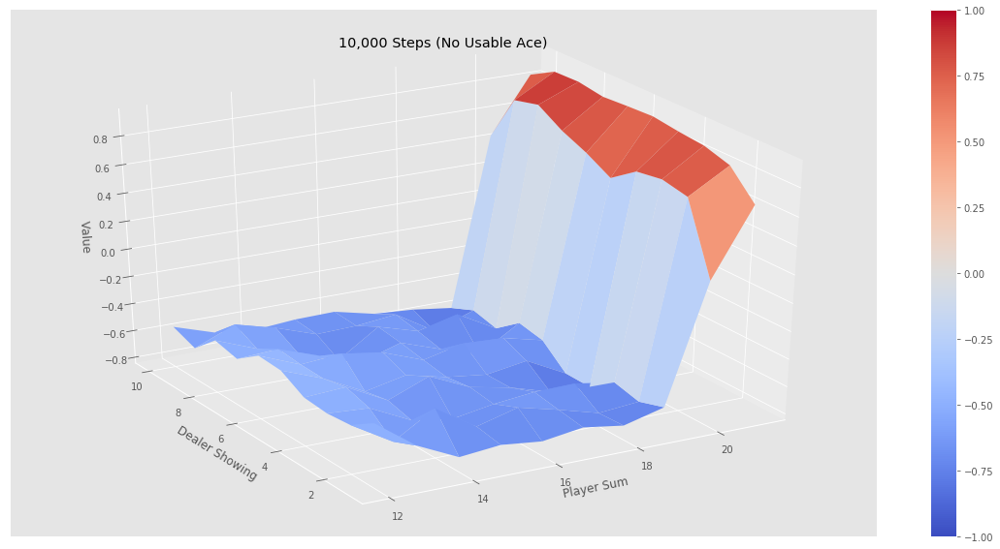

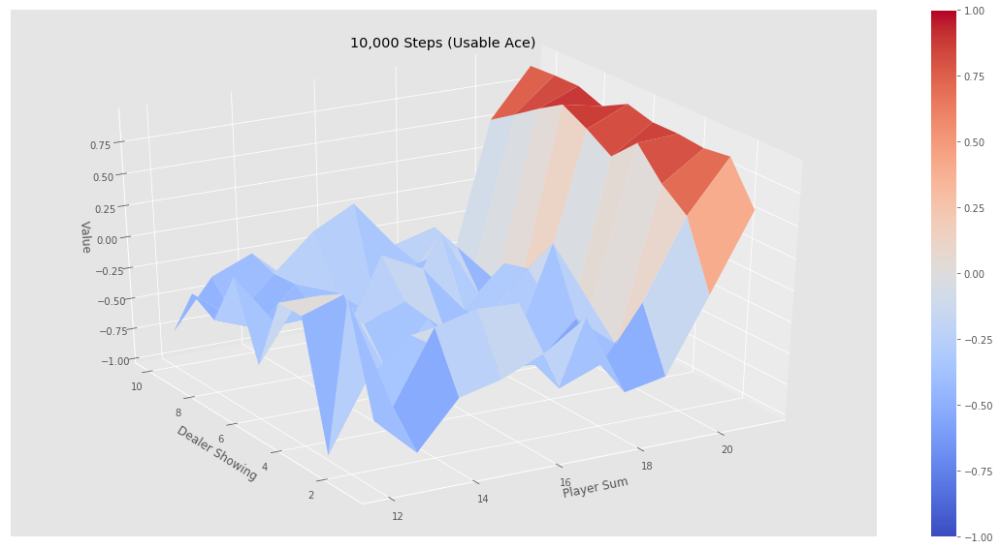

{(21, 8, False), (18, 8, False)}
{(21, 4, False), (14, 4, False)}
{(19, 10, False)}
{(13, 10, False)}
{(18, 6, False)}
{(12, 6, False), (16, 6, False)}
{(15, 6, False), (18, 6, False), (16, 6, True)}
{(13, 3, False)}
{(20, 1, False)}
{(12, 2, False)}
{(19, 10, False), (15, 10, False), (12, 10, False)}
{(19, 6, False)}
{(20, 9, False), (17, 9, False), (12, 9, False)}
{(12, 8, False)}
{(21, 3, True)}
{(16, 3, False), (21, 3, False)}
{(20, 10, True)}
{(20, 10, False)}
{(13, 10, False)}
{(12, 6, False), (21, 6, False), (17, 6, False)}
{(14, 1, False), (21, 1, False)}
{(19, 2, False), (12, 2, False)}
{(20, 10, False)}
{(17, 9, False), (19, 9, False), (13, 9, False)}
{(14, 10, False), (15, 10, True)}
{(19, 10, False), (18, 10, False)}
{(14, 6, False)}
{(20, 10, False)}
{(19, 1, False), (13, 1, False), (15, 1, False)}
{(18, 7, False)}
{(19, 10, False), (14, 10, False), (15, 10, False)}
{(20, 5, False)}
{(19, 6, False)}
{(13, 7, False)}
{(15, 8, False)}
{(14, 5, False), (17, 5, False)}
{(14, 1

{(17, 3, False), (15, 3, False), (16, 3, True)}
{(13, 6, False), (18, 6, True), (17, 6, True)}
{(16, 10, False), (17, 10, False)}
{(19, 2, False)}
{(19, 6, False), (17, 6, False)}
{(18, 10, True), (17, 10, True), (16, 10, True), (20, 10, False), (18, 10, False)}
{(20, 1, False)}
{(14, 6, False)}
{(17, 10, False)}
{(18, 3, False)}
{(21, 3, True)}
{(21, 10, False), (18, 10, False)}
{(21, 10, True)}
{(17, 10, False), (14, 10, False), (21, 10, False)}
{(19, 6, False)}
{(18, 4, False)}
{(20, 10, False)}
{(17, 6, False)}
{(20, 4, False)}
{(12, 7, False)}
{(21, 5, False), (15, 5, False), (15, 5, True), (19, 5, False)}
{(19, 2, False), (17, 2, True), (17, 2, False)}
{(13, 9, False)}
{(14, 10, False)}
{(18, 1, False)}
{(14, 8, False), (20, 8, False)}
{(20, 1, False)}
{(16, 10, True), (15, 10, True), (13, 10, False)}
{(16, 10, False)}
{(13, 4, False)}
{(20, 8, False)}
{(15, 9, False)}
{(14, 4, False)}
{(16, 3, False)}
{(20, 5, False), (19, 5, False)}
{(20, 8, False)}
{(19, 5, False), (13, 5, Fal

{(20, 7, False), (13, 7, False), (16, 7, False), (19, 7, False)}
{(19, 10, False)}
{(17, 10, False), (15, 10, False), (12, 10, False), (21, 10, False)}
{(16, 10, False), (18, 10, False)}
{(14, 10, False), (18, 10, False)}
{(21, 4, False), (12, 4, False), (14, 4, False)}
{(18, 5, False), (13, 5, False), (16, 5, False), (19, 5, False)}
{(17, 2, False)}
{(19, 9, False), (19, 9, True), (12, 9, True), (13, 9, True)}
{(17, 10, False), (18, 10, False)}
{(20, 1, False)}
{(17, 8, False), (14, 8, False), (14, 8, True)}
{(12, 1, False), (15, 1, False)}
{(17, 1, False), (12, 1, False)}
{(15, 1, False)}
{(20, 3, True)}
{(13, 6, False), (21, 6, False)}
{(15, 2, True), (15, 2, False), (13, 2, True), (18, 2, False)}
{(20, 10, False)}
{(20, 6, False), (16, 6, False)}
{(12, 10, False), (21, 10, False)}
{(16, 1, False), (20, 1, False)}
{(14, 3, False)}
{(18, 9, False)}
{(15, 10, False)}
{(14, 2, False)}
{(20, 1, False)}
{(16, 8, False), (21, 8, False)}
{(19, 7, False)}
{(21, 8, False), (12, 8, False)}
{(

{(13, 2, False)}
{(15, 10, False), (21, 10, False), (18, 10, False)}
{(21, 1, True)}
{(15, 10, False)}
{(20, 10, False)}
{(20, 3, False)}
{(19, 10, False)}
{(18, 7, True), (18, 7, False)}
{(19, 10, False), (21, 10, False)}
{(18, 10, False)}
{(20, 6, False)}
{(21, 8, True), (15, 8, True)}
{(14, 3, False)}
{(19, 2, False), (12, 2, False)}
{(13, 4, False), (16, 4, False)}
{(13, 5, False), (19, 5, False)}
{(16, 9, False)}
{(20, 5, False)}
{(15, 2, False), (20, 2, False)}
{(20, 3, False), (18, 3, False)}
{(18, 10, False)}
{(12, 10, False)}
{(12, 10, False), (21, 10, False), (18, 10, False)}
{(18, 10, False)}
{(19, 1, False)}
{(12, 2, False)}
{(14, 6, False)}
{(15, 10, False), (13, 10, False)}
{(17, 10, False)}
{(16, 2, False), (16, 2, True)}
{(13, 9, False)}
{(18, 6, False)}
{(16, 8, False)}
{(21, 4, True), (12, 4, True), (13, 4, True)}
{(20, 3, False)}
{(13, 10, False)}
{(20, 6, False), (17, 6, False)}
{(13, 10, False)}
{(15, 10, False)}
{(21, 4, False), (14, 4, False)}
{(16, 8, False), (1

{(15, 6, False), (19, 6, False)}
{(16, 3, False), (19, 3, True), (12, 3, False)}
{(21, 9, True)}
{(21, 1, True)}
{(14, 7, False)}
{(13, 6, False)}
{(17, 9, False), (16, 9, False)}
{(17, 9, False)}
{(12, 2, False)}
{(19, 10, False)}
{(19, 10, False)}
{(16, 10, False)}
{(17, 6, False)}
{(20, 5, False)}
{(20, 10, False)}
{(17, 10, False), (13, 10, False)}
{(13, 10, False)}
{(17, 10, False)}
{(20, 4, True)}
{(19, 10, False), (14, 10, False), (12, 10, False)}
{(14, 10, False)}
{(20, 8, False)}
{(12, 6, False), (21, 6, False), (18, 6, False)}
{(15, 9, False)}
{(20, 10, True)}
{(17, 1, False)}
{(18, 4, False)}
{(12, 3, False), (21, 3, False)}
{(20, 10, False)}
{(21, 4, False), (17, 4, False)}
{(13, 4, False), (18, 4, True), (19, 4, True)}
{(19, 10, False), (18, 10, False)}
{(20, 2, False)}
{(18, 7, False), (16, 7, False), (19, 7, True)}
{(13, 3, False)}
{(21, 2, False), (18, 2, False)}
{(21, 1, True)}
{(19, 10, False), (21, 10, False), (19, 10, True)}
{(20, 4, True)}
{(20, 5, False)}
{(20, 7,

{(21, 10, True), (13, 10, True)}
{(12, 4, False), (20, 4, False)}
{(16, 9, False), (12, 9, False)}
{(17, 10, True), (16, 10, False), (15, 10, False)}
{(18, 2, True), (15, 2, False), (13, 2, False)}
{(13, 5, False), (20, 5, False), (19, 5, False)}
{(18, 4, True), (20, 4, True)}
{(15, 7, False), (18, 7, False), (16, 7, False)}
{(16, 8, False)}
{(20, 4, True)}
{(12, 6, False), (17, 6, False)}
{(21, 4, True)}
{(20, 10, False)}
{(13, 8, False), (15, 8, False)}
{(16, 10, False)}
{(15, 4, False)}
{(14, 10, False)}
{(21, 4, False), (17, 4, False)}
{(17, 1, False), (18, 1, False), (15, 1, False)}
{(20, 5, False)}
{(15, 7, False)}
{(13, 6, False), (19, 6, False)}
{(14, 10, False), (21, 10, False)}
{(16, 3, False), (14, 3, False), (17, 3, False), (20, 3, False)}
{(19, 2, False), (16, 2, False), (20, 2, False)}
{(18, 1, True), (18, 1, False)}
{(15, 10, False), (18, 10, False)}
{(14, 10, False), (20, 10, False)}
{(14, 5, False)}
{(16, 1, False), (19, 1, False), (18, 1, False)}
{(16, 7, False)}
{(18

{(20, 9, False), (15, 9, False)}
{(12, 10, False)}
{(20, 2, False)}
{(14, 5, False)}
{(14, 10, False), (21, 10, False)}
{(14, 10, False), (12, 10, False)}
{(21, 4, True)}
{(14, 9, False), (16, 9, False)}
{(20, 10, False), (18, 10, False)}
{(13, 10, False)}
{(17, 10, False), (20, 10, False)}
{(21, 5, False), (14, 5, False)}
{(16, 4, False)}
{(15, 2, False)}
{(13, 3, False)}
{(13, 2, False), (18, 2, False)}
{(19, 10, False)}
{(14, 9, False)}
{(16, 2, False), (15, 2, False), (13, 2, False), (18, 2, False)}
{(19, 3, False), (18, 3, True), (18, 3, False)}
{(14, 1, False), (20, 1, False), (12, 1, False)}
{(18, 2, False)}
{(19, 4, False)}
{(20, 5, False)}
{(20, 8, False)}
{(20, 2, False)}
{(16, 4, False)}
{(20, 2, False)}
{(17, 1, False), (19, 1, False), (12, 1, False)}
{(20, 1, False)}
{(12, 10, False)}
{(14, 10, False)}
{(19, 10, False)}
{(16, 9, False)}
{(18, 10, False)}
{(16, 4, False)}
{(21, 8, True)}
{(15, 4, False), (16, 4, False)}
{(20, 3, True)}
{(14, 8, False)}
{(19, 9, True), (15, 

{(20, 9, False)}
{(21, 7, True)}
{(21, 2, False)}
{(21, 7, True)}
{(16, 10, False), (13, 10, False)}
{(14, 10, False), (13, 10, False)}
{(16, 2, False)}
{(17, 2, False)}
{(20, 9, False)}
{(17, 10, False), (14, 10, False)}
{(14, 9, False)}
{(20, 6, False)}
{(19, 9, False)}
{(17, 1, False), (20, 1, False)}
{(15, 7, False)}
{(14, 8, False)}
{(20, 10, False)}
{(19, 2, False), (17, 2, False)}
{(13, 5, False), (20, 5, False)}
{(20, 10, False)}
{(17, 9, False), (21, 9, False)}
{(18, 1, False)}
{(13, 7, True), (14, 7, True), (20, 7, True)}
{(20, 10, False), (13, 10, False), (18, 10, False)}
{(15, 10, False), (18, 10, False)}
{(14, 1, False), (18, 1, False)}
{(15, 10, False)}
{(20, 2, False)}
{(14, 10, False)}
{(14, 9, False)}
{(15, 2, False)}
{(14, 8, False)}
{(13, 7, False), (19, 7, False)}
{(16, 9, False)}
{(12, 6, False), (18, 6, False)}
{(17, 10, False), (20, 10, False)}
{(20, 3, False)}
{(20, 5, False), (15, 5, False)}
{(15, 7, False), (15, 7, True)}
{(15, 10, False), (18, 10, False)}
{(1

{(13, 7, False)}
{(16, 10, False), (15, 10, False)}
{(20, 3, False)}
{(16, 9, False)}
{(16, 8, False), (13, 8, False)}
{(20, 10, False)}
{(17, 10, False)}
{(16, 4, True), (18, 4, False), (12, 4, True), (19, 4, True), (13, 4, True)}
{(14, 10, False), (18, 10, False)}
{(21, 6, True)}
{(16, 2, False), (14, 2, False)}
{(20, 7, False), (17, 7, False)}
{(17, 9, False)}
{(20, 10, False)}
{(14, 5, False), (17, 5, False)}
{(21, 9, True)}
{(20, 10, True)}
{(13, 6, True), (18, 6, True), (17, 6, True), (21, 6, True)}
{(16, 10, False)}
{(21, 10, False)}
{(18, 2, False)}
{(19, 5, False)}
{(16, 8, False)}
{(15, 7, False)}
{(17, 8, False)}
{(13, 10, False)}
{(15, 9, False)}
{(20, 10, False), (12, 10, False)}
{(21, 8, False), (15, 8, False)}
{(19, 10, False), (15, 10, False)}
{(21, 10, False), (13, 10, False)}
{(18, 4, False), (15, 4, False), (20, 4, False), (19, 4, False)}
{(18, 10, True), (17, 10, True), (17, 10, False), (13, 10, True), (20, 10, False)}
{(21, 5, False), (12, 5, False)}
{(16, 6, False

{(19, 5, True), (13, 5, True), (19, 5, False), (18, 5, True)}
{(18, 6, False), (17, 6, False)}
{(18, 10, False)}
{(13, 8, False)}
{(16, 1, True), (16, 1, False)}
{(17, 2, False)}
{(15, 10, False)}
{(21, 10, False)}
{(18, 4, False)}
{(18, 10, True), (19, 10, False), (17, 10, False), (15, 10, True)}
{(18, 5, False), (20, 5, False)}
{(20, 4, False), (19, 4, False)}
{(21, 4, True)}
{(15, 6, False), (12, 6, False), (16, 6, False)}
{(17, 10, False), (15, 10, False)}
{(17, 10, False), (13, 10, False)}
{(21, 6, False)}
{(13, 4, False)}
{(17, 10, False), (13, 10, False)}
{(15, 4, False)}
{(17, 9, False)}
{(20, 10, False)}
{(13, 4, False), (12, 4, True), (14, 4, True)}
{(21, 4, True)}
{(21, 10, True)}
{(21, 3, True)}
{(15, 7, False)}
{(14, 10, False)}
{(17, 3, False), (18, 3, False)}
{(13, 10, False)}
{(20, 3, False)}
{(16, 10, False), (21, 10, False)}
{(19, 5, False)}
{(12, 7, False), (18, 7, True), (21, 7, False)}
{(17, 10, False)}
{(16, 6, False)}
{(19, 10, False), (13, 10, False)}
{(20, 5, F

{(17, 1, False), (13, 1, False), (15, 1, False)}
{(17, 1, False), (21, 1, False)}
{(14, 2, False)}
{(21, 4, True)}
{(17, 4, False), (19, 4, True), (13, 4, True)}
{(20, 10, False), (12, 10, False)}
{(12, 1, False)}
{(21, 4, True)}
{(18, 7, False)}
{(20, 10, True), (12, 10, True), (19, 10, True)}
{(14, 10, False), (21, 10, False)}
{(14, 6, False)}
{(15, 6, False), (12, 6, False), (17, 6, False)}
{(21, 10, True)}
{(19, 10, False), (17, 10, True), (17, 10, False)}
{(15, 1, False)}
{(21, 6, True)}
{(14, 3, False)}
{(17, 10, False), (15, 10, False), (13, 10, False)}
{(16, 10, False)}
{(18, 8, False)}
{(21, 4, False), (19, 4, False)}
{(21, 10, True)}
{(14, 6, True), (19, 6, False), (14, 6, False)}
{(15, 7, False), (18, 7, False)}
{(20, 1, False)}
{(18, 5, False)}
{(12, 2, False), (13, 2, False), (18, 2, False)}
{(20, 6, False), (19, 6, False)}
{(20, 2, False)}
{(18, 7, False)}
{(14, 10, False)}
{(16, 2, True), (15, 2, True), (21, 2, True)}
{(20, 10, False)}
{(20, 2, False)}
{(18, 10, True), (

{(21, 10, True)}
{(20, 3, False)}
{(18, 5, False), (15, 5, False)}
{(12, 10, False)}
{(13, 4, False)}
{(20, 10, False)}
{(14, 9, False), (20, 9, False)}
{(19, 10, False)}
{(17, 3, False)}
{(17, 10, False), (14, 10, False), (12, 10, False)}
{(14, 10, False), (14, 10, True)}
{(19, 5, False)}
{(16, 10, False), (13, 10, False), (18, 10, False)}
{(18, 2, False)}
{(15, 10, False), (20, 10, False)}
{(18, 2, True), (17, 2, False), (15, 2, True), (12, 2, False), (21, 2, False)}
{(15, 4, False)}
{(16, 1, False)}
{(12, 7, False), (19, 7, False)}
{(16, 8, False), (13, 8, True), (13, 8, False)}
{(21, 3, False)}
{(16, 9, False)}
{(17, 7, False)}
{(16, 5, False)}
{(13, 4, False), (18, 4, False)}
{(18, 10, False)}
{(15, 8, False)}
{(15, 4, False), (19, 4, False)}
{(13, 6, False)}
{(20, 9, True)}
{(21, 10, True)}
{(19, 10, False), (16, 10, False), (17, 10, False), (14, 10, False), (12, 10, False)}
{(19, 10, False), (12, 10, False)}
{(12, 7, False)}
{(21, 6, True)}
{(21, 4, False), (12, 4, False)}
{(17,

{(19, 3, False)}
{(13, 7, False)}
{(18, 3, False)}
{(19, 8, False)}
{(14, 8, False), (16, 8, False), (16, 8, True), (18, 8, True)}
{(15, 3, False), (16, 3, True)}
{(13, 4, False), (18, 4, False)}
{(21, 6, False), (19, 6, False), (14, 6, False)}
{(21, 6, False), (13, 6, False), (19, 6, False)}
{(15, 6, False), (13, 6, False), (18, 6, False)}
{(16, 2, False)}
{(16, 10, True), (12, 10, False), (21, 10, False)}
{(20, 6, False)}
{(14, 10, False), (21, 10, False), (18, 10, False)}
{(17, 10, False), (15, 10, False)}
{(18, 7, False), (21, 7, False), (14, 7, False)}
{(15, 1, False)}
{(20, 6, False)}
{(14, 5, False)}
{(14, 1, False)}
{(21, 6, False)}
{(16, 7, False)}
{(17, 10, False)}
{(21, 2, True)}
{(19, 2, False), (16, 2, False), (15, 2, False), (12, 2, False)}
{(21, 10, True)}
{(21, 3, True)}
{(15, 7, False), (21, 7, False)}
{(20, 3, False)}
{(19, 10, False), (14, 10, False)}
{(18, 7, False)}
{(16, 2, False)}
{(13, 2, False)}
{(17, 10, False)}
{(21, 5, True), (18, 5, True)}
{(20, 1, False)}


{(12, 6, False)}
{(18, 10, False)}
{(20, 10, True)}
{(12, 4, False)}
{(12, 3, False)}
{(19, 2, False), (13, 2, False)}
{(17, 10, False)}
{(20, 10, False)}
{(19, 3, False), (12, 3, False)}
{(19, 10, False), (18, 10, False)}
{(12, 10, False)}
{(19, 8, False), (13, 8, False), (21, 8, False)}
{(15, 1, False)}
{(20, 1, False)}
{(20, 6, False), (13, 6, False)}
{(18, 10, False)}
{(17, 3, False), (12, 3, False), (15, 3, False)}
{(16, 9, False), (13, 9, False)}
{(15, 4, True), (18, 4, True), (20, 4, False), (17, 4, False), (14, 4, True)}
{(18, 4, False), (15, 4, False)}
{(17, 10, False), (21, 10, False), (13, 10, False)}
{(13, 10, False)}
{(16, 10, False)}
{(12, 10, False), (21, 10, False)}
{(13, 8, False), (15, 8, True), (20, 8, False)}
{(19, 10, False), (14, 10, False)}
{(15, 10, False), (12, 10, False)}
{(17, 10, False)}
{(14, 10, False)}
{(18, 10, False)}
{(20, 3, True)}
{(16, 10, False), (18, 10, False)}
{(20, 5, False)}
{(13, 1, False), (15, 1, False)}
{(13, 10, False)}
{(14, 3, False)}
{

{(20, 2, False)}
{(13, 7, False), (17, 7, False)}
{(18, 1, False), (13, 1, False)}
{(12, 4, False)}
{(21, 10, True)}
{(16, 10, False)}
{(14, 3, False), (12, 3, False), (20, 3, False)}
{(19, 5, False)}
{(20, 4, False), (19, 4, False)}
{(13, 10, False)}
{(15, 7, False)}
{(17, 1, False), (13, 1, False)}
{(13, 10, False), (18, 10, False)}
{(19, 2, False)}
{(12, 1, True), (12, 1, False)}
{(15, 2, False), (21, 2, False)}
{(15, 7, False), (16, 7, False)}
{(14, 10, False), (14, 10, True)}
{(18, 1, False)}
{(18, 10, False)}
{(18, 10, False)}
{(20, 10, False)}
{(13, 10, False)}
{(21, 3, True)}
{(12, 10, False), (13, 10, False), (18, 10, False)}
{(18, 7, False)}
{(19, 3, False)}
{(19, 6, False)}
{(18, 5, False)}
{(21, 6, False), (18, 6, False), (17, 6, False)}
{(16, 2, False), (20, 2, False)}
{(20, 6, False)}
{(20, 6, True)}
{(18, 5, False)}
{(12, 10, False)}
{(13, 7, False), (21, 7, False)}
{(16, 10, False), (14, 10, False), (15, 10, False)}
{(20, 10, False)}
{(19, 10, False), (12, 10, False)}
{

{(14, 8, False)}
{(17, 10, False), (12, 10, False)}
{(21, 10, True)}
{(20, 1, False)}
{(20, 10, False)}
{(17, 8, False), (19, 8, False)}
{(21, 10, True)}
{(16, 9, False), (19, 9, False)}
{(20, 6, False)}
{(13, 2, False)}
{(13, 10, False)}
{(15, 10, False)}
{(17, 10, False)}
{(16, 10, False)}
{(21, 4, False)}
{(18, 1, False), (13, 1, False)}
{(18, 10, True), (16, 10, True), (14, 10, False), (12, 10, False)}
{(12, 10, False)}
{(17, 3, False)}
{(21, 10, True)}
{(17, 1, False)}
{(15, 4, False)}
{(13, 5, False), (17, 5, False)}
{(15, 3, False)}
{(12, 6, False), (19, 6, False)}
{(17, 10, False), (20, 10, False)}
{(18, 8, False), (12, 8, False)}
{(16, 10, False), (21, 10, False)}
{(16, 6, False)}
{(16, 4, False)}
{(18, 10, False)}
{(16, 8, False)}
{(16, 6, False)}
{(13, 4, False)}
{(20, 10, False)}
{(17, 7, False)}
{(12, 10, False), (18, 10, False)}
{(17, 10, False), (20, 10, False)}
{(17, 4, False)}
{(16, 10, False), (20, 10, False), (13, 10, False)}
{(17, 6, False)}
{(14, 8, False), (16, 8,

{(20, 5, False), (16, 5, False), (19, 5, False)}
{(19, 10, False), (13, 10, False)}
{(15, 10, False)}
{(13, 4, False), (17, 4, False), (19, 4, False)}
{(17, 2, False), (14, 2, False), (12, 2, False)}
{(21, 5, False), (14, 5, False)}
{(16, 4, True), (21, 4, True)}
{(20, 4, False)}
{(21, 7, True)}
{(16, 3, False), (18, 3, False)}
{(20, 3, False)}
{(12, 4, False), (17, 4, False)}
{(14, 8, False)}
{(17, 7, False)}
{(19, 6, False), (17, 6, False)}
{(19, 1, False), (20, 1, False)}
{(14, 10, False)}
{(17, 1, False), (21, 1, False)}
{(19, 1, False), (18, 1, False), (13, 1, False)}
{(16, 10, False)}
{(15, 10, False)}
{(12, 7, False), (21, 7, False)}
{(21, 3, True)}
{(13, 1, False)}
{(19, 1, False), (21, 1, False)}
{(20, 3, True)}
{(15, 10, False), (21, 10, False)}
{(14, 3, True), (14, 3, False), (20, 3, False)}
{(20, 1, False)}
{(21, 3, True)}
{(18, 10, True), (14, 10, False), (18, 10, False)}
{(19, 4, False)}
{(17, 10, False)}
{(20, 10, False)}
{(20, 4, False)}
{(14, 3, True), (17, 3, False), 

{(12, 7, False), (15, 7, False)}
{(15, 10, False), (20, 10, False)}
{(14, 10, False), (14, 10, True)}
{(14, 8, False)}
{(20, 9, True)}
{(16, 3, False)}
{(14, 8, True), (21, 8, True), (16, 8, True)}
{(20, 4, False)}
{(16, 10, False), (21, 10, False)}
{(18, 9, False), (13, 9, False), (12, 9, False), (14, 9, True)}
{(16, 8, False), (13, 8, False)}
{(12, 6, False), (19, 6, False), (16, 6, False)}
{(20, 10, False)}
{(21, 9, False)}
{(21, 10, True)}
{(18, 8, False), (15, 8, False)}
{(18, 5, False), (13, 5, False), (14, 5, False)}
{(12, 10, False)}
{(19, 1, False), (18, 1, False)}
{(16, 9, False)}
{(21, 6, True)}
{(13, 3, False)}
{(16, 10, False), (15, 10, False), (12, 10, False)}
{(20, 5, False), (16, 5, False), (19, 5, False)}
{(16, 2, False), (17, 2, False)}
{(21, 10, True)}
{(20, 8, False)}
{(14, 6, True), (21, 6, False), (19, 6, True), (19, 6, False)}
{(19, 10, False), (14, 10, False), (12, 10, False), (21, 10, False)}
{(13, 5, False), (19, 5, False)}
{(14, 8, False)}
{(12, 10, False), (

{(18, 9, False)}
{(20, 10, False)}
{(16, 10, False)}
{(14, 10, False)}
{(12, 10, False)}
{(20, 8, False)}
{(19, 10, False)}
{(20, 6, False)}
{(21, 10, False)}
{(19, 8, False), (20, 8, False)}
{(15, 3, False)}
{(21, 6, False), (18, 6, False)}
{(18, 7, False)}
{(21, 8, True)}
{(20, 3, False)}
{(20, 10, False)}
{(16, 2, False), (17, 2, False)}
{(13, 5, False), (20, 5, False)}
{(20, 4, False), (14, 4, False)}
{(13, 1, False)}
{(16, 9, False)}
{(19, 3, True), (18, 3, False)}
{(17, 8, False)}
{(15, 10, False), (12, 10, False)}
{(17, 10, False), (16, 10, False), (16, 10, True)}
{(14, 3, False), (18, 3, True), (15, 3, True), (13, 3, False)}
{(21, 2, True)}
{(21, 5, False), (15, 5, False), (17, 5, False)}
{(19, 8, False)}
{(20, 5, False)}
{(14, 3, False), (12, 3, True), (20, 3, False), (18, 3, True), (18, 3, False)}
{(16, 10, False), (20, 10, False)}
{(20, 10, False), (16, 10, True), (15, 10, False), (13, 10, True)}
{(16, 1, False)}
{(18, 8, False)}
{(21, 5, False), (19, 5, False)}
{(16, 2, Fal

{(18, 1, False), (19, 1, True), (13, 1, True)}
{(13, 1, False)}
{(16, 7, False)}
{(17, 1, False), (18, 1, True), (18, 1, False), (15, 1, False)}
{(20, 3, True)}
{(17, 10, False), (14, 10, False), (12, 10, False), (18, 10, False)}
{(19, 9, False)}
{(20, 1, False)}
{(20, 9, False)}
{(16, 10, False)}
{(15, 6, False)}
{(19, 10, False), (15, 10, False)}
{(12, 7, False), (17, 7, False)}
{(20, 10, False)}
{(15, 7, False), (13, 7, False), (17, 7, False)}
{(15, 5, False)}
{(17, 2, False), (19, 2, True)}
{(14, 10, True), (21, 10, True)}
{(12, 4, False), (17, 4, False)}
{(13, 4, False), (17, 4, False), (13, 4, True)}
{(21, 5, False)}
{(13, 10, False)}
{(18, 1, False), (21, 1, False)}
{(20, 1, False)}
{(20, 2, False)}
{(17, 3, False), (20, 3, False)}
{(17, 5, False)}
{(20, 3, False)}
{(16, 2, False), (16, 2, True), (21, 2, False)}
{(17, 3, True), (15, 3, False)}
{(16, 8, False), (12, 8, False)}
{(20, 6, False)}
{(18, 4, False)}
{(20, 7, False)}
{(13, 1, False)}
{(15, 2, True), (15, 2, False)}
{(15

{(20, 7, False)}
{(20, 3, False)}
{(15, 10, False), (20, 10, False)}
{(20, 2, True), (12, 2, True)}
{(17, 10, False)}
{(20, 7, False)}
{(17, 2, False), (13, 2, False)}
{(15, 6, False)}
{(17, 10, False), (13, 10, False)}
{(15, 10, False)}
{(21, 6, False), (19, 6, False)}
{(17, 8, False)}
{(18, 7, False), (13, 7, False)}
{(16, 10, False), (21, 10, False)}
{(20, 10, True), (19, 10, True)}
{(20, 6, False), (18, 6, False), (16, 6, False)}
{(19, 7, False)}
{(12, 7, False), (18, 7, False), (19, 7, False), (17, 7, False)}
{(21, 3, True)}
{(21, 10, False), (13, 10, False)}
{(14, 4, False)}
{(14, 3, False)}
{(13, 5, False), (19, 5, False)}
{(17, 9, False), (15, 9, False)}
{(12, 10, False)}
{(19, 5, True), (17, 5, True), (19, 5, False)}
{(16, 10, False)}
{(17, 8, False)}
{(15, 8, False)}
{(13, 6, False), (21, 6, False), (16, 6, False)}
{(15, 10, False), (18, 10, False)}
{(17, 2, False)}
{(14, 8, False), (15, 8, False)}
{(20, 1, True)}
{(20, 9, False)}
{(15, 1, False)}
{(21, 8, True), (15, 8, True

{(17, 3, False)}
{(14, 6, False), (18, 6, False), (16, 6, False), (20, 6, False), (15, 6, True)}
{(19, 8, False), (16, 8, False), (21, 8, False)}
{(21, 2, True)}
{(21, 1, True)}
{(20, 4, False)}
{(17, 3, False)}
{(12, 8, False)}
{(15, 6, False)}
{(17, 1, False)}
{(19, 4, False), (16, 4, False)}
{(21, 10, False)}
{(14, 9, False), (14, 9, True)}
{(15, 10, False)}
{(17, 10, False), (16, 10, True), (14, 10, False), (18, 10, False)}
{(20, 10, False)}
{(18, 8, False)}
{(16, 3, False), (17, 3, False), (13, 3, False)}
{(18, 2, False)}
{(17, 10, False), (13, 10, False)}
{(17, 10, False), (15, 10, False)}
{(19, 9, False), (13, 9, False)}
{(15, 10, False), (20, 10, False)}
{(16, 1, True), (18, 1, True), (13, 1, False)}
{(13, 2, False)}
{(14, 3, False), (21, 3, False)}
{(20, 4, False), (14, 4, False)}
{(18, 6, False), (14, 6, False)}
{(18, 10, False)}
{(16, 8, False)}
{(19, 8, False)}
{(18, 10, True), (18, 10, False)}
{(19, 10, False), (16, 10, False), (18, 10, False)}
{(12, 7, False), (20, 7, Fal

{(21, 10, True)}
{(16, 10, False)}
{(20, 6, False)}
{(14, 2, False), (15, 2, False), (18, 2, False)}
{(21, 8, False)}
{(17, 2, False)}
{(20, 10, False)}
{(16, 2, False), (15, 2, False)}
{(13, 8, False), (18, 8, False)}
{(15, 4, False), (12, 4, False), (16, 4, False)}
{(18, 10, False)}
{(17, 6, False)}
{(21, 10, True)}
{(13, 7, False), (19, 7, False)}
{(17, 6, True), (17, 6, False)}
{(21, 3, True)}
{(19, 10, False)}
{(21, 10, True)}
{(16, 3, False), (14, 3, True), (14, 3, False)}
{(19, 10, False), (14, 10, False)}
{(17, 10, False)}
{(19, 10, False)}
{(21, 10, False)}
{(20, 10, True)}
{(19, 10, False)}
{(14, 3, True), (14, 3, False), (18, 3, False)}
{(20, 6, False)}
{(14, 10, False), (18, 10, False)}
{(21, 10, True)}
{(20, 7, True)}
{(15, 3, False), (21, 3, False)}
{(14, 3, False), (17, 3, False)}
{(14, 3, False)}
{(12, 7, False)}
{(20, 4, False)}
{(20, 10, False), (13, 10, False)}
{(16, 10, False), (17, 10, False), (14, 10, False), (21, 10, False)}
{(18, 10, False)}
{(20, 10, False)}
{(

{(21, 3, False), (12, 3, False), (13, 3, False)}
{(19, 9, False)}
{(17, 9, False)}
{(12, 5, False), (16, 5, True)}
{(14, 10, False), (20, 10, False)}
{(20, 10, False), (14, 10, False), (12, 10, False)}
{(14, 8, False), (19, 8, False), (20, 8, False)}
{(14, 3, False), (13, 3, False)}
{(18, 10, False)}
{(13, 6, False), (18, 6, False)}
{(15, 7, False)}
{(13, 8, False)}
{(20, 2, False)}
{(18, 6, False)}
{(19, 10, False), (15, 10, True), (15, 10, False)}
{(21, 5, False), (16, 5, False)}
{(21, 10, True)}
{(16, 10, False)}
{(20, 2, False)}
{(21, 8, False), (18, 8, False)}
{(19, 8, False)}
{(20, 5, False)}
{(16, 9, False), (13, 9, False), (21, 9, False)}
{(20, 10, False)}
{(17, 3, False)}
{(20, 4, False), (19, 4, True), (19, 4, False)}
{(13, 10, True), (13, 10, False)}
{(17, 7, False)}
{(15, 6, False)}
{(12, 7, False), (19, 7, False)}
{(14, 6, False)}
{(21, 4, True)}
{(13, 2, False)}
{(12, 7, False), (17, 7, False)}
{(20, 6, False)}
{(14, 9, False)}
{(14, 6, False)}
{(16, 9, False), (12, 9, Fa

{(20, 6, False)}
{(17, 10, True), (21, 10, True)}
{(21, 2, True)}
{(20, 1, False)}
{(21, 8, True)}
{(14, 6, False)}
{(18, 5, False), (14, 5, False)}
{(13, 3, False)}
{(14, 10, False), (21, 10, False)}
{(17, 8, False), (20, 8, False)}
{(16, 3, False)}
{(16, 10, False), (16, 10, True), (21, 10, False), (18, 10, False)}
{(13, 1, False), (15, 1, False)}
{(20, 2, False)}
{(17, 5, False)}
{(14, 10, False)}
{(14, 6, False)}
{(13, 1, False)}
{(15, 2, False)}
{(21, 1, False), (12, 1, False)}
{(20, 7, False)}
{(17, 1, False), (13, 1, False), (12, 1, False)}
{(14, 1, False)}
{(21, 1, False), (15, 1, False)}
{(20, 10, False)}
{(16, 10, False)}
{(18, 10, True), (17, 10, True), (17, 10, False)}
{(20, 10, False)}
{(19, 10, False)}
{(20, 6, True)}
{(20, 10, False)}
{(20, 10, False)}
{(13, 8, False)}
{(14, 7, False)}
{(18, 9, True), (21, 9, True)}
{(20, 10, False)}
{(21, 5, True)}
{(21, 10, True)}
{(19, 9, False)}
{(12, 10, False)}
{(21, 10, False), (18, 10, False)}
{(20, 9, False)}
{(16, 9, False), (1

{(18, 7, True), (18, 7, False)}
{(15, 2, False)}
{(17, 10, False)}
{(19, 1, False), (15, 1, False)}
{(14, 8, False), (14, 8, True)}
{(16, 2, False), (15, 2, False), (13, 2, False)}
{(12, 10, False)}
{(20, 2, False)}
{(21, 10, True)}
{(16, 10, False), (18, 10, False)}
{(20, 10, False)}
{(16, 10, False), (12, 10, False)}
{(17, 10, False)}
{(14, 3, False)}
{(16, 8, False), (20, 8, False)}
{(17, 10, False)}
{(18, 6, False), (19, 6, False)}
{(20, 7, False), (13, 7, False)}
{(16, 10, False), (15, 10, False), (20, 10, False)}
{(20, 7, False)}
{(13, 10, False)}
{(16, 4, True), (17, 4, False), (16, 4, False)}
{(15, 6, False)}
{(15, 10, False), (18, 10, False)}
{(12, 10, False)}
{(12, 5, False)}
{(19, 3, False), (12, 3, False), (15, 3, False)}
{(17, 10, False)}
{(15, 10, False), (21, 10, False)}
{(17, 9, False), (12, 9, False)}
{(19, 6, False)}
{(16, 9, False), (13, 9, False), (12, 9, False)}
{(20, 7, False)}
{(17, 10, True), (14, 10, False)}
{(20, 2, True)}
{(20, 6, False), (17, 6, False)}
{(20

{(20, 10, False)}
{(21, 10, True)}
{(14, 3, False)}
{(16, 10, False), (12, 10, False), (21, 10, False), (18, 10, False)}
{(18, 10, False)}
{(19, 5, False)}
{(21, 10, True)}
{(21, 9, False), (15, 9, False)}
{(19, 10, False)}
{(13, 8, False)}
{(20, 8, False), (12, 8, False)}
{(19, 3, False), (14, 3, False)}
{(20, 7, False), (17, 7, False)}
{(19, 9, False)}
{(17, 10, False), (18, 10, False)}
{(14, 10, False), (15, 10, True), (12, 10, False), (13, 10, False)}
{(12, 2, False), (21, 2, False)}
{(18, 4, False)}
{(14, 10, False), (13, 10, False)}
{(12, 6, False), (18, 6, False), (16, 6, False)}
{(14, 2, False), (20, 2, False)}
{(13, 4, False), (17, 4, False)}
{(16, 4, False)}
{(21, 10, True)}
{(18, 10, False)}
{(14, 10, False)}
{(15, 10, False)}
{(18, 10, True), (16, 10, False)}
{(20, 1, False)}
{(16, 10, False), (12, 10, False)}
{(18, 10, False)}
{(17, 10, True), (17, 10, False), (15, 10, True)}
{(20, 5, False)}
{(14, 5, False)}
{(14, 10, False), (15, 10, False), (18, 10, False)}
{(19, 7, Fal

{(19, 10, False)}
{(15, 10, False)}
{(18, 1, False)}
{(15, 8, False), (20, 8, False)}
{(17, 9, False), (17, 9, True), (16, 9, False)}
{(19, 8, True), (21, 8, True), (15, 8, True)}
{(12, 5, False), (17, 5, False), (20, 5, False)}
{(12, 9, False)}
{(17, 2, False), (15, 2, False), (20, 2, False), (13, 2, False)}
{(12, 9, False)}
{(16, 10, False), (14, 10, False), (13, 10, False)}
{(14, 10, False), (15, 10, False)}
{(18, 10, False)}
{(15, 9, True), (21, 9, False), (12, 9, False)}
{(18, 9, False), (20, 9, False)}
{(19, 4, False)}
{(14, 1, False), (16, 1, True)}
{(12, 4, False)}
{(13, 8, False)}
{(14, 3, False)}
{(19, 2, False), (12, 2, False), (12, 2, True)}
{(18, 9, True), (18, 9, False), (13, 9, True)}
{(15, 4, False), (12, 4, False)}
{(12, 2, False), (20, 2, False)}
{(21, 1, True)}
{(13, 2, False)}
{(21, 6, False)}
{(17, 8, False), (18, 8, False)}
{(14, 10, False), (18, 10, False)}
{(13, 5, True), (12, 5, False), (19, 5, False)}
{(12, 5, False), (19, 5, False)}
{(13, 4, False)}
{(18, 7, 

{(17, 7, False)}
{(13, 9, False)}
{(20, 6, False), (19, 6, False)}
{(21, 4, False), (14, 4, False)}
{(21, 5, False), (14, 5, False)}
{(20, 10, False)}
{(17, 10, False)}
{(18, 1, False), (12, 1, False)}
{(13, 7, False), (21, 7, False)}
{(17, 8, False)}
{(12, 5, False)}
{(14, 9, False), (16, 9, False)}
{(19, 4, False)}
{(12, 4, False)}
{(17, 10, False)}
{(20, 10, False)}
{(13, 4, False)}
{(14, 5, False)}
{(14, 10, False)}
{(13, 6, False)}
{(12, 5, True), (20, 5, True), (16, 5, True), (18, 5, True)}
{(16, 10, True), (14, 10, False), (15, 10, False)}
{(14, 4, False)}
{(18, 2, False)}
{(18, 4, False)}
{(16, 4, True), (17, 4, True), (17, 4, False)}
{(12, 9, False)}
{(12, 10, False)}
{(20, 1, False)}
{(13, 2, False)}
{(16, 10, False), (20, 10, False)}
{(16, 4, False)}
{(15, 10, False), (12, 10, False)}
{(17, 10, False)}
{(20, 10, True)}
{(18, 2, True), (16, 2, True), (19, 2, False), (18, 2, False)}
{(20, 10, False)}
{(13, 2, False)}
{(16, 10, False), (21, 10, False), (18, 10, False)}
{(16, 4,

{(19, 6, False)}
{(20, 7, False), (13, 7, False)}
{(16, 2, False)}
{(21, 7, True)}
{(19, 1, False), (21, 1, False), (12, 1, False)}
{(17, 10, False), (14, 10, False)}
{(20, 9, False), (13, 9, False), (12, 9, False)}
{(16, 3, False), (14, 3, False), (20, 3, False)}
{(13, 8, False)}
{(19, 7, False)}
{(18, 8, False)}
{(14, 10, False)}
{(13, 5, False), (19, 5, False)}
{(20, 1, False)}
{(19, 9, False)}
{(13, 6, False), (19, 6, False), (17, 6, False)}
{(20, 6, False)}
{(15, 2, False), (12, 2, False)}
{(19, 2, False), (17, 2, False)}
{(17, 10, False), (15, 10, False)}
{(19, 3, False)}
{(16, 10, False)}
{(13, 4, False), (20, 4, False), (19, 4, False)}
{(16, 10, False)}
{(20, 2, False)}
{(13, 2, False)}
{(19, 5, False)}
{(21, 10, False)}
{(19, 5, False), (12, 5, False), (15, 5, True), (18, 5, True)}
{(15, 10, False), (18, 10, False)}
{(20, 10, False)}
{(17, 1, False)}
{(17, 6, False)}
{(19, 8, False), (16, 8, False), (12, 8, False)}
{(12, 7, False), (21, 7, False)}
{(19, 10, False)}
{(18, 10, F

{(14, 9, False)}
{(16, 10, True), (15, 10, False)}
{(12, 9, False)}
{(15, 2, False)}
{(19, 9, False), (12, 9, False)}
{(16, 10, False), (17, 10, False), (20, 10, False)}
{(15, 10, False), (18, 10, False)}
{(15, 6, False)}
{(20, 2, False)}
{(13, 10, True), (13, 10, False)}
{(14, 6, False)}
{(20, 1, False), (15, 1, False)}
{(20, 7, False)}
{(20, 10, True)}
{(17, 3, False), (15, 3, False)}
{(14, 1, False), (20, 1, False)}
{(15, 8, False), (20, 8, False)}
{(18, 10, False)}
{(19, 10, False)}
{(21, 10, False)}
{(17, 10, False)}
{(13, 6, False)}
{(17, 1, False)}
{(14, 2, False)}
{(14, 5, False)}
{(20, 10, False)}
{(15, 2, False), (12, 2, False)}
{(13, 4, False), (15, 4, False)}
{(19, 10, False), (16, 10, False)}
{(14, 3, False)}
{(16, 10, False)}
{(18, 9, False), (12, 9, False)}
{(17, 10, False), (18, 10, False)}
{(13, 7, False)}
{(17, 10, False)}
{(20, 6, False)}
{(18, 9, False), (12, 9, False)}
{(17, 1, False)}
{(14, 1, False), (15, 1, False)}
{(12, 7, False), (18, 7, False)}
{(20, 10, Fals

{(16, 1, False)}
{(20, 10, False)}
{(13, 7, False)}
{(16, 3, False)}
{(19, 6, False)}
{(21, 6, True)}
{(20, 3, False)}
{(18, 10, False)}
{(12, 10, False)}
{(21, 10, True)}
{(18, 5, False)}
{(19, 7, False)}
{(17, 9, False)}
{(12, 2, False), (18, 2, False)}
{(14, 1, False), (20, 1, False), (12, 1, False)}
{(15, 8, False)}
{(14, 2, False)}
{(18, 4, False)}
{(19, 8, False), (20, 8, False)}
{(13, 9, False)}
{(17, 10, False)}
{(20, 6, False)}
{(12, 6, False)}
{(18, 1, False)}
{(18, 5, False), (15, 5, False), (17, 5, False)}
{(19, 8, False), (13, 8, False)}
{(16, 10, False), (17, 10, False), (20, 10, False), (18, 10, False)}
{(19, 10, False)}
{(14, 3, False), (17, 3, False), (15, 3, False), (13, 3, False)}
{(21, 4, False), (14, 4, False)}
{(20, 10, False)}
{(19, 10, False), (16, 10, False), (15, 10, False)}
{(17, 2, False), (20, 2, False), (18, 2, False)}
{(17, 1, True), (15, 1, False)}
{(20, 4, False)}
{(21, 4, False)}
{(19, 9, False)}
{(16, 8, False)}
{(20, 10, False)}
{(16, 10, False), (13

{(19, 3, False), (14, 3, False), (12, 3, False), (13, 3, False)}
{(12, 1, False)}
{(20, 10, True)}
{(17, 9, False)}
{(18, 6, False)}
{(21, 3, True), (15, 3, True)}
{(15, 10, True), (20, 10, True)}
{(20, 10, False)}
{(18, 5, False), (20, 5, False)}
{(19, 8, False), (16, 8, False), (20, 8, False)}
{(12, 6, False)}
{(17, 2, False)}
{(15, 1, False)}
{(12, 6, False)}
{(17, 9, False), (19, 9, False)}
{(19, 7, False), (14, 7, False)}
{(18, 10, False)}
{(18, 4, False)}
{(21, 1, True)}
{(21, 8, True)}
{(15, 6, False)}
{(16, 9, False), (19, 9, False), (21, 9, False)}
{(21, 10, True)}
{(17, 8, False)}
{(14, 3, False), (15, 3, True)}
{(15, 8, False), (12, 8, False)}
{(16, 6, False), (14, 6, False)}
{(19, 1, True), (21, 1, False), (12, 1, False)}
{(12, 8, False)}
{(21, 3, True)}
{(21, 1, True)}
{(21, 10, True)}
{(19, 10, False), (12, 10, True), (19, 10, True)}
{(18, 8, False)}
{(17, 3, False), (15, 3, False), (18, 3, False)}
{(18, 7, False)}
{(20, 1, False)}
{(16, 10, False)}
{(13, 2, False)}
{(21,

{(21, 5, False), (14, 5, True), (15, 5, False), (17, 5, True)}
{(20, 2, False)}
{(14, 8, False), (12, 8, False)}
{(17, 1, False)}
{(20, 6, False), (19, 6, False)}
{(20, 10, False)}
{(16, 4, False)}
{(15, 9, True), (17, 9, False), (15, 9, False)}
{(21, 4, False), (19, 4, False)}
{(20, 10, False)}
{(15, 5, False)}
{(18, 10, False)}
{(17, 6, False)}
{(21, 8, False)}
{(21, 2, True)}
{(15, 1, False)}
{(13, 8, False), (18, 8, False)}
{(15, 5, False)}
{(16, 4, False)}
{(20, 3, False), (15, 3, False), (15, 3, True)}
{(15, 10, True), (14, 10, True), (21, 10, True)}
{(13, 10, False)}
{(15, 6, False)}
{(19, 1, False)}
{(20, 4, False)}
{(20, 8, False)}
{(14, 9, False), (16, 9, False), (20, 9, False)}
{(15, 7, False), (13, 7, False), (13, 7, True), (21, 7, False)}
{(19, 3, False)}
{(16, 7, False)}
{(16, 2, True), (13, 2, False)}
{(13, 7, False)}
{(16, 6, False)}
{(14, 10, False), (12, 10, False)}
{(19, 3, False)}
{(12, 3, False)}
{(16, 6, False)}
{(21, 9, True)}
{(14, 2, False), (18, 2, False)}
{(1

{(21, 7, True)}
{(17, 6, False)}
{(20, 8, False)}
{(20, 2, True)}
{(12, 2, False), (21, 2, False)}
{(14, 10, True), (20, 10, True)}
{(12, 7, False), (17, 7, False)}
{(15, 10, False)}
{(18, 9, False)}
{(18, 7, False), (16, 7, False)}
{(19, 4, False)}
{(16, 10, False)}
{(19, 3, False), (15, 3, False)}
{(20, 10, False)}
{(21, 1, True)}
{(17, 2, False)}
{(12, 2, False)}
{(21, 4, False)}
{(21, 8, True)}
{(21, 1, False), (15, 1, False)}
{(15, 7, False), (21, 7, False), (17, 7, False)}
{(18, 6, False)}
{(14, 9, False), (15, 9, False)}
{(21, 4, False), (19, 4, False)}
{(17, 8, False)}
{(13, 5, False), (20, 5, False)}
{(20, 1, True)}
{(21, 7, False), (17, 7, False)}
{(20, 4, False)}
{(19, 8, False), (13, 8, False), (15, 8, False)}
{(21, 10, False), (13, 10, False)}
{(20, 6, True)}
{(18, 4, True), (19, 4, True), (21, 4, True)}
{(13, 3, True), (21, 3, True)}
{(21, 8, True)}
{(20, 5, False)}
{(16, 10, False), (18, 10, False)}
{(20, 3, True)}
{(15, 1, False), (19, 1, True), (14, 1, True)}
{(21, 4, 

{(16, 9, False)}
{(21, 3, False)}
{(12, 4, False), (16, 4, False)}
{(17, 7, False)}
{(18, 7, False)}
{(21, 10, False), (15, 10, False), (12, 10, False), (12, 10, True)}
{(15, 2, False), (20, 2, False)}
{(21, 7, True)}
{(16, 10, False)}
{(19, 1, False)}
{(14, 3, False)}
{(19, 6, False)}
{(16, 8, False)}
{(14, 6, False)}
{(16, 10, False)}
{(15, 5, False)}
{(19, 10, False)}
{(14, 2, False), (21, 2, False)}
{(20, 4, False)}
{(18, 1, False), (21, 1, False)}
{(21, 10, True), (12, 10, True)}
{(20, 2, False)}
{(21, 3, False)}
{(15, 10, False), (20, 10, False)}
{(12, 8, False)}
{(17, 10, False), (21, 10, False)}
{(20, 7, False)}
{(18, 7, False)}
{(14, 9, False)}
{(16, 5, False)}
{(18, 10, False)}
{(20, 4, False)}
{(19, 2, False)}
{(17, 8, False)}
{(15, 6, False)}
{(12, 10, False), (18, 10, False)}
{(15, 10, False), (12, 10, False)}
{(12, 6, False)}
{(21, 6, True)}
{(13, 10, True), (20, 10, True)}
{(20, 4, False)}
{(14, 10, False), (21, 10, False)}
{(15, 9, False)}
{(19, 8, False)}
{(15, 6, Fals

{(15, 10, False)}
{(14, 9, False), (19, 9, False), (21, 9, False), (15, 9, False)}
{(20, 10, False)}
{(18, 4, False), (19, 4, False)}
{(15, 2, False)}
{(20, 10, False)}
{(14, 1, False), (19, 1, False), (15, 1, False)}
{(12, 10, False), (21, 10, False)}
{(17, 10, False)}
{(21, 8, False), (12, 8, False)}
{(18, 1, False), (12, 1, False)}
{(17, 10, False), (18, 10, False)}
{(20, 9, False)}
{(16, 3, False)}
{(13, 6, False)}
{(12, 10, False)}
{(20, 5, False)}
{(13, 2, True), (13, 2, False)}
{(20, 10, False)}
{(14, 10, False)}
{(12, 8, False)}
{(18, 2, True), (17, 2, False)}
{(21, 7, True)}
{(20, 4, False)}
{(14, 8, False), (16, 8, False)}
{(15, 7, False), (18, 7, False), (19, 7, False)}
{(16, 3, False)}
{(21, 10, True), (13, 10, True)}
{(15, 10, False), (12, 10, False)}
{(21, 1, True)}
{(20, 6, False)}
{(13, 5, False), (20, 5, False)}
{(21, 7, False)}
{(13, 6, False), (19, 6, False), (17, 6, False)}
{(20, 2, False)}
{(17, 10, False)}
{(12, 10, False), (19, 10, True)}
{(20, 8, False), (16, 8,

{(20, 10, False)}
{(15, 10, False), (12, 10, False)}
{(16, 10, False), (13, 10, False)}
{(17, 4, False)}
{(15, 10, False), (13, 10, False)}
{(16, 10, False), (18, 10, False)}
{(17, 10, False), (15, 10, False)}
{(18, 5, False), (16, 5, False)}
{(21, 10, False), (13, 10, False)}
{(14, 10, False)}
{(13, 2, False)}
{(19, 2, False)}
{(20, 10, False)}
{(20, 4, False), (14, 4, False)}
{(20, 5, False)}
{(15, 4, True), (15, 4, False), (17, 4, False)}
{(14, 10, False)}
{(18, 8, False), (15, 8, False), (20, 8, False)}
{(20, 4, False)}
{(12, 1, False), (15, 1, False)}
{(17, 10, False)}
{(21, 7, True)}
{(18, 10, False)}
{(18, 7, False), (21, 7, False)}
{(14, 8, False), (21, 8, False)}
{(17, 10, False)}
{(15, 10, False)}
{(18, 10, False)}
{(21, 8, True)}
{(21, 4, False)}
{(12, 10, False)}
{(20, 9, False)}
{(20, 10, False)}
{(20, 7, False)}
{(20, 4, False)}
{(12, 4, False)}
{(16, 2, True), (14, 2, True), (21, 2, True)}
{(21, 4, True)}
{(17, 10, False)}
{(14, 2, False), (15, 2, False)}
{(12, 6, False)

{(16, 8, False)}
{(13, 4, False), (19, 4, False)}
{(19, 3, False)}
{(16, 8, False)}
{(18, 2, False)}
{(12, 6, False), (21, 6, False), (18, 6, True)}
{(21, 9, False), (15, 9, False)}
{(19, 10, False)}
{(13, 7, False)}
{(20, 7, False)}
{(14, 5, True), (14, 5, False)}
{(17, 10, False)}
{(16, 10, False)}
{(12, 5, False), (20, 5, False)}
{(18, 10, False)}
{(18, 3, False)}
{(21, 10, False), (13, 10, False)}
{(21, 1, False)}
{(17, 4, False), (16, 4, False)}
{(12, 5, False), (17, 5, False)}
{(20, 4, False)}
{(13, 4, False)}
{(17, 1, False), (19, 1, False), (18, 1, False)}
{(17, 8, False), (19, 8, False)}
{(20, 10, False), (12, 10, False)}
{(16, 3, False)}
{(21, 3, True)}
{(19, 5, False)}
{(15, 9, False)}
{(20, 10, False)}
{(12, 5, False)}
{(12, 10, False), (18, 10, False)}
{(14, 9, False)}
{(17, 10, True), (17, 10, False), (13, 10, True)}
{(16, 1, False)}
{(13, 10, False), (19, 10, True), (17, 10, False), (14, 10, False), (12, 10, False), (17, 10, True)}
{(14, 10, False)}
{(12, 7, False), (15,

{(12, 10, False), (21, 10, False)}
{(19, 2, False), (21, 2, False)}
{(16, 2, True), (13, 2, False)}
{(12, 1, False)}
{(21, 10, True)}
{(16, 3, False)}
{(19, 5, True), (17, 5, False)}
{(17, 10, False)}
{(20, 10, True), (19, 10, True)}
{(17, 1, False), (16, 1, False)}
{(18, 4, False), (12, 4, False)}
{(14, 10, False)}
{(17, 2, False)}
{(14, 7, False)}
{(19, 4, False)}
{(18, 1, False)}
{(14, 8, False), (12, 8, False)}
{(20, 6, False)}
{(20, 10, False)}
{(17, 7, False)}
{(20, 9, False), (17, 9, False), (12, 9, False)}
{(14, 2, True), (21, 2, True)}
{(19, 10, False), (13, 10, False)}
{(18, 3, False)}
{(15, 10, True), (15, 10, False)}
{(17, 10, False), (12, 10, False)}
{(20, 10, False)}
{(19, 1, False)}
{(19, 10, False)}
{(12, 7, False), (20, 7, False), (17, 7, False)}
{(13, 2, True), (20, 2, True)}
{(13, 1, False)}
{(12, 8, False)}
{(20, 4, False), (14, 4, False)}
{(13, 4, False)}
{(18, 8, False)}
{(17, 10, False)}
{(18, 1, False)}
{(14, 3, False), (21, 3, False)}
{(20, 8, True)}
{(13, 6, F

{(17, 1, False), (19, 1, False), (21, 1, False)}
{(19, 1, False)}
{(15, 4, False), (19, 4, False)}
{(18, 8, False)}
{(18, 1, False)}
{(12, 6, True), (20, 6, True)}
{(14, 1, False), (21, 1, False)}
{(20, 9, True)}
{(17, 10, False)}
{(12, 10, False), (21, 10, False)}
{(20, 5, False)}
{(14, 7, False)}
{(20, 10, False)}
{(12, 7, False)}
{(20, 8, True)}
{(20, 10, False)}
{(21, 3, True)}
{(14, 2, False), (15, 2, False)}
{(14, 8, False)}
{(19, 10, False), (19, 10, True)}
{(18, 4, False), (14, 4, False)}
{(19, 5, False)}
{(20, 1, False)}
{(15, 2, False)}
{(21, 10, True)}
{(18, 3, False)}
{(21, 10, False), (18, 10, False)}
{(19, 7, False)}
{(15, 9, False)}
{(21, 5, True), (14, 5, True)}
{(18, 1, False), (15, 1, False)}
{(21, 10, True)}
{(15, 9, True), (15, 9, False), (14, 9, True)}
{(16, 3, False), (15, 3, False)}
{(20, 10, False)}
{(19, 3, False), (14, 3, False)}
{(21, 2, True)}
{(19, 8, False), (20, 8, False)}
{(12, 10, False)}
{(14, 3, False)}
{(21, 1, False), (12, 1, False)}
{(17, 3, False)

{(21, 8, False), (15, 8, False)}
{(12, 7, False), (20, 7, False)}
{(21, 7, False), (14, 7, False)}
{(20, 7, False), (16, 7, False)}
{(19, 10, False)}
{(14, 10, False)}
{(20, 6, False), (16, 6, False)}
{(15, 10, False)}
{(13, 10, False)}
{(12, 10, False)}
{(14, 1, False)}
{(18, 4, False)}
{(17, 9, False), (21, 9, False), (12, 9, False)}
{(17, 8, False)}
{(19, 10, False), (17, 10, False)}
{(12, 9, False)}
{(13, 7, False), (19, 7, False)}
{(20, 2, False)}
{(21, 5, True), (13, 5, True)}
{(14, 10, False)}
{(20, 10, False)}
{(13, 4, False), (21, 4, False), (19, 4, False)}
{(20, 10, False)}
{(14, 10, False), (21, 10, False)}
{(14, 7, False)}
{(20, 4, False)}
{(15, 7, False)}
{(21, 3, True)}
{(12, 10, False)}
{(21, 9, True)}
{(18, 10, False)}
{(15, 5, False), (17, 5, False)}
{(13, 10, False)}
{(19, 10, False), (18, 10, False)}
{(17, 10, False), (14, 10, False), (15, 10, False)}
{(14, 5, False)}
{(14, 10, False)}
{(15, 8, False)}
{(15, 4, False)}
{(16, 1, False)}
{(19, 5, False)}
{(20, 4, True)

{(17, 7, False)}
{(14, 9, False)}
{(19, 10, False), (14, 10, False), (14, 10, True)}
{(15, 2, False), (20, 2, False)}
{(20, 2, False), (13, 2, False)}
{(14, 10, False)}
{(20, 3, False)}
{(15, 10, False), (18, 10, False)}
{(13, 3, False)}
{(17, 10, False), (16, 10, True), (19, 10, True)}
{(20, 10, False)}
{(17, 3, False)}
{(12, 10, False)}
{(19, 10, False)}
{(20, 4, True)}
{(18, 3, False)}
{(16, 10, False), (20, 10, False)}
{(20, 10, False)}
{(20, 2, True)}
{(20, 7, False)}
{(13, 7, True), (14, 7, True), (20, 7, True)}
{(17, 10, False)}
{(19, 10, False)}
{(19, 2, False)}
{(14, 4, False), (19, 4, False)}
{(14, 9, False), (13, 9, False)}
{(21, 5, False), (14, 5, True), (14, 5, False)}
{(12, 2, False), (13, 2, True), (21, 2, False)}
{(19, 10, False), (18, 10, False)}
{(13, 6, False), (17, 6, False)}
{(21, 10, True)}
{(19, 10, False)}
{(15, 10, False)}
{(20, 4, False)}
{(20, 9, False)}
{(19, 8, False), (13, 8, False), (15, 8, True), (15, 8, False), (20, 8, False)}
{(12, 4, False)}
{(13, 1, 

{(20, 8, False)}
{(12, 6, False), (20, 6, False)}
{(19, 9, False)}
{(12, 10, False)}
{(15, 10, False)}
{(16, 8, False)}
{(15, 7, False)}
{(18, 10, False)}
{(15, 2, False)}
{(21, 6, True)}
{(17, 6, False)}
{(16, 10, False), (17, 10, False), (12, 10, False), (18, 10, False)}
{(20, 8, False)}
{(21, 4, False), (17, 4, False)}
{(15, 10, False), (18, 10, False), (19, 10, True)}
{(20, 5, False), (16, 5, False)}
{(16, 10, False)}
{(17, 2, False)}
{(19, 1, False), (18, 1, False)}
{(13, 5, False), (14, 5, False)}
{(13, 6, False), (21, 6, False), (17, 6, False)}
{(12, 5, False), (19, 5, False)}
{(20, 5, False)}
{(13, 10, False)}
{(18, 5, False), (20, 5, False)}
{(20, 10, False), (18, 10, False)}
{(20, 8, False)}
{(12, 9, False)}
{(14, 1, False), (20, 1, False)}
{(19, 4, False)}
{(12, 5, False)}
{(15, 10, False)}
{(17, 8, False), (18, 8, False)}
{(13, 10, False)}
{(20, 7, False)}
{(13, 8, False), (20, 8, False)}
{(18, 5, False), (12, 5, False), (15, 5, False)}
{(12, 10, False)}
{(17, 2, False)}
{(

{(15, 7, False)}
{(19, 5, False)}
{(17, 2, False), (20, 2, False)}
{(16, 1, False), (12, 1, False)}
{(14, 3, False), (15, 3, False)}
{(14, 3, False), (17, 3, True), (18, 3, False)}
{(17, 5, False), (19, 5, False)}
{(17, 10, False), (14, 10, False), (21, 10, False)}
{(19, 3, False)}
{(20, 8, False)}
{(17, 3, False)}
{(20, 10, False), (15, 10, False), (12, 10, False)}
{(19, 6, False), (14, 6, False)}
{(12, 9, False)}
{(21, 7, True)}
{(19, 10, False), (17, 10, False), (20, 10, False)}
{(14, 3, False), (12, 3, False)}
{(20, 8, False)}
{(20, 2, False)}
{(17, 6, False)}
{(16, 3, False)}
{(16, 8, False)}
{(13, 4, False), (19, 4, False)}
{(16, 9, False), (19, 9, False), (20, 9, False)}
{(21, 8, True), (13, 8, True)}
{(16, 1, False), (19, 1, False), (18, 1, False), (12, 1, False)}
{(14, 8, False)}
{(16, 10, False), (20, 10, False)}
{(12, 6, False), (16, 6, False), (17, 6, False)}
{(14, 1, False)}
{(21, 10, True)}
{(20, 10, False)}
{(21, 10, True)}
{(19, 3, False), (14, 3, False), (18, 3, False)

{(18, 5, False), (18, 5, True)}
{(19, 8, False), (12, 8, False)}
{(14, 5, False)}
{(19, 5, False)}
{(18, 3, False)}
{(14, 8, False), (19, 8, False), (16, 8, False)}
{(15, 4, True), (20, 4, True)}
{(17, 3, False)}
{(18, 5, False), (20, 5, False)}
{(14, 6, False)}
{(14, 2, False)}
{(16, 4, False)}
{(16, 7, False), (19, 7, False), (14, 7, False)}
{(18, 10, False)}
{(21, 8, True)}
{(12, 10, False), (18, 10, False)}
{(20, 5, True)}
{(13, 6, False), (19, 6, False)}
{(21, 5, False), (19, 5, False)}
{(12, 1, False)}
{(20, 6, True)}
{(19, 10, False)}
{(14, 5, False), (16, 5, False)}
{(20, 10, False)}
{(20, 10, False)}
{(15, 2, False)}
{(16, 5, False), (19, 5, False)}
{(14, 10, False)}
{(15, 8, False)}
{(15, 7, False)}
{(19, 8, True), (19, 8, False), (17, 8, True)}
{(18, 2, False)}
{(16, 8, False), (21, 8, False)}
{(19, 10, False), (17, 10, False), (21, 10, False)}
{(21, 7, True)}
{(12, 7, False), (18, 7, False)}
{(16, 2, False), (17, 2, False), (14, 2, False), (14, 2, True)}
{(16, 4, False)}
{(

{(14, 8, False)}
{(21, 5, False), (12, 5, False), (14, 5, False)}
{(12, 10, False), (21, 10, False)}
{(17, 8, False), (19, 8, False), (13, 8, False)}
{(17, 1, False)}
{(16, 9, False), (21, 9, False), (12, 9, False)}
{(17, 7, True), (17, 7, False)}
{(16, 7, False)}
{(20, 5, True)}
{(14, 10, False), (15, 10, False)}
{(21, 7, True)}
{(21, 10, True)}
{(15, 10, False)}
{(21, 3, True)}
{(20, 3, True)}
{(18, 10, False)}
{(15, 10, False), (12, 10, False)}
{(17, 2, True), (17, 2, False)}
{(18, 7, False)}
{(15, 2, False)}
{(20, 10, False)}
{(19, 2, False)}
{(14, 6, False)}
{(16, 10, False), (12, 10, False), (12, 10, True)}
{(17, 10, False)}
{(18, 6, False)}
{(17, 10, False)}
{(18, 8, False)}
{(21, 6, False), (16, 6, False), (16, 6, True)}
{(21, 4, False), (14, 4, False)}
{(19, 10, False)}
{(19, 8, False)}
{(16, 9, False), (12, 9, False)}
{(18, 8, False), (12, 8, False)}
{(20, 8, False)}
{(19, 6, False)}
{(21, 10, True)}
{(12, 1, False), (13, 1, True), (14, 1, True)}
{(13, 2, False)}
{(16, 9, Fal

{(16, 3, False)}
{(16, 6, False)}
{(18, 10, True), (17, 10, True), (17, 10, False), (12, 10, True)}
{(20, 7, False)}
{(13, 6, False), (18, 6, False)}
{(17, 3, False)}
{(19, 10, False), (17, 10, False), (13, 10, False)}
{(12, 1, False)}
{(18, 1, False), (12, 1, True), (12, 1, False)}
{(19, 1, False), (12, 1, False)}
{(20, 4, False)}
{(20, 7, False)}
{(21, 10, True)}
{(20, 9, False)}
{(15, 6, False)}
{(16, 10, False), (14, 10, False), (20, 10, False)}
{(17, 10, False)}
{(21, 1, True)}
{(19, 10, False)}
{(12, 5, True), (16, 5, True), (16, 5, False)}
{(13, 4, False), (20, 4, False)}
{(20, 8, True)}
{(16, 10, False), (12, 10, False)}
{(20, 7, False)}
{(21, 2, False), (13, 2, False)}
{(20, 4, False), (19, 4, False)}
{(14, 7, False)}
{(15, 1, True), (17, 1, False), (17, 1, True), (13, 1, True)}
{(12, 10, False)}
{(16, 3, False), (14, 3, False)}
{(18, 5, False)}
{(15, 1, True), (13, 1, False)}
{(14, 10, False)}
{(20, 2, False)}
{(21, 10, True)}
{(19, 2, False), (21, 2, False)}
{(15, 10, False)

{(18, 10, True), (14, 10, True), (21, 10, True)}
{(19, 10, False), (14, 10, False)}
{(20, 3, False)}
{(12, 4, False)}
{(19, 6, False)}
{(20, 8, True)}
{(20, 8, False)}
{(12, 5, False)}
{(19, 4, False)}
{(19, 5, False)}
{(17, 10, False), (12, 10, False)}
{(13, 3, False)}
{(21, 5, False), (16, 5, False)}
{(18, 8, False)}
{(18, 1, False), (21, 1, False), (15, 1, False)}
{(17, 10, False), (21, 10, False), (13, 10, False)}
{(12, 6, False), (21, 6, False)}
{(14, 1, False), (15, 1, False)}
{(14, 8, False), (21, 8, False), (18, 8, False), (12, 8, False)}
{(20, 10, False)}
{(13, 9, False), (21, 9, False)}
{(18, 5, False), (14, 5, False)}
{(15, 10, False), (20, 10, False), (18, 10, False)}
{(16, 3, False), (12, 3, False)}
{(14, 10, False), (15, 10, False), (21, 10, False)}
{(16, 8, False)}
{(13, 1, False)}
{(20, 10, False)}
{(20, 5, False)}
{(15, 1, False)}
{(17, 3, False)}
{(20, 1, False)}
{(18, 10, False)}
{(18, 4, False)}
{(13, 6, False)}
{(19, 10, False), (19, 10, True)}
{(19, 10, False), (1

{(21, 2, True)}
{(17, 5, False)}
{(19, 6, True), (19, 6, False), (15, 6, True)}
{(12, 10, False)}
{(19, 4, True), (21, 4, True)}
{(18, 1, False), (21, 1, False)}
{(17, 10, False), (20, 10, False)}
{(19, 1, False)}
{(13, 10, False)}
{(17, 10, False)}
{(18, 8, False)}
{(17, 1, False)}
{(19, 2, False), (18, 2, False)}
{(16, 9, False)}
{(21, 10, True)}
{(20, 7, False), (14, 7, True), (19, 7, True), (17, 7, False)}
{(16, 1, False), (19, 1, False)}
{(17, 8, False), (21, 8, False), (15, 8, False)}
{(13, 10, False)}
{(19, 7, False)}
{(15, 4, False), (20, 4, False)}
{(17, 10, False), (12, 10, False)}
{(19, 7, False)}
{(14, 3, False), (20, 3, False)}
{(17, 2, False)}
{(21, 4, True)}
{(17, 10, False)}
{(14, 10, False)}
{(19, 10, False)}
{(17, 2, False)}
{(15, 7, False)}
{(19, 10, False)}
{(20, 6, False)}
{(15, 8, False)}
{(16, 4, False)}
{(19, 8, False), (18, 8, False), (15, 8, False)}
{(18, 10, False)}
{(13, 5, False), (13, 5, True), (19, 5, False)}
{(14, 10, False), (15, 10, False), (12, 10, Fa

{(20, 5, False)}
{(19, 5, False)}
{(20, 10, False)}
{(15, 2, False), (12, 2, False)}
{(13, 10, False)}
{(18, 10, False)}
{(15, 3, False), (21, 3, False)}
{(18, 2, True), (12, 2, True), (18, 2, False)}
{(13, 8, False)}
{(13, 7, False)}
{(20, 2, True)}
{(14, 6, False)}
{(21, 5, False), (12, 5, False)}
{(19, 10, False), (15, 10, True), (15, 10, False)}
{(19, 10, False), (21, 10, False)}
{(17, 10, False), (13, 10, False)}
{(13, 8, True), (13, 8, False)}
{(16, 8, False), (15, 8, False)}
{(20, 4, False)}
{(17, 4, False)}
{(19, 10, False), (12, 10, False), (12, 10, True)}
{(20, 10, False), (18, 10, False)}
{(21, 1, True)}
{(13, 10, False)}
{(13, 10, False)}
{(12, 2, False), (18, 2, False)}
{(12, 2, False)}
{(20, 3, False), (13, 3, False)}
{(20, 4, False)}
{(20, 3, False)}
{(14, 9, False)}
{(12, 6, False), (21, 6, False)}
{(15, 4, False)}
{(19, 7, False)}
{(15, 7, False), (14, 7, False), (17, 7, False)}
{(18, 10, False)}
{(14, 8, False), (18, 8, False)}
{(20, 3, False)}
{(16, 6, False)}
{(15, 

{(17, 5, False)}
{(20, 2, False)}
{(14, 9, False), (16, 9, False), (21, 9, False)}
{(16, 10, False)}
{(18, 6, False)}
{(17, 10, False), (20, 10, False)}
{(15, 8, False)}
{(13, 3, False)}
{(20, 7, False)}
{(18, 5, False), (14, 5, False)}
{(19, 1, False)}
{(21, 4, True)}
{(20, 9, False)}
{(14, 3, False), (12, 3, False), (15, 3, False)}
{(12, 1, False)}
{(19, 4, False)}
{(13, 7, False)}
{(20, 10, True)}
{(17, 9, False), (20, 9, False)}
{(20, 2, False)}
{(16, 10, False)}
{(19, 5, False)}
{(15, 7, False), (16, 7, False)}
{(13, 2, False)}
{(17, 10, False)}
{(17, 10, False), (13, 10, False)}
{(18, 5, False), (16, 5, False)}
{(13, 8, False)}
{(21, 10, True)}
{(17, 10, False)}
{(20, 3, True)}
{(19, 10, False), (16, 10, True), (14, 10, True), (20, 10, False), (19, 10, True)}
{(19, 7, False)}
{(19, 10, False), (19, 10, True)}
{(21, 9, False)}
{(12, 10, False)}
{(16, 6, False)}
{(15, 6, False), (13, 6, False)}
{(17, 3, False), (21, 3, False)}
{(15, 6, False), (13, 6, False)}
{(16, 10, False), (18,

{(13, 1, False)}
{(17, 1, False), (19, 1, False)}
{(20, 3, False), (18, 3, False)}
{(13, 7, False)}
{(15, 4, False)}
{(19, 1, False)}
{(20, 10, False)}
{(20, 5, False)}
{(19, 6, False)}
{(16, 5, False)}
{(14, 10, False)}
{(18, 9, False)}
{(19, 10, False), (17, 10, False)}
{(15, 5, False)}
{(14, 5, False)}
{(18, 7, True), (17, 7, False)}
{(14, 3, False), (21, 3, False)}
{(17, 3, False), (12, 3, False)}
{(16, 9, False), (18, 9, False), (21, 9, False)}
{(20, 4, False)}
{(16, 10, False)}
{(17, 10, False), (14, 10, False)}
{(21, 2, False), (13, 2, False)}
{(20, 1, False), (12, 1, False)}
{(15, 5, False)}
{(14, 2, False), (15, 2, False), (21, 2, False), (19, 2, True)}
{(15, 4, False), (19, 4, False)}
{(15, 3, False), (21, 3, False)}
{(17, 4, False)}
{(13, 2, False)}
{(21, 10, False), (18, 10, False)}
{(15, 10, False), (18, 10, False)}
{(19, 8, True), (16, 8, False), (15, 8, True)}
{(15, 10, False)}
{(12, 6, False)}
{(21, 10, False), (13, 10, False)}
{(14, 9, False)}
{(14, 3, False), (12, 3, 

{(17, 2, False), (18, 2, False)}
{(12, 10, False)}
{(19, 10, False)}
{(13, 4, False)}
{(15, 10, False), (21, 10, False)}
{(21, 6, False)}
{(20, 6, False)}
{(20, 6, False)}
{(19, 8, False), (12, 8, False)}
{(21, 5, False), (14, 5, False)}
{(20, 7, False), (18, 7, False)}
{(16, 10, False), (14, 10, False)}
{(13, 9, False)}
{(19, 10, False), (14, 10, True), (21, 10, False), (19, 10, True)}
{(19, 8, False), (21, 8, False)}
{(20, 10, False)}
{(13, 5, False), (13, 5, True)}
{(20, 9, False), (17, 9, False), (12, 9, False)}
{(20, 10, False), (13, 10, False)}
{(18, 9, False)}
{(18, 1, False)}
{(20, 7, False), (17, 7, False)}
{(18, 5, False)}
{(20, 10, False)}
{(18, 2, False)}
{(19, 10, False), (20, 10, False)}
{(20, 10, False)}
{(13, 9, False), (21, 9, False)}
{(20, 10, True)}
{(16, 3, False), (18, 3, True)}
{(16, 10, False), (14, 10, False), (18, 10, False)}
{(13, 5, False)}
{(13, 4, False), (18, 4, False), (14, 4, False)}
{(14, 9, False), (13, 9, False)}
{(17, 1, True), (13, 1, False), (14, 1

{(14, 2, True), (21, 2, True)}
{(21, 2, False), (12, 2, False), (13, 2, False)}
{(21, 3, True)}
{(21, 4, True)}
{(19, 9, True), (12, 9, False)}
{(17, 2, False), (15, 2, False)}
{(19, 1, False)}
{(19, 10, False)}
{(19, 3, False), (14, 3, True), (17, 3, False), (17, 3, True)}
{(20, 5, False)}
{(12, 2, False)}
{(13, 5, False), (21, 5, False)}
{(16, 10, False), (14, 10, False)}
{(20, 10, False), (13, 10, False)}
{(14, 9, False)}
{(14, 2, False), (12, 2, False), (18, 2, False)}
{(18, 5, False), (21, 5, False)}
{(19, 5, False)}
{(18, 5, False), (21, 5, False), (15, 5, False), (14, 5, False)}
{(17, 10, False)}
{(21, 8, True)}
{(20, 10, False), (13, 10, False)}
{(16, 1, False)}
{(14, 5, False)}
{(19, 7, False)}
{(21, 6, False), (17, 6, False)}
{(18, 7, False)}
{(18, 9, False), (13, 9, False)}
{(15, 10, False)}
{(21, 1, True)}
{(19, 7, False)}
{(20, 7, False)}
{(17, 1, False), (16, 1, False)}
{(17, 10, True), (16, 10, False)}
{(18, 9, False)}
{(21, 10, False)}
{(15, 2, False)}
{(21, 4, True), (

{(12, 7, False), (19, 7, False)}
{(15, 6, False), (16, 6, False)}
{(13, 5, False), (21, 5, False)}
{(14, 10, False), (13, 10, False)}
{(21, 6, False), (12, 6, True), (19, 6, True), (19, 6, False)}
{(20, 5, True)}
{(15, 10, False), (21, 10, False)}
{(15, 10, False)}
{(17, 10, False)}
{(19, 10, False)}
{(21, 9, False), (15, 9, False)}
{(19, 9, False)}
{(20, 10, False)}
{(14, 6, False)}
{(20, 7, False)}
{(16, 1, False), (18, 1, True), (19, 1, False)}
{(15, 10, False)}
{(15, 10, False)}
{(20, 1, False)}
{(17, 2, False), (14, 2, False)}
{(21, 10, False)}
{(19, 10, False)}
{(20, 4, True)}
{(14, 2, True), (21, 2, True)}
{(18, 4, False), (15, 4, False)}
{(12, 4, False), (17, 4, False)}
{(13, 4, False), (21, 4, False)}
{(20, 5, False), (17, 5, False), (16, 5, False)}
{(20, 8, False), (12, 8, False)}
{(14, 5, False), (16, 5, False)}
{(17, 10, False)}
{(12, 10, False), (18, 10, False)}
{(20, 10, False)}
{(21, 3, False)}
{(20, 10, False), (12, 10, False)}
{(20, 10, False)}
{(16, 8, False)}
{(21, 1

{(16, 3, False), (21, 3, False)}
{(15, 4, False), (20, 4, False)}
{(13, 10, False), (15, 10, False), (12, 10, False), (12, 10, True)}
{(19, 6, False)}
{(12, 10, False)}
{(14, 10, False), (15, 10, False), (20, 10, False)}
{(14, 8, False), (14, 8, True), (15, 8, False)}
{(20, 10, False), (13, 10, False)}
{(19, 1, False)}
{(14, 10, False)}
{(14, 3, False)}
{(19, 3, False)}
{(16, 9, False)}
{(16, 8, False), (13, 8, False)}
{(15, 6, False)}
{(21, 2, False), (13, 2, False)}
{(20, 9, False)}
{(20, 9, False)}
{(20, 6, False)}
{(13, 9, False)}
{(21, 7, True)}
{(14, 10, False)}
{(21, 10, True)}
{(20, 8, True)}
{(15, 6, False), (17, 6, True)}
{(21, 10, True)}
{(17, 10, False), (12, 10, False)}
{(20, 1, False)}
{(19, 2, False), (20, 2, False)}
{(19, 3, False), (15, 3, False)}
{(12, 7, False), (15, 7, False), (14, 7, False)}
{(20, 6, False), (14, 6, False)}
{(17, 2, False), (14, 2, False), (15, 2, False)}
{(14, 3, False)}
{(20, 5, False), (16, 5, False)}
{(17, 5, False)}
{(15, 6, False), (20, 6, Fa

{(20, 1, False)}
{(21, 4, True)}
{(21, 10, False)}
{(18, 10, False)}
{(21, 7, True)}
{(20, 5, False)}
{(17, 7, False)}
{(13, 10, False)}
{(20, 10, False)}
{(19, 6, False)}
{(19, 1, False), (15, 1, False)}
{(21, 1, False), (13, 1, False), (15, 1, False)}
{(21, 10, False), (13, 10, True), (13, 10, False)}
{(17, 10, False), (20, 10, False), (19, 10, True)}
{(20, 7, True)}
{(20, 9, False), (16, 9, True), (12, 9, False), (13, 9, True)}
{(19, 1, False), (19, 1, True), (20, 1, False)}
{(18, 9, False)}
{(17, 9, False)}
{(21, 7, True)}
{(21, 6, True)}
{(17, 3, False)}
{(20, 1, False)}
{(13, 6, False), (19, 6, False)}
{(21, 2, True)}
{(13, 4, False), (18, 4, False)}
{(19, 10, False), (17, 10, False), (15, 10, False)}
{(16, 10, False)}
{(12, 1, False)}
{(21, 7, True)}
{(21, 4, False), (14, 4, False), (19, 4, False), (16, 4, False)}
{(14, 10, False)}
{(18, 7, False)}
{(16, 2, False), (17, 2, False)}
{(14, 2, False), (18, 2, False)}
{(20, 4, False)}
{(17, 2, False)}
{(13, 10, False)}
{(14, 10, Fals

{(21, 9, True)}
{(16, 9, False), (19, 9, False)}
{(15, 10, False), (21, 10, False)}
{(17, 10, False), (21, 10, False)}
{(13, 6, False), (18, 6, False)}
{(20, 5, True)}
{(20, 1, False)}
{(15, 5, False)}
{(20, 3, False)}
{(13, 4, False), (20, 4, False)}
{(13, 7, False)}
{(19, 3, False), (12, 3, False)}
{(21, 4, False), (15, 4, False)}
{(16, 9, False)}
{(15, 7, False), (14, 7, False)}
{(17, 9, True), (20, 9, False), (15, 9, False)}
{(15, 10, False), (13, 10, False)}
{(20, 10, False)}
{(16, 10, True), (14, 10, False)}
{(20, 1, False), (12, 1, False)}
{(14, 5, False)}
{(13, 1, False)}
{(12, 10, False)}
{(21, 1, True)}
{(19, 6, True), (19, 6, False)}
{(20, 9, False)}
{(12, 7, False), (20, 7, False)}
{(14, 2, False)}
{(16, 10, False), (13, 10, False)}
{(16, 3, False)}
{(18, 4, False), (16, 4, False)}
{(18, 6, False)}
{(14, 3, False), (17, 3, False), (21, 3, False), (13, 3, False)}
{(12, 4, False), (16, 4, False)}
{(17, 10, False)}
{(14, 5, False)}
{(21, 10, True)}
{(18, 8, False)}
{(12, 4, Fa

{(14, 2, False), (15, 2, False)}
{(20, 6, True)}
{(12, 7, False), (20, 7, False), (18, 7, False), (19, 7, True)}
{(17, 1, False), (19, 1, False), (20, 1, False), (15, 1, False)}
{(13, 1, False), (20, 1, False)}
{(20, 10, False), (12, 10, False)}
{(14, 2, False)}
{(20, 6, True)}
{(20, 6, False)}
{(21, 3, True), (14, 3, True)}
{(12, 9, False)}
{(12, 5, False), (14, 5, False)}
{(20, 8, False)}
{(16, 1, False), (18, 1, True), (18, 1, False), (13, 1, False), (13, 1, True)}
{(12, 5, False), (20, 5, False)}
{(14, 10, False)}
{(19, 10, False), (16, 10, False)}
{(12, 4, False)}
{(18, 10, False)}
{(17, 10, False), (18, 10, False)}
{(17, 8, False)}
{(14, 7, False)}
{(20, 6, False)}
{(21, 2, True)}
{(20, 10, False)}
{(12, 5, False), (16, 5, False)}
{(19, 2, False)}
{(16, 10, False), (12, 10, False), (18, 10, False)}
{(19, 3, False)}
{(19, 3, False)}
{(20, 4, False)}
{(14, 10, False), (21, 10, False)}
{(17, 8, False)}
{(17, 3, False)}
{(16, 1, False)}
{(14, 8, False), (18, 8, False), (20, 8, False)

{(19, 5, True), (19, 5, False)}
{(20, 2, False), (18, 2, False)}
{(19, 5, False)}
{(15, 10, False), (20, 10, False)}
{(19, 10, False), (16, 10, False), (16, 10, True)}
{(16, 1, False)}
{(14, 3, False)}
{(20, 7, True)}
{(14, 7, False)}
{(20, 6, True), (15, 6, True)}
{(20, 10, False), (18, 10, False)}
{(17, 5, False)}
{(14, 3, False)}
{(18, 1, False), (15, 1, False)}
{(21, 4, False), (18, 4, False)}
{(14, 5, False)}
{(21, 5, True), (17, 5, True)}
{(20, 10, False), (13, 10, False)}
{(16, 9, False)}
{(19, 8, False), (15, 8, False)}
{(13, 4, False), (14, 4, False)}
{(17, 8, False), (21, 8, False)}
{(21, 5, False)}
{(17, 10, False), (20, 10, False)}
{(18, 7, False), (13, 7, False)}
{(21, 2, True)}
{(20, 4, False)}
{(15, 1, True), (15, 1, False)}
{(19, 4, True), (21, 4, True)}
{(20, 10, False)}
{(20, 3, False), (15, 3, False)}
{(19, 10, False), (17, 10, False), (14, 10, True), (19, 10, True)}
{(20, 3, False)}
{(20, 9, False)}
{(14, 1, False), (16, 1, False)}
{(18, 1, False)}
{(12, 2, False)}


{(17, 9, False), (15, 9, False)}
{(19, 3, False), (12, 3, False)}
{(12, 2, False), (20, 2, False)}
{(19, 9, False), (18, 9, False), (15, 9, False)}
{(18, 4, False), (20, 4, False), (12, 4, False), (14, 4, False)}
{(16, 2, False)}
{(17, 10, False)}
{(18, 1, False), (20, 1, False)}
{(12, 10, False)}
{(20, 4, False), (16, 4, False)}
{(20, 4, False)}
{(20, 7, False), (15, 7, False), (16, 7, False)}
{(13, 6, False)}
{(16, 9, False)}
{(14, 10, False)}
{(20, 10, False)}
{(21, 2, True)}
{(12, 10, False)}
{(17, 10, False), (15, 10, False), (13, 10, False)}
{(12, 10, False)}
{(19, 1, False)}
{(21, 9, True)}
{(13, 4, False), (20, 4, False)}
{(16, 6, False)}
{(17, 5, False)}
{(20, 4, False)}
{(15, 6, False), (12, 6, False), (14, 6, False)}
{(20, 5, False)}
{(13, 4, False), (21, 4, False)}
{(19, 10, False), (21, 10, False)}
{(18, 1, False)}
{(21, 5, True)}
{(21, 10, True)}
{(17, 10, False)}
{(18, 5, False), (12, 5, False)}
{(16, 9, False)}
{(13, 1, False), (20, 1, False)}
{(20, 4, True)}
{(20, 5, F

{(18, 10, False)}
{(16, 5, False)}
{(13, 1, False), (20, 1, False)}
{(20, 5, True)}
{(16, 1, False), (12, 1, False)}
{(15, 9, False)}
{(20, 10, False)}
{(17, 3, False), (20, 3, False)}
{(17, 6, False)}
{(15, 9, True), (18, 9, True), (18, 9, False)}
{(15, 7, False), (18, 7, False), (17, 7, False)}
{(14, 10, False), (21, 10, False)}
{(16, 10, False), (20, 10, False)}
{(20, 9, False)}
{(18, 10, False)}
{(17, 2, True), (17, 2, False), (20, 2, False)}
{(20, 5, False)}
{(21, 4, False), (17, 4, False)}
{(20, 10, False)}
{(18, 10, False)}
{(20, 8, True), (19, 8, True)}
{(17, 6, True), (16, 6, False)}
{(17, 8, False)}
{(21, 3, True)}
{(17, 10, False)}
{(18, 4, False)}
{(18, 10, False)}
{(20, 9, False)}
{(17, 10, False)}
{(16, 6, False)}
{(20, 3, False)}
{(19, 4, False)}
{(16, 2, False)}
{(17, 10, False), (21, 10, False)}
{(13, 2, False), (19, 2, True)}
{(15, 1, False)}
{(19, 10, False), (18, 10, False)}
{(13, 10, False)}
{(20, 7, False)}
{(18, 4, False), (15, 4, False)}
{(20, 3, False), (18, 3,

{(20, 4, False)}
{(17, 6, False)}
{(17, 9, False), (12, 9, False)}
{(17, 2, False)}
{(12, 10, False)}
{(21, 10, True)}
{(18, 2, False)}
{(12, 10, False), (21, 10, False)}
{(19, 10, False), (15, 10, False)}
{(16, 8, False), (12, 8, False)}
{(20, 9, False)}
{(20, 5, False)}
{(20, 4, False)}
{(20, 10, True)}
{(13, 8, False), (21, 8, False)}
{(13, 5, False), (14, 5, False)}
{(16, 10, False), (20, 10, False)}
{(12, 9, False)}
{(16, 2, False), (18, 2, False)}
{(15, 5, False), (14, 5, False), (17, 5, False), (18, 5, True)}
{(21, 5, False), (14, 5, False)}
{(21, 9, True)}
{(16, 10, False), (14, 10, False)}
{(12, 10, False)}
{(19, 10, False), (21, 10, False)}
{(21, 7, True)}
{(18, 7, False)}
{(17, 8, False)}
{(21, 4, True)}
{(13, 7, False)}
{(20, 6, False), (16, 6, False)}
{(13, 6, False)}
{(16, 10, False)}
{(17, 3, False)}
{(17, 1, False), (13, 1, False), (21, 1, False)}
{(14, 4, False)}
{(16, 10, False), (14, 10, False), (18, 10, False)}
{(13, 10, False), (18, 10, False)}
{(19, 10, False), (1

{(19, 10, False), (14, 10, False), (12, 10, False)}
{(19, 6, False)}
{(21, 6, False), (17, 6, True), (17, 6, False), (15, 6, True)}
{(17, 10, False), (18, 10, False)}
{(20, 6, False)}
{(17, 10, True), (16, 10, False), (20, 10, False)}
{(14, 8, False)}
{(18, 10, True), (20, 10, True)}
{(19, 10, False)}
{(17, 2, False), (15, 2, False)}
{(18, 8, False)}
{(17, 2, False), (21, 2, False)}
{(13, 5, False), (12, 5, False)}
{(20, 10, False)}
{(19, 4, False)}
{(16, 5, False)}
{(20, 7, True)}
{(16, 9, False)}
{(16, 2, False)}
{(21, 10, False), (12, 10, False), (13, 10, False)}
{(21, 7, True)}
{(15, 1, False)}
{(19, 10, False), (14, 10, False), (12, 10, False)}
{(13, 7, False)}
{(19, 4, True), (19, 4, False)}
{(16, 1, False), (15, 1, False)}
{(18, 9, False), (15, 9, False)}
{(16, 9, False), (19, 9, False)}
{(20, 7, False), (17, 7, False)}
{(17, 4, False), (14, 4, False)}
{(21, 10, True)}
{(14, 3, False), (20, 3, False)}
{(17, 1, True), (20, 1, True)}
{(12, 7, False)}
{(20, 4, False), (19, 4, False

{(18, 10, True), (18, 10, False)}
{(14, 10, False), (20, 10, False)}
{(20, 10, True)}
{(12, 8, False)}
{(19, 9, False), (13, 9, False)}
{(18, 3, False)}
{(18, 10, False)}
{(18, 5, False), (17, 5, False)}
{(20, 2, False)}
{(21, 2, True)}
{(18, 4, False), (18, 4, True)}
{(20, 9, False)}
{(16, 9, False), (19, 9, False)}
{(12, 10, False)}
{(17, 4, False)}
{(21, 7, True)}
{(17, 10, True), (16, 10, False)}
{(19, 2, False), (13, 2, False)}
{(19, 10, False), (17, 10, False)}
{(14, 8, False)}
{(17, 10, False)}
{(14, 10, False), (15, 10, False)}
{(15, 10, False)}
{(16, 8, False)}
{(19, 8, False)}
{(18, 10, False)}
{(13, 6, False)}
{(17, 4, False)}
{(19, 7, False)}
{(17, 10, False), (16, 10, False), (16, 10, True), (13, 10, True)}
{(20, 3, True), (15, 3, True), (16, 3, True)}
{(20, 5, True)}
{(20, 10, False)}
{(19, 8, False)}
{(17, 8, False)}
{(16, 10, False)}
{(14, 2, False)}
{(17, 2, False)}
{(15, 6, False), (16, 6, False), (14, 6, False)}
{(21, 2, False), (15, 2, False), (13, 2, False)}
{(20, 

{(17, 6, False), (14, 6, False)}
{(19, 3, False)}
{(14, 2, False)}
{(20, 3, False), (13, 3, False)}
{(18, 10, True), (20, 10, True)}
{(17, 9, False), (19, 9, False), (12, 9, False)}
{(15, 3, False)}
{(19, 1, False)}
{(17, 1, False), (21, 1, False)}
{(16, 3, False), (20, 3, False), (16, 3, True)}
{(19, 5, False)}
{(12, 1, False)}
{(17, 6, False)}
{(19, 10, False)}
{(12, 7, False), (21, 7, False), (19, 7, False), (14, 7, False)}
{(20, 7, False), (15, 7, False), (19, 7, False)}
{(12, 7, False), (19, 7, False)}
{(19, 10, False)}
{(16, 10, False)}
{(13, 3, False)}
{(17, 9, True), (18, 9, False), (15, 9, False)}
{(18, 4, False), (17, 4, False)}
{(20, 3, False)}
{(13, 10, False)}
{(17, 8, False), (14, 8, False), (21, 8, False)}
{(12, 7, False), (15, 7, False)}
{(20, 4, False), (14, 4, False)}
{(15, 5, False), (14, 5, False)}
{(14, 10, False)}
{(16, 10, False), (13, 10, False), (18, 10, False)}
{(20, 6, False)}
{(18, 10, False)}
{(21, 4, False), (19, 4, False)}
{(14, 10, False)}
{(16, 10, Fals

{(21, 10, True)}
{(20, 9, False)}
{(12, 10, False), (18, 10, False)}
{(16, 1, False), (18, 1, False)}
{(17, 9, False)}
{(20, 2, False)}
{(15, 10, False)}
{(19, 9, False), (13, 9, False)}
{(17, 10, False), (21, 10, False)}
{(14, 10, False), (13, 10, False)}
{(14, 10, False), (13, 10, False)}
{(18, 10, False)}
{(16, 2, False), (15, 2, False), (20, 2, False)}
{(15, 10, False)}
{(12, 7, False), (15, 7, False)}
{(20, 10, False)}
{(21, 10, True)}
{(21, 4, True)}
{(21, 10, True)}
{(20, 10, False)}
{(18, 5, False), (14, 5, False)}
{(12, 4, False), (17, 4, False)}
{(18, 6, False), (19, 6, False)}
{(15, 6, False)}
{(16, 5, False)}
{(14, 6, False)}
{(15, 7, False), (16, 7, True), (13, 7, True), (19, 7, True)}
{(14, 10, False)}
{(20, 9, False)}
{(16, 3, False)}
{(18, 4, False)}
{(20, 5, True), (13, 5, True)}
{(13, 10, True), (20, 10, True)}
{(16, 8, False), (13, 8, False), (18, 8, False)}
{(13, 6, False), (16, 6, False)}
{(21, 7, True)}
{(20, 3, False)}
{(18, 10, False)}
{(18, 3, False)}
{(14, 8, 

{(14, 10, False)}
{(19, 9, False), (20, 9, False)}
{(16, 5, False)}
{(18, 1, True), (18, 1, False), (14, 1, True)}
{(13, 4, False), (14, 4, False)}
{(21, 5, False)}
{(20, 1, False)}
{(16, 10, False)}
{(15, 6, False), (20, 6, False)}
{(17, 3, False)}
{(21, 10, True)}
{(20, 2, False)}
{(18, 4, False)}
{(20, 7, False)}
{(21, 2, True)}
{(13, 2, True), (20, 2, True)}
{(20, 6, False), (16, 6, False)}
{(21, 10, False), (13, 10, False)}
{(16, 10, False)}
{(15, 10, False), (18, 10, False)}
{(18, 5, False), (19, 5, False)}
{(14, 10, False), (14, 10, True), (19, 10, True)}
{(13, 10, False), (18, 10, False)}
{(21, 4, False), (15, 4, False)}
{(21, 8, True)}
{(19, 5, False)}
{(19, 5, False)}
{(14, 6, False)}
{(14, 10, False)}
{(20, 3, False)}
{(17, 7, True), (21, 7, True)}
{(20, 8, False)}
{(19, 10, False), (15, 10, False)}
{(15, 5, False)}
{(17, 10, False), (20, 10, False)}
{(19, 2, False)}
{(18, 4, True), (21, 4, True)}
{(19, 10, False), (16, 10, False), (15, 10, True), (13, 10, False)}
{(15, 10, 

{(19, 10, False)}
{(19, 7, False)}
{(20, 2, False)}
{(13, 10, False), (18, 10, False)}
{(14, 5, False)}
{(17, 9, False)}
{(18, 4, False)}
{(18, 10, False)}
{(20, 7, False), (13, 7, False)}
{(17, 1, False)}
{(13, 6, False)}
{(18, 2, False)}
{(20, 9, False), (15, 9, False)}
{(17, 3, False)}
{(20, 5, False), (17, 5, False)}
{(12, 6, False), (13, 6, False)}
{(15, 8, False)}
{(21, 7, False), (19, 7, False)}
{(16, 1, False)}
{(17, 8, False), (13, 8, False)}
{(16, 2, False), (14, 2, False)}
{(17, 10, False)}
{(20, 10, False)}
{(20, 2, False)}
{(21, 6, True), (16, 6, True)}
{(18, 10, False)}
{(17, 9, True), (13, 9, False)}
{(19, 10, False), (18, 10, False)}
{(13, 6, False)}
{(16, 3, False), (13, 3, False)}
{(20, 8, False)}
{(20, 8, True), (14, 8, True), (17, 8, True)}
{(14, 3, False), (17, 3, False), (13, 3, False)}
{(21, 3, True)}
{(15, 1, True), (17, 1, False), (17, 1, True), (13, 1, False)}
{(12, 7, False), (19, 7, False)}
{(16, 10, False)}
{(17, 7, False)}
{(17, 3, False), (12, 3, False)}


{(14, 9, False)}
{(15, 10, False), (12, 10, False), (18, 10, False)}
{(17, 5, False)}
{(16, 8, False)}
{(15, 7, False)}
{(13, 5, False), (20, 5, False)}
{(17, 10, False)}
{(20, 2, False)}
{(20, 6, False), (14, 6, False)}
{(21, 4, True)}
{(20, 4, False)}
{(15, 7, False), (13, 7, False), (16, 7, False), (14, 7, False)}
{(18, 9, False)}
{(13, 4, False), (19, 4, False)}
{(17, 5, False), (17, 5, True)}
{(13, 10, False), (18, 10, False)}
{(19, 3, False)}
{(13, 10, False)}
{(14, 4, False)}
{(15, 10, False)}
{(12, 3, False), (18, 3, False)}
{(20, 10, False)}
{(20, 10, False)}
{(16, 5, False)}
{(19, 8, True), (21, 8, False), (15, 8, False)}
{(20, 7, False), (16, 7, False)}
{(21, 7, True)}
{(20, 10, True)}
{(18, 5, False), (16, 5, False)}
{(14, 10, False)}
{(19, 8, False)}
{(18, 6, False), (19, 6, False)}
{(16, 1, False), (18, 1, False), (21, 1, False)}
{(18, 5, False), (20, 5, False)}
{(21, 6, False)}
{(12, 10, False)}
{(16, 6, False)}
{(15, 2, True), (13, 2, False), (18, 2, False)}
{(21, 9, Fa

{(17, 3, False)}
{(21, 5, True)}
{(15, 2, False), (21, 2, False)}
{(19, 2, False)}
{(21, 2, False), (18, 2, False)}
{(19, 10, False), (14, 10, True), (19, 10, True)}
{(20, 10, False)}
{(21, 5, False), (19, 5, False)}
{(20, 3, False)}
{(14, 7, False)}
{(20, 6, False)}
{(14, 8, False), (19, 8, False)}
{(21, 9, True)}
{(14, 10, False)}
{(17, 8, False)}
{(12, 3, False), (13, 3, False)}
{(19, 10, False), (12, 10, False), (20, 10, False)}
{(17, 1, False), (21, 1, False)}
{(21, 1, True)}
{(20, 1, False), (15, 1, False)}
{(20, 5, False)}
{(18, 1, False)}
{(15, 7, False)}
{(20, 8, False)}
{(20, 5, False)}
{(20, 8, False)}
{(16, 10, False)}
{(19, 10, False), (15, 10, False)}
{(20, 9, False)}
{(14, 8, False), (20, 8, False)}
{(17, 3, False)}
{(20, 10, False)}
{(12, 7, False), (19, 7, False), (14, 7, False)}
{(20, 10, False), (15, 10, False), (12, 10, False)}
{(13, 1, False), (21, 1, False)}
{(20, 6, False)}
{(18, 10, False)}
{(19, 8, False)}
{(21, 5, True)}
{(20, 3, True)}
{(20, 7, True)}
{(15, 7

{(13, 1, False)}
{(21, 6, False), (16, 6, False)}
{(16, 1, False)}
{(20, 10, False), (18, 10, False)}
{(20, 10, False)}
{(13, 2, False)}
{(12, 6, False), (17, 6, False)}
{(20, 10, False)}
{(13, 8, False), (20, 8, False)}
{(17, 10, False), (12, 10, False)}
{(17, 3, False), (15, 3, False)}
{(18, 10, False)}
{(15, 2, False)}
{(15, 10, False)}
{(13, 9, False)}
{(21, 4, True)}
{(14, 2, False), (20, 2, False), (18, 2, False)}
{(15, 10, False)}
{(15, 1, False)}
{(18, 1, False), (13, 1, False)}
{(17, 2, False), (21, 2, False)}
{(19, 3, False), (15, 3, False)}
{(20, 10, False)}
{(20, 8, False)}
{(20, 5, False)}
{(12, 7, False)}
{(20, 7, False)}
{(19, 6, False)}
{(16, 10, False), (12, 10, False), (18, 10, False)}
{(14, 9, False), (12, 9, False), (13, 9, True), (19, 9, False), (13, 9, False), (20, 9, False)}
{(17, 8, False), (20, 8, False)}
{(20, 10, False)}
{(17, 2, False), (20, 2, False)}
{(21, 10, True)}
{(20, 9, False)}
{(20, 3, False)}
{(13, 10, False), (18, 10, False)}
{(21, 4, False), (17,

{(14, 1, False)}
{(12, 3, False), (20, 3, False)}
{(16, 10, False), (12, 10, False), (21, 10, False)}
{(17, 10, True), (17, 10, False)}
{(13, 8, False), (20, 8, False)}
{(12, 10, False)}
{(14, 9, False), (16, 9, False), (15, 9, False)}
{(17, 10, False), (14, 10, False), (21, 10, False)}
{(20, 4, False), (16, 4, False)}
{(20, 7, False)}
{(15, 3, False), (15, 3, True)}
{(20, 5, False)}
{(12, 6, False)}
{(19, 8, False)}
{(21, 10, False), (13, 10, False)}
{(15, 10, False), (20, 10, False)}
{(19, 5, True), (20, 5, True), (14, 5, True)}
{(20, 2, False)}
{(14, 10, False)}
{(19, 1, False)}
{(17, 3, False), (12, 3, False)}
{(19, 10, False), (19, 10, True)}
{(20, 10, False)}
{(14, 6, False)}
{(15, 4, False)}
{(16, 9, False)}
{(17, 10, False), (20, 10, False)}
{(17, 5, False)}
{(20, 2, False)}
{(15, 10, False), (21, 10, False)}
{(20, 10, False), (13, 10, False)}
{(16, 2, False), (18, 2, False)}
{(17, 10, False)}
{(19, 4, False), (16, 4, False)}
{(15, 7, False), (16, 7, False)}
{(21, 4, False), (1

{(16, 10, False)}
{(21, 6, False), (18, 6, False)}
{(19, 9, False), (12, 9, False)}
{(20, 1, False)}
{(19, 10, False), (12, 10, False)}
{(13, 6, False), (17, 6, False)}
{(19, 10, False), (17, 10, False)}
{(20, 10, False), (13, 10, False)}
{(21, 7, True)}
{(20, 1, False)}
{(17, 9, False), (13, 9, False)}
{(18, 7, False), (15, 7, False), (15, 7, True), (21, 7, False)}
{(15, 6, False), (19, 6, False)}
{(14, 7, False)}
{(21, 10, True)}
{(21, 3, False)}
{(14, 6, False)}
{(21, 6, True)}
{(21, 6, False), (14, 6, False)}
{(17, 6, False)}
{(16, 6, False)}
{(13, 8, False)}
{(14, 1, False), (16, 1, False), (18, 1, True), (19, 1, True), (12, 1, True)}
{(21, 10, False), (13, 10, False), (18, 10, False)}
{(17, 8, False), (13, 8, True), (13, 8, False)}
{(14, 10, False), (12, 10, False)}
{(14, 10, False)}
{(14, 10, False)}
{(17, 10, False), (13, 10, False)}
{(17, 3, False), (13, 3, False)}
{(16, 10, False), (15, 10, False), (20, 10, False), (13, 10, False)}
{(19, 2, False), (19, 2, True)}
{(14, 3, Fal

{(20, 10, False), (12, 10, False)}
{(19, 4, False)}
{(21, 4, True)}
{(17, 9, False), (19, 9, False)}
{(18, 6, False)}
{(17, 7, False)}
{(16, 10, True), (15, 10, True), (15, 10, False), (21, 10, False), (13, 10, False)}
{(19, 9, False)}
{(21, 4, True)}
{(15, 10, False)}
{(21, 10, True), (13, 10, True)}
{(12, 9, False)}
{(16, 3, False), (21, 3, False)}
{(14, 3, False), (12, 3, False)}
{(18, 3, False)}
{(21, 6, True)}
{(16, 8, False)}
{(19, 10, False), (12, 10, False), (18, 10, False)}
{(13, 2, False)}
{(20, 10, False)}
{(21, 3, True)}
{(13, 7, False), (21, 7, False)}
{(21, 3, True)}
{(19, 3, False), (20, 3, False), (18, 3, False)}
{(12, 7, False), (13, 7, False), (20, 7, False)}
{(14, 10, False), (21, 10, False)}
{(16, 4, False)}
{(18, 9, False), (12, 9, False)}
{(19, 3, False)}
{(17, 7, False)}
{(16, 7, True), (21, 7, True)}
{(19, 3, False), (13, 3, False)}
{(13, 3, False)}
{(15, 10, False)}
{(15, 6, False), (14, 6, False)}
{(15, 4, True), (20, 4, True)}
{(20, 10, False)}
{(14, 6, False

{(13, 8, False)}
{(12, 2, False), (20, 2, False)}
{(16, 2, False), (14, 2, False)}
{(19, 2, False)}
{(20, 9, True)}
{(21, 10, False), (12, 10, False), (13, 10, False)}
{(15, 10, False), (21, 10, False)}
{(17, 3, False)}
{(17, 8, False)}
{(15, 3, False)}
{(15, 6, False)}
{(20, 1, True)}
{(21, 3, True)}
{(15, 3, False), (13, 3, False)}
{(12, 2, False)}
{(19, 10, False), (16, 10, False), (13, 10, False)}
{(14, 10, False)}
{(15, 4, True), (20, 4, True)}
{(20, 4, False)}
{(16, 3, False), (20, 3, False)}
{(20, 9, True), (14, 9, True)}
{(17, 3, False)}
{(19, 10, False), (20, 10, False)}
{(14, 3, False)}
{(20, 6, False), (19, 6, False)}
{(17, 1, False), (19, 1, False)}
{(20, 10, False), (13, 10, False)}
{(17, 5, False)}
{(20, 10, False)}
{(15, 3, False)}
{(20, 7, False), (18, 7, True), (19, 7, False), (19, 7, True)}
{(20, 10, False)}
{(13, 9, False)}
{(16, 3, False), (15, 3, False)}
{(18, 1, False), (13, 1, False)}
{(17, 9, False)}
{(21, 5, False), (16, 5, False)}
{(18, 6, False), (19, 6, Fals

{(18, 1, False), (19, 1, True)}
{(18, 10, False)}
{(15, 4, False), (14, 4, False)}
{(21, 6, True)}
{(21, 5, True)}
{(16, 3, False), (19, 3, False), (20, 3, False), (17, 3, True), (16, 3, True)}
{(16, 10, True), (21, 10, True)}
{(19, 10, False), (20, 10, False)}
{(20, 10, False)}
{(16, 3, False)}
{(19, 5, False)}
{(13, 10, False), (18, 10, False)}
{(20, 7, False), (16, 7, False)}
{(21, 6, True)}
{(18, 8, False)}
{(20, 8, False)}
{(18, 3, False)}
{(20, 10, False)}
{(19, 10, False), (16, 10, False), (15, 10, False)}
{(14, 2, True), (21, 2, True)}
{(19, 10, False), (16, 10, False), (20, 10, False)}
{(12, 8, False)}
{(20, 2, False)}
{(17, 10, False), (20, 10, False)}
{(19, 10, False), (16, 10, False)}
{(19, 2, False)}
{(14, 10, False), (18, 10, False)}
{(14, 4, False)}
{(19, 4, False), (16, 4, False)}
{(18, 9, False), (12, 9, False)}
{(13, 7, False), (19, 7, False), (17, 7, False)}
{(15, 4, False), (19, 4, False)}
{(20, 10, False)}
{(21, 4, True)}
{(17, 8, False)}
{(21, 3, True)}
{(16, 10, 

{(14, 8, False), (15, 8, False)}
{(17, 2, False)}
{(20, 10, False)}
{(18, 6, False)}
{(15, 6, False)}
{(19, 4, False)}
{(19, 10, False), (13, 10, False), (19, 10, True)}
{(16, 10, False), (17, 10, False)}
{(21, 2, True)}
{(16, 4, False)}
{(14, 3, False)}
{(16, 10, False), (13, 10, False)}
{(21, 6, True)}
{(13, 6, False)}
{(20, 2, False)}
{(17, 9, False)}
{(19, 3, False)}
{(13, 1, False), (13, 1, True), (21, 1, False)}
{(13, 4, False), (21, 4, False)}
{(20, 10, False)}
{(20, 1, True)}
{(16, 10, False), (20, 10, False)}
{(21, 2, False), (13, 2, False)}
{(17, 4, False)}
{(13, 9, False), (20, 9, False)}
{(13, 8, False)}
{(18, 10, False)}
{(21, 1, True)}
{(15, 4, False), (17, 4, False)}
{(20, 10, False)}
{(19, 9, True), (13, 9, True), (18, 9, False)}
{(18, 3, False)}
{(12, 10, False)}
{(17, 6, False)}
{(20, 10, False)}
{(13, 1, False), (21, 1, False)}
{(15, 2, True), (15, 2, False), (12, 2, True)}
{(18, 10, False)}
{(19, 10, False)}
{(20, 2, True)}
{(15, 1, False)}
{(14, 9, False), (16, 9, 

{(16, 10, False), (21, 10, False)}
{(20, 7, False)}
{(14, 2, False)}
{(18, 8, False), (20, 8, False)}
{(17, 4, False)}
{(15, 3, False)}
{(20, 8, False), (12, 8, False)}
{(14, 10, False), (12, 10, False), (18, 10, False)}
{(17, 10, False), (13, 10, False)}
{(16, 10, False), (21, 10, False)}
{(21, 6, True)}
{(21, 4, True)}
{(16, 8, False)}
{(16, 3, False)}
{(15, 2, False)}
{(19, 9, False)}
{(19, 10, False), (17, 10, False), (15, 10, True), (13, 10, False)}
{(15, 8, False)}
{(17, 3, False)}
{(19, 6, False), (17, 6, False)}
{(14, 9, False), (18, 9, True)}
{(20, 1, True)}
{(14, 10, False), (12, 10, False)}
{(20, 10, False)}
{(16, 8, False)}
{(17, 10, False)}
{(18, 10, False)}
{(21, 1, True)}
{(14, 1, False), (18, 1, False), (21, 1, False)}
{(18, 9, False), (13, 9, False), (12, 9, False)}
{(21, 10, True)}
{(20, 10, False)}
{(20, 9, False), (15, 9, False)}
{(20, 7, False)}
{(17, 6, False)}
{(20, 9, False)}
{(17, 10, False), (13, 10, False)}
{(19, 10, False)}
{(18, 9, False), (12, 9, False)}
{

{(14, 10, False)}
{(21, 5, False), (14, 5, False)}
{(15, 7, False), (13, 7, False), (19, 7, False)}
{(14, 3, False), (15, 3, False)}
{(13, 5, False), (14, 5, False), (16, 5, False)}
{(16, 2, False)}
{(12, 10, False)}
{(12, 1, False)}
{(17, 10, True), (13, 10, False)}
{(20, 3, False)}
{(12, 3, False)}
{(18, 6, False), (19, 6, False)}
{(16, 4, True), (18, 4, False), (17, 4, False), (16, 4, False)}
{(19, 4, False)}
{(20, 2, False)}
{(15, 6, False)}
{(20, 10, False), (12, 10, False)}
{(20, 5, False), (16, 5, False)}
{(19, 2, False), (15, 2, False)}
{(19, 8, False)}
{(18, 9, False)}
{(19, 9, False)}
{(16, 7, False)}
{(19, 6, False), (16, 6, False)}
{(20, 6, False)}
{(17, 10, False), (14, 10, False), (12, 10, False)}
{(15, 9, False)}
{(17, 10, False), (21, 10, False)}
{(20, 3, False)}
{(12, 6, False), (17, 6, False)}
{(14, 6, False)}
{(16, 3, False), (21, 3, False)}
{(17, 2, False)}
{(19, 10, False), (14, 10, False)}
{(12, 2, False)}
{(21, 6, True)}
{(18, 1, False)}
{(20, 10, False)}
{(18, 5

{(21, 10, True)}
{(20, 10, False)}
{(17, 4, False)}
{(13, 2, False)}
{(13, 4, False)}
{(20, 2, False)}
{(13, 1, False), (20, 1, False)}
{(19, 10, False), (12, 10, False)}
{(12, 7, False), (16, 7, False)}
{(16, 10, False), (17, 10, False)}
{(18, 6, False)}
{(19, 1, False), (18, 1, False)}
{(19, 7, False)}
{(18, 9, True), (18, 9, False), (21, 9, False)}
{(18, 8, False)}
{(19, 5, False)}
{(14, 1, False)}
{(15, 7, False)}
{(14, 10, False), (13, 10, False)}
{(20, 4, False), (19, 4, False)}
{(15, 9, True), (21, 9, True)}
{(19, 5, False)}
{(19, 9, False)}
{(13, 7, False), (16, 7, False)}
{(19, 8, False)}
{(19, 4, False)}
{(18, 10, False)}
{(14, 6, False)}
{(16, 8, False)}
{(15, 4, False), (17, 4, False)}
{(14, 10, False), (20, 10, False)}
{(19, 10, False), (20, 10, False)}
{(20, 5, False)}
{(15, 8, False)}
{(12, 9, False)}
{(19, 9, False)}
{(21, 9, False)}
{(19, 1, True), (21, 1, True)}
{(14, 10, False)}
{(21, 5, True)}
{(13, 4, False), (18, 4, False), (17, 4, False)}
{(17, 6, False)}
{(21, 1

{(15, 10, False)}
{(14, 5, False), (17, 5, False), (19, 5, False)}
{(16, 5, False)}
{(13, 4, False)}
{(12, 6, False), (13, 6, False), (21, 6, False)}
{(21, 1, False)}
{(20, 3, True)}
{(18, 7, True), (18, 7, False), (16, 7, False)}
{(13, 1, False)}
{(19, 5, False)}
{(18, 10, False)}
{(20, 7, False)}
{(16, 10, False)}
{(19, 10, False)}
{(18, 10, False)}
{(19, 2, False), (17, 2, True), (19, 2, True)}
{(12, 3, False), (17, 3, True), (16, 3, True)}
{(18, 2, False)}
{(13, 8, False), (21, 8, False)}
{(13, 4, False)}
{(16, 10, False), (17, 10, False), (12, 10, False), (13, 10, False)}
{(19, 10, False), (17, 10, False)}
{(12, 10, False), (13, 10, True), (18, 10, False)}
{(14, 7, False)}
{(12, 2, False)}
{(18, 7, False)}
{(18, 10, False)}
{(14, 10, False)}
{(20, 6, False)}
{(18, 10, False)}
{(20, 4, False)}
{(15, 9, False)}
{(20, 5, False)}
{(20, 3, False)}
{(19, 5, False)}
{(21, 5, False)}
{(21, 8, True)}
{(15, 4, False), (20, 4, False)}
{(15, 2, False), (20, 2, False)}
{(18, 4, False)}
{(21, 1

{(16, 8, False)}
{(16, 10, False)}
{(21, 8, True)}
{(16, 9, False), (13, 9, False)}
{(17, 5, False)}
{(17, 2, False)}
{(14, 4, False), (19, 4, False)}
{(19, 10, False), (17, 10, False), (20, 10, False)}
{(21, 10, True)}
{(16, 10, False), (20, 10, False)}
{(21, 6, False), (14, 6, False)}
{(21, 7, False)}
{(20, 10, False)}
{(19, 2, False), (16, 2, False), (14, 2, False), (14, 2, True), (21, 2, False)}
{(20, 10, False)}
{(20, 9, False)}
{(17, 10, False)}
{(16, 6, False)}
{(19, 9, False)}
{(20, 5, False), (14, 5, False), (17, 5, False), (19, 5, False)}
{(17, 9, False)}
{(20, 10, False)}
{(15, 5, False)}
{(15, 4, False)}
{(13, 8, True), (13, 8, False)}
{(21, 6, False)}
{(18, 7, False)}
{(14, 10, False), (20, 10, False)}
{(14, 8, False), (16, 8, False)}
{(17, 6, False), (14, 6, False)}
{(17, 2, False)}
{(20, 10, False)}
{(20, 1, False)}
{(16, 10, False), (15, 10, True), (15, 10, False), (21, 10, False), (18, 10, False)}
{(17, 1, False), (21, 1, False)}
{(17, 10, False), (12, 10, False)}
{(15

{(18, 5, False), (19, 5, False)}
{(12, 10, False), (21, 10, False)}
{(21, 10, True)}
{(13, 10, False)}
{(21, 8, True)}
{(17, 10, False), (14, 10, False)}
{(20, 10, False)}
{(20, 4, False)}
{(20, 9, False), (12, 9, False)}
{(19, 10, False), (20, 10, False), (13, 10, False)}
{(20, 2, False)}
{(20, 10, False)}
{(20, 6, False), (17, 6, False)}
{(12, 10, False), (18, 10, False)}
{(21, 3, False), (13, 3, False)}
{(19, 9, False)}
{(15, 10, False)}
{(13, 4, False), (17, 4, False)}
{(21, 3, True)}
{(21, 10, False), (13, 10, False)}
{(17, 9, False), (12, 9, True), (12, 9, False)}
{(17, 1, False), (16, 1, False), (19, 1, False), (13, 1, False)}
{(13, 3, True), (17, 3, False), (17, 3, True)}
{(18, 1, True), (13, 1, False)}
{(14, 9, False), (17, 9, True)}
{(17, 10, True), (17, 10, False)}
{(15, 7, False)}
{(18, 10, False)}
{(20, 8, False)}
{(17, 9, False), (21, 9, False)}
{(16, 10, False)}
{(16, 7, False)}
{(20, 9, False)}
{(17, 10, False), (20, 10, False)}
{(18, 10, False)}
{(16, 4, True), (16, 4,

{(18, 8, False)}
{(17, 6, False)}
{(20, 5, False)}
{(20, 1, False)}
{(12, 9, False), (15, 9, False)}
{(13, 6, False)}
{(21, 4, True)}
{(13, 10, False)}
{(12, 8, False)}
{(19, 5, True), (21, 5, False), (17, 5, False), (18, 5, False)}
{(12, 2, False)}
{(21, 4, False)}
{(17, 7, False)}
{(20, 2, True)}
{(15, 10, False)}
{(21, 10, False), (13, 10, False)}
{(17, 8, False), (16, 8, False), (13, 8, False)}
{(20, 10, False)}
{(19, 10, False)}
{(18, 5, False)}
{(20, 6, True)}
{(20, 7, False)}
{(14, 10, False), (18, 10, False)}
{(19, 5, False)}
{(18, 5, False)}
{(19, 1, False)}
{(21, 10, True)}
{(18, 5, False), (17, 5, False)}
{(19, 2, False), (21, 2, False)}
{(19, 1, False), (15, 1, False)}
{(20, 7, False), (14, 7, False)}
{(20, 6, False)}
{(18, 10, False)}
{(19, 4, False)}
{(21, 10, False)}
{(16, 10, False)}
{(13, 5, False)}
{(20, 10, True)}
{(16, 1, False)}
{(19, 8, False)}
{(21, 1, True)}
{(20, 6, True)}
{(20, 10, True)}
{(15, 3, False)}
{(20, 1, False)}
{(14, 9, False), (16, 9, False), (21, 

{(19, 10, False)}
{(15, 3, False)}
{(12, 5, False), (17, 5, False)}
{(13, 6, False)}
{(14, 9, False), (16, 9, True), (19, 9, False)}
{(20, 6, False)}
{(18, 10, False)}
{(20, 4, False)}
{(15, 7, False)}
{(13, 8, False), (15, 8, True), (21, 8, False)}
{(13, 8, False)}
{(12, 10, False), (18, 10, False)}
{(19, 10, False)}
{(16, 10, False), (14, 10, False)}
{(17, 10, False)}
{(19, 2, False)}
{(19, 3, False)}
{(18, 1, False), (20, 1, False)}
{(16, 10, False), (13, 10, False)}
{(20, 2, False)}
{(13, 1, False)}
{(17, 9, False)}
{(16, 10, False)}
{(13, 10, False)}
{(21, 10, False), (13, 10, False), (18, 10, False)}
{(19, 9, False), (13, 9, False), (15, 9, False)}
{(21, 6, True)}
{(21, 8, True)}
{(16, 6, False)}
{(19, 10, False)}
{(18, 10, False)}
{(12, 10, False), (21, 10, False)}
{(18, 1, False)}
{(21, 2, True)}
{(18, 7, False)}
{(21, 4, True)}
{(21, 5, False), (19, 5, False)}
{(20, 4, False)}
{(17, 5, False)}
{(21, 10, True), (12, 10, True)}
{(18, 1, False)}
{(17, 10, False)}
{(15, 10, False)

{(18, 5, False)}
{(13, 10, False)}
{(19, 5, False)}
{(12, 7, False), (21, 7, False), (14, 7, False)}
{(21, 2, False)}
{(19, 8, False), (15, 8, False)}
{(19, 10, False), (16, 10, False)}
{(19, 9, False)}
{(17, 9, False), (21, 9, False)}
{(15, 7, False)}
{(19, 5, False)}
{(19, 7, False)}
{(20, 9, False)}
{(18, 1, True), (18, 1, False)}
{(13, 2, False)}
{(16, 5, False)}
{(14, 10, False)}
{(20, 5, True)}
{(17, 10, True), (17, 10, False)}
{(21, 10, False), (13, 10, False)}
{(16, 10, True), (21, 10, True)}
{(15, 10, False)}
{(16, 1, False)}
{(21, 10, True)}
{(17, 10, False)}
{(15, 2, False), (19, 2, True)}
{(20, 7, False), (14, 7, False)}
{(13, 7, False)}
{(20, 6, True)}
{(21, 5, True)}
{(15, 4, False)}
{(16, 2, False)}
{(12, 6, False), (16, 6, False)}
{(18, 5, False)}
{(21, 4, False), (12, 4, False), (16, 4, False)}
{(14, 10, False), (21, 10, False)}
{(20, 10, False)}
{(21, 1, True)}
{(21, 8, True)}
{(16, 5, False)}
{(14, 2, False)}
{(20, 6, False), (16, 6, False)}
{(16, 10, False), (18, 10

{(21, 7, False), (14, 7, False)}
{(14, 6, False)}
{(13, 6, False), (17, 6, False), (14, 6, False)}
{(14, 10, False)}
{(20, 10, True)}
{(19, 10, False), (12, 10, False)}
{(17, 10, False), (14, 10, False), (20, 10, False)}
{(18, 2, False)}
{(21, 5, True)}
{(18, 6, False), (19, 6, True)}
{(20, 1, False)}
{(18, 10, False)}
{(12, 5, False), (17, 5, False)}
{(20, 10, False)}
{(15, 8, False)}
{(14, 10, False), (18, 10, False)}
{(13, 4, False), (12, 4, True), (14, 4, False), (13, 4, True)}
{(19, 8, False), (16, 8, False)}
{(17, 10, False)}
{(17, 4, True), (16, 4, False)}
{(19, 9, False), (15, 9, False)}
{(19, 5, False)}
{(16, 5, False)}
{(14, 2, False)}
{(15, 10, False)}
{(12, 7, False), (18, 7, False), (21, 7, False)}
{(14, 10, False)}
{(21, 4, True)}
{(16, 10, False), (13, 10, False)}
{(13, 5, False), (21, 5, False), (16, 5, False)}
{(20, 5, False)}
{(14, 9, False), (18, 9, True), (12, 9, True), (20, 9, False)}
{(18, 2, True), (14, 2, False)}
{(18, 2, True), (17, 2, True), (18, 2, False)}
{(

{(17, 7, False)}
{(18, 2, True), (13, 2, False)}
{(20, 3, False)}
{(20, 10, False)}
{(14, 3, False)}
{(14, 9, False), (16, 9, False)}
{(21, 8, False)}
{(19, 2, False), (14, 2, False)}
{(14, 8, False), (20, 8, False)}
{(13, 7, False), (19, 7, False)}
{(20, 9, False)}
{(12, 4, False), (16, 4, False)}
{(15, 5, False)}
{(20, 6, False)}
{(13, 10, False)}
{(17, 10, False), (20, 10, False), (18, 10, False)}
{(14, 2, False)}
{(21, 10, True), (19, 10, True)}
{(20, 2, True)}
{(19, 9, True), (20, 9, True), (14, 9, True)}
{(20, 9, False)}
{(20, 8, False)}
{(19, 2, False), (16, 2, False), (17, 2, False), (12, 2, False)}
{(19, 9, False)}
{(17, 6, False)}
{(16, 10, False)}
{(19, 10, False), (15, 10, False)}
{(20, 2, False)}
{(15, 10, False)}
{(21, 9, True)}
{(16, 1, False), (20, 1, False)}
{(12, 1, False)}
{(14, 8, False), (20, 8, False)}
{(18, 2, False)}
{(21, 1, True)}
{(15, 10, False)}
{(13, 4, False), (20, 4, False)}
{(19, 1, False), (20, 1, False), (12, 1, False)}
{(20, 8, False)}
{(16, 6, False

{(20, 6, False)}
{(17, 10, False)}
{(20, 9, True)}
{(14, 8, False)}
{(16, 10, False), (13, 10, False)}
{(20, 3, False)}
{(18, 6, False)}
{(16, 10, True), (14, 10, False), (14, 10, True), (20, 10, False)}
{(16, 8, False)}
{(20, 9, False)}
{(13, 10, False)}
{(19, 2, False)}
{(13, 3, False)}
{(16, 8, False)}
{(20, 10, False)}
{(21, 10, True)}
{(12, 4, False)}
{(18, 7, False), (16, 7, False), (17, 7, False)}
{(20, 10, False)}
{(19, 7, False), (14, 7, False)}
{(17, 3, False), (21, 3, False)}
{(21, 10, False), (18, 10, False)}
{(18, 9, False)}
{(19, 10, False), (21, 10, False)}
{(20, 5, False)}
{(21, 2, False), (18, 2, False)}
{(15, 6, False)}
{(15, 7, False)}
{(17, 2, False)}
{(17, 10, True), (13, 10, False), (19, 10, True)}
{(12, 4, False), (19, 4, False)}
{(13, 2, False)}
{(21, 10, True)}
{(14, 10, False), (13, 10, False)}
{(14, 9, False), (20, 9, False)}
{(21, 4, False), (18, 4, False)}
{(13, 10, False)}
{(16, 10, False)}
{(21, 3, True)}
{(15, 9, False)}
{(20, 5, False)}
{(12, 6, False),

{(19, 8, True), (12, 8, False)}
{(16, 3, False)}
{(17, 1, False), (16, 1, False)}
{(19, 6, False)}
{(17, 5, False), (16, 5, False)}
{(19, 10, False)}
{(16, 2, False), (20, 2, False)}
{(16, 1, False)}
{(15, 8, False)}
{(16, 1, False), (18, 1, False)}
{(14, 10, False)}
{(13, 10, False)}
{(17, 8, False), (19, 8, False)}
{(19, 9, False), (19, 9, True)}
{(14, 10, False)}
{(15, 10, False)}
{(12, 9, False)}
{(16, 4, True), (21, 4, True)}
{(21, 10, True)}
{(21, 1, False), (15, 1, False)}
{(20, 6, False)}
{(20, 9, False)}
{(21, 7, True)}
{(19, 10, False)}
{(13, 1, False)}
{(16, 9, False)}
{(13, 2, False)}
{(14, 2, False), (21, 2, False)}
{(12, 2, False)}
{(17, 2, True), (17, 2, False)}
{(20, 10, False)}
{(13, 3, False)}
{(20, 10, False)}
{(21, 5, True)}
{(16, 6, False)}
{(17, 3, False)}
{(12, 2, False), (21, 2, False)}
{(21, 7, True)}
{(18, 10, True), (19, 10, False), (19, 10, True)}
{(20, 8, True)}
{(19, 10, False), (15, 10, False), (13, 10, False)}
{(14, 10, False), (12, 10, False)}
{(20, 10,

{(18, 9, False), (15, 9, False)}
{(16, 2, False)}
{(16, 3, False), (18, 3, False)}
{(16, 10, False), (12, 10, False)}
{(19, 10, False)}
{(13, 6, False), (18, 6, False)}
{(12, 10, False)}
{(16, 10, False), (20, 10, False)}
{(18, 10, False)}
{(20, 3, False)}
{(18, 10, False)}
{(21, 10, True)}
{(20, 10, False)}
{(16, 4, False)}
{(16, 7, True), (16, 7, False)}
{(21, 5, True)}
{(20, 1, False), (12, 1, False), (15, 1, False)}
{(19, 10, False), (13, 10, False)}
{(21, 5, False), (19, 5, False)}
{(17, 8, False), (19, 8, False)}
{(20, 4, False)}
{(17, 10, False), (21, 10, False)}
{(19, 6, False), (17, 6, False)}
{(12, 5, False), (14, 5, False), (17, 5, False)}
{(20, 6, False)}
{(17, 5, False), (18, 5, True)}
{(21, 1, True)}
{(17, 2, True), (16, 2, False)}
{(19, 3, False), (13, 3, False)}
{(15, 7, False)}
{(17, 2, False)}
{(17, 7, False)}
{(21, 8, False), (15, 8, False)}
{(17, 10, False)}
{(20, 10, False)}
{(15, 1, False)}
{(19, 10, False)}
{(16, 10, False)}
{(21, 10, True)}
{(18, 10, False)}
{(2

{(20, 7, False), (18, 7, False), (16, 7, False)}
{(17, 4, False)}
{(12, 10, False)}
{(19, 6, False), (14, 6, False)}
{(21, 10, False), (18, 10, False)}
{(20, 10, False)}
{(16, 7, False)}
{(21, 1, True)}
{(13, 4, False), (18, 4, False)}
{(12, 10, False)}
{(18, 5, False), (17, 5, False)}
{(20, 10, False)}
{(18, 8, False), (18, 8, True)}
{(17, 1, False)}
{(16, 10, False), (21, 10, False)}
{(18, 10, False)}
{(16, 2, False), (15, 2, False)}
{(19, 1, True), (21, 1, False), (12, 1, False)}
{(19, 8, False), (15, 8, False)}
{(14, 5, False)}
{(16, 5, False)}
{(15, 1, False)}
{(17, 1, True), (18, 1, True), (19, 1, True), (19, 1, False)}
{(18, 3, False)}
{(20, 8, False), (14, 8, False), (13, 8, False), (12, 8, False)}
{(18, 4, False)}
{(15, 3, False)}
{(13, 5, False)}
{(21, 6, False)}
{(18, 10, False)}
{(20, 5, False)}
{(20, 9, True)}
{(20, 8, False), (15, 8, False), (12, 8, False)}
{(17, 9, False)}
{(14, 8, False), (14, 8, True), (13, 8, True)}
{(19, 3, False)}
{(19, 1, False)}
{(14, 6, False)}
{

{(13, 2, False)}
{(17, 9, False)}
{(21, 3, True), (18, 3, True)}
{(19, 7, False)}
{(21, 5, True), (15, 5, True)}
{(16, 10, False), (14, 10, False), (21, 10, False)}
{(12, 9, False)}
{(19, 8, False)}
{(16, 10, False), (12, 10, False), (18, 10, False)}
{(19, 10, False), (21, 10, False)}
{(19, 4, False)}
{(12, 6, False), (21, 6, False), (18, 6, True), (16, 6, True), (14, 6, False)}
{(16, 6, False)}
{(18, 7, False), (16, 7, False), (14, 7, False)}
{(13, 6, False), (19, 6, True)}
{(15, 4, False), (20, 4, False)}
{(20, 7, False)}
{(20, 10, False)}
{(17, 3, False)}
{(15, 9, True), (17, 9, False), (18, 9, False), (15, 9, False)}
{(21, 7, False), (16, 7, False)}
{(17, 5, False)}
{(15, 5, False)}
{(19, 5, False)}
{(16, 3, False)}
{(16, 2, False), (16, 2, True)}
{(21, 9, True), (14, 9, True)}
{(21, 9, False), (15, 9, False)}
{(20, 2, False)}
{(20, 7, False), (15, 7, False), (16, 7, False)}
{(20, 10, False)}
{(18, 10, True), (20, 10, False), (18, 10, False)}
{(20, 6, False)}
{(18, 1, False)}
{(20,

{(21, 7, False)}
{(12, 5, False), (16, 5, False), (19, 5, False)}
{(14, 8, False)}
{(21, 5, False)}
{(15, 1, False)}
{(16, 4, False)}
{(16, 10, False), (12, 10, False)}
{(15, 8, False), (20, 8, False)}
{(18, 5, False)}
{(21, 9, True)}
{(21, 3, True)}
{(19, 10, False), (18, 10, False)}
{(12, 1, False)}
{(20, 3, False)}
{(17, 10, False)}
{(12, 10, False), (21, 10, False)}
{(19, 10, False)}
{(21, 8, True)}
{(19, 7, True), (20, 7, True)}
{(20, 3, False), (15, 3, False)}
{(21, 10, False)}
{(19, 9, False), (20, 9, False)}
{(20, 3, False)}
{(20, 3, False)}
{(21, 5, False), (15, 5, False)}
{(17, 3, False), (20, 3, False), (15, 3, False)}
{(17, 2, True), (17, 2, False)}
{(21, 10, True)}
{(15, 10, False)}
{(16, 3, False), (21, 3, False)}
{(17, 1, False)}
{(17, 2, False)}
{(14, 7, False)}
{(16, 10, False)}
{(21, 1, True)}
{(19, 10, False), (15, 10, False)}
{(16, 3, False), (21, 3, False), (18, 3, False), (16, 3, True)}
{(19, 9, False)}
{(15, 4, False), (12, 4, False)}
{(18, 10, False)}
{(21, 10, 

{(19, 10, False), (16, 10, False), (15, 10, False)}
{(17, 8, False)}
{(17, 6, False)}
{(19, 10, False), (16, 10, True), (13, 10, False)}
{(18, 10, False)}
{(15, 3, False)}
{(15, 8, False)}
{(14, 10, False), (18, 10, False)}
{(13, 9, False)}
{(21, 10, True)}
{(12, 1, False), (13, 1, True)}
{(16, 3, False), (17, 3, False)}
{(17, 3, False), (20, 3, False)}
{(17, 5, False)}
{(18, 8, False), (15, 8, False), (12, 8, False)}
{(18, 5, False), (17, 5, False)}
{(20, 10, False)}
{(18, 10, False)}
{(12, 10, False)}
{(14, 3, False), (12, 3, False)}
{(14, 8, False)}
{(13, 8, False)}
{(12, 8, False)}
{(20, 7, False)}
{(17, 2, False), (15, 2, False)}
{(18, 7, False), (17, 7, False)}
{(15, 7, False)}
{(20, 10, False), (13, 10, False)}
{(20, 9, False)}
{(16, 3, False)}
{(19, 3, False), (12, 3, False), (18, 3, False)}
{(17, 10, False), (21, 10, False)}
{(19, 10, False), (15, 10, True), (14, 10, True), (12, 10, False)}
{(17, 1, False), (18, 1, False), (12, 1, False)}
{(14, 3, False)}
{(13, 8, False)}
{(20

{(15, 10, False)}
{(19, 10, False), (13, 10, False)}
{(12, 7, False), (15, 7, False)}
{(13, 7, False), (16, 7, False)}
{(19, 6, False), (16, 6, False)}
{(18, 10, False)}
{(18, 7, False), (17, 7, False)}
{(16, 1, False), (15, 1, False)}
{(19, 10, False)}
{(14, 9, False), (17, 9, False), (21, 9, False)}
{(14, 7, False)}
{(20, 2, False)}
{(16, 1, False), (20, 1, False)}
{(18, 10, False)}
{(16, 9, False), (21, 9, False)}
{(12, 10, False), (21, 10, False)}
{(13, 10, False)}
{(15, 3, False)}
{(21, 7, False), (16, 7, False)}
{(19, 5, False)}
{(17, 10, False), (14, 10, False)}
{(20, 3, False)}
{(21, 10, True)}
{(21, 8, False), (12, 8, False)}
{(18, 3, False)}
{(19, 10, False), (16, 10, False)}
{(16, 10, False)}
{(21, 4, False)}
{(15, 10, False), (20, 10, False)}
{(20, 8, False)}
{(20, 3, False)}
{(16, 10, False), (13, 10, False)}
{(13, 6, False)}
{(15, 1, False)}
{(20, 1, False)}
{(19, 7, False), (17, 7, False)}
{(20, 1, False), (15, 1, False)}
{(19, 10, False), (17, 10, False)}
{(21, 7, False

{(21, 2, False), (13, 2, False)}
{(21, 5, True)}
{(21, 7, True)}
{(15, 2, True), (20, 2, True)}
{(19, 3, False), (17, 3, False), (15, 3, False), (21, 3, False)}
{(14, 8, False)}
{(21, 10, True)}
{(20, 2, False)}
{(20, 9, False)}
{(21, 2, False)}
{(21, 5, False)}
{(19, 8, True), (21, 8, True)}
{(17, 4, False)}
{(14, 2, False), (18, 2, False)}
{(21, 7, False)}
{(17, 3, False), (20, 3, False)}
{(12, 9, False)}
{(19, 7, False), (14, 7, False)}
{(20, 7, False), (16, 7, False)}
{(20, 7, False), (14, 7, True), (14, 7, False)}
{(17, 10, True), (15, 10, True), (15, 10, False), (21, 10, False)}
{(14, 6, False)}
{(12, 10, False), (13, 10, False)}
{(17, 9, False)}
{(18, 10, False)}
{(20, 10, True)}
{(15, 2, False)}
{(20, 4, False)}
{(21, 4, False), (14, 4, False)}
{(16, 10, False)}
{(16, 1, False), (21, 1, False)}
{(15, 1, False)}
{(15, 10, False)}
{(16, 2, False), (20, 2, False)}
{(21, 7, False), (13, 7, False), (14, 7, False)}
{(17, 10, False), (14, 10, False)}
{(20, 10, True)}
{(15, 1, False)}


{(18, 10, False)}
{(17, 5, False)}
{(20, 6, False)}
{(19, 10, False)}
{(15, 9, False)}
{(21, 6, False), (19, 6, False)}
{(21, 6, True)}
{(21, 7, False), (16, 7, False)}
{(21, 10, True)}
{(21, 3, True)}
{(15, 1, True), (15, 1, False)}
{(14, 5, False)}
{(14, 10, False), (18, 10, False)}
{(19, 2, False)}
{(20, 8, False)}
{(15, 8, False)}
{(21, 8, True)}
{(20, 9, False)}
{(12, 10, False)}
{(20, 8, False)}
{(21, 10, True)}
{(20, 7, False)}
{(19, 5, False)}
{(15, 10, False)}
{(19, 10, False)}
{(19, 1, False)}
{(14, 10, False)}
{(20, 8, False)}
{(18, 8, False)}
{(16, 8, False), (18, 8, False)}
{(21, 3, False)}
{(12, 7, False)}
{(15, 8, False)}
{(12, 10, False), (18, 10, False)}
{(21, 7, False), (14, 7, False)}
{(19, 2, False)}
{(13, 2, False)}
{(21, 10, True)}
{(17, 7, False)}
{(21, 9, False), (15, 9, False)}
{(21, 3, True)}
{(18, 10, False)}
{(14, 10, False)}
{(21, 10, True)}
{(12, 2, False), (20, 2, False)}
{(16, 9, False)}
{(14, 5, False)}
{(20, 3, False)}
{(20, 10, True), (12, 10, True)}


{(19, 10, False)}
{(19, 6, False)}
{(21, 8, True)}
{(20, 8, False)}
{(15, 2, False), (12, 2, False)}
{(20, 7, False)}
{(15, 3, False), (21, 3, False)}
{(17, 10, False)}
{(19, 8, False)}
{(17, 1, False), (12, 1, False)}
{(19, 3, False), (20, 3, False), (15, 3, False)}
{(20, 8, False)}
{(17, 10, False)}
{(19, 10, False), (14, 10, False), (21, 10, False)}
{(21, 10, False)}
{(19, 10, False), (14, 10, False), (15, 10, False), (18, 10, False)}
{(16, 10, False), (20, 10, False)}
{(14, 1, False), (19, 1, False), (21, 1, False)}
{(20, 10, False)}
{(12, 1, False)}
{(19, 3, False)}
{(16, 10, True), (21, 10, True)}
{(16, 10, False)}
{(18, 5, False), (16, 5, False)}
{(20, 10, False)}
{(16, 8, True), (15, 8, False)}
{(21, 5, True)}
{(16, 10, False)}
{(19, 6, False), (14, 6, False)}
{(15, 8, False)}
{(20, 6, False), (18, 6, False), (18, 6, True)}
{(17, 8, False), (14, 8, False)}
{(19, 5, False)}
{(21, 9, True)}
{(14, 8, False), (21, 8, False), (12, 8, False)}
{(12, 8, True), (14, 8, False), (17, 8, F

{(17, 10, False)}
{(17, 2, False)}
{(21, 8, False)}
{(18, 7, False)}
{(16, 10, False), (15, 10, False)}
{(19, 9, False)}
{(20, 6, True)}
{(18, 4, False)}
{(17, 2, False), (21, 2, False)}
{(20, 8, False)}
{(17, 3, False)}
{(19, 3, False), (21, 3, False)}
{(13, 2, False)}
{(18, 2, False)}
{(15, 1, False)}
{(21, 4, True)}
{(14, 10, False)}
{(19, 9, False)}
{(14, 7, False)}
{(20, 8, False)}
{(19, 10, False)}
{(12, 10, False), (13, 10, False)}
{(13, 8, False)}
{(20, 10, True)}
{(20, 10, True), (19, 10, True)}
{(18, 10, False)}
{(19, 10, False), (16, 10, False), (12, 10, False)}
{(20, 8, True), (14, 8, True)}
{(16, 2, False)}
{(18, 7, False), (17, 7, False)}
{(21, 8, False), (12, 8, False)}
{(19, 6, False), (16, 6, False)}
{(14, 5, False)}
{(21, 10, True)}
{(21, 9, True)}
{(21, 4, True)}
{(21, 9, False)}
{(15, 7, True), (21, 7, True), (19, 7, True)}
{(17, 10, False), (20, 10, False), (18, 10, False)}
{(12, 1, False)}
{(15, 7, False)}
{(12, 2, False), (21, 2, False)}
{(21, 9, True)}
{(20, 10,

{(21, 4, False), (15, 4, False), (19, 4, False)}
{(14, 2, False), (21, 2, False), (18, 2, False)}
{(17, 3, False)}
{(14, 8, False)}
{(12, 5, False)}
{(17, 3, False)}
{(20, 3, False), (15, 3, False)}
{(19, 1, False)}
{(21, 1, True)}
{(17, 8, False)}
{(15, 3, False)}
{(19, 10, False), (18, 10, False)}
{(13, 2, False)}
{(15, 6, False), (17, 6, True)}
{(16, 10, False), (15, 10, False), (12, 10, False)}
{(16, 7, True), (16, 7, False), (19, 7, False)}
{(16, 9, False), (18, 9, False), (20, 9, False)}
{(13, 3, False)}
{(19, 10, False)}
{(21, 5, False)}
{(13, 4, False), (18, 4, False), (17, 4, False)}
{(15, 1, False)}
{(20, 5, True), (16, 5, True)}
{(20, 3, False), (15, 3, False), (16, 3, True)}
{(12, 7, False), (19, 7, False), (14, 7, False)}
{(15, 7, True), (21, 7, True)}
{(21, 2, False), (18, 2, False)}
{(13, 10, False)}
{(16, 3, False), (15, 3, False)}
{(15, 2, False)}
{(20, 10, False)}
{(19, 7, True), (17, 7, False)}
{(20, 10, False)}
{(16, 10, False)}
{(16, 10, False), (21, 10, False)}
{(

{(16, 8, False)}
{(15, 3, False)}
{(21, 5, True)}
{(16, 8, False)}
{(21, 8, True)}
{(19, 10, False), (21, 10, False)}
{(16, 3, False), (20, 3, False)}
{(13, 5, False), (13, 5, True)}
{(12, 7, False), (19, 7, False)}
{(21, 5, False), (12, 5, False)}
{(15, 10, False)}
{(15, 10, False), (18, 10, False)}
{(19, 3, False), (12, 3, False), (20, 3, False)}
{(15, 1, False)}
{(15, 5, False)}
{(17, 10, True), (17, 10, False)}
{(12, 6, False)}
{(19, 7, False)}
{(18, 5, False), (13, 5, False), (14, 5, False)}
{(19, 10, False), (18, 10, False)}
{(21, 4, True)}
{(20, 1, False)}
{(20, 8, False)}
{(17, 2, False)}
{(12, 4, False), (16, 4, False)}
{(20, 8, True)}
{(16, 5, False)}
{(16, 7, False)}
{(20, 10, False)}
{(17, 1, False), (19, 1, False), (12, 1, False)}
{(15, 3, False)}
{(14, 10, False)}
{(12, 3, False), (21, 3, False)}
{(21, 5, True)}
{(15, 10, False)}
{(16, 2, False), (13, 2, False)}
{(18, 9, False), (13, 9, False)}
{(21, 10, False)}
{(14, 1, False), (18, 1, False)}
{(18, 8, False), (20, 8, Fa

{(13, 5, False), (19, 5, False)}
{(20, 4, False)}
{(15, 10, False)}
{(18, 10, True), (13, 10, False)}
{(14, 3, False), (20, 3, False)}
{(15, 8, False)}
{(18, 6, False), (19, 6, False)}
{(13, 3, False)}
{(14, 2, False)}
{(15, 4, False)}
{(19, 4, True), (21, 4, True)}
{(19, 8, False), (12, 8, False)}
{(12, 5, False), (20, 5, False)}
{(19, 3, False), (13, 3, False)}
{(16, 6, False)}
{(18, 3, False)}
{(16, 5, False)}
{(20, 7, False)}
{(18, 10, True), (18, 10, False)}
{(20, 2, False), (18, 2, False)}
{(15, 5, False), (17, 5, False)}
{(15, 10, False), (12, 10, False), (18, 10, False)}
{(21, 9, False), (12, 9, False)}
{(12, 8, False)}
{(18, 4, False)}
{(15, 9, False)}
{(13, 8, True), (13, 8, False)}
{(16, 10, True), (15, 10, False)}
{(16, 10, False), (18, 10, False)}
{(15, 10, False), (21, 10, False)}
{(15, 10, True), (21, 10, True)}
{(16, 8, False)}
{(14, 4, False), (19, 4, True), (19, 4, False)}
{(15, 2, False)}
{(15, 6, False), (17, 6, True)}
{(16, 7, False)}
{(20, 10, False), (17, 10, Fal

{(19, 10, False)}
{(21, 10, True)}
{(19, 2, False), (13, 2, False)}
{(12, 5, False)}
{(16, 10, False), (21, 10, False)}
{(15, 6, False), (21, 6, False)}
{(19, 10, False), (18, 10, False)}
{(20, 10, False)}
{(16, 10, False), (15, 10, False), (21, 10, False)}
{(13, 4, False)}
{(13, 5, False), (12, 5, False), (14, 5, False)}
{(20, 4, False)}
{(21, 10, True)}
{(17, 7, False)}
{(20, 4, False), (17, 4, False), (16, 4, False)}
{(18, 7, True), (18, 7, False)}
{(18, 10, False)}
{(17, 3, False)}
{(20, 9, False)}
{(12, 3, False), (15, 3, False)}
{(20, 10, False)}
{(17, 3, False), (21, 3, False)}
{(20, 1, False)}
{(19, 5, False), (13, 5, False), (14, 5, True), (18, 5, True)}
{(17, 3, False), (12, 3, False)}
{(18, 2, False)}
{(17, 9, False), (17, 9, True)}
{(20, 4, False)}
{(16, 10, True), (15, 10, False), (13, 10, False)}
{(18, 10, True), (18, 10, False)}
{(21, 3, False)}
{(17, 2, True), (16, 2, False), (18, 2, False)}
{(17, 9, False)}
{(16, 3, False)}
{(19, 9, False), (12, 9, False)}
{(21, 8, Fal

{(20, 6, False)}
{(16, 4, True), (18, 4, False), (20, 4, False), (17, 4, False), (16, 4, False)}
{(20, 2, False)}
{(20, 2, False)}
{(13, 3, False)}
{(21, 5, True)}
{(18, 9, False)}
{(17, 1, False), (19, 1, False)}
{(16, 10, False)}
{(13, 1, False)}
{(16, 5, False)}
{(18, 7, False), (13, 7, False), (21, 7, False)}
{(18, 7, False)}
{(20, 9, True)}
{(12, 10, False), (21, 10, False)}
{(14, 1, False), (21, 1, False), (12, 1, False)}
{(15, 1, False)}
{(20, 9, False)}
{(20, 7, False), (18, 7, False)}
{(20, 6, False)}
{(19, 7, False)}
{(17, 1, False), (15, 1, False)}
{(21, 1, True)}
{(21, 8, True)}
{(20, 1, False)}
{(14, 10, False), (13, 10, False)}
{(15, 6, False), (16, 6, False)}
{(21, 8, True)}
{(20, 7, False)}
{(12, 1, True), (12, 1, False)}
{(17, 6, False)}
{(14, 2, False), (18, 2, False)}
{(18, 5, False), (13, 5, False)}
{(17, 7, False)}
{(20, 6, False), (19, 6, False)}
{(20, 10, False)}
{(13, 4, False), (20, 4, False)}
{(17, 8, False), (14, 8, False)}
{(19, 10, False)}
{(20, 6, False)}


{(20, 9, False)}
{(21, 10, False)}
{(21, 5, True)}
{(17, 9, False), (19, 9, False), (18, 9, False)}
{(21, 5, False), (15, 5, False)}
{(18, 6, False)}
{(20, 10, False)}
{(20, 6, False)}
{(13, 10, False)}
{(14, 10, False), (13, 10, False), (18, 10, False)}
{(15, 7, False), (21, 7, False)}
{(14, 10, False)}
{(18, 1, False)}
{(15, 5, False), (14, 5, False)}
{(20, 3, False)}
{(18, 10, False)}
{(14, 1, False), (14, 1, True)}
{(13, 10, False)}
{(18, 5, False)}
{(20, 4, True)}
{(16, 10, False), (15, 10, False), (12, 10, False)}
{(18, 6, False)}
{(18, 5, False)}
{(16, 3, False)}
{(15, 1, False)}
{(12, 7, False), (21, 7, False), (14, 7, False)}
{(21, 10, True)}
{(20, 6, True)}
{(21, 3, False), (12, 3, False), (13, 3, False)}
{(20, 3, False)}
{(21, 10, True)}
{(19, 3, False)}
{(14, 1, False), (19, 1, False), (14, 1, True)}
{(14, 2, False), (21, 2, False)}
{(18, 6, False)}
{(15, 10, False), (18, 10, False)}
{(15, 10, False), (18, 10, False)}
{(21, 7, False), (16, 7, False)}
{(18, 7, False)}
{(16, 

{(14, 10, False), (14, 10, True), (20, 10, False)}
{(14, 1, False)}
{(15, 7, False)}
{(20, 3, False)}
{(20, 6, False)}
{(15, 10, False)}
{(19, 4, False)}
{(20, 10, False)}
{(20, 4, False)}
{(19, 9, False)}
{(16, 10, False)}
{(21, 6, False)}
{(21, 4, True)}
{(17, 4, False)}
{(14, 1, False), (18, 1, False)}
{(17, 2, False)}
{(20, 3, False)}
{(20, 10, False), (17, 10, False), (12, 10, False)}
{(21, 1, True)}
{(16, 3, False)}
{(20, 3, False)}
{(18, 6, False)}
{(17, 5, False), (17, 5, True)}
{(20, 10, True)}
{(13, 5, False)}
{(15, 10, True), (20, 10, False), (13, 10, False), (19, 10, True)}
{(21, 1, False)}
{(16, 10, False), (16, 10, True)}
{(20, 10, False)}
{(17, 8, False), (14, 8, False), (13, 8, False), (21, 8, False)}
{(18, 4, False), (18, 4, True), (19, 4, False)}
{(18, 8, False)}
{(18, 10, True), (16, 10, False), (15, 10, False), (20, 10, False), (13, 10, False)}
{(17, 10, False), (21, 10, False)}
{(15, 10, False)}
{(20, 9, False)}
{(14, 7, False)}
{(20, 7, False), (13, 7, False)}
{(1

{(12, 10, False)}
{(21, 9, True)}
{(21, 9, False)}
{(17, 3, False)}
{(21, 4, False)}
{(19, 5, False)}
{(20, 4, True)}
{(15, 1, False)}
{(16, 2, False)}
{(16, 10, False), (17, 10, False)}
{(15, 10, False)}
{(14, 9, False), (16, 9, False)}
{(14, 8, False)}
{(20, 4, False)}
{(20, 9, False)}
{(19, 10, False)}
{(18, 10, False)}
{(18, 1, False)}
{(14, 5, False)}
{(19, 7, False)}
{(13, 4, False), (14, 4, False)}
{(20, 10, False)}
{(16, 10, False)}
{(17, 2, True), (17, 2, False)}
{(12, 9, False)}
{(17, 10, True), (17, 10, False)}
{(20, 10, False), (18, 10, False)}
{(20, 10, False)}
{(16, 2, False), (12, 2, False), (20, 2, False)}
{(21, 7, False), (14, 7, False)}
{(14, 1, False)}
{(17, 10, False), (15, 10, True), (12, 10, False), (19, 10, True)}
{(21, 6, True)}
{(17, 8, False)}
{(14, 9, False), (20, 9, False)}
{(21, 3, False)}
{(20, 10, False)}
{(15, 7, False), (18, 7, False), (13, 7, False)}
{(17, 10, False)}
{(14, 8, False)}
{(13, 1, False)}
{(16, 2, False)}
{(21, 6, False)}
{(20, 9, False)}


{(21, 4, True)}
{(15, 6, False), (20, 6, False)}
{(21, 10, True)}
{(12, 10, False)}
{(19, 2, False), (16, 2, False), (18, 2, False)}
{(20, 6, True)}
{(17, 10, False)}
{(12, 2, False), (18, 2, False)}
{(19, 3, False), (14, 3, True), (17, 3, True), (13, 3, False)}
{(13, 10, False)}
{(13, 4, False), (16, 4, False)}
{(17, 8, False), (20, 8, False)}
{(14, 10, False), (21, 10, False)}
{(19, 9, False)}
{(19, 10, False)}
{(15, 5, False)}
{(16, 9, False), (18, 9, False)}
{(20, 10, False)}
{(17, 10, False)}
{(17, 10, False), (14, 10, False), (20, 10, False)}
{(13, 10, False)}
{(18, 8, False)}
{(20, 10, False)}
{(16, 9, False)}
{(19, 10, False), (17, 10, False)}
{(12, 4, False), (19, 4, False)}
{(13, 10, False)}
{(16, 8, False)}
{(17, 9, False)}
{(12, 5, True), (12, 5, False), (14, 5, True), (14, 5, False), (19, 5, False)}
{(19, 10, False)}
{(17, 1, False), (12, 1, False), (15, 1, False)}
{(13, 3, False)}
{(15, 4, False)}
{(15, 7, False), (14, 7, False)}
{(15, 9, False)}
{(12, 10, False)}
{(18, 7

{(18, 2, False)}
{(13, 4, False), (21, 4, False)}
{(19, 10, False), (13, 10, False)}
{(18, 5, False), (20, 5, False), (18, 5, True)}
{(15, 6, False)}
{(14, 5, False)}
{(17, 10, False)}
{(16, 1, False)}
{(13, 10, False)}
{(16, 9, False)}
{(19, 5, True), (15, 5, False), (16, 5, True)}
{(20, 3, False)}
{(20, 4, False)}
{(13, 9, False)}
{(16, 10, False), (17, 10, False), (12, 10, False), (18, 10, False)}
{(18, 1, False)}
{(14, 8, False), (13, 8, False)}
{(20, 7, False)}
{(20, 10, False)}
{(18, 4, False), (15, 4, False)}
{(13, 9, False)}
{(13, 5, False)}
{(18, 1, False)}
{(12, 1, False)}
{(21, 8, True)}
{(20, 8, False)}
{(21, 1, True)}
{(21, 3, True)}
{(20, 9, False)}
{(18, 9, False)}
{(14, 4, False)}
{(21, 1, True)}
{(19, 10, False)}
{(12, 10, False)}
{(19, 5, True), (15, 5, False)}
{(19, 8, False), (15, 8, False)}
{(13, 10, False)}
{(14, 10, False), (12, 10, False)}
{(20, 10, False)}
{(18, 4, False)}
{(18, 2, True), (14, 2, False), (13, 2, True)}
{(18, 5, False), (21, 5, False), (12, 5, F

{(17, 10, False)}
{(21, 4, False), (15, 4, False)}
{(17, 2, False)}
{(19, 4, False)}
{(17, 2, False)}
{(19, 1, False), (21, 1, False)}
{(15, 5, False)}
{(13, 6, True), (13, 6, False), (20, 6, False)}
{(14, 2, False), (18, 2, False)}
{(20, 10, False), (18, 10, False)}
{(17, 10, False)}
{(17, 8, False), (21, 8, False)}
{(21, 4, False)}
{(21, 2, False), (18, 2, False)}
{(16, 1, False), (18, 1, False)}
{(19, 10, False), (15, 10, False)}
{(15, 7, False), (15, 7, True)}
{(18, 4, False), (17, 4, False)}
{(20, 10, False)}
{(20, 10, False)}
{(15, 6, False), (13, 6, False)}
{(13, 5, False), (12, 5, False)}
{(15, 5, False)}
{(18, 6, False), (19, 6, False)}
{(13, 4, False), (12, 4, False), (14, 4, False)}
{(19, 2, False)}
{(21, 10, False)}
{(15, 5, False), (14, 5, False), (19, 5, False)}
{(21, 6, False), (16, 6, False)}
{(15, 6, False), (16, 6, False)}
{(16, 9, False)}
{(20, 10, False)}
{(14, 10, False)}
{(17, 1, False), (18, 1, False)}
{(21, 9, True)}
{(16, 10, False), (21, 10, False)}
{(19, 5, T

{(13, 7, False)}
{(16, 7, False), (14, 7, False)}
{(16, 4, True), (17, 4, False), (14, 4, False)}
{(19, 8, False)}
{(16, 4, False)}
{(21, 8, False), (12, 8, False)}
{(14, 1, False)}
{(17, 10, False), (14, 10, False), (13, 10, False)}
{(20, 8, False)}
{(20, 10, False), (14, 10, False), (15, 10, False), (12, 10, False)}
{(19, 3, True), (12, 3, False)}
{(21, 7, False)}
{(12, 10, False), (18, 10, False)}
{(17, 10, False)}
{(16, 10, False)}
{(14, 2, False), (18, 2, False)}
{(12, 3, True), (12, 3, False)}
{(20, 4, False), (17, 4, False)}
{(12, 2, False)}
{(12, 10, False), (21, 10, False)}
{(16, 8, False), (12, 8, False)}
{(18, 4, False), (19, 4, False)}
{(20, 6, False)}
{(15, 9, False)}
{(16, 2, False), (16, 2, True)}
{(18, 10, False)}
{(13, 8, False), (20, 8, False)}
{(16, 3, False), (17, 3, False), (15, 3, False)}
{(20, 1, True)}
{(13, 1, False)}
{(13, 7, False), (17, 7, False)}
{(20, 5, False)}
{(18, 10, False)}
{(20, 10, False), (15, 10, False), (12, 10, False)}
{(16, 1, False), (19, 1, 

{(15, 4, False), (17, 4, False)}
{(17, 8, False), (13, 8, True), (13, 8, False), (20, 8, False)}
{(20, 1, False)}
{(18, 7, False)}
{(19, 10, False)}
{(20, 10, False)}
{(16, 3, False), (12, 3, False)}
{(17, 10, False), (14, 10, False)}
{(20, 6, False)}
{(13, 9, False)}
{(20, 9, False)}
{(15, 1, False)}
{(14, 5, False)}
{(16, 3, False), (15, 3, False)}
{(15, 1, False)}
{(21, 7, True)}
{(14, 3, True), (17, 3, True), (15, 3, False), (21, 3, False)}
{(21, 10, True)}
{(13, 6, False), (16, 6, False), (17, 6, False)}
{(17, 10, False)}
{(18, 9, False), (20, 9, False), (15, 9, False)}
{(12, 3, False), (21, 3, False)}
{(16, 1, False), (12, 1, False)}
{(12, 10, False)}
{(14, 7, False)}
{(13, 1, False)}
{(19, 10, False), (14, 10, False)}
{(12, 5, False)}
{(15, 1, False)}
{(18, 10, False)}
{(20, 1, False)}
{(17, 10, False)}
{(16, 7, False)}
{(21, 4, False), (14, 4, False)}
{(17, 10, False)}
{(15, 10, True), (13, 10, False), (18, 10, False)}
{(20, 7, False)}
{(18, 5, False), (21, 5, False)}
{(15, 5, 

{(21, 4, False), (16, 4, False)}
{(19, 10, False), (14, 10, False), (15, 10, False)}
{(13, 5, False), (19, 5, False)}
{(21, 4, False), (18, 4, False)}
{(15, 3, False)}
{(14, 6, False)}
{(14, 2, False), (15, 2, True), (21, 2, False)}
{(12, 7, False), (21, 7, False)}
{(20, 4, False), (14, 4, False), (19, 4, False)}
{(14, 5, False), (19, 5, False)}
{(13, 3, True), (13, 3, False)}
{(12, 9, False), (15, 9, False)}
{(20, 3, False)}
{(21, 6, True), (18, 6, True)}
{(13, 9, False)}
{(15, 3, False)}
{(17, 2, False), (21, 2, False)}
{(20, 10, False)}
{(19, 8, False), (16, 8, False), (18, 8, False)}
{(20, 9, False)}
{(15, 4, True), (15, 4, False)}
{(13, 10, False)}
{(19, 2, False), (12, 2, False)}
{(16, 6, False)}
{(15, 10, False), (21, 10, False)}
{(19, 10, False)}
{(21, 10, False), (13, 10, False)}
{(16, 7, False)}
{(20, 8, False)}
{(18, 1, False)}
{(14, 1, False), (21, 1, False)}
{(17, 4, False)}
{(20, 1, False)}
{(17, 10, False)}
{(16, 10, True), (14, 10, False)}
{(21, 6, False)}
{(18, 8, Fals

{(14, 5, False), (16, 5, False)}
{(13, 10, False)}
{(12, 3, False), (20, 3, False)}
{(20, 9, False), (16, 9, False), (18, 9, False), (12, 9, False)}
{(19, 10, False)}
{(19, 4, False)}
{(14, 6, False)}
{(21, 8, False)}
{(17, 7, False)}
{(18, 4, False)}
{(12, 9, False)}
{(18, 6, False), (14, 6, False)}
{(20, 10, False)}
{(19, 2, False)}
{(13, 7, False)}
{(20, 9, False)}
{(14, 1, False), (13, 1, False)}
{(20, 10, False)}
{(16, 10, False)}
{(12, 7, False), (17, 7, False)}
{(15, 4, False)}
{(18, 6, False)}
{(19, 1, False)}
{(14, 8, False), (13, 8, False)}
{(17, 9, False), (18, 9, False)}
{(14, 9, False), (21, 9, False)}
{(13, 7, False)}
{(16, 10, False)}
{(16, 10, False), (18, 10, False)}
{(15, 2, False)}
{(16, 4, True), (18, 4, False), (19, 4, True)}
{(20, 1, False)}
{(17, 1, False)}
{(21, 10, True)}
{(13, 10, False)}
{(15, 3, False)}
{(16, 5, False)}
{(20, 7, False)}
{(14, 9, False), (21, 9, False)}
{(17, 9, False)}
{(15, 5, False)}
{(21, 1, True)}
{(20, 4, False)}
{(18, 2, False)}
{(16, 

{(20, 5, False)}
{(14, 1, False), (13, 1, False), (20, 1, False)}
{(18, 10, True), (15, 10, False), (21, 10, False)}
{(21, 10, True)}
{(21, 6, True)}
{(14, 3, False), (15, 3, False)}
{(15, 10, False), (13, 10, False)}
{(13, 10, False)}
{(21, 8, True)}
{(12, 8, True), (12, 8, False)}
{(17, 9, True), (19, 9, False), (19, 9, True)}
{(12, 3, False)}
{(12, 9, False), (15, 9, False)}
{(17, 10, False)}
{(20, 10, False)}
{(17, 10, False)}
{(12, 7, False)}
{(19, 10, False), (17, 10, False)}
{(20, 2, False)}
{(20, 1, False)}
{(14, 10, False), (21, 10, False)}
{(18, 7, False), (21, 7, False), (16, 7, False)}
{(13, 4, False)}
{(16, 2, False)}
{(21, 4, False), (18, 4, False), (18, 4, True), (12, 4, False)}
{(20, 10, False)}
{(18, 7, False)}
{(15, 10, False), (13, 10, True), (13, 10, False)}
{(15, 1, True), (20, 1, True)}
{(21, 4, False), (15, 4, False)}
{(19, 3, False)}
{(14, 1, False), (17, 1, False), (20, 1, False)}
{(20, 8, False)}
{(21, 6, False), (16, 6, False)}
{(17, 10, False)}
{(18, 5, Fals

{(12, 4, False), (19, 4, False)}
{(16, 9, False), (20, 9, False)}
{(20, 8, False)}
{(14, 5, False), (19, 5, False)}
{(20, 8, False)}
{(14, 1, False), (21, 1, False)}
{(16, 9, True), (17, 9, True), (16, 9, False)}
{(18, 5, False)}
{(20, 10, False)}
{(16, 1, False), (13, 1, False), (20, 1, False)}
{(17, 5, False)}
{(21, 7, False), (14, 7, False)}
{(19, 4, False), (16, 4, False)}
{(17, 6, False)}
{(13, 10, False)}
{(16, 1, False)}
{(12, 3, False)}
{(16, 2, False), (20, 2, False)}
{(20, 1, False)}
{(17, 6, False)}
{(18, 1, False)}
{(20, 4, False)}
{(20, 3, False)}
{(18, 3, False)}
{(19, 1, False), (13, 1, False), (21, 1, False)}
{(17, 3, False)}
{(16, 9, False), (21, 9, False)}
{(18, 10, False)}
{(19, 10, False), (12, 10, False)}
{(18, 7, False)}
{(17, 10, False)}
{(18, 9, False)}
{(18, 4, False), (20, 4, False), (14, 4, False)}
{(12, 8, False)}
{(13, 2, False)}
{(18, 9, False)}
{(20, 4, False)}
{(12, 10, False)}
{(14, 10, False), (20, 10, False)}
{(21, 10, False)}
{(13, 1, False)}
{(20, 1

{(19, 10, False), (14, 10, False)}
{(16, 1, True), (20, 1, True)}
{(17, 10, False)}
{(17, 7, False)}
{(16, 5, False)}
{(20, 6, False)}
{(15, 7, False), (21, 7, False)}
{(18, 3, False), (21, 3, False)}
{(13, 10, False)}
{(21, 10, True)}
{(16, 9, False)}
{(17, 2, False), (14, 2, False), (14, 2, True)}
{(19, 5, False)}
{(20, 4, False)}
{(17, 10, False)}
{(12, 6, False), (20, 6, False)}
{(16, 8, False)}
{(13, 7, False)}
{(19, 2, False), (16, 2, False)}
{(20, 10, False)}
{(15, 9, True), (15, 9, False)}
{(20, 9, False)}
{(14, 1, False), (21, 1, False)}
{(12, 10, False)}
{(12, 3, False), (20, 3, False)}
{(20, 2, False), (14, 2, False), (12, 2, False), (18, 2, False)}
{(21, 3, True)}
{(17, 1, False)}
{(21, 9, True)}
{(14, 10, False)}
{(18, 8, False), (18, 8, True)}
{(16, 9, False), (12, 9, False)}
{(18, 3, False)}
{(18, 6, False)}
{(16, 10, False)}
{(18, 2, True), (20, 2, True)}
{(14, 2, False)}
{(19, 10, False), (15, 10, False)}
{(15, 4, False)}
{(14, 10, False)}
{(21, 5, False), (14, 5, Fals

{(16, 2, True), (12, 2, False)}
{(13, 6, False), (18, 6, False), (16, 6, False)}
{(16, 2, False), (18, 2, False)}
{(15, 6, False)}
{(16, 3, False), (16, 3, True)}
{(16, 3, False), (13, 3, False)}
{(17, 8, False), (19, 8, True), (12, 8, False)}
{(17, 10, False)}
{(20, 10, False)}
{(16, 10, False), (14, 10, False)}
{(16, 10, False), (13, 10, False)}
{(19, 10, False), (21, 10, False)}
{(14, 10, False)}
{(15, 10, False), (12, 10, False)}
{(15, 6, False)}
{(14, 6, True), (21, 6, True), (17, 6, True)}
{(20, 9, False)}
{(19, 7, False)}
{(18, 4, False)}
{(19, 7, False)}
{(14, 10, False), (20, 10, False), (13, 10, False)}
{(18, 6, False)}
{(19, 8, False), (21, 8, False)}
{(19, 10, False), (14, 10, False), (20, 10, False)}
{(16, 9, False)}
{(12, 10, False), (18, 10, False)}
{(16, 10, False), (13, 10, False)}
{(16, 9, False)}
{(16, 2, False), (14, 2, False)}
{(17, 10, False)}
{(20, 10, False)}
{(19, 9, False)}
{(18, 4, False)}
{(14, 5, False)}
{(21, 5, True)}
{(12, 5, False), (16, 5, False)}
{(17

{(19, 3, False)}
{(21, 2, True)}
{(13, 4, False)}
{(20, 10, False)}
{(15, 9, False)}
{(14, 5, False)}
{(21, 6, True)}
{(17, 8, False), (18, 8, False), (20, 8, False)}
{(18, 10, False)}
{(20, 5, False)}
{(21, 7, False)}
{(13, 10, False)}
{(15, 7, False), (15, 7, True), (14, 7, True)}
{(20, 5, True), (15, 5, True)}
{(15, 7, False)}
{(20, 8, True)}
{(16, 1, False), (18, 1, False)}
{(20, 10, False), (18, 10, False)}
{(17, 10, False), (14, 10, False), (13, 10, False)}
{(14, 10, False)}
{(13, 10, False)}
{(21, 2, True)}
{(14, 1, False)}
{(12, 6, False), (16, 6, False)}
{(15, 7, False)}
{(19, 5, False)}
{(20, 2, False)}
{(21, 7, False), (17, 7, False)}
{(16, 10, False), (16, 10, True)}
{(12, 10, False)}
{(16, 5, False)}
{(21, 4, True)}
{(16, 9, False)}
{(15, 2, False)}
{(13, 1, False)}
{(20, 6, False), (14, 6, False)}
{(20, 4, False)}
{(20, 10, False)}
{(18, 5, False), (14, 5, False), (16, 5, False)}
{(17, 8, False)}
{(15, 2, False)}
{(21, 10, True)}
{(18, 10, False)}
{(13, 7, False)}
{(16, 1

{(17, 10, False), (12, 10, False)}
{(17, 8, False), (14, 8, False), (16, 8, True), (18, 8, False)}
{(17, 8, False), (21, 8, False)}
{(15, 1, True), (14, 1, False), (21, 1, False)}
{(19, 10, False)}
{(19, 3, False)}
{(20, 5, False), (14, 5, False)}
{(20, 7, False), (19, 7, False)}
{(20, 10, True)}
{(20, 2, False)}
{(15, 6, False)}
{(20, 10, False), (12, 10, False), (18, 10, False)}
{(12, 7, False), (19, 7, False)}
{(18, 2, False), (17, 2, True), (19, 2, True)}
{(15, 10, False), (18, 10, False)}
{(14, 4, False)}
{(16, 10, False)}
{(21, 6, False), (19, 6, False)}
{(20, 10, True)}
{(17, 3, False)}
{(19, 6, False)}
{(15, 2, True), (21, 2, False), (13, 2, False)}
{(14, 9, False), (15, 9, False)}
{(18, 3, False)}
{(20, 10, False)}
{(18, 7, False)}
{(20, 10, False)}
{(15, 3, False)}
{(14, 3, True), (12, 3, True), (13, 3, False)}
{(21, 10, False), (18, 10, False)}
{(15, 2, False), (21, 2, False)}
{(12, 7, False), (18, 7, False)}
{(14, 10, False), (20, 10, False)}
{(15, 7, False), (13, 7, False)

{(18, 6, False)}
{(17, 8, False), (20, 8, False), (13, 8, False), (12, 8, False)}
{(20, 1, False), (12, 1, False)}
{(15, 7, False), (21, 7, False), (17, 7, False)}
{(16, 3, False)}
{(15, 1, False)}
{(15, 2, False), (13, 2, False), (18, 2, False)}
{(21, 10, False)}
{(17, 10, False), (14, 10, False)}
{(15, 10, False), (20, 10, False)}
{(18, 6, False)}
{(16, 6, False)}
{(14, 10, False), (12, 10, False)}
{(18, 6, False)}
{(19, 8, False), (16, 8, False)}
{(14, 6, False)}
{(18, 2, False)}
{(19, 5, True), (15, 5, False), (18, 5, False)}
{(21, 6, False), (19, 6, True), (17, 6, False)}
{(20, 5, False)}
{(21, 10, False)}
{(17, 10, False), (13, 10, False)}
{(19, 10, False)}
{(19, 10, False), (14, 10, False)}
{(16, 2, True), (20, 2, True)}
{(19, 1, False), (20, 1, False)}
{(12, 7, False)}
{(18, 2, True), (14, 2, True), (18, 2, False)}
{(20, 4, False)}
{(18, 8, False)}
{(17, 10, True), (15, 10, False), (20, 10, False)}
{(17, 10, False), (13, 10, False)}
{(18, 9, False), (20, 9, False)}
{(18, 1, Fal

{(19, 5, False)}
{(13, 5, False)}
{(20, 3, False), (18, 3, False)}
{(17, 1, False)}
{(20, 1, False)}
{(20, 5, False)}
{(12, 8, False)}
{(18, 4, False)}
{(17, 10, False), (14, 10, False), (13, 10, False)}
{(20, 1, False), (13, 1, False), (13, 1, True)}
{(20, 6, False)}
{(21, 10, True)}
{(16, 10, False)}
{(19, 3, False)}
{(13, 9, False), (12, 9, False)}
{(17, 10, False), (21, 10, False)}
{(19, 10, False)}
{(20, 9, False), (13, 9, False), (12, 9, False)}
{(20, 9, False), (12, 9, False)}
{(15, 8, False)}
{(15, 6, False)}
{(14, 4, False)}
{(16, 6, False)}
{(20, 10, False)}
{(21, 10, True)}
{(18, 1, False)}
{(17, 10, False)}
{(16, 10, False)}
{(14, 10, False)}
{(19, 6, False)}
{(14, 10, False)}
{(12, 6, False), (13, 6, False), (18, 6, False)}
{(17, 1, False), (21, 1, False), (12, 1, False)}
{(14, 10, False), (20, 10, False)}
{(14, 4, False)}
{(13, 5, False), (21, 5, False), (17, 5, False)}
{(21, 6, True)}
{(15, 1, True), (21, 1, True)}
{(15, 10, False), (20, 10, False)}
{(12, 2, False)}
{(19

{(18, 4, False), (14, 4, False)}
{(12, 6, True), (19, 6, True), (16, 6, False), (17, 6, False), (15, 6, True)}
{(21, 2, False)}
{(20, 10, True), (19, 10, True)}
{(13, 7, False)}
{(14, 10, False)}
{(19, 2, False)}
{(13, 9, False)}
{(19, 7, False)}
{(16, 10, False), (20, 10, False)}
{(16, 10, False), (12, 10, False)}
{(17, 7, False)}
{(21, 1, True)}
{(21, 10, True)}
{(21, 10, False)}
{(19, 10, False), (21, 10, False)}
{(18, 5, False), (12, 5, False), (16, 5, False)}
{(20, 6, True)}
{(18, 7, False)}
{(15, 10, False), (21, 10, False)}
{(13, 4, False)}
{(20, 7, False)}
{(19, 1, False)}
{(20, 1, False)}
{(18, 10, False)}
{(20, 10, False)}
{(20, 7, False)}
{(13, 10, False)}
{(12, 3, False)}
{(12, 3, False), (20, 3, False)}
{(15, 3, False)}
{(18, 10, False)}
{(21, 10, True)}
{(14, 10, False)}
{(13, 6, False), (19, 6, True)}
{(20, 3, False)}
{(20, 6, False)}
{(21, 10, False), (13, 10, True), (13, 10, False)}
{(19, 10, False), (14, 10, True), (19, 10, True)}
{(19, 3, False), (13, 3, False)}
{(15

{(12, 3, False), (15, 3, False), (18, 3, False)}
{(13, 10, False)}
{(20, 5, False)}
{(14, 10, False)}
{(21, 5, False), (15, 5, False)}
{(18, 8, False)}
{(17, 2, True), (15, 2, True), (16, 2, False), (18, 2, False)}
{(14, 10, False)}
{(15, 10, False)}
{(20, 4, False), (17, 4, False)}
{(18, 10, False)}
{(12, 8, False)}
{(14, 10, False), (21, 10, False)}
{(12, 10, False), (18, 10, False)}
{(21, 4, True)}
{(12, 7, False), (13, 7, False), (19, 7, False)}
{(16, 10, False), (15, 10, False), (13, 10, False)}
{(14, 10, False)}
{(20, 4, True), (14, 4, True)}
{(12, 3, False), (18, 3, False)}
{(21, 10, True)}
{(12, 6, False), (18, 6, False), (17, 6, False)}
{(15, 9, True), (20, 9, True)}
{(16, 10, False), (16, 10, True)}
{(15, 8, False)}
{(15, 2, False)}
{(21, 6, False), (19, 6, False)}
{(17, 6, False)}
{(17, 10, False)}
{(16, 6, False), (17, 6, False)}
{(17, 10, False), (13, 10, False)}
{(16, 1, False)}
{(12, 6, False)}
{(19, 4, True), (19, 4, False)}
{(17, 1, True), (21, 1, True)}
{(13, 10, Fals

{(15, 1, False)}
{(12, 2, False), (21, 2, False)}
{(21, 4, True)}
{(12, 7, False), (21, 7, False)}
{(14, 1, False)}
{(17, 1, False), (20, 1, False)}
{(13, 10, True), (13, 10, False)}
{(14, 10, False), (21, 10, False), (13, 10, False)}
{(18, 8, False)}
{(20, 4, False)}
{(19, 5, False)}
{(16, 10, False), (18, 10, False)}
{(19, 10, False)}
{(12, 3, False), (18, 3, False)}
{(20, 3, False)}
{(20, 10, False)}
{(17, 10, False), (14, 10, True), (19, 10, True)}
{(16, 2, False), (20, 2, False)}
{(19, 10, False)}
{(18, 6, False)}
{(21, 10, True)}
{(20, 10, False), (18, 10, False)}
{(17, 2, False)}
{(15, 7, False), (18, 7, False)}
{(17, 2, False)}
{(12, 10, False)}
{(18, 6, False)}
{(17, 10, False)}
{(20, 3, False)}
{(14, 9, False), (13, 9, False)}
{(14, 10, False)}
{(16, 10, False)}
{(17, 1, False), (16, 1, False), (20, 1, False)}
{(20, 10, False)}
{(17, 8, False), (16, 8, True), (15, 8, False)}
{(16, 3, False), (21, 3, False)}
{(20, 1, False)}
{(21, 5, False), (17, 5, False), (17, 5, True)}
{(17

{(13, 4, False), (18, 4, False)}
{(19, 9, False)}
{(15, 1, False)}
{(16, 1, False), (13, 1, False), (20, 1, False)}
{(15, 10, False)}
{(18, 5, False), (18, 5, True)}
{(12, 10, False)}
{(18, 3, False)}
{(19, 10, False), (17, 10, False), (21, 10, False)}
{(19, 10, False), (18, 10, False)}
{(20, 1, False)}
{(14, 5, True), (14, 5, False)}
{(21, 9, True)}
{(18, 7, False)}
{(12, 7, False), (20, 7, False)}
{(15, 10, False), (21, 10, False)}
{(16, 6, False)}
{(14, 10, False)}
{(20, 1, False)}
{(20, 9, True)}
{(16, 2, False)}
{(16, 10, False), (13, 10, False)}
{(20, 2, False)}
{(12, 10, False), (18, 10, False)}
{(20, 5, False)}
{(16, 6, False)}
{(20, 10, False), (18, 10, False)}
{(20, 10, False)}
{(19, 10, False)}
{(21, 6, True)}
{(20, 7, False)}
{(17, 10, True), (15, 10, False)}
{(21, 5, False), (16, 5, False)}
{(15, 10, False)}
{(13, 4, False), (18, 4, False), (15, 4, False)}
{(19, 10, False), (12, 10, False)}
{(21, 4, False), (15, 4, False)}
{(12, 10, False), (13, 10, False), (18, 10, False)

{(21, 4, False), (14, 4, False)}
{(17, 9, False)}
{(15, 2, False), (20, 2, False)}
{(18, 3, False), (13, 3, False)}
{(15, 10, False)}
{(19, 3, False), (12, 3, False)}
{(20, 7, False)}
{(18, 5, False)}
{(20, 10, False)}
{(18, 6, False)}
{(20, 9, False)}
{(20, 8, False)}
{(21, 6, False), (14, 6, False)}
{(12, 8, False)}
{(18, 9, False)}
{(16, 8, False), (21, 8, False)}
{(15, 2, False), (18, 2, False)}
{(19, 10, False), (14, 10, True), (21, 10, False), (19, 10, True)}
{(15, 4, False)}
{(17, 1, False)}
{(19, 10, False)}
{(14, 9, False)}
{(18, 5, False), (17, 5, False)}
{(18, 10, False)}
{(20, 8, True)}
{(14, 10, False), (15, 10, False)}
{(18, 8, False), (18, 8, True), (17, 8, True)}
{(19, 4, False)}
{(16, 10, False), (17, 10, False)}
{(20, 7, False), (14, 7, False)}
{(21, 9, False), (15, 9, False)}
{(14, 4, False), (19, 4, False)}
{(21, 10, True)}
{(17, 10, False), (15, 10, False), (13, 10, True), (19, 10, True)}
{(16, 5, False)}
{(21, 8, True), (13, 8, True)}
{(14, 10, False)}
{(17, 10, T

{(17, 10, False), (18, 10, False)}
{(13, 5, False)}
{(20, 7, False)}
{(15, 10, False)}
{(18, 9, False)}
{(13, 5, False)}
{(16, 10, False), (12, 10, False), (18, 10, False)}
{(19, 8, False), (16, 8, False), (15, 8, False)}
{(12, 5, False), (17, 5, False), (20, 5, False)}
{(14, 5, False)}
{(16, 7, False), (17, 7, False)}
{(20, 10, False)}
{(19, 9, False), (15, 9, False)}
{(12, 10, False), (18, 10, False)}
{(16, 1, False), (21, 1, False)}
{(19, 9, False), (20, 9, False)}
{(13, 10, False), (18, 10, False)}
{(21, 1, True)}
{(18, 4, False), (20, 4, False), (19, 4, False)}
{(20, 10, False)}
{(14, 1, False)}
{(15, 9, False)}
{(13, 7, False), (16, 7, False)}
{(14, 1, False)}
{(20, 10, False), (18, 10, False)}
{(18, 1, False)}
{(16, 2, False), (13, 2, False)}
{(13, 10, False), (18, 10, False)}
{(13, 9, False)}
{(18, 10, True), (15, 10, True), (21, 10, True)}
{(19, 10, False), (14, 10, True), (13, 10, True), (19, 10, True)}
{(12, 3, False)}
{(13, 4, False)}
{(12, 4, False)}
{(16, 9, False), (19, 

{(18, 7, False)}
{(15, 10, False), (14, 10, False), (14, 10, True), (12, 10, False)}
{(12, 10, False), (21, 10, False)}
{(18, 5, False), (14, 5, False)}
{(21, 8, False), (18, 8, False)}
{(17, 7, False)}
{(12, 4, False)}
{(14, 10, False)}
{(16, 10, False)}
{(16, 7, False)}
{(20, 10, False), (13, 10, False)}
{(21, 5, True)}
{(13, 2, False)}
{(16, 10, True), (20, 10, True)}
{(20, 7, False)}
{(21, 8, False), (12, 8, False)}
{(15, 10, False), (20, 10, False)}
{(12, 10, False)}
{(19, 8, False)}
{(13, 3, False)}
{(17, 10, False), (14, 10, False)}
{(13, 3, False)}
{(20, 10, False)}
{(19, 10, False), (20, 10, False)}
{(13, 2, False)}
{(17, 10, False), (12, 10, False), (18, 10, False)}
{(18, 5, False)}
{(14, 10, False)}
{(18, 3, False)}
{(20, 4, False)}
{(16, 7, False)}
{(21, 6, False), (17, 6, False)}
{(18, 5, False), (17, 5, False)}
{(18, 1, False)}
{(15, 10, False)}
{(16, 5, False), (18, 5, True)}
{(20, 8, False)}
{(14, 9, False), (19, 9, False)}
{(20, 3, False), (13, 3, False)}
{(13, 1, Fals

{(20, 1, False)}
{(12, 4, False), (16, 4, False)}
{(17, 5, False)}
{(21, 3, False), (15, 3, False), (13, 3, False)}
{(19, 10, False)}
{(15, 10, False)}
{(15, 4, False), (20, 4, False)}
{(21, 10, True)}
{(16, 10, False), (18, 10, False)}
{(21, 5, False), (17, 5, False)}
{(14, 9, False), (13, 9, False), (21, 9, False)}
{(21, 5, True)}
{(16, 1, False)}
{(15, 6, False), (17, 6, False)}
{(20, 8, False)}
{(18, 10, False)}
{(18, 5, False)}
{(20, 3, False)}
{(15, 10, False)}
{(12, 8, True), (20, 8, False), (12, 8, False)}
{(16, 1, False)}
{(14, 4, False)}
{(19, 10, False)}
{(14, 4, False)}
{(17, 3, False)}
{(14, 2, False), (20, 2, False)}
{(15, 8, False)}
{(20, 10, False)}
{(20, 10, False)}
{(20, 7, False)}
{(14, 2, False), (15, 2, False), (20, 2, False)}
{(13, 5, False), (20, 5, False), (14, 5, True), (17, 5, False), (16, 5, False)}
{(17, 3, False)}
{(18, 1, False), (15, 1, False)}
{(18, 3, False)}
{(17, 10, False), (13, 10, False)}
{(16, 8, False)}
{(14, 6, False)}
{(17, 2, False), (14, 2, F

{(18, 4, False)}
{(16, 4, False)}
{(21, 6, True)}
{(14, 7, False)}
{(19, 3, False), (14, 3, False), (17, 3, False)}
{(15, 1, True), (16, 1, True), (17, 1, True), (20, 1, True)}
{(20, 6, False)}
{(21, 2, True), (13, 2, True)}
{(21, 5, False), (15, 5, False), (15, 5, True)}
{(17, 6, False), (14, 6, False)}
{(12, 6, False), (13, 6, False)}
{(12, 7, False), (20, 7, False)}
{(13, 6, True), (21, 6, True)}
{(19, 2, False), (16, 2, False), (17, 2, False), (15, 2, False)}
{(18, 10, True), (18, 10, False)}
{(16, 8, False)}
{(18, 5, False), (14, 5, False)}
{(19, 10, False)}
{(13, 10, False)}
{(21, 10, True)}
{(13, 1, False)}
{(21, 10, True)}
{(20, 4, False)}
{(20, 8, False)}
{(18, 7, False)}
{(12, 7, False), (14, 7, False)}
{(15, 10, False)}
{(19, 2, False), (12, 2, False), (13, 2, False), (20, 2, False)}
{(20, 10, False)}
{(18, 10, False)}
{(15, 3, False)}
{(14, 4, False)}
{(20, 9, False), (15, 9, False)}
{(20, 10, False), (18, 10, False)}
{(16, 7, False), (19, 7, False)}
{(18, 10, False)}
{(20,

{(17, 2, False), (14, 2, False), (15, 2, False), (20, 2, False)}
{(17, 10, False)}
{(15, 7, False)}
{(20, 9, False)}
{(20, 4, True)}
{(13, 7, False)}
{(18, 10, False)}
{(20, 5, True)}
{(12, 3, False)}
{(18, 10, False)}
{(21, 10, True)}
{(20, 8, False)}
{(18, 8, False)}
{(21, 5, True)}
{(13, 4, False), (12, 4, False), (21, 4, False)}
{(20, 10, False), (12, 10, False), (18, 10, False)}
{(17, 10, False)}
{(17, 8, False)}
{(20, 10, True)}
{(14, 1, False)}
{(12, 10, False), (21, 10, False)}
{(14, 8, False), (19, 8, False)}
{(15, 3, False)}
{(16, 3, False), (21, 3, False), (12, 3, False), (16, 3, True)}
{(14, 2, False)}
{(20, 10, True)}
{(20, 9, False)}
{(14, 7, False)}
{(12, 7, False), (18, 7, False)}
{(14, 10, False), (18, 10, False)}
{(15, 4, False)}
{(19, 7, False)}
{(13, 4, False)}
{(14, 1, False)}
{(19, 8, False)}
{(12, 10, False), (13, 10, False)}
{(17, 5, False)}
{(16, 10, False), (12, 10, False)}
{(16, 10, False), (21, 10, False)}
{(15, 6, False)}
{(12, 6, False), (17, 6, False)}
{(

{(19, 1, False)}
{(17, 10, False)}
{(14, 3, False), (12, 3, False)}
{(13, 10, False), (18, 10, False)}
{(20, 9, False)}
{(20, 10, False)}
{(19, 10, False)}
{(21, 9, True)}
{(17, 10, False), (15, 10, False), (18, 10, False)}
{(16, 1, False)}
{(14, 10, False)}
{(21, 10, True)}
{(15, 10, False)}
{(18, 6, False), (16, 6, False)}
{(17, 5, False), (16, 5, True), (17, 5, True)}
{(12, 10, False)}
{(21, 1, False), (12, 1, False)}
{(21, 6, True)}
{(20, 3, False)}
{(20, 2, False)}
{(14, 4, False)}
{(17, 10, False), (15, 10, False), (20, 10, False)}
{(18, 4, False)}
{(19, 1, False), (20, 1, False), (15, 1, False)}
{(20, 1, True)}
{(15, 10, False)}
{(20, 7, True), (13, 7, True), (12, 7, True)}
{(18, 10, False), (19, 10, True)}
{(14, 3, False), (12, 3, True), (17, 3, True)}
{(13, 10, False)}
{(20, 4, False), (17, 4, True), (14, 4, False)}
{(17, 10, True), (14, 10, False)}
{(18, 10, False), (13, 10, False), (19, 10, True)}
{(18, 2, True), (21, 2, True), (13, 2, True)}
{(17, 3, False)}
{(20, 10, True)

{(20, 10, False), (18, 10, False)}
{(15, 10, False)}
{(13, 3, False)}
{(21, 3, False), (13, 3, False)}
{(20, 10, True)}
{(13, 4, False)}
{(20, 1, False)}
{(15, 9, False)}
{(19, 10, False), (15, 10, False)}
{(21, 8, True)}
{(14, 6, False)}
{(16, 5, False)}
{(20, 10, False)}
{(18, 6, False)}
{(17, 3, False)}
{(19, 7, False)}
{(14, 5, False)}
{(16, 6, False)}
{(16, 4, False)}
{(21, 8, False)}
{(14, 9, False), (12, 9, False)}
{(17, 8, False), (18, 8, False)}
{(21, 2, True)}
{(20, 2, True)}
{(19, 8, False)}
{(16, 8, False)}
{(12, 10, False)}
{(17, 4, False)}
{(14, 10, False), (20, 10, False)}
{(17, 1, False)}
{(17, 9, False), (17, 9, True)}
{(17, 3, False)}
{(19, 10, False), (15, 10, False), (14, 10, True), (19, 10, True)}
{(19, 9, False)}
{(20, 8, False), (12, 8, False)}
{(13, 10, False)}
{(15, 1, False)}
{(18, 10, False)}
{(16, 5, False), (19, 5, False)}
{(14, 10, False)}
{(16, 10, False), (13, 10, False)}
{(12, 5, False)}
{(17, 10, False)}
{(16, 9, False), (15, 9, False)}
{(14, 9, False)

{(19, 10, False), (15, 10, False)}
{(12, 5, False)}
{(20, 2, False)}
{(14, 5, False), (16, 5, False)}
{(21, 10, True)}
{(17, 10, True), (14, 10, False), (21, 10, False)}
{(16, 2, False)}
{(18, 10, False)}
{(19, 9, False), (20, 9, False)}
{(21, 9, False)}
{(12, 6, False), (21, 6, False)}
{(21, 6, False), (18, 6, False)}
{(16, 4, False)}
{(16, 10, False), (17, 10, False)}
{(17, 10, False)}
{(15, 2, False)}
{(19, 2, False)}
{(19, 10, False), (14, 10, False), (18, 10, False)}
{(19, 8, False), (13, 8, False), (15, 8, False)}
{(19, 10, False)}
{(12, 4, False)}
{(19, 10, False)}
{(17, 10, False)}
{(21, 2, True)}
{(12, 10, False), (13, 10, True)}
{(20, 5, False)}
{(14, 2, False)}
{(19, 10, False)}
{(21, 10, True)}
{(20, 9, False)}
{(18, 10, False)}
{(15, 1, False)}
{(15, 10, False)}
{(18, 7, True), (16, 7, False), (17, 7, False)}
{(16, 3, False), (14, 3, False), (18, 3, False)}
{(14, 9, False), (19, 9, False), (15, 9, False)}
{(20, 8, False)}
{(13, 4, False), (19, 4, True)}
{(12, 8, False)}
{(

{(20, 10, False)}
{(14, 3, False), (12, 3, False), (13, 3, False)}
{(21, 10, True)}
{(15, 10, False)}
{(19, 10, False), (19, 10, True)}
{(17, 4, False)}
{(20, 7, False), (18, 7, False)}
{(14, 10, False), (18, 10, False)}
{(18, 1, False), (12, 1, False)}
{(12, 1, False)}
{(20, 10, True)}
{(13, 5, False)}
{(12, 10, False)}
{(17, 9, True), (20, 9, True)}
{(12, 10, False), (21, 10, False)}
{(16, 4, True), (13, 4, False), (19, 4, True)}
{(16, 2, False), (21, 2, False)}
{(15, 6, False)}
{(14, 8, False)}
{(15, 6, False), (13, 6, True), (12, 6, False), (18, 6, True)}
{(16, 3, False), (12, 3, False)}
{(20, 5, False)}
{(19, 9, False)}
{(19, 9, False), (19, 9, True)}
{(19, 7, False)}
{(20, 5, False)}
{(20, 6, False)}
{(12, 3, False), (20, 3, False)}
{(15, 4, True), (15, 4, False)}
{(17, 10, False)}
{(13, 8, False), (15, 8, False)}
{(16, 2, False), (20, 2, False)}
{(20, 1, False)}
{(20, 9, False), (16, 9, False), (17, 9, True), (12, 9, False)}
{(13, 9, False)}
{(21, 2, True)}
{(19, 4, False)}
{(13

{(18, 10, False)}
{(19, 10, False), (17, 10, False), (15, 10, False)}
{(21, 6, False), (16, 6, False)}
{(19, 3, True), (12, 3, False), (13, 3, False)}
{(14, 4, False)}
{(16, 10, False), (14, 10, False)}
{(18, 4, False)}
{(17, 8, False), (19, 8, False), (17, 8, True)}
{(13, 8, False)}
{(20, 8, False)}
{(18, 7, False)}
{(13, 5, False), (12, 5, False)}
{(16, 10, False)}
{(12, 9, False)}
{(21, 9, True)}
{(14, 10, False), (15, 10, False), (18, 10, False)}
{(14, 10, False)}
{(13, 7, False), (13, 7, True), (19, 7, False), (21, 7, False)}
{(17, 10, False)}
{(19, 1, False)}
{(21, 8, False)}
{(20, 3, False)}
{(15, 9, False)}
{(14, 10, False), (21, 10, False)}
{(14, 9, False), (20, 9, False)}
{(21, 10, True)}
{(17, 10, False)}
{(14, 8, False), (21, 8, False)}
{(21, 10, True)}
{(18, 7, False)}
{(18, 5, False)}
{(20, 4, False), (16, 4, False)}
{(20, 10, False)}
{(14, 10, False), (12, 10, False)}
{(19, 9, False)}
{(18, 2, False)}
{(17, 3, False)}
{(15, 5, False)}
{(14, 9, False), (12, 9, False)}
{(1

{(12, 10, False)}
{(17, 9, False), (19, 9, True)}
{(16, 6, False)}
{(18, 6, False)}
{(15, 3, False), (18, 3, False), (13, 3, False)}
{(16, 1, False), (21, 1, False), (15, 1, False)}
{(17, 10, False), (18, 10, False)}
{(14, 10, False), (13, 10, False)}
{(14, 2, False)}
{(19, 5, False)}
{(16, 9, False), (20, 9, False)}
{(20, 10, False)}
{(15, 10, False)}
{(14, 10, True), (13, 10, True), (20, 10, True)}
{(20, 8, False)}
{(14, 6, True), (20, 6, False), (14, 6, False)}
{(20, 1, False)}
{(14, 10, False), (20, 10, False)}
{(19, 9, False)}
{(16, 10, False)}
{(17, 3, False), (20, 3, False)}
{(18, 2, True), (21, 2, True)}
{(18, 4, False), (12, 4, False)}
{(14, 1, False)}
{(20, 2, False), (18, 2, False)}
{(13, 10, False)}
{(19, 9, False)}
{(20, 8, False)}
{(19, 10, False), (20, 10, False)}
{(18, 3, False)}
{(18, 10, False)}
{(14, 2, False), (15, 2, False)}
{(17, 10, False)}
{(19, 10, False), (15, 10, False), (18, 10, False)}
{(21, 4, False), (15, 4, False), (16, 4, False)}
{(17, 10, False), (15, 

{(12, 2, False), (20, 2, False)}
{(21, 5, False), (15, 5, False)}
{(17, 10, False), (20, 10, False)}
{(21, 8, True)}
{(17, 3, False)}
{(14, 7, False)}
{(14, 4, False), (19, 4, False)}
{(19, 10, False), (12, 10, False)}
{(14, 4, False), (16, 4, False)}
{(13, 10, False)}
{(16, 3, False), (14, 3, False), (17, 3, False), (20, 3, False), (18, 3, False)}
{(16, 10, False), (17, 10, False)}
{(17, 1, False)}
{(14, 10, False)}
{(18, 8, False)}
{(15, 10, False), (12, 10, False)}
{(18, 7, False)}
{(15, 10, True), (14, 10, True), (21, 10, True)}
{(17, 7, True), (15, 7, True), (19, 7, False), (17, 7, False)}
{(20, 4, False), (16, 4, False)}
{(13, 8, False), (18, 8, False)}
{(15, 5, False), (15, 5, True), (17, 5, False)}
{(13, 7, False), (14, 7, False)}
{(13, 5, False), (20, 5, False)}
{(15, 3, False), (21, 3, False)}
{(13, 4, False)}
{(20, 3, False)}
{(19, 1, False), (18, 1, False)}
{(20, 4, False)}
{(15, 2, False)}
{(15, 10, False)}
{(12, 2, False), (21, 2, False)}
{(21, 10, True)}
{(20, 3, True)}


{(19, 6, False)}
{(21, 10, False)}
{(17, 9, False), (20, 9, False)}
{(17, 10, True), (20, 10, True)}
{(20, 5, False), (17, 5, False)}
{(21, 1, False)}
{(16, 8, True), (12, 8, False)}
{(14, 2, False), (21, 2, False)}
{(13, 10, False)}
{(13, 10, False)}
{(17, 9, False), (19, 9, False), (19, 9, True)}
{(19, 4, False), (16, 4, False)}
{(19, 1, False)}
{(17, 5, False)}
{(16, 5, False)}
{(15, 2, False)}
{(18, 3, False), (18, 3, True), (15, 3, True)}
{(20, 8, False)}
{(20, 9, False)}
{(18, 9, False)}
{(17, 10, False), (20, 10, False)}
{(21, 5, False), (14, 5, False)}
{(17, 7, False)}
{(12, 4, False)}
{(12, 4, False)}
{(18, 1, False)}
{(19, 9, False)}
{(16, 10, False)}
{(16, 6, False)}
{(16, 10, False), (17, 10, False)}
{(13, 4, False), (12, 4, False)}
{(16, 3, False)}
{(20, 5, True)}
{(15, 6, False), (16, 6, False)}
{(14, 8, False)}
{(20, 9, False)}
{(12, 10, False)}
{(16, 10, False), (15, 10, False), (18, 10, False)}
{(17, 3, False)}
{(16, 10, False)}
{(15, 10, False)}
{(19, 10, False), (18,

{(17, 9, False), (13, 9, False)}
{(20, 2, False)}
{(13, 5, False), (20, 5, False)}
{(16, 10, False)}
{(16, 7, False)}
{(14, 10, False), (20, 10, False), (18, 10, False)}
{(13, 5, False)}
{(18, 7, False)}
{(17, 10, True), (21, 10, True)}
{(19, 10, False), (14, 10, False)}
{(14, 10, False), (15, 10, False)}
{(13, 4, False), (19, 4, False)}
{(20, 2, False)}
{(13, 10, False)}
{(17, 1, False), (12, 1, False), (15, 1, False)}
{(14, 7, False)}
{(20, 9, True)}
{(21, 4, True)}
{(15, 1, False)}
{(19, 8, False)}
{(17, 9, False)}
{(21, 5, False)}
{(13, 7, False)}
{(19, 10, False)}
{(18, 5, False)}
{(19, 8, False)}
{(18, 8, False)}
{(18, 5, False), (18, 5, True)}
{(21, 5, False), (16, 5, False)}
{(17, 10, False)}
{(19, 1, False)}
{(17, 10, False)}
{(21, 10, True)}
{(17, 6, False)}
{(17, 10, False), (21, 10, False)}
{(15, 9, True), (19, 9, True), (13, 9, False)}
{(20, 9, False), (19, 9, True), (12, 9, False)}
{(18, 1, False), (13, 1, False), (20, 1, False)}
{(16, 9, True), (16, 9, False)}
{(18, 5, F

{(17, 8, False), (12, 8, False)}
{(19, 10, False)}
{(19, 3, False), (21, 3, False)}
{(12, 5, False), (20, 5, False)}
{(13, 10, False)}
{(17, 10, False)}
{(15, 6, False)}
{(19, 3, False), (15, 3, False), (13, 3, False)}
{(13, 8, False)}
{(19, 5, False)}
{(15, 10, False), (21, 10, False)}
{(17, 3, False)}
{(12, 5, False), (15, 5, False), (17, 5, False)}
{(19, 6, False)}
{(18, 10, False)}
{(20, 3, False)}
{(17, 10, False)}
{(21, 1, False)}
{(15, 7, True), (13, 7, False)}
{(15, 10, False), (20, 10, False)}
{(19, 6, False), (17, 6, False)}
{(12, 4, False), (20, 4, False)}
{(21, 7, False), (19, 7, False)}
{(18, 8, True), (12, 8, False)}
{(17, 4, False), (14, 4, False), (14, 4, True)}
{(18, 3, False)}
{(21, 4, False)}
{(20, 9, False)}
{(12, 10, False)}
{(21, 7, False)}
{(18, 1, False)}
{(13, 8, False), (12, 8, False)}
{(15, 10, False), (13, 10, False)}
{(12, 4, False)}
{(19, 10, False), (16, 10, False)}
{(14, 10, False)}
{(20, 1, False), (12, 1, False)}
{(16, 9, False)}
{(19, 9, False)}
{(14,

{(20, 5, False)}
{(18, 6, False), (16, 6, False)}
{(12, 6, False)}
{(18, 10, False)}
{(16, 4, False)}
{(13, 1, False), (15, 1, False)}
{(12, 10, False), (13, 10, False), (18, 10, False)}
{(16, 6, False), (14, 6, False)}
{(15, 10, False), (18, 10, False)}
{(12, 2, False), (21, 2, False)}
{(12, 10, False)}
{(14, 10, False), (13, 10, False)}
{(20, 2, False)}
{(13, 8, False)}
{(20, 7, True)}
{(18, 10, False)}
{(19, 9, False), (19, 9, True), (20, 9, False)}
{(16, 10, False), (20, 10, False)}
{(21, 8, True)}
{(14, 9, False), (18, 9, False), (21, 9, False)}
{(21, 7, False), (14, 7, False)}
{(16, 1, False)}
{(20, 10, False)}
{(15, 2, False), (20, 2, False), (18, 2, False)}
{(15, 5, False)}
{(13, 8, False), (20, 8, False)}
{(13, 4, False)}
{(21, 4, False), (18, 4, False), (12, 4, False)}
{(15, 8, False)}
{(14, 1, False), (19, 1, False)}
{(19, 10, False)}
{(20, 10, False), (12, 10, False), (18, 10, False)}
{(12, 8, False)}
{(13, 2, False)}
{(20, 3, False)}
{(18, 4, False), (17, 4, False)}
{(21, 

{(14, 2, False), (21, 2, False)}
{(20, 9, False)}
{(13, 2, False)}
{(15, 6, False), (12, 6, False)}
{(17, 10, False)}
{(18, 2, False)}
{(19, 3, False)}
{(17, 10, False)}
{(15, 3, False)}
{(13, 6, False), (17, 6, True)}
{(19, 1, False)}
{(21, 7, True)}
{(19, 3, False)}
{(21, 1, False), (12, 1, False)}
{(16, 10, False)}
{(13, 4, False)}
{(19, 5, True), (19, 5, False)}
{(20, 6, False)}
{(14, 6, False)}
{(16, 4, True), (16, 4, False), (13, 4, True)}
{(17, 10, False)}
{(20, 3, False)}
{(16, 7, False)}
{(19, 2, False), (17, 2, False), (14, 2, False)}
{(12, 2, False), (18, 2, False)}
{(18, 1, False)}
{(16, 1, False)}
{(12, 5, False), (14, 5, False), (16, 5, False)}
{(12, 10, False), (21, 10, False)}
{(21, 6, False)}
{(20, 10, False)}
{(20, 9, False)}
{(15, 10, False), (20, 10, False)}
{(19, 5, False)}
{(20, 4, False), (14, 4, False)}
{(19, 3, False)}
{(17, 9, False), (21, 9, False)}
{(17, 9, False), (16, 9, False), (13, 9, False)}
{(17, 10, False)}
{(17, 3, False)}
{(13, 6, False), (18, 6, Fa

{(19, 6, True), (16, 6, False)}
{(19, 2, False)}
{(21, 2, True)}
{(17, 3, False)}
{(14, 10, False)}
{(21, 5, True)}
{(20, 10, True)}
{(20, 3, False)}
{(18, 8, False)}
{(16, 10, False)}
{(18, 1, False)}
{(20, 3, False)}
{(21, 4, True)}
{(16, 6, False)}
{(17, 10, False), (16, 10, True), (12, 10, False), (18, 10, False), (19, 10, True)}
{(21, 2, False), (13, 2, False)}
{(12, 10, False)}
{(14, 2, False)}
{(20, 3, False)}
{(15, 9, False)}
{(19, 8, False)}
{(17, 10, False), (14, 10, False)}
{(13, 10, False), (18, 10, False)}
{(15, 4, False), (20, 4, False), (14, 4, False)}
{(15, 5, False)}
{(19, 2, False)}
{(16, 1, False)}
{(21, 4, False), (15, 4, False)}
{(20, 10, False)}
{(12, 1, False)}
{(17, 10, False)}
{(16, 1, False), (18, 1, False), (12, 1, False)}
{(13, 10, False)}
{(15, 10, False), (20, 10, False)}
{(12, 6, False)}
{(19, 7, False)}
{(18, 9, False)}
{(13, 3, False), (18, 3, False), (15, 3, True), (16, 3, True)}
{(16, 1, False), (19, 1, False), (20, 1, False)}
{(14, 10, False)}
{(14, 

{(18, 10, False)}
{(16, 10, False)}
{(15, 10, False), (19, 10, True)}
{(19, 2, False)}
{(17, 9, False), (20, 9, False)}
{(19, 10, False)}
{(20, 8, False)}
{(20, 5, False), (16, 5, False)}
{(15, 10, False), (13, 10, False)}
{(17, 2, False)}
{(19, 3, False), (19, 3, True), (18, 3, True), (16, 3, True)}
{(20, 8, False), (12, 8, False)}
{(19, 5, False)}
{(17, 1, False)}
{(18, 7, False)}
{(17, 9, False)}
{(18, 6, False)}
{(17, 9, False), (18, 9, False)}
{(16, 4, False)}
{(13, 3, False)}
{(18, 6, False)}
{(15, 5, False)}
{(21, 10, True)}
{(16, 1, False), (13, 1, False)}
{(19, 10, False), (21, 10, False), (13, 10, False)}
{(16, 10, False), (13, 10, False)}
{(14, 8, False), (21, 8, False), (15, 8, False)}
{(14, 9, False)}
{(20, 10, False), (12, 10, False), (18, 10, False)}
{(14, 10, False), (21, 10, False)}
{(16, 10, False)}
{(20, 10, False)}
{(21, 4, True)}
{(14, 9, False), (13, 9, False)}
{(17, 4, False)}
{(17, 10, False), (15, 10, False)}
{(19, 5, False)}
{(18, 7, False)}
{(15, 7, False)}
{

{(20, 8, False)}
{(17, 10, False), (12, 10, False)}
{(19, 2, False), (16, 2, False)}
{(13, 10, False)}
{(17, 10, False)}
{(12, 6, False), (18, 6, False)}
{(20, 7, False)}
{(21, 2, True)}
{(17, 3, False), (17, 3, True)}
{(20, 6, False)}
{(18, 5, False)}
{(19, 4, False), (14, 4, False), (14, 4, True)}
{(14, 5, False), (17, 5, False)}
{(13, 4, False)}
{(19, 6, False), (16, 6, False)}
{(19, 9, False)}
{(21, 4, False), (12, 4, False), (17, 4, False)}
{(16, 3, False), (12, 3, False), (13, 3, False)}
{(21, 1, False), (12, 1, False), (14, 1, True)}
{(12, 7, False), (18, 7, False), (19, 7, True)}
{(16, 3, False)}
{(12, 2, False)}
{(14, 10, False)}
{(12, 6, False)}
{(20, 4, True)}
{(13, 4, False), (15, 4, False), (17, 4, False), (16, 4, False)}
{(16, 10, False), (21, 10, False)}
{(12, 6, False), (18, 6, False), (17, 6, False)}
{(20, 1, False), (12, 1, False)}
{(13, 2, False)}
{(21, 8, True)}
{(14, 1, False), (17, 1, True), (18, 1, True), (14, 1, True)}
{(16, 3, False)}
{(17, 10, False)}
{(18, 8,

{(20, 1, False)}
{(17, 6, False)}
{(21, 7, False), (16, 7, False)}
{(19, 8, True), (19, 8, False), (16, 8, True), (12, 8, False)}
{(15, 2, False)}
{(15, 10, False)}
{(16, 10, False)}
{(20, 10, False), (12, 10, False)}
{(20, 6, False)}
{(20, 8, False)}
{(21, 8, False), (15, 8, False)}
{(19, 10, False), (18, 10, False)}
{(19, 10, False)}
{(19, 10, False)}
{(21, 5, False), (12, 5, False), (16, 5, False)}
{(21, 2, True)}
{(12, 8, False)}
{(13, 1, False)}
{(17, 7, True), (21, 7, False), (17, 7, False)}
{(16, 3, False), (19, 3, False)}
{(17, 10, False)}
{(18, 5, False)}
{(20, 8, False)}
{(19, 10, False), (17, 10, False)}
{(20, 2, False)}
{(21, 8, False), (18, 8, False), (12, 8, False)}
{(20, 4, False)}
{(18, 6, False), (19, 6, False)}
{(16, 10, False), (14, 10, False), (14, 10, True)}
{(15, 4, True), (15, 4, False)}
{(15, 10, False), (21, 10, False)}
{(19, 2, False)}
{(15, 1, False)}
{(18, 10, False)}
{(13, 10, False), (18, 10, False)}
{(19, 3, False)}
{(18, 8, False)}
{(17, 3, False)}
{(15,

{(21, 5, False), (16, 5, False)}
{(14, 4, False)}
{(12, 5, False), (16, 5, False), (19, 5, False)}
{(14, 1, False)}
{(12, 2, False), (21, 2, False)}
{(18, 3, False)}
{(20, 8, False)}
{(14, 7, False)}
{(15, 10, False)}
{(20, 10, False)}
{(20, 6, False)}
{(14, 7, False), (14, 7, True), (19, 7, True)}
{(20, 10, False)}
{(21, 10, True)}
{(19, 3, False), (14, 3, False)}
{(20, 10, False)}
{(16, 2, False)}
{(21, 2, False), (13, 2, False)}
{(19, 1, False)}
{(13, 4, False), (12, 4, False)}
{(20, 6, True), (18, 6, True)}
{(16, 10, False), (15, 10, False)}
{(15, 6, False), (13, 6, True), (18, 6, False), (17, 6, True), (20, 6, False)}
{(15, 9, False)}
{(12, 9, False)}
{(16, 10, False), (13, 10, False)}
{(19, 5, False)}
{(20, 9, False), (12, 9, False)}
{(21, 8, True)}
{(12, 9, False)}
{(17, 3, False)}
{(21, 10, False)}
{(13, 6, False), (19, 6, True), (21, 6, False), (16, 6, True)}
{(16, 1, False), (20, 1, False)}
{(12, 10, False), (13, 10, False)}
{(14, 10, False)}
{(18, 7, False)}
{(12, 10, False)

{(14, 6, False)}
{(17, 10, False), (14, 10, False)}
{(13, 7, False), (21, 7, False)}
{(21, 6, True)}
{(12, 2, False)}
{(17, 10, False), (18, 10, False)}
{(19, 6, False)}
{(16, 8, False), (15, 8, False)}
{(21, 10, False)}
{(15, 7, False), (13, 7, False), (21, 7, False)}
{(19, 8, False)}
{(15, 7, False), (13, 7, False)}
{(15, 10, False)}
{(14, 8, False), (19, 8, False), (21, 8, False)}
{(14, 9, False)}
{(14, 7, False)}
{(12, 10, False), (21, 10, False)}
{(19, 5, True), (21, 5, False), (19, 5, False)}
{(14, 7, False), (17, 7, False)}
{(17, 10, False)}
{(20, 10, True)}
{(20, 1, False)}
{(21, 4, True)}
{(16, 10, False)}
{(16, 10, False), (12, 10, False)}
{(14, 10, False), (20, 10, False), (18, 10, False)}
{(19, 10, False), (12, 10, False)}
{(18, 1, False), (19, 1, True)}
{(20, 10, False)}
{(16, 1, False)}
{(17, 4, True), (16, 4, False)}
{(17, 1, False), (19, 1, False)}
{(13, 6, False)}
{(16, 5, False), (19, 5, False)}
{(17, 10, False), (12, 10, False)}
{(21, 6, False), (18, 6, False)}
{(20,

{(15, 6, False), (19, 6, False)}
{(15, 5, False)}
{(20, 10, False), (12, 10, False)}
{(15, 5, False)}
{(19, 1, False), (18, 1, False), (13, 1, False), (12, 1, False)}
{(20, 9, False)}
{(18, 3, False)}
{(12, 2, False)}
{(16, 4, True), (21, 4, True)}
{(17, 3, False), (21, 3, False)}
{(20, 2, False)}
{(14, 8, False)}
{(17, 5, False)}
{(13, 10, False)}
{(20, 4, True)}
{(18, 7, False)}
{(13, 7, False), (17, 7, False)}
{(20, 7, False), (16, 7, False)}
{(21, 4, True)}
{(17, 8, False)}
{(12, 4, False)}
{(15, 1, False)}
{(18, 9, False)}
{(21, 9, True)}
{(14, 6, False)}
{(17, 10, False)}
{(15, 10, False)}
{(18, 7, False), (14, 7, False)}
{(20, 10, False)}
{(18, 7, False)}
{(13, 7, False), (19, 7, False)}
{(14, 4, False), (16, 4, False)}
{(12, 9, False)}
{(21, 5, False)}
{(20, 4, False)}
{(16, 3, False), (19, 3, False), (13, 3, False)}
{(17, 9, False), (21, 9, False)}
{(14, 6, False)}
{(20, 6, False), (18, 6, False)}
{(13, 7, False), (19, 7, False), (21, 7, False), (17, 7, False)}
{(19, 10, False

{(16, 9, False), (13, 9, False)}
{(16, 10, False)}
{(21, 10, False), (13, 10, False)}
{(19, 10, False), (14, 10, False), (21, 10, False)}
{(14, 10, False), (21, 10, False)}
{(20, 4, False), (14, 4, False), (19, 4, False)}
{(14, 10, True), (13, 10, False), (18, 10, False)}
{(14, 10, False)}
{(14, 10, False), (21, 10, False)}
{(12, 10, False)}
{(16, 1, True), (16, 1, False), (19, 1, False)}
{(17, 4, False)}
{(15, 10, False)}
{(13, 8, False), (20, 8, False)}
{(20, 8, False)}
{(16, 2, False)}
{(20, 1, False)}
{(17, 6, False)}
{(12, 4, False)}
{(20, 5, False)}
{(19, 3, False)}
{(16, 10, False)}
{(16, 8, False)}
{(17, 10, False)}
{(19, 2, False)}
{(20, 7, True)}
{(14, 10, False)}
{(18, 10, False)}
{(17, 10, False)}
{(20, 9, False)}
{(18, 6, False), (19, 6, False)}
{(15, 10, False), (20, 10, False)}
{(15, 10, False)}
{(20, 10, True)}
{(18, 1, True), (20, 1, True)}
{(21, 7, True)}
{(19, 3, False), (17, 3, False)}
{(16, 10, False)}
{(14, 10, False)}
{(14, 10, False), (15, 10, False)}
{(18, 4, F

{(19, 1, False)}
{(19, 10, False)}
{(20, 2, False)}
{(13, 10, False)}
{(19, 7, False), (17, 7, False)}
{(13, 10, False)}
{(12, 10, False), (13, 10, False)}
{(20, 1, True)}
{(17, 4, False), (19, 4, False)}
{(12, 10, False), (18, 10, False)}
{(21, 2, True)}
{(15, 7, True), (20, 7, True)}
{(17, 8, False), (19, 8, False), (15, 8, False)}
{(21, 6, False)}
{(19, 6, False)}
{(14, 8, False), (19, 8, False)}
{(20, 7, False), (16, 7, False), (17, 7, False)}
{(20, 2, False)}
{(20, 10, False)}
{(14, 9, False), (18, 9, False)}
{(14, 4, False)}
{(13, 5, False), (20, 5, False)}
{(13, 7, False), (13, 7, True)}
{(20, 2, False)}
{(16, 10, False)}
{(19, 1, False)}
{(14, 3, False)}
{(20, 3, False)}
{(21, 5, False), (19, 5, False)}
{(21, 10, True)}
{(16, 10, False), (20, 10, False)}
{(20, 3, False)}
{(16, 2, False), (21, 2, False)}
{(20, 2, False)}
{(14, 2, False)}
{(20, 7, False)}
{(12, 10, False), (13, 10, False)}
{(15, 3, False)}
{(17, 10, False)}
{(15, 4, False), (16, 4, False)}
{(14, 10, False), (20, 

{(15, 10, False), (21, 10, False)}
{(12, 7, False), (13, 7, False), (20, 7, False)}
{(20, 2, False)}
{(18, 5, False), (17, 5, False)}
{(15, 4, False), (20, 4, False)}
{(14, 2, False)}
{(19, 6, False), (19, 6, True), (18, 6, True), (17, 6, True)}
{(15, 10, False), (21, 10, False)}
{(18, 5, False)}
{(13, 10, False), (18, 10, False)}
{(15, 10, False)}
{(20, 7, False), (15, 7, False)}
{(19, 9, False), (15, 9, False)}
{(20, 5, False)}
{(18, 10, True), (17, 10, False), (14, 10, True)}
{(21, 1, False)}
{(12, 6, True), (16, 6, False), (16, 6, True)}
{(20, 7, True)}
{(20, 8, False)}
{(19, 9, True), (13, 9, False)}
{(12, 3, False), (18, 3, False), (21, 3, False)}
{(20, 10, False)}
{(17, 1, True), (12, 1, False)}
{(17, 8, False), (13, 8, False), (12, 8, False)}
{(12, 7, False), (21, 7, False), (17, 7, False)}
{(12, 7, False)}
{(14, 9, False)}
{(14, 6, False)}
{(16, 7, False)}
{(21, 2, False)}
{(17, 4, False)}
{(17, 8, False), (21, 8, False)}
{(15, 6, False), (20, 6, False), (13, 6, False), (18, 6

{(17, 10, False), (13, 10, False)}
{(12, 6, False), (18, 6, False)}
{(17, 5, False), (18, 5, True)}
{(20, 2, False), (18, 2, False)}
{(15, 5, False), (16, 5, False)}
{(13, 9, False)}
{(20, 2, False)}
{(21, 2, True)}
{(20, 3, True), (16, 3, True)}
{(18, 2, False)}
{(18, 7, False)}
{(21, 10, False), (14, 10, False), (12, 10, False), (13, 10, False)}
{(19, 2, False), (16, 2, False)}
{(16, 5, False)}
{(15, 7, False), (19, 7, False)}
{(20, 4, False)}
{(19, 7, False)}
{(17, 2, False), (20, 2, False)}
{(21, 4, True)}
{(14, 5, False), (16, 5, False)}
{(17, 3, False), (13, 3, False)}
{(16, 8, False)}
{(16, 5, True), (16, 5, False), (18, 5, True)}
{(20, 2, False)}
{(18, 9, False)}
{(19, 7, False)}
{(20, 1, False)}
{(15, 3, False)}
{(16, 3, False), (17, 3, False)}
{(20, 3, False)}
{(20, 3, False), (15, 3, False)}
{(20, 1, False)}
{(16, 1, False)}
{(12, 3, True), (12, 3, False), (18, 3, True)}
{(21, 5, True)}
{(19, 9, False)}
{(20, 10, False)}
{(13, 1, False)}
{(20, 7, False), (14, 7, False)}
{(20

{(21, 4, False)}
{(16, 7, False), (14, 7, False)}
{(18, 4, False)}
{(20, 1, False)}
{(18, 1, False)}
{(15, 6, False), (12, 6, False), (20, 6, False)}
{(18, 9, False)}
{(20, 8, False)}
{(20, 1, False), (12, 1, False)}
{(13, 10, False)}
{(13, 10, False)}
{(13, 10, False)}
{(15, 1, True), (17, 1, False), (15, 1, False)}
{(15, 10, False)}
{(14, 7, False)}
{(16, 6, False), (14, 6, False)}
{(17, 10, False)}
{(20, 10, False)}
{(16, 6, False)}
{(19, 10, False)}
{(20, 5, False), (14, 5, False)}
{(20, 4, True)}
{(21, 10, True)}
{(16, 6, False), (14, 6, False)}
{(12, 7, False), (12, 7, True)}
{(16, 2, False), (14, 2, False), (15, 2, False)}
{(16, 2, False)}
{(20, 10, False)}
{(17, 10, False)}
{(12, 10, False), (13, 10, False), (18, 10, False)}
{(18, 10, False)}
{(17, 10, False)}
{(15, 3, False)}
{(20, 10, False)}
{(18, 10, False)}
{(21, 9, True)}
{(16, 7, False)}
{(13, 7, False)}
{(12, 6, False), (16, 6, False), (17, 6, False)}
{(13, 10, False)}
{(20, 10, False), (12, 10, False)}
{(17, 5, False)}

{(17, 5, False), (16, 5, False)}
{(18, 4, False), (15, 4, False)}
{(16, 10, False)}
{(17, 10, False), (14, 10, False)}
{(14, 8, False), (18, 8, False)}
{(13, 10, False)}
{(20, 7, False)}
{(19, 10, False)}
{(16, 10, False), (20, 10, False)}
{(15, 2, False)}
{(14, 10, False)}
{(18, 7, False), (13, 7, False)}
{(20, 2, False)}
{(14, 4, False)}
{(20, 1, True)}
{(18, 10, True), (19, 10, False), (14, 10, False)}
{(19, 10, False), (17, 10, False), (14, 10, False)}
{(19, 10, False), (20, 10, False)}
{(12, 3, False)}
{(16, 4, False)}
{(12, 4, False)}
{(21, 8, True)}
{(18, 9, False), (12, 9, False)}
{(21, 2, True)}
{(15, 2, False), (20, 2, False), (18, 2, False)}
{(16, 9, False)}
{(19, 1, False)}
{(16, 5, False)}
{(17, 3, False)}
{(14, 3, False)}
{(20, 8, False), (12, 8, False)}
{(19, 10, False), (12, 10, False), (21, 10, False)}
{(17, 2, False)}
{(18, 7, False)}
{(15, 6, False), (21, 6, False)}
{(21, 6, False), (19, 6, True), (19, 6, False)}
{(19, 6, False), (17, 6, False)}
{(14, 3, False), (18,

{(16, 3, False)}
{(19, 3, False), (13, 3, False)}
{(12, 4, False), (20, 4, False)}
{(20, 5, True), (14, 5, True), (18, 5, True)}
{(13, 9, False)}
{(16, 10, False)}
{(16, 4, False)}
{(20, 10, False)}
{(13, 8, True), (18, 8, False), (12, 8, False)}
{(19, 3, False), (12, 3, False)}
{(12, 7, False)}
{(18, 10, False)}
{(21, 2, True)}
{(19, 2, False)}
{(21, 1, True)}
{(14, 1, False), (21, 1, False), (15, 1, False)}
{(13, 1, False), (21, 1, False)}
{(17, 6, False)}
{(13, 4, False), (18, 4, False), (14, 4, False), (19, 4, False)}
{(16, 10, False)}
{(20, 10, False)}
{(16, 8, False), (13, 8, False)}
{(16, 3, False), (18, 3, True)}
{(21, 10, True)}
{(17, 10, False)}
{(18, 8, False)}
{(20, 4, False), (19, 4, False)}
{(12, 6, False), (19, 6, False), (16, 6, True), (14, 6, False)}
{(18, 2, False)}
{(12, 5, False), (20, 5, False)}
{(14, 10, False)}
{(20, 2, False), (13, 2, False)}
{(13, 4, False)}
{(20, 4, True)}
{(20, 7, False)}
{(15, 7, False)}
{(15, 10, False)}
{(20, 7, True)}
{(15, 3, False)}
{(1

{(12, 8, False)}
{(12, 2, False), (13, 2, False), (20, 2, False)}
{(18, 10, False)}
{(17, 2, False)}
{(20, 2, False), (18, 2, False)}
{(21, 5, False), (16, 5, False)}
{(15, 6, False), (21, 6, False), (19, 6, False)}
{(12, 7, False), (15, 7, False)}
{(12, 5, False), (20, 5, False)}
{(20, 10, False)}
{(21, 2, True)}
{(14, 10, False), (15, 10, False)}
{(13, 10, False)}
{(12, 3, False)}
{(13, 7, True), (20, 7, True)}
{(18, 4, False), (19, 4, True)}
{(14, 3, False)}
{(13, 8, True), (15, 8, False), (12, 8, False)}
{(21, 9, False), (15, 9, False)}
{(16, 8, False)}
{(17, 9, False), (19, 9, False), (18, 9, False)}
{(19, 10, False), (18, 10, False)}
{(20, 7, False), (16, 7, False)}
{(21, 5, False), (12, 5, False)}
{(17, 10, False)}
{(16, 8, False)}
{(19, 7, False)}
{(16, 2, False), (20, 2, False)}
{(17, 10, False), (12, 10, False)}
{(19, 10, False), (13, 10, False)}
{(20, 10, False)}
{(20, 8, False)}
{(17, 2, False), (14, 2, False), (13, 2, False)}
{(12, 10, False)}
{(19, 7, False)}
{(16, 2, Fal

{(12, 2, False), (21, 2, False)}
{(15, 2, False), (21, 2, False)}
{(13, 6, False)}
{(19, 10, False)}
{(20, 6, False)}
{(21, 7, False), (16, 7, False)}
{(14, 10, False), (12, 10, False)}
{(21, 6, False)}
{(21, 4, False), (17, 4, False)}
{(20, 5, False)}
{(19, 4, False)}
{(20, 10, False)}
{(19, 10, False), (12, 10, False)}
{(19, 3, False), (13, 3, False)}
{(18, 8, False), (12, 8, False)}
{(19, 6, False)}
{(16, 3, False), (17, 3, False)}
{(21, 10, True)}
{(20, 2, False)}
{(14, 6, True), (19, 6, True), (19, 6, False), (16, 6, True)}
{(16, 5, False)}
{(19, 7, False), (19, 7, True)}
{(17, 4, False)}
{(14, 1, False)}
{(17, 8, False), (15, 8, False), (12, 8, False)}
{(15, 10, False), (13, 10, False)}
{(14, 2, False), (14, 2, True), (20, 2, False)}
{(20, 10, False)}
{(20, 4, False), (16, 4, False)}
{(20, 10, False)}
{(17, 10, False)}
{(16, 10, False)}
{(20, 10, False)}
{(18, 10, False)}
{(12, 7, False)}
{(17, 10, False)}
{(18, 5, False)}
{(17, 9, False)}
{(17, 10, False)}
{(19, 10, False), (12,

{(21, 4, True)}
{(15, 6, False)}
{(16, 10, False)}
{(15, 10, False), (12, 10, False)}
{(12, 10, False), (15, 10, False), (13, 10, True), (21, 10, False), (18, 10, False)}
{(21, 5, True)}
{(15, 10, False)}
{(17, 1, False)}
{(20, 5, False)}
{(16, 9, True), (19, 9, True), (21, 9, True)}
{(18, 9, False)}
{(17, 10, True), (17, 10, False)}
{(16, 10, False), (12, 10, False)}
{(14, 10, False)}
{(16, 4, True), (15, 4, True), (15, 4, False), (20, 4, False)}
{(16, 9, False)}
{(13, 5, False)}
{(13, 3, True), (20, 3, True), (17, 3, True)}
{(17, 10, False), (14, 10, False)}
{(20, 1, False), (15, 1, False)}
{(20, 8, False)}
{(16, 2, False), (17, 2, False)}
{(17, 1, True), (15, 1, False)}
{(19, 10, False), (13, 10, False)}
{(19, 6, False)}
{(21, 8, True)}
{(12, 6, False), (14, 6, False)}
{(19, 10, False), (18, 10, False)}
{(20, 10, False)}
{(20, 10, True)}
{(18, 8, False)}
{(20, 4, False)}
{(20, 10, False)}
{(12, 10, False)}
{(15, 10, False), (13, 10, False)}
{(19, 9, False)}
{(19, 7, False)}
{(14, 10

{(15, 1, True), (19, 1, False), (19, 1, True)}
{(17, 10, False)}
{(18, 1, False)}
{(16, 6, False)}
{(13, 4, False)}
{(17, 9, False), (20, 9, False), (15, 9, False)}
{(19, 3, False)}
{(18, 4, False), (20, 4, False), (16, 4, False)}
{(15, 6, False), (13, 6, False)}
{(19, 10, False), (15, 10, False)}
{(16, 7, False)}
{(21, 5, True)}
{(16, 10, False)}
{(16, 6, False)}
{(16, 5, False)}
{(21, 10, True)}
{(12, 10, False)}
{(12, 9, False)}
{(21, 6, False)}
{(19, 6, False)}
{(21, 8, True)}
{(18, 9, False), (21, 9, False)}
{(13, 5, False), (14, 5, False), (17, 5, False)}
{(21, 10, False)}
{(19, 10, False), (17, 10, False), (12, 10, False)}
{(15, 8, False)}
{(15, 1, False)}
{(12, 6, False), (18, 6, False), (16, 6, False)}
{(13, 4, False), (18, 4, False), (18, 4, True), (15, 4, False)}
{(20, 9, False), (15, 9, False)}
{(20, 6, False)}
{(16, 5, False)}
{(19, 10, False), (15, 10, False)}
{(16, 3, False)}
{(13, 1, False)}
{(21, 4, True)}
{(14, 3, False)}
{(20, 9, False)}
{(17, 1, False), (16, 1, Fals

{(16, 10, False), (17, 10, False), (15, 10, False)}
{(14, 7, False)}
{(16, 7, False), (14, 7, False)}
{(15, 10, False)}
{(14, 2, False), (21, 2, False), (13, 2, False)}
{(15, 8, False), (20, 8, False)}
{(20, 10, False), (12, 10, False)}
{(14, 10, False), (21, 10, False)}
{(21, 10, False)}
{(20, 7, False)}
{(14, 2, False), (20, 2, False), (18, 2, False)}
{(14, 10, False)}
{(15, 7, False)}
{(16, 5, False)}
{(19, 10, False), (12, 10, False)}
{(20, 10, False)}
{(14, 2, False)}
{(20, 9, False), (12, 9, False)}
{(21, 4, False), (15, 4, False)}
{(19, 9, False)}
{(20, 7, False), (16, 7, False)}
{(18, 5, False), (12, 5, False)}
{(14, 3, False)}
{(14, 9, False)}
{(17, 2, False), (19, 2, True)}
{(21, 6, False)}
{(20, 5, False), (14, 5, False)}
{(17, 2, False), (13, 2, False)}
{(20, 2, False)}
{(17, 10, True), (15, 10, False)}
{(17, 10, False), (12, 10, False)}
{(14, 10, False), (15, 10, False)}
{(14, 2, False), (15, 2, False), (12, 2, False)}
{(20, 10, False), (13, 10, False)}
{(13, 2, False)}
{(

{(19, 9, False)}
{(20, 10, False), (16, 10, True), (14, 10, True), (12, 10, False)}
{(17, 10, False)}
{(17, 10, False), (13, 10, False)}
{(18, 1, False)}
{(15, 10, False)}
{(18, 7, False)}
{(19, 8, False), (16, 8, False), (12, 8, False)}
{(18, 4, False)}
{(14, 1, False)}
{(20, 1, True), (12, 1, True)}
{(17, 2, False), (14, 2, False)}
{(13, 1, False)}
{(16, 9, False), (18, 9, False), (15, 9, False)}
{(16, 3, False), (17, 3, False), (12, 3, False)}
{(17, 10, False)}
{(18, 9, False)}
{(21, 9, True)}
{(13, 8, False), (18, 8, False)}
{(20, 9, True)}
{(21, 10, True)}
{(19, 8, False)}
{(18, 6, False), (19, 6, False), (16, 6, False)}
{(14, 8, False), (21, 8, False)}
{(19, 4, False)}
{(19, 10, False)}
{(21, 3, True)}
{(17, 10, False)}
{(15, 5, False), (19, 5, False)}
{(15, 8, False)}
{(20, 10, False), (16, 10, False), (12, 10, False), (18, 10, False)}
{(13, 1, False)}
{(20, 8, False)}
{(16, 9, False), (18, 9, False), (20, 9, False)}
{(17, 8, False), (19, 8, False)}
{(20, 10, False), (14, 10, Tr

{(18, 5, False)}
{(20, 10, False)}
{(17, 10, True), (17, 10, False)}
{(13, 7, False), (16, 7, False)}
{(19, 10, False), (20, 10, False)}
{(17, 2, False)}
{(21, 10, True), (13, 10, True)}
{(14, 4, False)}
{(19, 10, False)}
{(18, 5, False)}
{(14, 1, False), (15, 1, False)}
{(20, 5, False), (14, 5, False)}
{(18, 10, True), (15, 10, False)}
{(18, 3, False)}
{(16, 1, False), (21, 1, False)}
{(14, 10, False)}
{(21, 10, False)}
{(18, 2, False)}
{(12, 3, False)}
{(17, 2, False)}
{(21, 7, True)}
{(20, 6, False), (19, 6, False)}
{(19, 3, False), (12, 3, False), (16, 3, True)}
{(17, 1, False), (18, 1, False), (15, 1, False)}
{(14, 10, False)}
{(17, 8, False)}
{(16, 10, False)}
{(19, 5, False)}
{(20, 3, False), (15, 3, False), (15, 3, True)}
{(13, 4, False)}
{(14, 8, False), (16, 8, False), (21, 8, False)}
{(14, 1, False)}
{(21, 4, True)}
{(12, 1, False), (15, 1, False)}
{(18, 7, False)}
{(15, 8, False)}
{(15, 10, True), (15, 10, False)}
{(16, 1, False), (12, 1, False)}
{(13, 6, False), (21, 6, Fa

{(16, 10, False), (17, 10, False), (12, 10, False)}
{(20, 1, False)}
{(16, 8, False), (21, 8, False)}
{(13, 4, False), (20, 4, False)}
{(19, 8, False), (18, 8, False), (12, 8, False)}
{(12, 5, False), (17, 5, False)}
{(13, 5, False), (21, 5, False)}
{(21, 6, True)}
{(14, 7, False)}
{(17, 10, False)}
{(17, 10, True), (14, 10, True), (21, 10, True)}
{(15, 2, False), (21, 2, False)}
{(14, 2, False)}
{(17, 4, False)}
{(20, 10, False)}
{(20, 7, False)}
{(18, 10, False)}
{(16, 1, False)}
{(15, 2, False), (21, 2, False)}
{(19, 8, False)}
{(18, 8, False)}
{(15, 1, False)}
{(20, 8, False)}
{(18, 1, False)}
{(20, 10, False)}
{(17, 5, False), (16, 5, False)}
{(14, 4, False)}
{(17, 3, False)}
{(17, 7, False)}
{(16, 10, False)}
{(21, 1, False)}
{(18, 4, False)}
{(20, 3, False)}
{(16, 10, False), (13, 10, False)}
{(19, 10, False), (16, 10, False)}
{(17, 9, False), (16, 9, False)}
{(15, 10, False)}
{(15, 10, False), (21, 10, False)}
{(12, 2, False)}
{(15, 10, False)}
{(12, 2, False)}
{(17, 10, False)

{(20, 7, False)}
{(18, 6, False), (17, 6, False)}
{(19, 10, False), (12, 10, False)}
{(19, 2, False)}
{(17, 1, False), (18, 1, False)}
{(13, 4, False), (18, 4, False)}
{(13, 2, False)}
{(21, 10, True)}
{(20, 9, False)}
{(19, 10, False)}
{(21, 10, False), (13, 10, True), (13, 10, False)}
{(16, 2, False)}
{(19, 10, False), (21, 10, False)}
{(14, 2, False)}
{(14, 9, False), (16, 9, False), (21, 9, False)}
{(12, 10, False)}
{(18, 8, False)}
{(21, 4, False)}
{(15, 10, False), (18, 10, False), (19, 10, True)}
{(18, 1, False), (20, 1, False)}
{(15, 10, False), (13, 10, False)}
{(15, 7, False), (19, 7, False)}
{(21, 5, False)}
{(16, 2, False), (15, 2, False)}
{(19, 10, False), (12, 10, False)}
{(16, 3, False), (17, 3, True), (20, 3, False)}
{(15, 3, False), (13, 3, False)}
{(12, 4, False)}
{(19, 3, True), (12, 3, False), (18, 3, False)}
{(18, 3, False), (21, 3, False)}
{(21, 9, True)}
{(17, 1, False)}
{(18, 6, False), (17, 6, False)}
{(20, 10, False)}
{(14, 2, False), (13, 2, False)}
{(14, 10,

{(15, 4, False), (19, 4, False)}
{(19, 10, False), (13, 10, True), (21, 10, False), (19, 10, True)}
{(18, 3, False), (13, 3, False)}
{(19, 1, False), (18, 1, False)}
{(17, 1, False), (16, 1, False)}
{(16, 10, False)}
{(12, 9, False)}
{(19, 2, False), (16, 2, False)}
{(21, 2, True), (19, 2, True)}
{(18, 1, False)}
{(20, 7, False), (13, 7, False), (14, 7, False)}
{(20, 8, False)}
{(21, 10, True)}
{(20, 5, False)}
{(18, 9, False)}
{(14, 3, False), (18, 3, False), (21, 3, False)}
{(20, 4, True)}
{(20, 8, True), (13, 8, True)}
{(18, 2, False)}
{(15, 7, False), (17, 7, False)}
{(20, 10, False)}
{(20, 10, False)}
{(20, 10, False)}
{(18, 10, True), (20, 10, True)}
{(15, 10, False), (12, 10, False)}
{(14, 10, False), (20, 10, False)}
{(15, 7, False)}
{(14, 4, False), (16, 4, False)}
{(21, 10, True)}
{(21, 9, False), (15, 9, False)}
{(14, 4, False), (14, 4, True), (13, 4, True)}
{(17, 6, False)}
{(18, 5, False), (20, 5, False)}
{(21, 5, True)}
{(13, 10, False)}
{(18, 6, False), (19, 6, False)}
{

{(20, 10, False)}
{(14, 10, False), (21, 10, False)}
{(14, 10, False)}
{(20, 9, False)}
{(15, 3, False), (18, 3, False)}
{(16, 9, False)}
{(13, 2, False)}
{(14, 5, False)}
{(12, 4, False), (19, 4, False)}
{(14, 9, False), (15, 9, False)}
{(15, 4, False), (17, 4, False)}
{(15, 6, False)}
{(14, 8, False), (17, 8, True)}
{(20, 1, False)}
{(15, 5, False), (14, 5, False)}
{(20, 9, False)}
{(20, 10, False), (12, 10, False), (13, 10, False)}
{(16, 10, False), (15, 10, False)}
{(13, 4, False)}
{(12, 8, False)}
{(14, 9, False)}
{(20, 10, False)}
{(16, 5, False), (19, 5, False)}
{(20, 4, False), (12, 4, False), (19, 4, True)}
{(18, 9, False)}
{(19, 6, False)}
{(17, 8, False)}
{(20, 2, False)}
{(14, 10, False), (12, 10, False), (13, 10, False)}
{(19, 4, False), (16, 4, False)}
{(16, 10, False)}
{(17, 9, False), (19, 9, False)}
{(15, 10, False), (18, 10, False), (13, 10, False), (17, 10, False), (14, 10, False), (12, 10, False)}
{(19, 10, False)}
{(12, 6, False), (18, 6, False)}
{(14, 7, False)}
{

{(14, 6, False)}
{(18, 6, False)}
{(15, 8, False), (20, 8, False)}
{(16, 9, False)}
{(20, 8, False)}
{(16, 1, False), (21, 1, False)}
{(14, 1, False), (16, 1, False)}
{(20, 8, False)}
{(21, 10, False)}
{(20, 1, False)}
{(14, 10, False), (20, 10, False)}
{(12, 5, False)}
{(16, 8, False), (16, 8, True), (18, 8, False)}
{(20, 7, False), (18, 7, False)}
{(13, 6, False), (19, 6, False)}
{(14, 10, False)}
{(17, 8, False), (12, 8, False)}
{(12, 7, False), (21, 7, False), (14, 7, False)}
{(12, 8, True), (17, 8, False), (12, 8, False)}
{(15, 9, False)}
{(16, 7, False)}
{(18, 9, False)}
{(19, 6, False)}
{(20, 10, True), (12, 10, True)}
{(15, 4, False)}
{(12, 7, False), (16, 7, False)}
{(16, 10, False), (21, 10, False)}
{(16, 8, False), (20, 8, False)}
{(13, 8, False)}
{(17, 5, False)}
{(21, 7, False), (14, 7, False)}
{(13, 2, False)}
{(20, 10, False)}
{(14, 2, False), (18, 2, False)}
{(16, 2, False)}
{(16, 10, False), (16, 10, True)}
{(18, 10, False)}
{(17, 5, False), (19, 5, False)}
{(20, 1, Fa

{(21, 10, False), (18, 10, False)}
{(19, 7, False)}
{(16, 8, False), (13, 8, False)}
{(20, 7, False), (19, 7, False)}
{(20, 6, False)}
{(13, 10, False)}
{(21, 4, False), (18, 4, False), (17, 4, False), (19, 4, False)}
{(19, 1, False), (12, 1, False)}
{(19, 8, False), (16, 8, False)}
{(20, 1, False)}
{(17, 3, False), (15, 3, False)}
{(19, 6, False)}
{(18, 7, False)}
{(20, 8, False)}
{(17, 8, False), (12, 8, False)}
{(18, 1, False)}
{(18, 5, False), (16, 5, False)}
{(12, 6, False), (17, 6, False)}
{(12, 10, False)}
{(20, 10, False)}
{(19, 4, False)}
{(16, 1, False)}
{(14, 10, False), (20, 10, False)}
{(19, 9, False), (12, 9, False)}
{(13, 10, False)}
{(20, 1, False), (12, 1, False), (15, 1, False)}
{(12, 9, False)}
{(17, 5, False)}
{(19, 9, False), (12, 9, False)}
{(19, 10, False), (17, 10, False), (15, 10, False), (13, 10, False)}
{(16, 2, False)}
{(18, 4, False), (17, 4, False)}
{(14, 5, False), (19, 5, False)}
{(20, 2, False)}
{(20, 10, False)}
{(15, 4, False), (14, 4, False)}
{(20, 7

{(17, 8, False)}
{(16, 10, False)}
{(17, 10, False)}
{(12, 10, False), (13, 10, False)}
{(13, 8, False), (21, 8, False)}
{(16, 10, False), (16, 10, True)}
{(21, 6, True)}
{(20, 4, False)}
{(13, 10, False), (12, 10, False), (12, 10, True)}
{(21, 3, True), (15, 3, True)}
{(20, 5, True)}
{(21, 3, True)}
{(19, 10, False), (16, 10, False), (14, 10, False), (13, 10, False)}
{(15, 4, False)}
{(17, 1, False), (21, 1, False)}
{(20, 5, False), (17, 5, False)}
{(20, 8, False), (14, 8, False), (12, 8, False)}
{(12, 4, False)}
{(12, 8, False)}
{(21, 10, True)}
{(13, 10, True), (13, 10, False)}
{(16, 7, True), (21, 7, True), (12, 7, True)}
{(12, 10, False)}
{(13, 10, False)}
{(16, 10, False), (21, 10, False)}
{(15, 7, False)}
{(17, 2, False)}
{(21, 5, True)}
{(19, 10, False), (12, 10, False)}
{(14, 4, False)}
{(17, 2, False), (12, 2, False), (21, 2, False), (18, 2, False)}
{(14, 1, False), (19, 1, False)}
{(20, 9, False)}
{(20, 2, False)}
{(16, 3, False)}
{(14, 10, False), (15, 10, False)}
{(16, 6, 

{(20, 10, False)}
{(17, 3, False)}
{(17, 4, False), (14, 4, False)}
{(13, 2, False)}
{(17, 10, True), (17, 10, False)}
{(21, 8, True)}
{(20, 6, False), (17, 6, False)}
{(19, 10, False)}
{(16, 10, True), (20, 10, True), (12, 10, True)}
{(13, 10, False)}
{(19, 2, False), (20, 2, False)}
{(12, 5, False)}
{(12, 10, False)}
{(13, 5, False), (14, 5, False), (19, 5, False)}
{(17, 10, False), (13, 10, False)}
{(20, 9, False)}
{(17, 10, False)}
{(17, 10, False), (21, 10, False)}
{(14, 5, False)}
{(17, 4, True), (17, 4, False), (20, 4, False), (13, 4, True)}
{(17, 10, False), (21, 10, False)}
{(19, 9, False), (13, 9, False), (21, 9, False)}
{(20, 5, False)}
{(12, 3, False), (20, 3, False)}
{(18, 4, False)}
{(14, 10, False), (14, 10, True)}
{(18, 4, False)}
{(17, 8, False)}
{(16, 9, False)}
{(17, 10, False), (20, 10, False)}
{(21, 6, True)}
{(13, 1, False)}
{(12, 10, False)}
{(16, 5, False)}
{(17, 10, False)}
{(18, 10, False)}
{(19, 1, False), (18, 1, False)}
{(19, 10, False), (12, 10, False)}
{(

{(21, 10, True)}
{(19, 9, False), (13, 9, False)}
{(17, 1, False)}
{(21, 10, True)}
{(18, 6, False)}
{(15, 5, False)}
{(14, 10, False)}
{(14, 10, False)}
{(12, 6, False), (18, 6, False), (16, 6, False)}
{(12, 10, False)}
{(17, 6, False)}
{(15, 10, False)}
{(20, 9, False)}
{(12, 2, False)}
{(17, 10, False), (18, 10, False)}
{(12, 3, False), (21, 3, False)}
{(15, 3, False), (21, 3, False)}
{(20, 4, False)}
{(20, 8, False)}
{(21, 5, True)}
{(18, 1, False), (12, 1, False)}
{(14, 6, False)}
{(13, 4, False), (20, 4, False)}
{(17, 3, False), (20, 3, False)}
{(21, 9, False), (12, 9, False)}
{(18, 1, False), (12, 1, False)}
{(15, 10, False), (21, 10, False)}
{(20, 10, False)}
{(15, 8, False)}
{(20, 6, False), (14, 6, False)}
{(14, 10, False)}
{(21, 4, True)}
{(19, 8, False), (16, 8, False), (21, 8, False), (15, 8, False)}
{(20, 10, False)}
{(18, 5, False)}
{(18, 5, False)}
{(15, 9, False)}
{(14, 10, False)}
{(17, 9, False), (21, 9, False), (13, 9, False), (12, 9, False)}
{(17, 10, False), (15, 

{(19, 4, False)}
{(20, 10, False)}
{(18, 10, True), (17, 10, True), (14, 10, True), (21, 10, True)}
{(14, 3, False)}
{(19, 1, False), (19, 1, True)}
{(20, 10, False)}
{(17, 7, False)}
{(14, 3, True), (14, 3, False), (17, 3, False), (17, 3, True)}
{(17, 8, False), (16, 8, False)}
{(15, 10, False), (12, 10, False), (21, 10, False)}
{(13, 10, False)}
{(16, 10, False), (15, 10, False), (21, 10, False)}
{(20, 10, True), (12, 10, True)}
{(19, 4, False)}
{(15, 10, False)}
{(16, 10, False), (12, 10, False), (18, 10, False)}
{(13, 10, False), (14, 10, False), (13, 10, True), (12, 10, True)}
{(13, 1, False), (12, 1, False), (21, 1, False)}
{(17, 7, False)}
{(13, 10, False)}
{(12, 6, False)}
{(15, 10, False), (18, 10, False)}
{(13, 1, False)}
{(16, 3, False)}
{(21, 8, True)}
{(19, 4, False)}
{(20, 8, False)}
{(14, 1, False)}
{(19, 10, False), (20, 10, False)}
{(13, 8, False)}
{(19, 7, False)}
{(15, 10, False)}
{(20, 1, False)}
{(21, 10, True)}
{(12, 10, False), (21, 10, False)}
{(21, 10, False)}


{(21, 10, False), (13, 10, False)}
{(18, 10, False)}
{(12, 3, False), (18, 3, False)}
{(17, 1, False)}
{(17, 8, False)}
{(21, 1, True)}
{(19, 3, False), (17, 3, False), (15, 3, False)}
{(14, 1, False)}
{(19, 7, False)}
{(21, 10, True)}
{(15, 10, False)}
{(20, 10, False), (12, 10, False)}
{(18, 9, False)}
{(12, 10, False)}
{(18, 9, False), (12, 9, False)}
{(14, 8, False), (12, 8, False)}
{(19, 5, False)}
{(15, 7, False)}
{(14, 10, False)}
{(18, 3, False), (21, 3, False)}
{(18, 1, False), (12, 1, False)}
{(12, 6, False), (13, 6, False), (18, 6, False)}
{(20, 8, False), (12, 8, False)}
{(17, 5, False)}
{(19, 8, False)}
{(19, 10, False)}
{(20, 10, False)}
{(18, 6, False), (17, 6, False)}
{(13, 5, False)}
{(19, 4, False)}
{(20, 6, False)}
{(19, 10, False), (17, 10, False)}
{(16, 8, False), (12, 8, False)}
{(17, 5, False)}
{(17, 5, False), (17, 5, True)}
{(16, 10, False), (15, 10, False)}
{(20, 10, False)}
{(15, 10, True), (15, 10, False), (21, 10, False)}
{(12, 1, False)}
{(16, 4, False)}
{

{(13, 5, False), (13, 5, True), (14, 5, True)}
{(21, 2, True)}
{(17, 5, False)}
{(20, 6, False)}
{(16, 10, True), (21, 10, True)}
{(12, 9, False)}
{(20, 3, False)}
{(20, 2, False)}
{(20, 7, False)}
{(19, 9, False), (18, 9, False), (13, 9, False)}
{(21, 10, True)}
{(14, 10, False)}
{(13, 5, False), (12, 5, False), (15, 5, False)}
{(12, 1, False)}
{(20, 7, False), (14, 7, False)}
{(14, 8, False)}
{(16, 2, False)}
{(17, 6, False)}
{(14, 10, False)}
{(18, 4, False), (20, 4, False)}
{(19, 10, False), (17, 10, False)}
{(19, 10, False), (16, 10, False)}
{(14, 1, False), (18, 1, False)}
{(12, 10, False), (18, 10, False)}
{(21, 10, True)}
{(12, 10, False), (19, 10, True)}
{(14, 2, False), (20, 2, False), (18, 2, False)}
{(18, 5, False)}
{(14, 2, False), (20, 2, False), (18, 2, False)}
{(19, 10, False)}
{(18, 6, False)}
{(18, 2, True), (16, 2, True), (20, 2, False), (12, 2, True), (18, 2, False)}
{(13, 10, False)}
{(19, 2, False), (17, 2, False), (15, 2, False), (20, 2, False)}
{(20, 7, False), 

{(21, 7, True)}
{(17, 3, False)}
{(20, 10, False)}
{(19, 10, False)}
{(16, 2, False)}
{(17, 10, False), (14, 10, False), (21, 10, False)}
{(18, 4, False), (14, 4, False)}
{(20, 10, False)}
{(13, 4, False)}
{(17, 5, False)}
{(12, 7, False)}
{(13, 5, False)}
{(20, 3, False)}
{(20, 3, False)}
{(20, 3, False)}
{(21, 10, False)}
{(20, 10, False)}
{(15, 10, False)}
{(19, 4, False)}
{(19, 1, False)}
{(20, 7, False), (19, 7, False), (17, 7, False)}
{(12, 1, False)}
{(16, 3, False), (21, 3, False)}
{(13, 7, False), (16, 7, False)}
{(15, 4, False), (12, 4, False)}
{(19, 6, False)}
{(15, 7, False)}
{(21, 10, True)}
{(16, 3, False), (12, 3, False), (15, 3, False), (21, 3, False)}
{(14, 6, True), (13, 6, True), (20, 6, False), (17, 6, True), (17, 6, False)}
{(12, 1, False)}
{(19, 8, True), (14, 8, False)}
{(21, 10, True)}
{(19, 10, False), (14, 10, False)}
{(19, 10, False)}
{(13, 5, False)}
{(14, 10, False), (15, 10, False)}
{(16, 4, False)}
{(17, 5, False)}
{(21, 3, True)}
{(12, 7, False), (13, 7,

{(21, 9, True)}
{(13, 7, False)}
{(18, 2, False)}
{(15, 6, False)}
{(16, 8, False), (16, 8, True)}
{(13, 6, False), (19, 6, False)}
{(13, 7, False), (21, 7, False)}
{(20, 3, False)}
{(16, 10, False), (14, 10, False), (21, 10, False)}
{(15, 7, False), (16, 7, False)}
{(18, 10, False)}
{(12, 10, False), (12, 10, True)}
{(15, 5, False)}
{(15, 10, False), (21, 10, False)}
{(19, 10, False), (17, 10, False), (12, 10, False), (21, 10, False)}
{(20, 4, False)}
{(15, 9, True), (16, 9, False), (13, 9, False)}
{(17, 5, False)}
{(20, 4, False), (14, 4, False)}
{(15, 4, False)}
{(14, 10, False)}
{(13, 10, False)}
{(15, 6, False), (20, 6, False)}
{(12, 3, False), (21, 3, False)}
{(17, 5, False)}
{(19, 5, False)}
{(19, 10, False), (21, 10, False), (13, 10, False)}
{(21, 10, False), (13, 10, False)}
{(19, 10, False), (16, 10, True), (13, 10, False)}
{(16, 9, False)}
{(18, 5, False), (16, 5, False)}
{(19, 8, False), (18, 8, False)}
{(16, 6, False), (16, 6, True)}
{(20, 10, False)}
{(20, 7, False), (19,

{(15, 7, False), (18, 7, False), (14, 7, False)}
{(15, 10, False)}
{(20, 6, False), (18, 6, False)}
{(19, 5, True), (18, 5, False)}
{(21, 4, True)}
{(13, 6, False), (18, 6, False), (14, 6, False)}
{(13, 6, False)}
{(19, 6, False), (17, 6, True), (17, 6, False)}
{(20, 5, True)}
{(18, 10, True), (18, 10, False)}
{(18, 10, True), (12, 10, False), (12, 10, True)}
{(20, 6, False)}
{(17, 9, False)}
{(16, 2, False), (21, 2, False), (13, 2, False)}
{(17, 2, False), (15, 2, False)}
{(19, 6, False), (14, 6, False)}
{(16, 3, False), (19, 3, False)}
{(21, 5, True), (15, 5, True), (18, 5, True)}
{(13, 8, False)}
{(20, 3, True), (16, 3, True)}
{(13, 1, False)}
{(21, 3, True)}
{(17, 7, False)}
{(19, 8, False)}
{(14, 2, False), (20, 2, False), (18, 2, False)}
{(21, 5, False), (14, 5, False)}
{(17, 10, False)}
{(17, 10, True), (20, 10, True)}
{(12, 7, False), (18, 7, False), (19, 7, False)}
{(16, 10, False)}
{(21, 8, True)}
{(20, 3, True), (17, 3, True)}
{(21, 4, False), (12, 4, False)}
{(20, 8, False)

{(19, 3, False), (17, 3, False)}
{(20, 10, False)}
{(20, 1, False)}
{(14, 5, False), (16, 5, False)}
{(20, 10, False)}
{(14, 5, True), (14, 5, False)}
{(19, 4, True), (16, 4, False)}
{(21, 10, True)}
{(13, 4, False), (21, 4, False)}
{(20, 10, False), (18, 10, False)}
{(13, 10, False)}
{(20, 10, False)}
{(20, 2, False)}
{(16, 3, False)}
{(20, 5, False)}
{(19, 4, False)}
{(17, 10, False)}
{(20, 10, False)}
{(12, 2, False)}
{(21, 7, False), (16, 7, False)}
{(20, 1, False)}
{(20, 5, True)}
{(19, 10, False), (12, 10, False), (20, 10, False)}
{(20, 1, False)}
{(17, 2, False)}
{(18, 4, False), (18, 4, True)}
{(19, 10, False), (16, 10, False), (14, 10, False), (15, 10, False)}
{(19, 2, False)}
{(17, 10, False), (13, 10, False)}
{(15, 7, False), (19, 7, False)}
{(20, 5, False)}
{(17, 9, False)}
{(19, 10, False)}
{(20, 3, False)}
{(14, 1, False), (16, 1, True), (20, 1, False)}
{(12, 10, False)}
{(16, 3, False), (15, 3, False)}
{(19, 8, False), (12, 8, False)}
{(13, 6, False)}
{(20, 1, False)}
{(

{(19, 10, False), (16, 10, True), (12, 10, False), (18, 10, False)}
{(19, 10, False), (16, 10, False), (20, 10, False)}
{(16, 10, False)}
{(18, 1, False)}
{(13, 7, False)}
{(20, 6, False)}
{(21, 10, True)}
{(14, 10, False), (15, 10, False), (20, 10, False)}
{(21, 10, True)}
{(21, 7, False), (18, 7, False), (16, 7, True), (16, 7, False), (14, 7, False)}
{(16, 10, False), (17, 10, False)}
{(20, 5, False)}
{(16, 6, False)}
{(20, 10, False)}
{(13, 10, False)}
{(20, 7, False)}
{(20, 4, False)}
{(17, 9, False), (18, 9, False)}
{(20, 7, False)}
{(16, 9, False), (18, 9, False), (15, 9, False)}
{(20, 9, False), (16, 9, False), (17, 9, True), (13, 9, True)}
{(15, 6, False), (14, 6, False)}
{(14, 10, False)}
{(21, 10, True)}
{(13, 4, False), (15, 4, True), (16, 4, False)}
{(17, 1, False)}
{(15, 9, True), (17, 9, False), (12, 9, False), (13, 9, True)}
{(12, 10, False)}
{(16, 10, False)}
{(13, 9, False), (20, 9, False)}
{(20, 4, False)}
{(15, 10, False), (12, 10, False)}
{(20, 6, False)}
{(17, 10, 

{(21, 7, True)}
{(13, 10, False)}
{(15, 4, False)}
{(14, 10, False)}
{(21, 6, False), (18, 6, False), (17, 6, False)}
{(15, 3, False)}
{(17, 9, False), (16, 9, True), (15, 9, False)}
{(16, 10, False)}
{(18, 2, False)}
{(12, 1, False), (15, 1, False)}
{(20, 3, True), (17, 3, True), (16, 3, True)}
{(17, 10, True), (16, 10, True), (20, 10, True)}
{(20, 3, False)}
{(13, 3, False)}
{(12, 10, False), (21, 10, False)}
{(16, 10, False), (12, 10, False), (18, 10, False)}
{(12, 10, False)}
{(20, 10, False)}
{(20, 3, False)}
{(19, 5, False)}
{(15, 10, False)}
{(20, 8, False)}
{(15, 10, False)}
{(15, 7, False)}
{(19, 7, False)}
{(19, 10, False), (14, 10, False), (20, 10, False)}
{(21, 7, False), (19, 7, False)}
{(17, 2, False), (12, 2, False), (19, 2, True)}
{(20, 10, False), (18, 10, False)}
{(20, 6, False)}
{(21, 2, True)}
{(17, 10, False)}
{(19, 4, False)}
{(13, 4, False), (14, 4, False), (19, 4, False)}
{(17, 5, False)}
{(14, 8, False)}
{(15, 9, False)}
{(13, 1, False), (15, 1, False)}
{(13, 7

{(13, 6, False), (16, 6, True)}
{(13, 10, False), (18, 10, False)}
{(21, 4, False), (18, 4, False)}
{(17, 10, False), (13, 10, False)}
{(20, 9, False)}
{(19, 10, False), (15, 10, False)}
{(14, 10, False), (14, 10, True)}
{(17, 5, False)}
{(12, 5, False)}
{(15, 3, False), (21, 3, False)}
{(15, 5, False), (17, 5, False), (19, 5, False)}
{(18, 10, False)}
{(14, 4, False)}
{(21, 7, True)}
{(16, 10, False), (14, 10, False), (15, 10, False)}
{(14, 10, True), (20, 10, True)}
{(19, 3, True), (20, 3, True), (17, 3, True)}
{(16, 9, False), (19, 9, False)}
{(13, 8, False), (20, 8, False)}
{(13, 6, False), (18, 6, False)}
{(18, 10, False)}
{(15, 6, False), (12, 6, False)}
{(20, 1, False)}
{(19, 10, False), (12, 10, False)}
{(21, 10, False), (13, 10, False)}
{(17, 10, False), (14, 10, False)}
{(14, 2, False), (12, 2, False)}
{(18, 5, False), (14, 5, False)}
{(12, 10, False)}
{(13, 8, False), (15, 8, False), (20, 8, False)}
{(21, 9, True)}
{(12, 10, False)}
{(16, 9, False)}
{(19, 5, False)}
{(12, 8,

{(16, 2, False), (12, 2, False), (18, 2, False)}
{(17, 1, False), (21, 1, False), (15, 1, False)}
{(19, 10, False), (12, 10, False)}
{(20, 10, False), (13, 10, False)}
{(12, 10, False), (21, 10, False)}
{(13, 3, False)}
{(18, 6, False)}
{(12, 4, False)}
{(16, 10, False), (20, 10, False)}
{(18, 9, False)}
{(18, 10, False)}
{(19, 2, False)}
{(20, 5, False)}
{(12, 3, False)}
{(12, 10, False)}
{(13, 5, False)}
{(20, 6, False), (13, 6, False)}
{(17, 5, False)}
{(15, 6, False), (17, 6, True)}
{(20, 6, False)}
{(21, 10, True)}
{(15, 6, False)}
{(20, 7, False)}
{(19, 6, False), (14, 6, False)}
{(19, 10, False), (14, 10, False)}
{(20, 10, False)}
{(20, 7, False)}
{(20, 2, True)}
{(14, 8, True), (13, 8, False)}
{(12, 10, False), (18, 10, False)}
{(17, 7, False)}
{(17, 4, False), (19, 4, False)}
{(20, 6, False)}
{(18, 2, False)}
{(16, 10, False), (13, 10, False)}
{(20, 9, False)}
{(17, 10, False), (12, 10, False), (18, 10, False)}
{(20, 2, False)}
{(20, 2, False)}
{(15, 10, False)}
{(19, 10, Fals

{(12, 10, False)}
{(17, 7, False)}
{(12, 2, False)}
{(21, 10, False), (18, 10, False)}
{(14, 10, False)}
{(16, 8, False), (13, 8, False), (20, 8, False)}
{(20, 6, False)}
{(14, 3, False), (12, 3, False)}
{(19, 10, False)}
{(16, 1, False), (12, 1, False)}
{(15, 4, False)}
{(20, 10, True)}
{(21, 3, False)}
{(13, 4, False), (17, 4, False)}
{(19, 10, False), (14, 10, False), (18, 10, False)}
{(20, 5, False)}
{(13, 5, False), (16, 5, False)}
{(19, 5, False)}
{(15, 1, False)}
{(16, 6, False), (14, 6, False)}
{(17, 4, False)}
{(16, 3, False), (14, 3, False), (18, 3, False)}
{(19, 10, False), (13, 10, False)}
{(14, 10, False), (20, 10, False)}
{(19, 2, False), (14, 2, False)}
{(16, 9, False)}
{(12, 7, False), (17, 7, False)}
{(17, 10, False), (15, 10, False)}
{(16, 10, False), (12, 10, False), (21, 10, False)}
{(14, 10, False)}
{(20, 10, False), (18, 10, False)}
{(15, 10, False), (20, 10, False)}
{(15, 10, False)}
{(21, 4, True)}
{(20, 3, False)}
{(18, 7, False)}
{(12, 9, False)}
{(21, 10, Tru

{(20, 10, False)}
{(12, 6, False)}
{(18, 1, False), (13, 1, False), (20, 1, False)}
{(19, 10, False)}
{(20, 10, False)}
{(17, 2, False)}
{(16, 10, False), (16, 10, True), (13, 10, False)}
{(13, 8, False), (21, 8, False)}
{(13, 3, True), (19, 3, False), (17, 3, False), (13, 3, False)}
{(20, 7, False), (13, 7, False)}
{(20, 10, False)}
{(13, 4, False)}
{(18, 8, False)}
{(17, 9, True), (15, 9, False)}
{(19, 10, False)}
{(21, 4, True)}
{(20, 8, False), (12, 8, False)}
{(17, 7, False)}
{(14, 10, False)}
{(19, 10, False), (18, 10, False)}
{(16, 4, True), (14, 4, False)}
{(16, 3, False), (15, 3, False)}
{(18, 7, False), (14, 7, True), (14, 7, False)}
{(20, 8, False)}
{(12, 2, False)}
{(15, 5, False)}
{(18, 10, False)}
{(12, 4, False)}
{(20, 10, False), (17, 10, False), (15, 10, False), (12, 10, False)}
{(20, 1, True)}
{(14, 2, False)}
{(14, 10, False), (13, 10, False)}
{(19, 5, True), (19, 5, False)}
{(19, 10, False)}
{(14, 2, False), (21, 2, False)}
{(21, 6, True)}
{(17, 2, False)}
{(15, 6, 

{(14, 6, False)}
{(20, 9, False)}
{(13, 7, False), (14, 7, False)}
{(13, 5, False), (20, 5, False)}
{(20, 10, True)}
{(14, 2, False), (21, 2, False), (18, 2, False)}
{(21, 5, True)}
{(14, 10, False), (12, 10, False)}
{(20, 10, False)}
{(17, 3, False)}
{(17, 8, False), (19, 8, False), (15, 8, False)}
{(17, 10, False), (14, 10, False), (12, 10, False), (21, 10, False)}
{(16, 3, False)}
{(21, 6, True)}
{(15, 7, True), (21, 7, True)}
{(17, 7, False)}
{(17, 10, False), (21, 10, False)}
{(13, 1, False), (20, 1, False)}
{(21, 10, False), (13, 10, False)}
{(18, 2, False)}
{(17, 3, False), (20, 3, False)}
{(17, 1, False)}
{(13, 10, False)}
{(14, 10, False)}
{(14, 3, False), (12, 3, False), (20, 3, False)}
{(13, 8, False), (18, 8, False)}
{(19, 10, False), (16, 10, False), (14, 10, False)}
{(16, 10, False), (20, 10, False)}
{(18, 2, True), (14, 2, True), (13, 2, True), (13, 2, False)}
{(14, 8, False)}
{(17, 9, False)}
{(14, 9, False), (18, 9, False)}
{(13, 1, False)}
{(19, 3, False), (17, 3, Fal

{(19, 5, True), (13, 5, False)}
{(20, 5, False)}
{(15, 10, False)}
{(16, 3, False)}
{(15, 4, False)}
{(19, 10, False), (13, 10, False)}
{(19, 10, False), (20, 10, False)}
{(18, 4, False), (12, 4, False), (19, 4, False)}
{(13, 4, False), (21, 4, False)}
{(12, 4, False), (19, 4, True)}
{(20, 3, False)}
{(21, 2, True)}
{(14, 7, False)}
{(19, 1, False)}
{(16, 9, False)}
{(20, 10, False)}
{(14, 8, False)}
{(13, 6, True), (20, 6, True), (17, 6, True), (15, 6, True)}
{(13, 5, False)}
{(17, 1, False), (20, 1, False)}
{(18, 5, False)}
{(21, 6, True)}
{(12, 2, False)}
{(18, 1, False), (12, 1, False)}
{(13, 10, False)}
{(20, 10, False)}
{(19, 10, False), (16, 10, False)}
{(19, 10, False)}
{(18, 7, False)}
{(20, 5, False), (14, 5, False), (19, 5, False)}
{(12, 3, False), (20, 3, False)}
{(16, 10, False), (21, 10, False)}
{(20, 3, False), (18, 3, False)}
{(14, 2, False)}
{(16, 3, False), (21, 3, False)}
{(20, 3, False)}
{(18, 1, False), (21, 1, False)}
{(18, 10, False)}
{(16, 2, False)}
{(18, 4, Fa

{(16, 10, False), (21, 10, False), (18, 10, False)}
{(20, 5, False)}
{(13, 10, False)}
{(14, 10, False)}
{(16, 2, False), (14, 2, False)}
{(12, 10, False)}
{(21, 10, True)}
{(20, 6, False), (16, 6, False)}
{(17, 8, False), (19, 8, False)}
{(12, 10, False), (13, 10, True)}
{(20, 6, False)}
{(18, 2, True), (14, 2, False), (12, 2, False)}
{(18, 9, False)}
{(20, 8, False), (12, 8, False)}
{(17, 6, False)}
{(18, 7, False), (17, 7, False)}
{(21, 9, True)}
{(14, 10, False), (21, 10, False)}
{(13, 10, False)}
{(18, 6, False)}
{(16, 1, False), (13, 1, False), (12, 1, False)}
{(19, 2, False), (13, 2, True), (19, 2, True)}
{(19, 10, False), (18, 10, False)}
{(21, 1, True), (13, 1, True)}
{(21, 3, False)}
{(19, 5, False)}
{(21, 3, True)}
{(21, 5, True)}
{(20, 1, False)}
{(19, 7, False)}
{(20, 3, False)}
{(19, 7, False)}
{(17, 6, False), (19, 6, False), (16, 6, True), (14, 6, False)}
{(19, 10, False), (14, 10, False), (20, 10, False)}
{(13, 5, False)}
{(20, 4, False)}
{(14, 9, False)}
{(19, 8, Fals

{(15, 8, False)}
{(19, 10, False), (12, 10, False)}
{(13, 1, False)}
{(12, 10, False)}
{(14, 10, False)}
{(21, 7, False), (14, 7, False)}
{(17, 4, False), (14, 4, False)}
{(19, 10, False), (14, 10, False), (12, 10, False)}
{(20, 10, False), (13, 10, False)}
{(12, 5, False), (17, 5, False), (16, 5, True)}
{(17, 2, False), (15, 2, False)}
{(14, 10, False)}
{(14, 5, False)}
{(19, 8, False), (15, 8, False)}
{(19, 6, False)}
{(20, 10, True)}
{(14, 2, False)}
{(21, 8, True)}
{(18, 3, False)}
{(14, 10, False), (18, 10, False)}
{(18, 8, False), (12, 8, False)}
{(21, 9, False), (12, 9, False)}
{(13, 3, False)}
{(20, 6, False)}
{(17, 3, False), (17, 3, True)}
{(15, 3, False), (21, 3, False)}
{(20, 4, True), (19, 4, True)}
{(21, 6, False), (19, 6, False)}
{(16, 10, False)}
{(13, 10, False)}
{(15, 10, False)}
{(17, 7, True), (18, 7, True), (18, 7, False)}
{(15, 10, False)}
{(14, 10, False), (12, 10, False)}
{(16, 10, False), (17, 10, False)}
{(12, 10, False)}
{(21, 4, False), (18, 4, False)}
{(21,

{(18, 5, False), (15, 5, False), (18, 5, True)}
{(18, 6, False), (14, 6, False)}
{(18, 1, False), (20, 1, False), (12, 1, False)}
{(20, 6, True)}
{(20, 10, False)}
{(17, 8, False)}
{(19, 4, False), (16, 4, False)}
{(18, 10, False)}
{(20, 7, False), (19, 7, False)}
{(14, 7, False), (17, 7, False)}
{(18, 7, False)}
{(20, 4, False), (14, 4, False), (16, 4, False)}
{(13, 8, False)}
{(21, 5, True)}
{(20, 10, False)}
{(15, 10, False), (18, 10, False)}
{(12, 3, False), (20, 3, False)}
{(17, 1, False), (20, 1, False), (12, 1, False)}
{(21, 1, False), (12, 1, False)}
{(20, 6, True)}
{(18, 1, False)}
{(14, 4, False)}
{(19, 3, False)}
{(18, 1, False)}
{(17, 1, False)}
{(14, 6, False)}
{(20, 8, True)}
{(19, 8, False), (21, 8, False)}
{(13, 4, False), (18, 4, False), (21, 4, False)}
{(20, 3, False)}
{(15, 9, False)}
{(20, 4, False)}
{(21, 4, False), (15, 4, False)}
{(15, 2, False)}
{(21, 1, False)}
{(15, 6, False)}
{(16, 5, False)}
{(18, 6, False), (17, 6, False), (14, 6, False)}
{(16, 10, False), 

{(15, 10, False)}
{(21, 9, True)}
{(18, 5, False), (13, 5, True), (16, 5, True), (16, 5, False)}
{(16, 6, False)}
{(19, 10, False), (15, 10, False)}
{(16, 5, False)}
{(16, 8, False)}
{(20, 10, False), (13, 10, False)}
{(18, 8, False), (18, 8, True)}
{(21, 10, True)}
{(19, 5, False)}
{(19, 9, False)}
{(21, 10, True)}
{(21, 8, False), (15, 8, False)}
{(20, 10, False)}
{(21, 4, False), (17, 4, False), (19, 4, False)}
{(14, 10, False)}
{(21, 6, True), (17, 6, True)}
{(20, 5, False)}
{(17, 4, False), (19, 4, False)}
{(21, 8, True)}
{(12, 10, False), (12, 10, True)}
{(20, 10, False)}
{(19, 10, False), (14, 10, False)}
{(15, 10, False), (14, 10, False), (14, 10, True), (12, 10, True)}
{(19, 2, False)}
{(20, 9, False)}
{(20, 5, False)}
{(20, 5, True)}
{(18, 10, False)}
{(19, 10, False), (15, 10, False), (21, 10, False)}
{(14, 10, False), (20, 10, False)}
{(15, 3, False), (18, 3, False), (13, 3, False)}
{(17, 1, False), (19, 1, False), (13, 1, False), (21, 1, False)}
{(15, 7, False), (19, 7, Fa

{(20, 1, False)}
{(21, 3, True)}
{(20, 2, False), (13, 2, False)}
{(13, 5, False), (13, 5, True)}
{(19, 10, False), (19, 10, True)}
{(20, 4, False), (19, 4, False)}
{(19, 8, False)}
{(14, 10, False), (15, 10, False)}
{(12, 6, False)}
{(16, 2, False)}
{(16, 2, False), (12, 2, False), (21, 2, False)}
{(16, 10, False)}
{(19, 4, False)}
{(19, 6, False)}
{(18, 3, False), (15, 3, False), (15, 3, True)}
{(13, 4, False)}
{(14, 4, False)}
{(12, 9, False), (14, 9, True)}
{(19, 8, False), (18, 8, False), (20, 8, False)}
{(16, 10, False)}
{(15, 10, False), (21, 10, False)}
{(15, 3, False)}
{(19, 10, False), (14, 10, False)}
{(20, 4, False), (19, 4, False)}
{(12, 7, False), (13, 7, False), (21, 7, False)}
{(17, 2, False), (14, 2, False), (18, 2, False)}
{(20, 10, False)}
{(13, 10, False)}
{(19, 8, False)}
{(19, 10, False), (21, 10, False), (18, 10, False)}
{(17, 2, True), (17, 2, False)}
{(19, 7, False)}
{(20, 10, False)}
{(13, 3, False)}
{(16, 10, False), (17, 10, False)}
{(15, 10, False), (12, 10

{(14, 9, False), (20, 9, False)}
{(18, 1, False), (12, 1, False)}
{(12, 2, False), (13, 2, False)}
{(16, 2, True), (15, 2, False), (20, 2, False)}
{(15, 9, False)}
{(20, 7, False)}
{(17, 3, False), (13, 3, False)}
{(17, 8, False), (14, 8, False), (21, 8, False)}
{(15, 4, False)}
{(20, 6, False)}
{(18, 5, False)}
{(13, 10, False)}
{(16, 10, False), (15, 10, False)}
{(14, 5, False)}
{(15, 5, False)}
{(16, 8, False)}
{(20, 9, False)}
{(16, 10, True), (14, 10, False), (18, 10, False)}
{(14, 10, False)}
{(16, 1, False)}
{(19, 8, False), (21, 8, False), (12, 8, False)}
{(14, 10, False), (19, 10, True)}
{(12, 6, False)}
{(18, 4, False), (19, 4, False)}
{(20, 9, False)}
{(13, 4, False)}
{(13, 2, False)}
{(17, 5, False)}
{(18, 7, False)}
{(21, 6, True), (16, 6, True)}
{(18, 5, False), (13, 5, False), (12, 5, False)}
{(15, 2, False), (13, 2, False)}
{(18, 1, True), (18, 1, False)}
{(20, 4, False), (19, 4, False), (16, 4, False)}
{(16, 1, True), (17, 1, False), (19, 1, True)}
{(12, 9, False)}
{(1

{(20, 10, False)}
{(17, 6, False)}
{(21, 10, True)}
{(16, 9, False)}
{(15, 10, False), (18, 10, False)}
{(20, 7, False)}
{(18, 3, False)}
{(15, 6, False)}
{(20, 10, False)}
{(20, 3, True), (18, 3, True)}
{(19, 3, False)}
{(18, 2, False)}
{(19, 7, False)}
{(18, 1, False)}
{(16, 10, False), (18, 10, False)}
{(16, 10, False)}
{(21, 9, True)}
{(20, 2, False)}
{(21, 9, True)}
{(20, 8, False)}
{(14, 1, False), (13, 1, False), (20, 1, False)}
{(13, 10, False)}
{(21, 4, False), (17, 4, False)}
{(21, 4, False)}
{(19, 10, False)}
{(13, 5, False), (19, 5, False)}
{(21, 10, False), (13, 10, False)}
{(20, 9, False)}
{(13, 5, False), (14, 5, True), (17, 5, False)}
{(19, 3, False), (13, 3, False)}
{(12, 1, False)}
{(19, 9, False)}
{(19, 1, False), (19, 1, True), (20, 1, False)}
{(17, 10, False)}
{(13, 4, False), (17, 4, False), (14, 4, False)}
{(20, 5, False)}
{(15, 6, False), (21, 6, False)}
{(15, 10, False)}
{(21, 8, True), (17, 8, True)}
{(20, 6, False), (14, 6, False)}
{(12, 10, False)}
{(21, 10,

{(14, 3, False), (21, 3, False)}
{(18, 5, False), (14, 5, True), (14, 5, False)}
{(19, 3, False)}
{(14, 2, False)}
{(12, 3, False)}
{(18, 3, False)}
{(19, 10, False)}
{(20, 10, False)}
{(16, 4, True), (12, 4, False), (20, 4, False)}
{(12, 6, False), (16, 6, False)}
{(12, 3, False), (20, 3, False)}
{(20, 8, True), (14, 8, True), (15, 8, True)}
{(14, 10, False)}
{(20, 3, False), (13, 3, False)}
{(20, 10, False)}
{(18, 10, True), (12, 10, False)}
{(19, 10, False)}
{(16, 10, False), (21, 10, False)}
{(19, 10, False), (18, 10, False)}
{(20, 10, False)}
{(17, 3, False)}
{(20, 10, False), (12, 10, False)}
{(12, 10, False)}
{(14, 9, False), (18, 9, False)}
{(13, 10, False)}
{(13, 6, False), (17, 6, False), (14, 6, False)}
{(19, 10, False)}
{(20, 10, False)}
{(21, 8, True)}
{(16, 3, False), (17, 3, False)}
{(20, 10, True)}
{(21, 9, False)}
{(14, 4, False)}
{(15, 10, False), (12, 10, False)}
{(12, 10, False)}
{(19, 10, False)}
{(16, 2, False), (20, 2, False), (13, 2, False)}
{(21, 3, True), (15,

{(18, 10, False)}
{(13, 8, False), (20, 8, False)}
{(20, 9, False)}
{(21, 4, False), (18, 4, False)}
{(12, 10, False)}
{(15, 4, False), (20, 4, False)}
{(20, 10, False)}
{(20, 2, False)}
{(14, 7, False)}
{(17, 4, False)}
{(13, 1, False)}
{(18, 9, False), (13, 9, False), (21, 9, False)}
{(21, 10, True)}
{(21, 9, False)}
{(20, 10, False), (17, 10, False), (12, 10, False)}
{(20, 7, False)}
{(20, 3, False)}
{(20, 10, False), (12, 10, False), (13, 10, False)}
{(21, 5, True)}
{(19, 8, False), (16, 8, False), (13, 8, False)}
{(18, 8, False)}
{(20, 7, False)}
{(19, 8, False), (13, 8, False)}
{(17, 2, False)}
{(19, 10, False), (20, 10, False)}
{(14, 4, False)}
{(16, 9, False)}
{(14, 10, False), (13, 10, False)}
{(21, 4, True)}
{(21, 5, True)}
{(21, 4, False), (12, 4, False)}
{(20, 6, True)}
{(19, 5, False)}
{(21, 3, True)}
{(15, 3, False)}
{(18, 7, False)}
{(18, 10, False)}
{(21, 4, False), (14, 4, False)}
{(19, 7, False)}
{(18, 9, False)}
{(18, 10, True), (20, 10, False), (13, 10, False)}
{(20

{(17, 5, False)}
{(16, 10, False)}
{(20, 9, False)}
{(14, 10, False)}
{(15, 1, True), (15, 1, False)}
{(17, 3, False), (17, 3, True)}
{(17, 4, False)}
{(16, 1, False), (12, 1, False)}
{(15, 4, False), (17, 4, True), (16, 4, False)}
{(20, 6, False)}
{(15, 3, False), (13, 3, False)}
{(20, 3, False)}
{(17, 5, False)}
{(20, 2, False)}
{(20, 10, False)}
{(17, 10, False), (21, 10, False)}
{(13, 4, False), (14, 4, False), (16, 4, False)}
{(14, 1, False), (13, 1, False), (20, 1, False)}
{(19, 2, False)}
{(21, 2, True)}
{(15, 1, False)}
{(18, 1, False), (12, 1, False)}
{(14, 8, False), (19, 8, False), (15, 8, False), (20, 8, False)}
{(20, 7, False)}
{(12, 9, False)}
{(13, 3, False)}
{(18, 3, False)}
{(12, 10, False)}
{(19, 3, False), (14, 3, False)}
{(12, 6, False), (19, 6, False)}
{(16, 1, False)}
{(16, 7, False)}
{(21, 10, True)}
{(18, 2, False)}
{(18, 10, False)}
{(12, 7, False)}
{(12, 4, False), (19, 4, False)}
{(13, 4, False), (15, 4, False), (19, 4, False)}
{(14, 8, False), (12, 8, False)

{(17, 2, False)}
{(12, 3, False), (18, 3, False)}
{(19, 8, True), (21, 8, True)}
{(12, 10, False), (13, 10, False)}
{(13, 3, True), (12, 3, False)}
{(17, 6, False)}
{(17, 10, False), (21, 10, False), (13, 10, False), (18, 10, False)}
{(19, 10, False)}
{(19, 8, False), (16, 8, False)}
{(13, 6, False), (21, 6, False)}
{(20, 9, False)}
{(12, 9, False)}
{(18, 1, False)}
{(16, 9, False)}
{(14, 9, False), (20, 9, False)}
{(17, 10, False), (21, 10, False)}
{(14, 1, False), (17, 1, False), (12, 1, False)}
{(15, 10, False)}
{(14, 3, False), (13, 3, False)}
{(14, 1, False)}
{(15, 7, False), (13, 7, False), (17, 7, False)}
{(12, 3, False)}
{(12, 8, False)}
{(13, 4, False), (18, 4, False)}
{(21, 10, True)}
{(21, 6, False)}
{(21, 10, False), (18, 10, False)}
{(12, 5, False), (20, 5, False)}
{(20, 9, False)}
{(16, 3, False), (21, 3, False)}
{(16, 1, False), (20, 1, False)}
{(21, 6, False), (16, 6, False)}
{(16, 2, False), (19, 2, True)}
{(21, 10, True)}
{(20, 8, False)}
{(15, 6, False), (21, 6, Fals

{(18, 4, False), (20, 4, False)}
{(20, 6, False)}
{(20, 9, True)}
{(12, 1, False), (15, 1, False)}
{(15, 10, False), (21, 10, False), (13, 10, False)}
{(19, 5, False)}
{(13, 10, False), (18, 10, False)}
{(14, 1, False)}
{(17, 2, False)}
{(17, 10, False), (20, 10, False)}
{(14, 5, False)}
{(15, 7, False)}
{(18, 4, False), (16, 4, False)}
{(13, 6, False)}
{(20, 3, False)}
{(18, 3, False)}
{(14, 10, False)}
{(21, 10, False)}
{(12, 2, False), (21, 2, False)}
{(17, 10, True), (17, 10, False)}
{(20, 3, True), (17, 3, True)}
{(12, 9, False)}
{(18, 10, False)}
{(20, 7, False)}
{(21, 4, False), (17, 4, False)}
{(15, 10, False)}
{(20, 5, False)}
{(17, 8, False)}
{(18, 6, False), (18, 6, True)}
{(17, 10, False)}
{(19, 10, False)}
{(14, 1, False), (12, 1, False)}
{(20, 9, False)}
{(16, 10, False), (20, 10, False), (18, 10, False)}
{(17, 5, False), (16, 5, False)}
{(19, 9, False)}
{(20, 1, False)}
{(14, 1, False), (21, 1, False)}
{(19, 2, False), (13, 2, False)}
{(19, 7, False)}
{(19, 6, False), (1

{(20, 1, False)}
{(17, 4, False), (14, 4, False)}
{(19, 8, False), (21, 8, False)}
{(20, 6, True)}
{(17, 7, True), (18, 7, False), (13, 7, False)}
{(20, 5, False)}
{(19, 1, False), (20, 1, False)}
{(15, 10, False)}
{(20, 10, False)}
{(14, 10, False), (14, 10, True), (18, 10, False)}
{(18, 7, False)}
{(20, 4, False)}
{(13, 10, False)}
{(16, 1, False), (15, 1, False)}
{(18, 10, False)}
{(12, 1, False)}
{(20, 5, False)}
{(21, 4, True)}
{(19, 4, False)}
{(13, 10, False)}
{(16, 10, False), (20, 10, False)}
{(16, 1, False)}
{(17, 10, False)}
{(15, 7, False), (18, 7, False)}
{(17, 10, False)}
{(18, 8, False)}
{(21, 8, True), (18, 8, True)}
{(20, 10, True)}
{(21, 9, False)}
{(19, 10, False)}
{(21, 10, False)}
{(14, 1, False)}
{(19, 7, False), (17, 7, False)}
{(17, 10, True), (13, 10, False), (18, 10, False)}
{(19, 4, False)}
{(15, 10, False)}
{(19, 3, False), (19, 3, True)}
{(14, 10, False)}
{(15, 2, False)}
{(20, 7, False)}
{(16, 2, False), (12, 2, False), (13, 2, False)}
{(14, 3, False), (18

{(13, 5, False), (20, 5, False)}
{(19, 8, False), (12, 8, False)}
{(20, 9, False)}
{(14, 9, False)}
{(19, 10, False), (18, 10, False)}
{(17, 6, False)}
{(18, 4, False), (15, 4, False)}
{(19, 3, False)}
{(14, 3, False)}
{(13, 9, False)}
{(16, 2, False), (15, 2, False), (13, 2, False)}
{(14, 2, False), (13, 2, False)}
{(14, 1, False), (19, 1, False)}
{(20, 3, False)}
{(21, 8, True)}
{(20, 8, False)}
{(20, 8, False), (13, 8, False), (12, 8, False)}
{(20, 1, False)}
{(20, 10, False), (13, 10, False)}
{(19, 1, False), (20, 1, False)}
{(18, 2, False)}
{(13, 6, False)}
{(16, 10, False), (20, 10, False)}
{(12, 5, False)}
{(14, 10, False)}
{(21, 4, False), (16, 4, False)}
{(20, 6, False)}
{(16, 10, False), (18, 10, False)}
{(18, 6, False), (19, 6, False), (16, 6, False), (14, 6, False)}
{(18, 6, False), (14, 6, False)}
{(15, 10, False)}
{(19, 1, False)}
{(16, 4, False)}
{(16, 2, True), (20, 2, False), (13, 2, False), (19, 2, True)}
{(16, 10, False)}
{(17, 9, False)}
{(16, 5, False)}
{(14, 1, Fa

{(13, 8, False), (20, 8, False)}
{(14, 1, False)}
{(18, 9, False)}
{(17, 10, False), (15, 10, False)}
{(15, 10, False), (21, 10, False)}
{(13, 7, False), (19, 7, False), (14, 7, False)}
{(17, 3, False)}
{(18, 8, False)}
{(15, 10, False)}
{(19, 4, False)}
{(13, 10, False)}
{(20, 1, False)}
{(16, 10, True), (15, 10, False), (20, 10, False)}
{(21, 10, True)}
{(20, 8, False)}
{(19, 1, False)}
{(18, 9, False)}
{(14, 5, False), (16, 5, False)}
{(12, 5, False)}
{(16, 10, False), (12, 10, False)}
{(15, 10, False)}
{(16, 10, False), (21, 10, False)}
{(12, 10, False)}
{(20, 10, False)}
{(17, 10, True), (21, 10, True)}
{(21, 5, True)}
{(15, 7, False)}
{(20, 5, False)}
{(18, 10, False)}
{(19, 10, False)}
{(18, 7, True), (18, 7, False), (14, 7, True)}
{(20, 2, False)}
{(15, 10, False), (15, 10, True), (14, 10, True)}
{(12, 10, False), (18, 10, False)}
{(17, 1, False), (16, 1, False), (13, 1, False), (21, 1, False)}
{(19, 1, False)}
{(14, 7, False)}
{(17, 2, True), (20, 2, True)}
{(14, 6, False)}
{(

{(18, 4, False), (19, 4, True)}
{(19, 2, False)}
{(12, 3, False), (21, 3, False)}
{(19, 10, False)}
{(14, 10, False), (15, 10, False)}
{(20, 6, False), (13, 6, False), (19, 6, False)}
{(17, 5, False)}
{(14, 1, False)}
{(19, 4, True), (21, 4, True)}
{(20, 8, False)}
{(20, 3, False)}
{(18, 5, False), (21, 5, False), (17, 5, False)}
{(19, 4, False)}
{(18, 3, False), (21, 3, False)}
{(13, 5, False)}
{(17, 5, False)}
{(13, 4, False)}
{(14, 10, False), (15, 10, True)}
{(21, 8, True)}
{(13, 4, False), (18, 4, False), (21, 4, False)}
{(15, 8, False)}
{(17, 10, False)}
{(19, 9, False)}
{(17, 4, False)}
{(20, 10, True)}
{(12, 10, False)}
{(15, 9, False)}
{(14, 1, False), (19, 1, False), (15, 1, False)}
{(12, 10, False), (21, 10, False)}
{(16, 2, False)}
{(15, 7, False), (15, 7, True), (17, 7, False)}
{(20, 10, False)}
{(14, 3, False)}
{(20, 1, False), (15, 1, False)}
{(19, 5, False)}
{(13, 5, False)}
{(20, 2, False), (13, 2, False), (18, 2, False)}
{(17, 1, False)}
{(14, 9, False)}
{(13, 10, Fal

{(17, 9, False)}
{(15, 2, False), (13, 2, False)}
{(20, 10, False)}
{(20, 10, False), (18, 10, False)}
{(16, 10, False)}
{(20, 10, False)}
{(18, 1, False), (13, 1, False), (20, 1, False)}
{(14, 10, False)}
{(20, 7, False)}
{(20, 7, False), (15, 7, False), (19, 7, False)}
{(14, 9, False), (18, 9, False), (13, 9, False)}
{(19, 10, False), (15, 10, False)}
{(19, 10, False), (12, 10, False)}
{(13, 8, False), (18, 8, False), (21, 8, False)}
{(13, 5, True), (17, 5, False), (18, 5, True)}
{(13, 8, False)}
{(13, 7, False)}
{(17, 10, False)}
{(16, 5, False)}
{(14, 2, False)}
{(20, 6, False), (17, 6, False), (14, 6, False)}
{(12, 10, False), (18, 10, False)}
{(20, 4, True), (19, 4, True)}
{(19, 2, False)}
{(14, 10, False)}
{(19, 10, False)}
{(14, 10, False)}
{(19, 1, False), (20, 1, False), (12, 1, False)}
{(17, 1, False), (17, 1, True)}
{(18, 10, True), (17, 10, True), (20, 10, True)}
{(20, 7, False)}
{(20, 9, False)}
{(14, 9, False), (13, 9, False)}
{(20, 4, True)}
{(16, 2, False), (21, 2, Fal

{(20, 4, False), (16, 4, False)}
{(19, 5, False)}
{(19, 6, False)}
{(17, 10, False)}
{(21, 3, True)}
{(12, 7, False)}
{(20, 10, True)}
{(19, 10, False)}
{(18, 8, False)}
{(14, 8, False)}
{(20, 4, False)}
{(19, 3, False), (12, 3, False), (18, 3, False)}
{(13, 8, False)}
{(20, 8, False)}
{(17, 10, True), (17, 10, False)}
{(20, 10, False)}
{(15, 10, False)}
{(15, 2, False)}
{(15, 5, False), (19, 5, False)}
{(17, 1, False), (12, 1, False)}
{(14, 10, False), (13, 10, False)}
{(20, 10, False), (18, 10, False)}
{(21, 10, True)}
{(15, 5, False), (17, 5, False)}
{(12, 5, False)}
{(21, 9, False), (12, 9, False)}
{(15, 6, False), (13, 6, False)}
{(18, 7, False)}
{(19, 9, False), (13, 9, False), (15, 9, False)}
{(17, 8, False), (13, 8, False), (15, 8, False)}
{(20, 10, False)}
{(19, 4, False)}
{(17, 9, False)}
{(17, 6, False), (14, 6, False)}
{(12, 2, False), (21, 2, False)}
{(14, 9, False), (17, 9, False), (16, 9, False), (19, 9, False), (18, 9, False)}
{(17, 2, False), (13, 2, False)}
{(20, 6, F

{(21, 10, True)}
{(16, 9, False)}
{(21, 1, False)}
{(19, 2, False)}
{(13, 10, False)}
{(17, 8, False)}
{(17, 1, False), (16, 1, False), (13, 1, False)}
{(20, 9, False)}
{(20, 3, True)}
{(16, 6, False), (17, 6, False)}
{(19, 3, False)}
{(17, 8, False), (14, 8, False), (15, 8, False), (20, 8, False)}
{(14, 10, True), (20, 10, True), (12, 10, True), (19, 10, True)}
{(17, 9, True), (21, 9, True)}
{(15, 10, False)}
{(20, 6, False)}
{(21, 10, True)}
{(15, 10, False)}
{(20, 5, False), (16, 5, False)}
{(19, 9, False), (21, 9, False)}
{(16, 4, True), (18, 4, False), (12, 4, False), (17, 4, False), (14, 4, True)}
{(21, 9, False)}
{(12, 3, False), (21, 3, False)}
{(14, 2, False)}
{(16, 5, False)}
{(20, 4, True)}
{(20, 2, False)}
{(15, 3, False), (21, 3, False)}
{(16, 3, False), (19, 3, False), (20, 3, False)}
{(16, 5, False)}
{(13, 2, False)}
{(20, 2, False)}
{(20, 10, False)}
{(16, 1, True), (16, 1, False)}
{(19, 9, False)}
{(12, 7, False), (14, 7, False)}
{(21, 10, True)}
{(20, 3, False)}
{(19,

{(17, 1, False), (13, 1, False), (12, 1, False)}
{(18, 10, False)}
{(16, 2, False)}
{(15, 6, False), (21, 6, False)}
{(21, 4, False), (12, 4, False)}
{(15, 7, False)}
{(19, 10, False)}
{(18, 7, False), (14, 7, False)}
{(14, 2, False)}
{(15, 9, True), (12, 9, True), (15, 9, False)}
{(13, 4, False), (15, 4, False)}
{(17, 6, False)}
{(21, 1, True)}
{(16, 1, True), (18, 1, True), (20, 1, True)}
{(21, 4, False), (18, 4, False), (18, 4, True), (13, 4, True)}
{(16, 10, False), (16, 10, True), (13, 10, True)}
{(12, 10, False)}
{(20, 5, False)}
{(20, 9, False)}
{(18, 10, False)}
{(18, 1, False), (20, 1, False)}
{(18, 7, False), (13, 7, False)}
{(17, 10, False), (21, 10, False)}
{(18, 1, False), (19, 1, True)}
{(21, 10, True)}
{(20, 7, False)}
{(15, 9, True), (18, 9, True), (21, 9, True)}
{(20, 1, False)}
{(20, 10, False), (12, 10, False)}
{(20, 10, False)}
{(18, 1, False), (13, 1, False)}
{(18, 9, False)}
{(19, 4, True), (19, 4, False)}
{(20, 10, True), (19, 10, True)}
{(15, 10, False), (12, 10

{(21, 3, True), (17, 3, True)}
{(15, 10, False)}
{(20, 8, False)}
{(21, 8, True)}
{(21, 7, False), (16, 7, False)}
{(19, 10, False), (15, 10, False), (21, 10, False)}
{(18, 3, False)}
{(20, 7, False)}
{(20, 10, False)}
{(15, 7, False)}
{(12, 10, False), (21, 10, False)}
{(19, 2, False), (17, 2, True), (16, 2, True), (17, 2, False)}
{(18, 4, False)}
{(12, 7, False)}
{(15, 4, False)}
{(14, 10, False), (21, 10, False)}
{(20, 4, False)}
{(21, 8, False)}
{(20, 10, False), (13, 10, False)}
{(17, 2, False), (21, 2, False)}
{(19, 5, False)}
{(15, 4, False), (14, 4, False)}
{(18, 2, False)}
{(18, 10, False)}
{(16, 2, True), (21, 2, True)}
{(17, 5, False)}
{(16, 10, False), (20, 10, False)}
{(12, 3, False)}
{(16, 2, False), (21, 2, False)}
{(19, 10, False), (16, 10, False), (20, 10, False)}
{(15, 4, False)}
{(14, 10, False), (21, 10, False)}
{(19, 8, False), (16, 8, False)}
{(12, 3, False), (18, 3, True), (18, 3, False)}
{(15, 10, False), (20, 10, False), (18, 10, False)}
{(20, 10, False), (13, 

{(15, 10, False)}
{(14, 9, False), (21, 9, False), (12, 9, False)}
{(18, 10, True), (16, 10, False), (15, 10, False), (20, 10, False)}
{(17, 3, False), (12, 3, False), (17, 3, True), (15, 3, False), (16, 3, True)}
{(13, 1, False), (21, 1, False)}
{(18, 5, False), (17, 5, False)}
{(20, 2, False)}
{(21, 10, True)}
{(20, 5, False), (17, 5, False)}
{(13, 5, False), (21, 5, False)}
{(13, 9, False)}
{(19, 10, False), (21, 10, False)}
{(17, 2, False)}
{(21, 6, True)}
{(14, 8, False), (19, 8, False)}
{(12, 10, False)}
{(15, 5, False)}
{(20, 3, False), (15, 3, False)}
{(14, 6, False)}
{(18, 7, False), (21, 7, False)}
{(17, 10, True), (17, 10, False), (15, 10, True)}
{(16, 1, False)}
{(15, 7, True), (13, 7, True), (14, 7, False)}
{(20, 10, False)}
{(18, 8, False), (12, 8, False)}
{(17, 1, False), (19, 1, False)}
{(19, 9, False)}
{(16, 6, False)}
{(15, 6, False), (21, 6, False)}
{(15, 2, False), (20, 2, False)}
{(21, 10, False)}
{(14, 2, False), (20, 2, False)}
{(16, 10, False)}
{(20, 10, False)}

{(20, 10, False)}
{(20, 6, False), (16, 6, False)}
{(20, 6, False)}
{(17, 6, False), (14, 6, False)}
{(14, 4, False)}
{(19, 10, False)}
{(20, 9, False)}
{(20, 10, False)}
{(13, 10, False), (18, 10, False)}
{(16, 3, False)}
{(21, 9, True)}
{(17, 8, False), (20, 8, False), (12, 8, False)}
{(19, 1, False)}
{(18, 9, False), (12, 9, False)}
{(16, 3, False)}
{(21, 10, True)}
{(18, 2, False)}
{(13, 4, False), (18, 4, False)}
{(18, 10, False)}
{(15, 10, False)}
{(14, 10, False), (20, 10, False)}
{(19, 8, False), (16, 8, False), (21, 8, False)}
{(14, 5, False), (15, 5, True), (17, 5, False)}
{(19, 3, False), (18, 3, False)}
{(19, 3, False), (15, 3, False), (15, 3, True)}
{(14, 7, False)}
{(17, 10, False), (18, 10, False)}
{(12, 6, False), (13, 6, False)}
{(19, 10, False)}
{(14, 10, False)}
{(15, 5, False), (14, 5, False)}
{(16, 3, False)}
{(15, 4, False)}
{(17, 6, False)}
{(13, 10, False)}
{(12, 7, False)}
{(17, 10, False)}
{(20, 4, False)}
{(12, 4, False), (17, 4, False)}
{(17, 4, False)}
{(20

{(13, 4, False), (12, 4, False), (21, 4, False)}
{(15, 10, False), (18, 10, False)}
{(14, 8, False), (19, 8, False), (16, 8, False), (15, 8, False)}
{(21, 10, True)}
{(14, 5, False), (17, 5, False), (19, 5, False)}
{(19, 10, False), (12, 10, False)}
{(13, 10, False), (18, 10, False)}
{(15, 10, True), (15, 10, False), (20, 10, False)}
{(21, 4, False)}
{(17, 10, True), (13, 10, False)}
{(13, 4, False), (20, 4, False)}
{(20, 10, False)}
{(14, 9, False)}
{(17, 6, False)}
{(12, 6, False), (12, 6, True), (17, 6, True)}
{(19, 4, False)}
{(16, 9, False)}
{(20, 6, False), (16, 6, False)}
{(15, 10, False)}
{(21, 10, True)}
{(17, 1, False), (18, 1, False)}
{(20, 10, False)}
{(17, 10, False)}
{(20, 7, False)}
{(20, 5, False)}
{(13, 10, False)}
{(19, 4, False)}
{(12, 4, False)}
{(18, 6, False)}
{(14, 10, False)}
{(20, 7, False)}
{(14, 2, False), (21, 2, False), (13, 2, False)}
{(15, 10, False), (13, 10, False)}
{(12, 10, False)}
{(19, 3, False)}
{(18, 8, False), (18, 8, True)}
{(13, 10, False)}
{(2

{(13, 4, False)}
{(21, 5, False)}
{(15, 7, False)}
{(16, 10, True), (12, 10, False)}
{(17, 10, False)}
{(20, 4, False)}
{(17, 5, False), (16, 5, False)}
{(17, 10, False), (21, 10, False)}
{(21, 7, True)}
{(20, 10, False)}
{(18, 9, False), (21, 9, False)}
{(18, 10, False)}
{(14, 9, False)}
{(14, 2, False)}
{(19, 1, False)}
{(20, 6, False)}
{(17, 10, False)}
{(14, 2, False)}
{(20, 6, False)}
{(14, 3, False)}
{(20, 1, False)}
{(16, 10, False)}
{(14, 6, False)}
{(13, 5, False)}
{(20, 9, False)}
{(13, 10, False)}
{(19, 10, False), (21, 10, False)}
{(19, 8, False), (13, 8, False), (18, 8, False), (21, 8, False)}
{(12, 10, False), (21, 10, False)}
{(12, 8, True), (19, 8, False), (20, 8, False), (12, 8, False)}
{(16, 7, False)}
{(19, 4, False)}
{(17, 5, False)}
{(12, 4, False)}
{(21, 8, True)}
{(14, 10, False)}
{(12, 6, False), (19, 6, False)}
{(16, 8, False)}
{(21, 9, True)}
{(12, 4, False)}
{(18, 3, False)}
{(21, 7, False)}
{(17, 2, False)}
{(20, 5, False)}
{(20, 5, False)}
{(17, 10, False),

{(20, 1, False)}
{(15, 10, False)}
{(14, 10, False)}
{(15, 3, False), (18, 3, False)}
{(14, 7, False)}
{(21, 10, True)}
{(17, 9, False)}
{(15, 4, False), (20, 4, False)}
{(15, 3, False)}
{(19, 10, False), (20, 10, False)}
{(12, 10, False), (21, 10, False)}
{(17, 10, True), (15, 10, False)}
{(17, 8, False), (16, 8, True), (18, 8, False), (17, 8, True)}
{(20, 7, False), (13, 7, False), (14, 7, False)}
{(17, 10, False), (13, 10, False)}
{(20, 7, False)}
{(17, 10, False), (21, 10, False)}
{(18, 7, False), (19, 7, False)}
{(19, 3, False)}
{(20, 7, False), (18, 7, True), (18, 7, False), (16, 7, True), (14, 7, True)}
{(12, 7, False), (20, 7, False)}
{(20, 3, False), (18, 3, False)}
{(14, 8, False), (12, 8, False)}
{(15, 2, False), (21, 2, False)}
{(18, 5, False), (14, 5, False)}
{(13, 2, False)}
{(18, 8, False), (12, 8, False)}
{(14, 5, False)}
{(18, 10, False)}
{(20, 3, False)}
{(18, 1, False), (21, 1, False)}
{(17, 5, False)}
{(17, 3, False)}
{(21, 10, True)}
{(21, 5, False), (14, 5, False)

{(21, 3, True)}
{(20, 10, False), (12, 10, False)}
{(20, 9, False), (15, 9, False)}
{(20, 5, False)}
{(19, 10, False)}
{(19, 10, False), (21, 10, False)}
{(21, 2, True)}
{(12, 5, False)}
{(15, 4, False)}
{(14, 10, False)}
{(18, 5, False), (16, 5, False)}
{(20, 2, False)}
{(18, 6, False)}
{(14, 9, False)}
{(15, 7, False)}
{(21, 1, True)}
{(19, 10, False), (13, 10, False)}
{(16, 10, False), (17, 10, False)}
{(16, 3, False)}
{(19, 1, False)}
{(14, 7, False)}
{(20, 10, True)}
{(19, 9, False)}
{(19, 2, False), (17, 2, False)}
{(20, 10, False)}
{(16, 10, True), (12, 10, False), (13, 10, False)}
{(15, 2, False), (20, 2, False)}
{(18, 1, False)}
{(13, 10, False)}
{(12, 5, False), (14, 5, False), (20, 5, False)}
{(16, 4, False)}
{(14, 7, False)}
{(19, 10, False)}
{(20, 10, False)}
{(21, 1, True)}
{(16, 8, False)}
{(18, 1, False), (13, 1, False), (13, 1, True)}
{(21, 7, False)}
{(12, 3, False)}
{(16, 1, False), (13, 1, False)}
{(17, 2, False)}
{(14, 9, False), (18, 9, False)}
{(17, 1, False), (1

{(16, 6, False)}
{(20, 10, False)}
{(20, 3, False)}
{(18, 10, False), (19, 10, True)}
{(12, 7, False), (16, 7, False)}
{(20, 7, False), (15, 7, False)}
{(20, 4, False)}
{(15, 10, False)}
{(21, 7, False), (17, 7, False)}
{(18, 4, False), (20, 4, False)}
{(18, 4, False), (15, 4, True), (18, 4, True), (17, 4, True), (21, 4, False)}
{(13, 5, False), (19, 5, False)}
{(18, 2, False)}
{(21, 1, True)}
{(21, 5, True)}
{(19, 7, False), (14, 7, False)}
{(19, 5, True), (19, 5, False)}
{(15, 2, False)}
{(17, 9, False)}
{(20, 6, False), (14, 6, False)}
{(12, 7, False), (19, 7, False)}
{(15, 10, False)}
{(21, 4, True)}
{(18, 2, False)}
{(20, 3, False)}
{(19, 2, False), (16, 2, False)}
{(21, 6, False)}
{(20, 7, False)}
{(16, 10, False)}
{(16, 1, False)}
{(14, 8, False)}
{(12, 10, False), (18, 10, False)}
{(20, 7, False)}
{(21, 10, True)}
{(20, 10, False)}
{(14, 10, False)}
{(14, 4, False)}
{(20, 10, False)}
{(16, 9, False), (21, 9, False)}
{(20, 10, False)}
{(18, 9, False), (19, 9, True), (13, 9, Fals

{(14, 4, False)}
{(20, 10, False)}
{(17, 2, False)}
{(20, 6, False)}
{(21, 10, False), (13, 10, False)}
{(21, 8, True)}
{(14, 10, False)}
{(17, 9, False)}
{(16, 6, False)}
{(17, 2, False), (13, 2, False)}
{(18, 2, True), (19, 2, False), (18, 2, False)}
{(17, 4, False)}
{(20, 10, False)}
{(15, 10, False)}
{(18, 4, False)}
{(15, 10, False)}
{(21, 6, True)}
{(16, 3, False), (18, 3, True)}
{(19, 10, False), (13, 10, True), (13, 10, False)}
{(17, 6, False)}
{(18, 7, False)}
{(20, 10, False)}
{(17, 10, False), (13, 10, False)}
{(14, 10, False)}
{(16, 4, True), (20, 4, True)}
{(14, 10, False), (15, 10, False)}
{(21, 4, True)}
{(15, 4, False)}
{(20, 10, False)}
{(14, 10, False), (12, 10, False), (18, 10, False), (19, 10, True)}
{(17, 8, False)}
{(21, 1, False)}
{(15, 9, False)}
{(18, 4, False)}
{(18, 4, False)}
{(13, 6, False), (21, 6, False)}
{(14, 2, False), (13, 2, False)}
{(18, 5, False)}
{(20, 10, False)}
{(19, 5, True), (15, 5, False)}
{(19, 10, False)}
{(12, 9, False)}
{(16, 9, False)}


{(15, 10, False)}
{(20, 10, False), (13, 10, False)}
{(18, 10, False)}
{(20, 1, False)}
{(20, 5, False)}
{(12, 1, False)}
{(15, 10, False)}
{(13, 4, False), (19, 4, False)}
{(18, 7, False)}
{(17, 10, False)}
{(14, 8, False), (21, 8, False)}
{(16, 1, False)}
{(16, 10, False), (13, 10, False)}
{(16, 8, False)}
{(20, 3, False)}
{(16, 6, False)}
{(17, 7, False)}
{(16, 10, False), (12, 10, False), (19, 10, True)}
{(20, 4, True)}
{(20, 8, False)}
{(13, 1, False)}
{(20, 3, False)}
{(17, 1, False)}
{(17, 6, False), (14, 6, False)}
{(18, 4, False), (14, 4, False)}
{(14, 10, False), (21, 10, False)}
{(12, 10, False), (21, 10, False)}
{(17, 10, False), (15, 10, False)}
{(19, 8, False), (13, 8, False), (12, 8, False)}
{(18, 5, False)}
{(18, 3, False)}
{(14, 6, False)}
{(12, 5, False)}
{(18, 10, False)}
{(20, 10, False)}
{(20, 4, True)}
{(18, 7, True), (17, 7, False)}
{(21, 5, True)}
{(13, 9, False)}
{(14, 1, False), (18, 1, False), (15, 1, False)}
{(13, 10, False)}
{(21, 3, True)}
{(15, 4, False),

{(19, 10, False), (19, 10, True)}
{(17, 4, False)}
{(20, 3, False)}
{(17, 7, False)}
{(18, 5, False), (21, 5, False)}
{(15, 2, True), (12, 2, False), (18, 2, False)}
{(20, 10, False)}
{(21, 2, True)}
{(18, 1, False)}
{(21, 1, True)}
{(21, 5, False), (15, 5, False)}
{(12, 4, False)}
{(12, 10, False)}
{(19, 10, False)}
{(20, 5, False)}
{(16, 8, False), (12, 8, False)}
{(18, 6, False), (18, 6, True)}
{(14, 3, False), (21, 3, False), (13, 3, False)}
{(16, 2, False)}
{(21, 10, False)}
{(21, 6, False), (18, 6, False)}
{(20, 3, False)}
{(14, 5, False)}
{(20, 6, False), (17, 6, False)}
{(20, 2, False)}
{(20, 10, False), (18, 10, False)}
{(13, 5, False), (12, 5, False), (16, 5, False)}
{(20, 6, False)}
{(13, 5, True), (15, 5, False), (15, 5, True), (16, 5, True)}
{(16, 10, True), (20, 10, True)}
{(17, 10, False)}
{(14, 4, False)}
{(21, 10, False), (18, 10, False)}
{(14, 10, False)}
{(20, 10, False), (14, 10, False), (12, 10, False)}
{(21, 6, True)}
{(21, 5, False), (12, 5, False)}
{(14, 3, Fals

{(19, 10, False), (14, 10, False), (15, 10, False)}
{(21, 10, True)}
{(13, 4, False), (17, 4, False), (14, 4, False)}
{(18, 8, False)}
{(15, 10, False), (12, 10, False)}
{(19, 8, False), (16, 8, False)}
{(14, 8, False), (18, 8, False)}
{(12, 3, False), (21, 3, False)}
{(17, 5, False)}
{(18, 10, False)}
{(18, 5, False), (21, 5, False)}
{(20, 2, False)}
{(13, 7, False), (16, 7, False), (14, 7, False)}
{(17, 10, False)}
{(13, 2, False)}
{(18, 7, True), (20, 7, True)}
{(20, 1, True), (14, 1, True)}
{(17, 9, False)}
{(20, 6, True)}
{(18, 7, False)}
{(19, 5, False)}
{(18, 1, False)}
{(16, 9, False), (13, 9, False)}
{(12, 8, False)}
{(21, 1, True)}
{(18, 9, False)}
{(15, 6, False), (16, 6, False)}
{(12, 5, False), (17, 5, False)}
{(19, 8, False), (21, 8, False)}
{(14, 1, False), (13, 1, False)}
{(18, 10, True), (15, 10, False), (18, 10, False)}
{(17, 10, False)}
{(21, 5, False)}
{(20, 3, False)}
{(18, 1, False)}
{(15, 8, False), (12, 8, False)}
{(20, 2, False)}
{(12, 7, False), (13, 7, False)

{(17, 10, False)}
{(13, 5, False), (15, 5, False), (19, 5, False)}
{(19, 5, False)}
{(14, 10, False)}
{(19, 3, False)}
{(21, 10, False), (13, 10, False)}
{(17, 10, False)}
{(20, 10, False), (14, 10, False), (12, 10, False), (18, 10, False)}
{(18, 7, False), (19, 7, False), (14, 7, False)}
{(15, 4, False), (19, 4, True)}
{(14, 9, False)}
{(21, 10, True)}
{(21, 10, True)}
{(19, 1, False), (19, 1, True)}
{(20, 10, False)}
{(17, 1, False)}
{(17, 3, False), (20, 3, False)}
{(21, 3, True)}
{(17, 10, True), (13, 10, False)}
{(17, 2, False)}
{(16, 10, False), (13, 10, False)}
{(19, 5, False)}
{(14, 8, True), (16, 8, False), (16, 8, True), (12, 8, False)}
{(16, 3, False)}
{(19, 2, False)}
{(20, 4, False)}
{(19, 6, False)}
{(19, 10, False)}
{(16, 10, False), (12, 10, False), (18, 10, False)}
{(18, 3, False)}
{(13, 10, False), (17, 10, True), (15, 10, False), (12, 10, True)}
{(12, 8, False)}
{(14, 8, False), (21, 8, False)}
{(18, 5, False), (15, 5, False)}
{(18, 5, False)}
{(18, 4, False)}
{(13, 

{(20, 9, False)}
{(15, 7, False)}
{(16, 10, False)}
{(13, 7, False)}
{(18, 3, False)}
{(16, 10, False)}
{(14, 8, False), (18, 8, False), (12, 8, False)}
{(20, 7, False), (15, 7, False)}
{(19, 6, False)}
{(20, 3, False)}
{(20, 9, False)}
{(20, 1, False)}
{(16, 10, False), (18, 10, False)}
{(16, 10, False)}
{(15, 10, False)}
{(18, 7, False)}
{(16, 1, False), (21, 1, False)}
{(20, 10, False)}
{(20, 10, False)}
{(16, 2, False)}
{(19, 3, False), (15, 3, False), (18, 3, False)}
{(18, 8, False)}
{(12, 10, False)}
{(14, 8, False), (19, 8, False), (18, 8, False)}
{(17, 10, False)}
{(15, 4, True), (15, 4, False)}
{(20, 5, False)}
{(18, 6, False), (19, 6, False)}
{(20, 1, False)}
{(18, 10, False)}
{(14, 10, False), (20, 10, False)}
{(21, 10, False)}
{(20, 10, False)}
{(20, 4, False), (16, 4, False)}
{(19, 4, False)}
{(20, 2, False), (13, 2, False)}
{(21, 10, True)}
{(13, 3, True), (13, 3, False)}
{(18, 10, False)}
{(19, 6, False)}
{(13, 5, False), (13, 5, True), (17, 5, False), (16, 5, False)}
{(

{(12, 1, False)}
{(21, 5, False)}
{(20, 10, False)}
{(20, 3, False)}
{(18, 7, False), (14, 7, False)}
{(17, 8, False)}
{(15, 10, True), (21, 10, False), (13, 10, False)}
{(15, 7, False)}
{(16, 1, False)}
{(17, 9, True), (12, 9, False)}
{(19, 2, False)}
{(14, 5, True), (14, 5, False)}
{(20, 10, False), (17, 10, False), (12, 10, False)}
{(16, 10, False), (20, 10, False)}
{(14, 10, False), (13, 10, False)}
{(19, 4, False)}
{(16, 3, False), (19, 3, False), (20, 3, False), (16, 3, True)}
{(21, 1, True)}
{(14, 9, False), (17, 9, False), (16, 9, False), (14, 9, True)}
{(20, 3, False)}
{(18, 5, False)}
{(13, 6, False)}
{(21, 10, True)}
{(17, 1, True), (18, 1, False), (13, 1, False), (12, 1, False)}
{(21, 10, True)}
{(16, 10, False), (12, 10, False)}
{(14, 9, False), (18, 9, False)}
{(16, 3, False)}
{(14, 9, False), (20, 9, False)}
{(15, 10, False), (18, 10, False)}
{(20, 8, False), (12, 8, False)}
{(19, 10, False)}
{(16, 2, False)}
{(21, 1, True)}
{(19, 6, True), (17, 6, True), (16, 6, False)}

{(13, 9, False)}
{(17, 2, False)}
{(19, 1, False)}
{(12, 4, False), (17, 4, False), (20, 4, False)}
{(14, 8, False), (14, 8, True)}
{(18, 7, False), (19, 7, False)}
{(20, 5, False)}
{(19, 10, False), (16, 10, False), (21, 10, False)}
{(14, 10, False), (14, 10, True)}
{(17, 10, False), (15, 10, False)}
{(16, 10, False)}
{(15, 4, False)}
{(13, 9, False), (20, 9, False)}
{(20, 5, False)}
{(16, 2, False)}
{(20, 10, False)}
{(18, 8, False)}
{(16, 9, False), (19, 9, False), (12, 9, False)}
{(21, 2, True)}
{(13, 3, False)}
{(14, 10, False), (21, 10, False)}
{(15, 10, False)}
{(14, 1, False), (18, 1, False)}
{(12, 6, False), (13, 6, False), (19, 6, False)}
{(16, 2, False), (20, 2, False)}
{(12, 4, False), (20, 4, False)}
{(19, 10, False), (16, 10, False)}
{(12, 1, False)}
{(21, 1, False), (12, 1, False)}
{(14, 5, False), (19, 5, False)}
{(19, 2, False)}
{(21, 3, True)}
{(20, 8, False)}
{(14, 10, False)}
{(20, 4, True), (19, 4, True)}
{(20, 3, False)}
{(15, 2, False), (21, 2, False)}
{(19, 10, 

{(14, 1, False), (13, 1, False)}
{(16, 10, False)}
{(15, 6, False), (12, 6, False), (19, 6, False)}
{(14, 9, False), (20, 9, False), (14, 9, True)}
{(20, 7, False), (14, 7, False)}
{(17, 10, False)}
{(20, 10, False), (13, 10, False)}
{(20, 3, False)}
{(19, 2, False)}
{(12, 10, False)}
{(14, 3, False), (20, 3, False)}
{(13, 6, False), (21, 6, False)}
{(16, 1, True), (12, 1, False), (13, 1, True)}
{(15, 3, False)}
{(19, 3, False)}
{(15, 9, False)}
{(13, 10, False)}
{(20, 1, False)}
{(21, 6, True)}
{(17, 5, False)}
{(18, 4, False)}
{(18, 8, False)}
{(15, 10, False), (20, 10, False)}
{(12, 7, False), (17, 7, False)}
{(21, 7, True)}
{(21, 5, False), (17, 5, False)}
{(14, 6, True), (21, 6, False), (16, 6, False), (16, 6, True)}
{(19, 8, False), (20, 8, False)}
{(20, 9, False)}
{(18, 10, True), (16, 10, False)}
{(20, 5, True)}
{(12, 8, True), (19, 8, True), (20, 8, True)}
{(16, 3, False)}
{(14, 3, False), (12, 3, False)}
{(18, 7, True), (16, 7, False)}
{(17, 10, False), (21, 10, False)}
{(12,

{(19, 8, False)}
{(19, 9, False), (13, 9, False)}
{(16, 9, False), (13, 9, False), (13, 9, True)}
{(15, 7, False)}
{(17, 3, False), (20, 3, False)}
{(16, 10, False)}
{(13, 2, False)}
{(17, 10, False), (14, 10, False), (21, 10, False)}
{(17, 2, False)}
{(18, 4, False), (16, 4, False)}
{(19, 2, False), (15, 2, False), (20, 2, False)}
{(16, 3, False), (15, 3, False)}
{(15, 3, False)}
{(17, 10, False), (18, 10, False)}
{(21, 9, True)}
{(16, 6, False)}
{(19, 8, False)}
{(21, 6, True)}
{(19, 2, False)}
{(17, 8, False)}
{(21, 10, True)}
{(16, 8, False)}
{(21, 4, True)}
{(13, 4, False)}
{(18, 10, False)}
{(19, 5, False)}
{(16, 1, False)}
{(19, 6, False)}
{(18, 4, False), (15, 4, False), (16, 4, False)}
{(18, 9, False)}
{(18, 7, False)}
{(18, 5, False), (12, 5, False)}
{(20, 10, False)}
{(16, 10, False), (16, 10, True), (21, 10, False)}
{(13, 4, False), (18, 4, False), (16, 4, False)}
{(12, 10, False)}
{(18, 9, False), (12, 9, False), (15, 9, False)}
{(14, 9, False)}
{(12, 7, False), (21, 7, Fa

{(17, 9, False), (15, 9, False)}
{(18, 10, False)}
{(18, 5, False)}
{(14, 10, False)}
{(16, 7, False)}
{(12, 6, False)}
{(15, 4, False)}
{(19, 9, True), (21, 9, False), (12, 9, False)}
{(12, 10, False), (13, 10, False)}
{(21, 4, True)}
{(17, 1, False)}
{(20, 10, False)}
{(16, 1, False), (20, 1, False)}
{(16, 3, False)}
{(13, 6, True), (19, 6, True), (14, 6, False)}
{(16, 10, False)}
{(18, 10, False)}
{(17, 10, True), (17, 10, False), (15, 10, True)}
{(18, 7, True), (17, 7, False)}
{(12, 10, False)}
{(20, 10, True)}
{(14, 8, False), (21, 8, False)}
{(17, 10, False), (13, 10, False)}
{(17, 8, False)}
{(17, 8, False), (20, 8, False)}
{(20, 2, False)}
{(16, 10, False)}
{(16, 5, False)}
{(18, 5, False), (20, 5, False), (14, 5, False)}
{(14, 2, False)}
{(18, 3, False)}
{(21, 8, True)}
{(15, 5, False), (16, 5, False)}
{(14, 4, False)}
{(20, 10, False), (12, 10, False)}
{(15, 3, False)}
{(18, 5, False)}
{(20, 8, False), (13, 8, False), (18, 8, False), (17, 8, True)}
{(19, 6, False), (16, 6, Fa

{(17, 5, False)}
{(18, 2, False)}
{(20, 10, False)}
{(14, 9, False), (17, 9, False), (20, 9, False)}
{(12, 7, False)}
{(21, 10, False)}
{(21, 10, False)}
{(21, 10, True)}
{(17, 2, False), (13, 2, False)}
{(19, 3, False)}
{(18, 10, False)}
{(15, 5, False)}
{(15, 3, False)}
{(20, 5, False)}
{(18, 9, False), (12, 9, False)}
{(14, 10, False), (20, 10, False), (18, 10, False)}
{(15, 10, False)}
{(14, 10, False), (18, 10, False)}
{(19, 10, False)}
{(16, 8, False), (18, 8, False)}
{(15, 5, False)}
{(19, 10, False)}
{(17, 10, False), (20, 10, False)}
{(14, 10, False), (21, 10, False)}
{(19, 2, False)}
{(19, 1, False)}
{(16, 10, False), (14, 10, False)}
{(16, 1, True), (17, 1, True), (17, 1, False), (12, 1, False)}
{(13, 10, False)}
{(21, 2, True)}
{(15, 3, False)}
{(16, 10, False)}
{(19, 4, False)}
{(16, 10, False), (20, 10, False)}
{(14, 10, False), (18, 10, False)}
{(18, 2, False)}
{(13, 1, False), (20, 1, False), (15, 1, False)}
{(12, 10, False)}
{(18, 10, True), (16, 10, True), (13, 10, Tr

{(21, 5, False), (12, 5, False), (15, 5, False)}
{(19, 10, False), (19, 10, True)}
{(15, 6, False), (12, 6, False)}
{(18, 10, True), (17, 10, True), (20, 10, True)}
{(20, 10, False)}
{(14, 8, False)}
{(21, 4, True)}
{(18, 10, False)}
{(17, 9, False)}
{(21, 5, False)}
{(15, 9, False)}
{(17, 9, False), (18, 9, False)}
{(12, 5, False)}
{(17, 4, False)}
{(15, 10, False)}
{(15, 2, False)}
{(18, 7, False)}
{(16, 7, False)}
{(16, 10, False), (21, 10, False)}
{(12, 2, False), (21, 2, False)}
{(21, 8, False)}
{(15, 10, False), (18, 10, False)}
{(17, 8, False), (18, 8, False)}
{(20, 10, False)}
{(15, 10, False)}
{(21, 6, False), (14, 6, False)}
{(15, 10, False)}
{(13, 7, False)}
{(21, 7, False)}
{(18, 10, True), (15, 10, False), (21, 10, False), (13, 10, False)}
{(18, 5, False)}
{(19, 10, False)}
{(19, 8, False), (13, 8, False)}
{(20, 9, True)}
{(19, 2, False)}
{(21, 2, False)}
{(20, 2, False)}
{(16, 5, False)}
{(14, 8, False), (20, 8, False)}
{(17, 1, True), (21, 1, True)}
{(14, 10, False), (13

{(20, 3, False)}
{(20, 3, False)}
{(13, 10, False)}
{(14, 1, False), (18, 1, False), (13, 1, False)}
{(14, 10, False), (20, 10, False)}
{(12, 10, False)}
{(13, 6, False), (21, 6, False)}
{(19, 10, False)}
{(17, 8, False), (12, 8, False)}
{(21, 2, True)}
{(12, 10, False)}
{(18, 10, True), (13, 10, True), (20, 10, True)}
{(20, 3, False)}
{(16, 3, False), (21, 3, False)}
{(17, 2, False), (15, 2, False), (12, 2, False), (13, 2, True), (15, 2, True), (14, 2, False)}
{(13, 9, False)}
{(15, 6, False), (20, 6, False)}
{(20, 3, True), (17, 3, True)}
{(21, 1, True)}
{(16, 2, False), (19, 2, True)}
{(20, 1, False)}
{(17, 2, False), (20, 2, False)}
{(15, 4, False), (12, 4, False)}
{(16, 3, False), (12, 3, True), (16, 3, True)}
{(21, 6, True)}
{(20, 10, False)}
{(14, 8, False), (16, 8, False), (17, 8, True)}
{(14, 10, False), (18, 10, False)}
{(20, 10, True)}
{(16, 7, False), (17, 7, False)}
{(20, 10, False)}
{(18, 5, False), (16, 5, False)}
{(14, 9, False), (19, 9, False)}
{(14, 3, False), (21, 3,

{(13, 4, False), (15, 4, False), (21, 4, False), (13, 4, True)}
{(14, 1, False), (17, 1, False)}
{(19, 10, False)}
{(12, 7, False), (21, 7, False), (19, 7, False)}
{(19, 7, False)}
{(14, 9, False)}
{(14, 7, False)}
{(12, 4, False)}
{(13, 5, False), (16, 5, False)}
{(20, 5, False)}
{(21, 4, True)}
{(18, 8, False)}
{(21, 10, True)}
{(21, 3, True)}
{(18, 10, True), (15, 10, True), (20, 10, True)}
{(19, 10, False), (13, 10, False)}
{(14, 8, False), (20, 8, False)}
{(21, 3, True)}
{(16, 7, False)}
{(13, 10, True), (13, 10, False), (18, 10, False)}
{(16, 3, False)}
{(17, 1, False), (21, 1, False)}
{(19, 10, False)}
{(21, 1, False)}
{(18, 5, False), (13, 5, False)}
{(13, 9, False)}
{(18, 10, True), (17, 10, True), (19, 10, False), (20, 10, False), (18, 10, False)}
{(17, 3, False)}
{(18, 5, False), (16, 5, False)}
{(12, 2, False)}
{(17, 3, False)}
{(12, 6, False), (19, 6, False)}
{(17, 10, False), (12, 10, False)}
{(21, 5, True)}
{(18, 1, False), (13, 1, False)}
{(15, 7, False)}
{(13, 6, False

{(17, 6, False), (14, 6, False)}
{(21, 2, True)}
{(19, 1, False), (15, 1, False)}
{(12, 5, False), (20, 5, False), (17, 5, True), (18, 5, True)}
{(16, 10, False)}
{(13, 4, False), (21, 4, False)}
{(20, 1, False)}
{(19, 10, False)}
{(12, 9, False)}
{(20, 4, False), (14, 4, False)}
{(16, 3, False), (19, 3, False)}
{(18, 9, False), (13, 9, False)}
{(17, 10, False), (12, 10, False), (21, 10, False)}
{(19, 10, False)}
{(21, 6, False)}
{(14, 2, False), (15, 2, False)}
{(19, 7, False)}
{(12, 1, False)}
{(12, 3, False), (18, 3, False)}
{(18, 6, False), (14, 6, False)}
{(16, 8, False), (13, 8, False), (12, 8, False)}
{(16, 2, False)}
{(17, 10, False), (20, 10, False), (18, 10, False)}
{(15, 10, False), (18, 10, False)}
{(20, 6, False)}
{(19, 2, False), (16, 2, False), (21, 2, False), (13, 2, False)}
{(14, 6, False)}
{(18, 5, False), (14, 5, False)}
{(15, 7, False)}
{(19, 5, False)}
{(16, 10, False)}
{(19, 10, False)}
{(16, 10, False), (16, 10, True)}
{(16, 9, False), (19, 9, False), (20, 9, Fal

{(13, 4, False)}
{(12, 7, False)}
{(15, 10, False)}
{(14, 7, False), (17, 7, False)}
{(12, 8, False)}
{(18, 6, False)}
{(21, 9, False), (12, 9, False)}
{(18, 1, False)}
{(18, 4, False)}
{(14, 8, False), (13, 8, False)}
{(13, 2, False)}
{(17, 9, False), (15, 9, False)}
{(15, 10, False), (19, 10, True)}
{(20, 7, False), (13, 7, False)}
{(14, 3, False), (13, 3, False)}
{(19, 10, False), (21, 10, False)}
{(18, 3, False)}
{(15, 10, False), (21, 10, False)}
{(13, 8, False)}
{(14, 10, False)}
{(17, 3, False)}
{(14, 10, False)}
{(19, 2, False), (16, 2, False), (15, 2, False)}
{(14, 7, False)}
{(15, 3, False)}
{(18, 10, False)}
{(18, 2, False)}
{(19, 7, False)}
{(17, 10, False), (15, 10, False), (20, 10, False)}
{(20, 8, False)}
{(15, 6, False)}
{(19, 10, False)}
{(16, 1, True), (16, 1, False), (21, 1, False), (14, 1, True)}
{(20, 10, False)}
{(21, 8, True)}
{(16, 3, False)}
{(21, 10, False), (18, 10, False)}
{(18, 1, False)}
{(19, 10, False), (14, 10, False)}
{(12, 3, False)}
{(21, 4, False), 

{(20, 7, False)}
{(19, 8, False)}
{(21, 2, True)}
{(19, 5, False)}
{(17, 2, False)}
{(17, 5, False), (16, 5, False)}
{(16, 4, False)}
{(20, 10, False)}
{(14, 2, False)}
{(18, 6, False), (18, 6, True)}
{(15, 2, False)}
{(18, 5, False), (12, 5, False), (16, 5, False)}
{(14, 8, False)}
{(17, 8, False)}
{(17, 7, False)}
{(19, 1, False), (18, 1, False), (15, 1, False)}
{(18, 7, False), (17, 7, False)}
{(17, 5, False)}
{(19, 4, False)}
{(20, 5, False)}
{(19, 10, False)}
{(16, 10, False)}
{(17, 2, False), (14, 2, False), (18, 2, False)}
{(18, 5, False)}
{(19, 4, True), (21, 4, True)}
{(20, 10, False)}
{(13, 4, False)}
{(19, 7, False)}
{(17, 2, False)}
{(20, 9, False)}
{(21, 7, True)}
{(21, 10, True)}
{(14, 10, False)}
{(16, 9, False), (18, 9, False), (21, 9, False), (15, 9, False)}
{(15, 4, False), (20, 4, False)}
{(14, 9, False), (20, 9, False)}
{(16, 9, False)}
{(15, 7, False)}
{(20, 4, True)}
{(17, 9, True), (20, 9, True)}
{(20, 5, False)}
{(17, 6, False), (14, 6, False)}
{(20, 7, False), 

{(21, 5, False), (16, 5, False)}
{(13, 5, False)}
{(20, 4, False)}
{(16, 1, False), (13, 1, False)}
{(12, 10, False)}
{(16, 7, False)}
{(16, 10, False), (16, 10, True), (21, 10, False)}
{(14, 1, False)}
{(17, 4, False)}
{(20, 10, False)}
{(14, 10, False), (21, 10, False)}
{(15, 5, False), (18, 5, True)}
{(19, 8, False)}
{(19, 7, False)}
{(21, 10, True)}
{(21, 6, True)}
{(16, 8, False), (13, 8, True), (13, 8, False)}
{(18, 2, False)}
{(14, 10, False), (12, 10, False)}
{(18, 5, False), (20, 5, False)}
{(16, 9, False)}
{(12, 5, False), (20, 5, False)}
{(16, 10, False)}
{(20, 10, True)}
{(12, 10, False)}
{(14, 7, False)}
{(17, 10, False), (14, 10, False)}
{(13, 5, False), (13, 5, True), (18, 5, True)}
{(19, 10, False)}
{(16, 10, False), (18, 10, False)}
{(21, 9, True)}
{(13, 7, False)}
{(16, 10, False)}
{(19, 1, False)}
{(12, 7, False)}
{(17, 8, False)}
{(15, 7, False), (21, 7, False)}
{(21, 4, False), (15, 4, False), (16, 4, False)}
{(20, 7, False)}
{(12, 4, False)}
{(16, 9, False)}
{(13,

{(16, 2, False)}
{(16, 3, False)}
{(20, 10, False)}
{(14, 6, False)}
{(13, 8, False)}
{(21, 10, True)}
{(19, 6, False)}
{(17, 10, False), (13, 10, False), (18, 10, False)}
{(20, 7, False)}
{(19, 5, False)}
{(15, 1, False)}
{(18, 7, False)}
{(20, 10, False)}
{(12, 7, False)}
{(21, 10, True)}
{(19, 10, False)}
{(20, 3, False)}
{(20, 10, False)}
{(21, 10, True)}
{(19, 7, False)}
{(13, 10, False)}
{(17, 7, False)}
{(13, 4, False)}
{(15, 10, False)}
{(21, 2, False), (18, 2, False)}
{(16, 5, False)}
{(15, 6, False)}
{(13, 1, False)}
{(20, 8, False), (12, 8, False)}
{(16, 3, False), (16, 3, True)}
{(19, 10, False), (21, 10, False)}
{(12, 2, False), (12, 2, True)}
{(21, 10, True)}
{(20, 3, False)}
{(17, 7, True), (17, 7, False)}
{(12, 7, False), (20, 7, False)}
{(19, 1, False), (21, 1, False)}
{(14, 10, False), (15, 10, False)}
{(16, 10, False)}
{(20, 3, True), (16, 3, True)}
{(17, 4, False)}
{(14, 5, False)}
{(20, 9, False)}
{(15, 10, False)}
{(16, 7, True), (16, 7, False)}
{(14, 1, False), (

{(14, 2, False)}
{(18, 10, False)}
{(20, 10, False)}
{(21, 3, True)}
{(21, 3, True)}
{(17, 5, False)}
{(12, 4, False)}
{(19, 10, False)}
{(17, 10, False)}
{(13, 3, False)}
{(19, 9, False), (13, 9, False), (15, 9, False)}
{(21, 9, True)}
{(15, 4, False)}
{(13, 5, False), (21, 5, False), (17, 5, False), (16, 5, False)}
{(18, 2, False)}
{(14, 5, True), (15, 5, True), (15, 5, False)}
{(20, 4, False)}
{(18, 10, False)}
{(19, 10, False), (12, 10, False), (21, 10, False)}
{(16, 10, False)}
{(20, 7, False), (18, 7, False)}
{(19, 10, False)}
{(15, 8, False)}
{(20, 5, False)}
{(21, 1, True)}
{(21, 10, True)}
{(20, 9, False)}
{(20, 10, False)}
{(18, 7, False), (17, 7, False)}
{(17, 10, False), (14, 10, False), (20, 10, False)}
{(19, 10, False)}
{(16, 10, False)}
{(17, 10, False)}
{(19, 7, False)}
{(21, 2, True)}
{(20, 7, False)}
{(12, 9, False)}
{(19, 1, False)}
{(15, 6, False)}
{(16, 9, False)}
{(15, 10, False)}
{(15, 5, False)}
{(18, 6, False)}
{(19, 10, False), (14, 10, False), (13, 10, False)

{(20, 4, False), (14, 4, False), (19, 4, False)}
{(15, 10, False)}
{(15, 5, False)}
{(12, 7, False), (16, 7, False), (20, 7, False)}
{(19, 9, False), (12, 9, True), (12, 9, False)}
{(16, 3, False), (13, 3, False)}
{(21, 10, True)}
{(16, 10, False), (12, 10, False), (13, 10, False)}
{(14, 10, False), (13, 10, False)}
{(14, 2, False), (18, 2, False)}
{(21, 1, True)}
{(17, 10, False), (12, 10, False)}
{(18, 1, False)}
{(16, 2, False)}
{(18, 10, False)}
{(14, 2, False)}
{(14, 8, True), (16, 8, True), (15, 8, False)}
{(15, 3, False)}
{(20, 2, False)}
{(20, 10, False)}
{(18, 10, False)}
{(14, 1, False), (17, 1, False), (19, 1, False), (15, 1, False)}
{(16, 10, False)}
{(14, 3, False)}
{(12, 6, False), (13, 6, False), (18, 6, False), (20, 6, False)}
{(13, 6, False), (18, 6, True)}
{(14, 10, False)}
{(15, 5, False)}
{(15, 3, False), (18, 3, False)}
{(19, 9, False)}
{(16, 10, False)}
{(14, 6, False)}
{(18, 7, False)}
{(18, 5, False), (15, 5, False), (14, 5, False)}
{(12, 10, False)}
{(16, 10, F

{(18, 7, False)}
{(19, 1, False), (20, 1, False)}
{(21, 6, False), (18, 6, False), (17, 6, False)}
{(20, 1, True)}
{(17, 10, False), (17, 10, True), (16, 10, False), (19, 10, False)}
{(13, 6, False)}
{(20, 8, False)}
{(18, 8, False)}
{(15, 10, False), (18, 10, False)}
{(20, 6, False)}
{(13, 6, False)}
{(21, 2, True)}
{(19, 2, False), (14, 2, False), (18, 2, False)}
{(17, 2, False), (14, 2, False), (15, 2, False)}
{(16, 5, False)}
{(19, 2, False), (17, 2, False)}
{(15, 6, False), (12, 6, False)}
{(15, 10, False)}
{(20, 4, False)}
{(17, 10, True), (17, 10, False), (13, 10, False), (18, 10, False)}
{(20, 10, False)}
{(17, 3, False), (12, 3, False), (18, 3, False)}
{(15, 10, False), (20, 10, False)}
{(14, 8, False)}
{(21, 10, True)}
{(20, 8, False)}
{(19, 10, False), (19, 10, True)}
{(21, 10, False)}
{(17, 10, False)}
{(12, 10, False)}
{(17, 1, False), (15, 1, False)}
{(20, 2, False)}
{(16, 8, False)}
{(18, 5, False), (19, 5, False)}
{(17, 1, False), (21, 1, False)}
{(21, 10, True)}
{(15, 

{(14, 1, False)}
{(21, 10, False), (12, 10, False), (13, 10, False)}
{(19, 6, False), (18, 6, True), (16, 6, False)}
{(12, 5, False)}
{(20, 8, False)}
{(20, 1, False)}
{(17, 9, False)}
{(14, 1, False)}
{(12, 7, False)}
{(15, 6, False)}
{(19, 8, True), (21, 8, True), (15, 8, True)}
{(17, 10, False), (14, 10, False), (21, 10, False), (13, 10, False)}
{(21, 9, True)}
{(20, 1, False)}
{(18, 10, True), (21, 10, False), (18, 10, False)}
{(13, 6, False)}
{(16, 6, False)}
{(17, 2, False)}
{(19, 10, False), (16, 10, False), (13, 10, False)}
{(17, 6, False)}
{(15, 6, False), (13, 6, False), (21, 6, False)}
{(19, 10, False)}
{(21, 10, True)}
{(13, 4, False)}
{(14, 10, False)}
{(19, 9, False), (20, 9, False)}
{(16, 2, False)}
{(18, 10, True), (16, 10, True), (14, 10, True), (18, 10, False)}
{(13, 8, False), (15, 8, False)}
{(15, 10, False)}
{(19, 10, False), (12, 10, False)}
{(15, 10, False), (12, 10, False), (18, 10, False)}
{(12, 5, False)}
{(20, 8, False)}
{(20, 10, False), (18, 10, False)}
{(1

{(17, 10, False), (14, 10, False)}
{(19, 1, False), (15, 1, False)}
{(16, 5, False)}
{(13, 6, False)}
{(18, 4, False)}
{(16, 2, False)}
{(15, 6, False)}
{(15, 10, False)}
{(20, 10, False), (12, 10, False), (12, 10, True)}
{(20, 7, False), (13, 7, False)}
{(20, 5, False)}
{(15, 4, False), (16, 4, False)}
{(14, 1, False), (19, 1, False)}
{(16, 10, True), (13, 10, False)}
{(17, 10, False)}
{(19, 6, False)}
{(14, 10, False), (18, 10, False)}
{(13, 7, False), (14, 7, False)}
{(18, 6, False)}
{(20, 2, False)}
{(20, 5, False)}
{(18, 5, False), (21, 5, False)}
{(14, 2, False)}
{(18, 8, False)}
{(15, 6, False)}
{(20, 9, False)}
{(21, 10, False), (12, 10, False), (13, 10, False)}
{(17, 9, True), (20, 9, True), (12, 9, True)}
{(14, 2, False), (21, 2, False)}
{(19, 10, False)}
{(20, 6, False)}
{(14, 10, False)}
{(19, 10, False), (15, 10, False)}
{(19, 10, False), (12, 10, False)}
{(21, 5, False), (14, 5, False)}
{(19, 6, False)}
{(14, 8, False), (12, 8, False)}
{(20, 1, False), (12, 1, False)}
{(2

{(17, 10, True), (20, 10, True)}
{(14, 8, False), (13, 8, False)}
{(16, 3, False)}
{(13, 7, False), (16, 7, False), (19, 7, False), (17, 7, False)}
{(12, 5, False), (16, 5, False)}
{(21, 7, True)}
{(17, 9, False), (16, 9, False), (21, 9, False)}
{(16, 3, False)}
{(21, 8, True)}
{(21, 4, False), (12, 4, False), (19, 4, False)}
{(16, 10, False), (17, 10, False)}
{(18, 2, False)}
{(16, 2, False), (14, 2, True), (13, 2, False)}
{(21, 3, True)}
{(19, 1, False)}
{(19, 10, False)}
{(12, 4, False)}
{(14, 10, False)}
{(14, 10, False)}
{(18, 6, False), (19, 6, True), (19, 6, False)}
{(20, 8, True), (18, 8, True)}
{(20, 9, False)}
{(21, 9, True)}
{(13, 7, False)}
{(21, 1, True)}
{(20, 1, False)}
{(12, 7, False), (21, 7, False)}
{(20, 7, False), (16, 7, False)}
{(19, 9, False)}
{(17, 10, True), (17, 10, False)}
{(19, 3, False), (18, 3, False)}
{(19, 10, False), (21, 10, False)}
{(13, 9, False), (21, 9, False)}
{(20, 5, False), (17, 5, False)}
{(17, 10, False), (14, 10, False), (13, 10, False)}
{(1

{(20, 10, False)}
{(20, 4, False)}
{(12, 10, False)}
{(15, 6, False), (21, 6, False)}
{(13, 9, False)}
{(18, 7, False)}
{(20, 6, False)}
{(18, 10, False)}
{(19, 10, False)}
{(14, 4, False)}
{(15, 10, False), (13, 10, False)}
{(20, 10, False)}
{(21, 9, False), (12, 9, False)}
{(19, 9, False)}
{(19, 9, False)}
{(16, 1, False)}
{(15, 10, False)}
{(17, 10, False)}
{(15, 7, False)}
{(20, 10, False)}
{(19, 8, False), (20, 8, False)}
{(18, 2, False)}
{(18, 2, False)}
{(13, 6, True), (19, 6, True), (19, 6, False)}
{(18, 5, False), (12, 5, False), (16, 5, False)}
{(19, 2, False), (15, 2, True), (12, 2, False), (18, 2, False)}
{(13, 10, False), (18, 10, False)}
{(20, 1, False)}
{(14, 9, False), (19, 9, False), (13, 9, False), (21, 9, False)}
{(14, 10, False), (20, 10, False)}
{(12, 10, False)}
{(20, 6, False), (19, 6, False), (17, 6, False)}
{(15, 10, False), (21, 10, False)}
{(17, 10, False)}
{(19, 5, False)}
{(17, 10, False), (14, 10, True), (12, 10, False)}
{(16, 10, True), (21, 10, True)}
{(

{(19, 5, False)}
{(14, 9, False)}
{(15, 10, False)}
{(16, 3, False)}
{(20, 2, False), (18, 2, False)}
{(16, 9, False)}
{(20, 10, False)}
{(17, 8, False)}
{(12, 10, False)}
{(21, 5, True), (16, 5, True)}
{(17, 10, False)}
{(19, 10, False)}
{(19, 1, False)}
{(21, 8, True)}
{(16, 7, False)}
{(21, 8, True)}
{(21, 5, False)}
{(15, 2, False)}
{(15, 4, False)}
{(15, 6, False)}
{(17, 3, False)}
{(19, 5, False)}
{(17, 10, False)}
{(16, 3, False)}
{(19, 10, False), (16, 10, True), (19, 10, True)}
{(21, 9, False)}
{(12, 7, False), (17, 7, False)}
{(20, 6, False)}
{(17, 10, True), (20, 10, True)}
{(13, 5, False), (20, 5, False), (14, 5, False)}
{(12, 10, False)}
{(12, 6, False)}
{(15, 10, False)}
{(16, 3, False)}
{(13, 9, False), (21, 9, False)}
{(13, 2, False)}
{(16, 10, False), (17, 10, False)}
{(19, 10, False)}
{(13, 9, False)}
{(13, 9, False), (15, 9, False)}
{(15, 5, False)}
{(20, 2, False)}
{(21, 8, True)}
{(17, 4, False)}
{(12, 5, False)}
{(14, 10, False)}
{(15, 7, False), (18, 7, False)}
{

{(14, 8, False), (18, 8, False)}
{(16, 5, False)}
{(14, 5, False)}
{(17, 9, False)}
{(15, 1, False)}
{(17, 10, True), (17, 10, False)}
{(18, 4, False)}
{(13, 10, False)}
{(14, 1, False)}
{(15, 2, False)}
{(15, 7, False)}
{(17, 8, False)}
{(21, 6, True)}
{(20, 4, True), (14, 4, True)}
{(20, 5, False)}
{(14, 10, False)}
{(17, 10, False), (12, 10, False)}
{(14, 8, False), (18, 8, False)}
{(15, 10, False), (13, 10, False)}
{(13, 5, False), (15, 5, False)}
{(16, 5, False)}
{(13, 4, False), (19, 4, False), (16, 4, False)}
{(21, 1, True)}
{(12, 4, False), (17, 4, False)}
{(14, 10, False)}
{(19, 9, False)}
{(13, 10, False)}
{(12, 7, False)}
{(19, 10, False), (14, 10, False), (12, 10, False)}
{(15, 3, False)}
{(19, 8, False)}
{(16, 1, False)}
{(14, 4, False)}
{(19, 9, False), (13, 9, False)}
{(18, 1, False)}
{(18, 6, False)}
{(14, 10, False)}
{(17, 4, False)}
{(16, 2, False), (21, 2, False)}
{(20, 7, False), (17, 7, False)}
{(14, 10, False), (18, 10, False)}
{(16, 3, False), (21, 3, False)}
{(1

{(16, 10, False), (17, 10, False)}
{(21, 7, False)}
{(15, 10, False)}
{(18, 8, False)}
{(18, 2, False)}
{(12, 10, False), (21, 10, False)}
{(13, 2, False)}
{(18, 6, False)}
{(15, 7, False), (16, 7, False), (17, 7, False)}
{(21, 2, True)}
{(19, 2, False), (20, 2, False)}
{(13, 7, False), (17, 7, False)}
{(21, 10, True)}
{(19, 8, False)}
{(19, 10, False), (17, 10, False), (12, 10, False), (18, 10, False)}
{(16, 8, False), (21, 8, False), (12, 8, False)}
{(13, 2, False)}
{(14, 8, False)}
{(20, 2, False)}
{(15, 4, False)}
{(21, 10, True)}
{(12, 7, False)}
{(15, 10, False)}
{(20, 10, False)}
{(16, 6, False)}
{(19, 7, False), (17, 7, False)}
{(20, 2, False)}
{(21, 10, True)}
{(17, 2, False), (18, 2, False)}
{(15, 3, False)}
{(14, 2, False)}
{(16, 9, False)}
{(12, 6, False)}
{(13, 10, False)}
{(13, 4, False), (21, 4, False)}
{(17, 10, False), (14, 10, False)}
{(16, 10, False)}
{(19, 4, False)}
{(16, 1, False)}
{(14, 3, False), (15, 3, False), (21, 3, False)}
{(18, 3, False)}
{(16, 10, False),

{(15, 10, False), (13, 10, False)}
{(16, 8, False), (20, 8, False)}
{(15, 1, False)}
{(21, 10, False), (13, 10, False)}
{(13, 2, False)}
{(19, 9, False), (12, 9, False)}
{(21, 1, True)}
{(16, 8, False), (20, 8, False)}
{(19, 10, False)}
{(18, 5, False), (17, 5, False)}
{(12, 8, False)}
{(14, 5, False)}
{(19, 1, False)}
{(12, 10, False)}
{(16, 3, False)}
{(19, 10, False)}
{(15, 5, False)}
{(16, 5, False)}
{(16, 8, False), (13, 8, False)}
{(20, 10, False)}
{(20, 5, False)}
{(17, 3, False), (18, 3, False)}
{(12, 8, False)}
{(16, 8, False), (18, 8, False)}
{(20, 10, False)}
{(16, 10, False)}
{(19, 10, False)}
{(12, 4, False), (14, 4, False), (19, 4, False)}
{(21, 10, True)}
{(21, 10, False), (13, 10, False)}
{(18, 5, False)}
{(16, 9, False)}
{(19, 7, False)}
{(21, 3, True)}
{(17, 1, False)}
{(12, 7, False), (14, 7, False)}
{(18, 10, True), (14, 10, True), (20, 10, True)}
{(15, 8, False)}
{(17, 10, False), (18, 10, False)}
{(21, 10, True)}
{(13, 6, True), (12, 6, False), (18, 6, True)}
{(13

{(18, 10, False)}
{(20, 10, False)}
{(19, 10, False)}
{(17, 10, False)}
{(19, 10, False)}
{(14, 10, False)}
{(17, 7, False)}
{(16, 6, False), (17, 6, False)}
{(20, 1, False)}
{(19, 3, False)}
{(20, 10, False)}
{(19, 2, False), (12, 2, False)}
{(19, 6, False), (14, 6, False)}
{(20, 1, False)}
{(18, 7, False)}
{(20, 9, False)}
{(21, 6, False), (14, 6, False)}
{(21, 4, True)}
{(21, 10, False)}
{(19, 10, False), (21, 10, False)}
{(17, 10, False)}
{(17, 10, True), (16, 10, True), (21, 10, True)}
{(17, 8, False), (19, 8, False)}
{(14, 9, False), (19, 9, False)}
{(14, 4, False)}
{(14, 10, False)}
{(20, 6, False), (17, 6, False)}
{(12, 7, False), (13, 7, False), (17, 7, False)}
{(19, 6, True), (19, 6, False)}
{(20, 1, False)}
{(19, 10, False), (16, 10, False)}
{(17, 8, False)}
{(20, 1, False)}
{(20, 9, False)}
{(19, 1, False)}
{(21, 10, True), (12, 10, True)}
{(14, 5, False)}
{(17, 7, False)}
{(21, 6, False), (17, 6, False)}
{(15, 5, False)}
{(19, 10, False), (14, 10, False), (15, 10, False), 

{(20, 5, False)}
{(15, 7, False), (14, 7, False), (17, 7, False)}
{(16, 3, False)}
{(12, 6, False)}
{(12, 7, False), (16, 7, False)}
{(21, 6, True)}
{(16, 10, False)}
{(16, 7, False)}
{(19, 6, False)}
{(16, 10, False), (21, 10, False)}
{(19, 10, False)}
{(14, 8, False)}
{(19, 10, False), (15, 10, False), (18, 10, False)}
{(21, 3, True)}
{(17, 10, False), (20, 10, False), (13, 10, False)}
{(12, 10, False)}
{(20, 7, False)}
{(17, 4, False), (16, 4, False)}
{(21, 10, True)}
{(15, 10, False)}
{(20, 8, True)}
{(21, 9, True)}
{(18, 8, False)}
{(20, 10, True)}
{(13, 4, False)}
{(17, 4, False)}
{(17, 6, False)}
{(16, 2, False), (17, 2, False), (21, 2, False)}
{(20, 10, False)}
{(21, 10, False)}
{(13, 8, True), (21, 8, False), (15, 8, True), (15, 8, False)}
{(19, 8, False), (16, 8, False), (15, 8, False)}
{(16, 10, False)}
{(16, 2, False)}
{(16, 9, False), (18, 9, False), (20, 9, False)}
{(20, 7, False)}
{(21, 8, False), (12, 8, False)}
{(12, 4, False)}
{(18, 10, False)}
{(16, 4, False)}
{(20, 

{(18, 2, False)}
{(16, 6, False)}
{(18, 2, False)}
{(14, 9, False), (17, 9, False), (17, 9, True), (20, 9, False), (12, 9, False)}
{(19, 10, False), (20, 10, False), (19, 10, True)}
{(14, 10, False), (15, 10, False), (21, 10, False)}
{(19, 7, False)}
{(18, 6, False)}
{(21, 4, False), (17, 4, False)}
{(21, 10, True)}
{(21, 10, False)}
{(17, 5, False)}
{(21, 6, False), (18, 6, False)}
{(21, 4, True)}
{(13, 10, False)}
{(19, 2, False)}
{(18, 10, True), (21, 10, True)}
{(15, 10, False), (21, 10, False)}
{(15, 2, False)}
{(20, 8, False)}
{(15, 10, False), (21, 10, False)}
{(20, 7, False)}
{(16, 4, False)}
{(19, 10, False)}
{(19, 10, False)}
{(15, 9, False)}
{(20, 10, False)}
{(13, 1, False)}
{(16, 10, False)}
{(20, 5, False)}
{(19, 10, False)}
{(18, 9, False)}
{(18, 7, False)}
{(21, 6, False)}
{(14, 7, False), (17, 7, False)}
{(18, 10, True), (17, 10, False), (13, 10, False)}
{(12, 7, False)}
{(19, 4, False)}
{(18, 5, False), (13, 5, False), (19, 5, False)}
{(14, 10, False), (21, 10, False)

{(20, 8, False)}
{(19, 3, False)}
{(13, 9, False), (20, 9, False)}
{(14, 5, False), (16, 5, False)}
{(21, 4, False), (19, 4, False)}
{(14, 10, False)}
{(13, 5, False), (20, 5, False)}
{(14, 10, False), (14, 10, True)}
{(19, 6, False), (16, 6, False)}
{(21, 9, True)}
{(13, 4, False)}
{(13, 9, False)}
{(12, 3, True), (12, 3, False)}
{(19, 6, False)}
{(17, 10, False)}
{(18, 4, False)}
{(12, 6, False), (20, 6, False)}
{(16, 10, True), (14, 10, False)}
{(14, 6, False)}
{(17, 9, False), (18, 9, False)}
{(20, 1, False)}
{(21, 7, True)}
{(17, 10, False), (20, 10, False)}
{(12, 2, False)}
{(17, 9, False)}
{(19, 8, False), (16, 8, False), (13, 8, False)}
{(16, 6, False)}
{(13, 9, False)}
{(12, 10, False), (21, 10, False)}
{(14, 3, False)}
{(20, 8, False)}
{(18, 10, True), (18, 10, False)}
{(14, 10, False), (13, 10, False)}
{(12, 5, False), (17, 5, False), (20, 5, False)}
{(19, 9, False)}
{(17, 1, False)}
{(14, 10, False), (15, 10, False), (21, 10, False)}
{(13, 7, False), (14, 7, False)}
{(14, 6

{(18, 5, False), (14, 5, False), (19, 5, False)}
{(18, 10, False)}
{(15, 6, False), (21, 6, False), (14, 6, False)}
{(16, 8, False), (21, 8, False)}
{(14, 10, False)}
{(20, 4, False)}
{(21, 2, True)}
{(20, 6, True), (19, 6, True)}
{(20, 7, False), (17, 7, False)}
{(19, 3, False), (15, 3, False)}
{(17, 2, False), (15, 2, False)}
{(15, 7, False), (13, 7, False)}
{(18, 4, False), (14, 4, False)}
{(18, 9, False), (13, 9, False), (20, 9, False), (15, 9, False)}
{(13, 6, False)}
{(13, 9, False), (12, 9, False)}
{(18, 6, False)}
{(19, 5, False)}
{(19, 6, False)}
{(15, 2, True), (13, 2, False)}
{(14, 5, False), (17, 5, False)}
{(15, 10, False)}
{(19, 10, False), (17, 10, False)}
{(14, 4, False)}
{(19, 10, False), (17, 10, True), (16, 10, True), (15, 10, False), (16, 10, False)}
{(13, 6, False)}
{(13, 6, True), (16, 6, False), (16, 6, True)}
{(13, 9, False)}
{(16, 6, False)}
{(20, 7, False), (13, 7, False)}
{(12, 7, False)}
{(15, 3, False)}
{(14, 2, False)}
{(16, 3, False), (12, 3, False)}
{(16

{(17, 10, False), (15, 10, False)}
{(18, 10, False)}
{(18, 8, False)}
{(14, 5, False)}
{(20, 8, False), (12, 8, False)}
{(14, 7, True), (19, 7, True), (20, 7, True)}
{(12, 7, False), (17, 7, False)}
{(19, 10, False), (14, 10, False), (15, 10, False)}
{(13, 1, False)}
{(13, 5, False), (19, 5, False)}
{(16, 1, False), (21, 1, False)}
{(15, 5, False)}
{(14, 9, False), (19, 9, False)}
{(16, 9, False), (19, 9, False)}
{(18, 4, False)}
{(21, 10, True)}
{(20, 7, False), (18, 7, True), (19, 7, False), (19, 7, True)}
{(15, 4, False)}
{(13, 4, False), (20, 4, False), (14, 4, False)}
{(12, 5, False)}
{(18, 1, False), (12, 1, False)}
{(13, 10, False)}
{(14, 10, False), (18, 10, False)}
{(13, 10, True), (20, 10, True)}
{(13, 10, False)}
{(12, 5, False)}
{(12, 5, False), (14, 5, False), (20, 5, False)}
{(18, 10, False)}
{(14, 7, False), (17, 7, False)}
{(13, 10, False)}
{(20, 8, False), (12, 8, False)}
{(17, 2, False)}
{(19, 1, False), (19, 1, True), (13, 1, True)}
{(20, 10, False), (18, 10, False)}

{(16, 1, False), (20, 1, False)}
{(17, 8, False), (21, 8, False)}
{(17, 7, False)}
{(17, 1, True), (13, 1, False)}
{(20, 10, False)}
{(21, 5, True)}
{(20, 7, False)}
{(18, 6, False), (19, 6, True)}
{(20, 10, False)}
{(18, 7, False), (16, 7, False), (19, 7, False)}
{(14, 10, False), (20, 10, False)}
{(21, 1, True)}
{(12, 1, False), (15, 1, False)}
{(18, 10, False)}
{(12, 4, False), (14, 4, False)}
{(20, 7, False)}
{(15, 7, False)}
{(21, 4, False)}
{(12, 8, False)}
{(17, 10, False), (14, 10, False)}
{(18, 3, False)}
{(17, 9, False), (16, 9, False), (19, 9, False)}
{(21, 6, True)}
{(15, 6, False), (19, 6, False)}
{(15, 10, False)}
{(19, 8, False)}
{(16, 4, False)}
{(14, 6, False)}
{(19, 3, False)}
{(20, 10, False), (18, 10, False)}
{(16, 10, False), (16, 10, True), (15, 10, True)}
{(19, 7, False)}
{(20, 1, False)}
{(17, 4, True), (19, 4, True), (19, 4, False)}
{(21, 7, False), (14, 7, False)}
{(15, 9, False)}
{(20, 4, True), (13, 4, True)}
{(18, 5, False), (13, 5, False)}
{(12, 10, False)

{(19, 1, False), (20, 1, False)}
{(20, 6, False)}
{(12, 10, False), (21, 10, False), (18, 10, False)}
{(20, 10, False)}
{(19, 10, False), (17, 10, False)}
{(16, 4, False)}
{(17, 1, False)}
{(13, 4, False)}
{(19, 10, False), (16, 10, False), (13, 10, False)}
{(12, 4, False), (20, 4, False)}
{(18, 9, False), (20, 9, False)}
{(16, 2, False)}
{(18, 10, False)}
{(20, 3, False)}
{(16, 10, False)}
{(20, 8, False)}
{(14, 2, False), (20, 2, False)}
{(14, 10, False), (20, 10, False)}
{(15, 4, True), (21, 4, True), (19, 4, True), (13, 4, True)}
{(19, 8, False), (15, 8, False), (20, 8, False)}
{(15, 4, False)}
{(20, 1, False)}
{(17, 2, True), (17, 2, False), (21, 2, False)}
{(18, 9, False)}
{(18, 5, False)}
{(19, 10, False)}
{(17, 9, True), (20, 9, True), (12, 9, True)}
{(17, 1, True), (21, 1, True)}
{(18, 9, False), (13, 9, False), (15, 9, False)}
{(13, 8, False)}
{(18, 10, True), (18, 10, False)}
{(17, 3, False)}
{(21, 7, False)}
{(16, 10, False), (15, 10, False)}
{(14, 8, False), (12, 8, False)

{(16, 9, False)}
{(16, 6, False)}
{(20, 5, False)}
{(20, 10, False)}
{(21, 2, True)}
{(15, 7, False), (13, 7, False), (21, 7, False)}
{(18, 10, True), (16, 10, False), (13, 10, True), (12, 10, True)}
{(19, 8, False)}
{(13, 10, False)}
{(17, 10, False)}
{(18, 5, False)}
{(18, 9, False), (21, 9, False)}
{(21, 5, False)}
{(17, 5, False), (16, 5, False)}
{(19, 10, False), (16, 10, False), (20, 10, False), (13, 10, False)}
{(14, 10, False)}
{(14, 10, False)}
{(20, 7, False)}
{(21, 8, True)}
{(13, 8, False), (20, 8, False)}
{(18, 9, False)}
{(12, 5, False), (17, 5, False)}
{(13, 5, False), (20, 5, False), (16, 5, False)}
{(19, 10, False), (16, 10, False), (15, 10, False)}
{(16, 10, False), (13, 10, False)}
{(18, 6, False)}
{(15, 5, False)}
{(19, 1, False), (19, 1, True)}
{(16, 10, False)}
{(18, 1, False)}
{(21, 7, True)}
{(14, 10, True), (21, 10, True)}
{(14, 10, False)}
{(17, 2, False), (19, 2, True)}
{(15, 8, False)}
{(17, 10, False)}
{(17, 4, False)}
{(17, 10, False), (15, 10, False), (18

{(19, 2, False), (12, 2, False)}
{(14, 9, False)}
{(20, 3, False)}
{(19, 10, False)}
{(14, 10, False)}
{(18, 5, False), (13, 5, False), (15, 5, False)}
{(21, 5, True), (16, 5, True)}
{(20, 6, False)}
{(19, 6, False)}
{(19, 1, False)}
{(16, 4, False)}
{(19, 10, False), (18, 10, False)}
{(17, 9, False)}
{(20, 7, False)}
{(19, 3, False)}
{(14, 10, False)}
{(13, 9, False)}
{(18, 10, False)}
{(20, 8, False)}
{(14, 10, False), (18, 10, False)}
{(20, 10, False)}
{(20, 4, False)}
{(15, 10, False), (20, 10, False)}
{(12, 1, False)}
{(12, 2, False)}
{(20, 3, False)}
{(12, 4, False), (20, 4, False), (19, 4, False)}
{(16, 10, False), (20, 10, False)}
{(12, 9, False)}
{(12, 10, False), (13, 10, False)}
{(14, 1, False), (17, 1, False)}
{(20, 3, False)}
{(16, 9, False)}
{(20, 6, False)}
{(12, 10, False)}
{(17, 8, False), (20, 8, False)}
{(14, 2, False), (15, 2, False)}
{(17, 10, False), (20, 10, False), (13, 10, False)}
{(14, 10, False)}
{(17, 1, False), (19, 1, False)}
{(16, 10, False), (17, 10, Fal

{(12, 10, False)}
{(20, 2, False)}
{(16, 8, False), (16, 8, True)}
{(20, 7, False), (15, 7, False)}
{(20, 6, False)}
{(18, 6, False), (16, 6, False)}
{(18, 7, False), (15, 7, False), (15, 7, True), (19, 7, True)}
{(16, 10, False)}
{(21, 5, False), (15, 5, False)}
{(12, 4, False), (14, 4, False)}
{(19, 9, False), (20, 9, False), (15, 9, False)}
{(18, 6, False), (17, 6, False)}
{(19, 5, False)}
{(19, 10, False)}
{(16, 10, False)}
{(20, 10, False)}
{(21, 10, False)}
{(19, 2, False)}
{(17, 3, False), (20, 3, False)}
{(17, 1, False), (13, 1, False)}
{(16, 8, False)}
{(20, 9, False)}
{(12, 5, False), (14, 5, False)}
{(14, 1, False), (19, 1, False)}
{(12, 9, False)}
{(20, 8, False)}
{(17, 9, False), (13, 9, False)}
{(13, 10, False)}
{(14, 9, False), (16, 9, False)}
{(18, 9, False), (13, 9, False), (20, 9, False)}
{(15, 5, False)}
{(20, 6, False)}
{(12, 8, False)}
{(21, 4, True)}
{(15, 10, False)}
{(17, 10, False), (15, 10, False), (21, 10, False)}
{(20, 9, False)}
{(17, 6, False)}
{(15, 10, F

{(18, 10, False)}
{(19, 7, False)}
{(18, 9, False)}
{(21, 10, True)}
{(12, 7, False), (18, 7, False), (20, 7, False)}
{(13, 3, True), (12, 3, True), (12, 3, False), (16, 3, False)}
{(19, 5, False)}
{(20, 5, True)}
{(17, 5, False)}
{(16, 10, False), (15, 10, True), (15, 10, False)}
{(20, 1, True)}
{(15, 2, False), (13, 2, False)}
{(20, 7, False)}
{(16, 1, False)}
{(13, 10, False), (12, 10, False), (12, 10, True)}
{(17, 10, False), (14, 10, False), (15, 10, False)}
{(19, 10, False), (12, 10, False), (18, 10, False)}
{(17, 1, False), (12, 1, False)}
{(16, 8, False)}
{(16, 10, False)}
{(19, 3, True), (12, 3, False), (15, 3, True), (13, 3, False)}
{(17, 10, True), (16, 10, False), (13, 10, False)}
{(21, 5, True)}
{(14, 9, False)}
{(14, 9, False), (13, 9, False), (20, 9, False)}
{(20, 1, False)}
{(16, 6, False)}
{(20, 1, True)}
{(20, 9, False)}
{(20, 4, False)}
{(18, 7, False)}
{(20, 10, False)}
{(17, 8, False)}
{(14, 4, False)}
{(18, 4, False)}
{(20, 1, False)}
{(17, 4, False), (14, 4, Fals

{(12, 7, False), (16, 7, False)}
{(14, 3, False), (20, 3, False)}
{(12, 2, False)}
{(17, 10, False), (15, 10, False)}
{(15, 7, False)}
{(19, 10, False), (17, 10, False)}
{(14, 10, False)}
{(17, 9, True), (16, 9, False)}
{(19, 10, False)}
{(12, 7, False), (21, 7, False), (19, 7, False)}
{(21, 10, True)}
{(20, 9, False)}
{(19, 9, False), (18, 9, False)}
{(15, 10, False)}
{(14, 7, False)}
{(21, 9, True)}
{(16, 7, False)}
{(18, 5, False)}
{(12, 6, False)}
{(14, 8, False), (20, 8, False)}
{(21, 5, True)}
{(14, 10, False), (13, 10, False)}
{(18, 4, False)}
{(15, 10, False), (19, 10, True)}
{(20, 5, False)}
{(19, 9, False), (20, 9, False)}
{(14, 10, False)}
{(20, 3, False)}
{(16, 1, False), (20, 1, False)}
{(18, 1, False), (13, 1, False)}
{(17, 3, False), (15, 3, False)}
{(20, 3, False)}
{(15, 10, False)}
{(17, 7, False)}
{(14, 5, False), (16, 5, False)}
{(21, 10, True)}
{(15, 10, False), (12, 10, False), (18, 10, False)}
{(16, 10, False)}
{(15, 10, False)}
{(20, 3, False)}
{(18, 2, True), (1

{(16, 6, False)}
{(20, 9, True)}
{(16, 3, False)}
{(13, 7, False)}
{(13, 1, False), (20, 1, False)}
{(19, 3, True), (15, 3, False)}
{(20, 5, False)}
{(19, 7, False)}
{(21, 7, False), (17, 7, False)}
{(19, 2, False), (14, 2, False), (20, 2, False), (13, 2, False)}
{(14, 5, False)}
{(14, 1, False), (14, 1, True)}
{(21, 8, False)}
{(14, 3, False), (17, 3, False), (14, 3, True), (12, 3, False), (21, 3, False), (16, 3, False)}
{(15, 1, False)}
{(19, 10, False)}
{(21, 2, True)}
{(16, 10, False)}
{(17, 10, False)}
{(12, 2, False)}
{(18, 6, False)}
{(13, 7, False), (17, 7, False)}
{(15, 3, False)}
{(13, 5, False), (14, 5, False)}
{(15, 7, False), (21, 7, False)}
{(12, 10, False)}
{(19, 10, False), (17, 10, False)}
{(14, 1, False), (18, 1, False), (15, 1, False)}
{(20, 10, True)}
{(14, 3, False)}
{(20, 10, False)}
{(15, 10, True), (15, 10, False)}
{(16, 10, False), (20, 10, False)}
{(16, 2, False)}
{(14, 3, False), (20, 3, False)}
{(13, 9, False)}
{(16, 2, False)}
{(18, 4, False), (12, 4, False

{(18, 10, False)}
{(14, 1, False), (17, 1, False)}
{(21, 10, False)}
{(17, 3, False)}
{(15, 4, False), (12, 4, False)}
{(18, 10, False)}
{(18, 7, False)}
{(18, 10, False)}
{(17, 1, False)}
{(17, 3, False), (12, 3, False), (18, 3, False), (13, 3, False)}
{(18, 5, False), (19, 5, False)}
{(16, 1, False), (18, 1, False)}
{(19, 10, False)}
{(20, 10, True)}
{(18, 3, False), (21, 3, False)}
{(18, 5, False)}
{(21, 1, True)}
{(14, 4, False)}
{(21, 10, False)}
{(14, 2, False)}
{(18, 2, False)}
{(20, 7, False)}
{(12, 5, False)}
{(20, 6, False), (16, 6, False)}
{(19, 6, True), (19, 6, False)}
{(14, 4, False)}
{(21, 9, True), (13, 9, True)}
{(15, 5, False)}
{(19, 10, False), (15, 10, True), (15, 10, False), (21, 10, False)}
{(20, 4, False)}
{(15, 10, False)}
{(12, 4, False)}
{(12, 5, False)}
{(14, 6, False)}
{(15, 2, True), (15, 2, False)}
{(14, 1, False), (19, 1, False)}
{(17, 10, False), (20, 10, False)}
{(16, 2, False), (13, 2, False)}
{(19, 10, False), (12, 10, False), (12, 10, True)}
{(15, 10

{(16, 6, False)}
{(17, 10, False), (20, 10, False)}
{(14, 9, False), (16, 9, False)}
{(14, 3, False)}
{(14, 10, False), (15, 10, False), (13, 10, False)}
{(21, 10, True)}
{(16, 10, False), (14, 10, False)}
{(17, 2, False), (13, 2, False)}
{(20, 8, True), (18, 8, True)}
{(19, 5, False)}
{(21, 10, True)}
{(14, 10, False)}
{(21, 4, False), (17, 4, False), (19, 4, False)}
{(21, 6, False)}
{(17, 8, False), (20, 8, False)}
{(17, 10, False), (12, 10, False), (21, 10, False)}
{(18, 1, True), (13, 1, False)}
{(19, 9, False)}
{(17, 3, False), (13, 3, False)}
{(20, 4, False), (14, 4, False)}
{(17, 10, False)}
{(19, 3, False), (15, 3, False), (16, 3, True)}
{(13, 5, False)}
{(20, 9, False), (12, 9, False)}
{(19, 10, False)}
{(20, 4, False)}
{(16, 2, False)}
{(19, 10, False)}
{(17, 10, False), (13, 10, False)}
{(19, 10, False)}
{(15, 10, False)}
{(17, 5, False), (16, 5, False)}
{(21, 9, True)}
{(18, 1, False)}
{(20, 9, False)}
{(21, 10, True)}
{(19, 3, False), (20, 3, False)}
{(14, 10, True), (21, 

{(12, 10, False), (18, 10, False)}
{(16, 2, False), (15, 2, False)}
{(15, 6, False)}
{(16, 9, False)}
{(13, 1, False), (13, 1, True)}
{(20, 6, False)}
{(20, 9, False)}
{(15, 10, False)}
{(12, 7, False)}
{(16, 7, False)}
{(14, 10, False), (20, 10, False)}
{(14, 1, False)}
{(12, 4, False)}
{(15, 6, False)}
{(15, 10, False)}
{(16, 10, False)}
{(18, 6, False), (17, 6, False)}
{(16, 10, False), (14, 10, False), (15, 10, True), (12, 10, False)}
{(18, 7, False)}
{(21, 8, True)}
{(17, 1, False), (21, 1, False)}
{(18, 2, False)}
{(20, 9, False)}
{(18, 7, False), (16, 7, False), (19, 7, True)}
{(17, 10, False), (14, 10, False)}
{(14, 7, False)}
{(17, 4, False)}
{(20, 10, False)}
{(18, 7, False)}
{(18, 4, False)}
{(20, 7, True)}
{(19, 10, False), (19, 10, True)}
{(13, 4, False), (14, 4, False)}
{(21, 8, False)}
{(13, 10, False)}
{(15, 6, False), (17, 6, False)}
{(21, 4, True)}
{(18, 7, False), (13, 7, False)}
{(14, 1, False), (19, 1, False), (14, 1, True)}
{(20, 1, False)}
{(19, 7, False), (17, 7

{(17, 10, False), (15, 10, False)}
{(20, 5, False), (17, 5, False)}
{(17, 8, False)}
{(18, 9, False), (15, 9, False)}
{(20, 5, False)}
{(19, 10, False), (16, 10, False), (14, 10, False)}
{(16, 10, False), (17, 10, False), (15, 10, False), (12, 10, False)}
{(16, 5, False)}
{(17, 8, False), (16, 8, False)}
{(20, 1, False)}
{(19, 9, False)}
{(19, 8, False)}
{(20, 5, False)}
{(20, 7, False), (16, 7, True), (14, 7, False)}
{(20, 4, False)}
{(19, 10, False)}
{(18, 10, False)}
{(13, 7, False)}
{(17, 2, False)}
{(14, 8, False)}
{(14, 10, False), (12, 10, False)}
{(14, 3, False)}
{(20, 4, False)}
{(21, 3, True)}
{(19, 10, False), (12, 10, False)}
{(12, 7, False), (15, 7, False)}
{(12, 3, False)}
{(19, 10, False), (12, 10, False), (13, 10, True)}
{(14, 10, False)}
{(17, 1, False), (19, 1, False)}
{(13, 10, False)}
{(20, 1, True)}
{(18, 7, False), (16, 7, False)}
{(13, 10, False)}
{(13, 6, False)}
{(15, 3, False), (18, 3, False)}
{(18, 3, False)}
{(17, 2, False)}
{(21, 6, True), (18, 6, True)}
{(

{(20, 1, False)}
{(19, 10, False)}
{(20, 6, False)}
{(21, 2, False)}
{(15, 3, False)}
{(16, 6, False)}
{(14, 10, False), (13, 10, False), (18, 10, False)}
{(13, 3, False)}
{(16, 6, False)}
{(20, 10, False)}
{(12, 10, False)}
{(16, 3, False)}
{(17, 10, False), (21, 10, False), (18, 10, False)}
{(20, 1, False)}
{(18, 8, False)}
{(14, 2, False), (15, 2, False)}
{(18, 10, True), (13, 10, True), (13, 10, False)}
{(15, 2, False)}
{(18, 5, False), (16, 5, False)}
{(21, 8, True)}
{(13, 7, False), (16, 7, False)}
{(20, 6, False)}
{(17, 5, False), (19, 5, False)}
{(17, 6, False)}
{(13, 1, False)}
{(13, 7, False), (21, 7, False)}
{(13, 10, False)}
{(14, 7, False)}
{(13, 7, False), (14, 7, True)}
{(16, 5, False)}
{(16, 10, True), (15, 10, False), (13, 10, False)}
{(20, 9, False)}
{(15, 7, False)}
{(20, 5, False)}
{(19, 5, True), (19, 5, False)}
{(13, 6, False), (18, 6, False)}
{(18, 8, False)}
{(20, 10, False)}
{(19, 10, False), (16, 10, False)}
{(20, 10, False)}
{(14, 10, False), (15, 10, True), 

{(19, 2, False), (21, 2, False)}
{(20, 10, False)}
{(16, 10, False), (18, 10, False)}
{(13, 5, False), (17, 5, False)}
{(20, 4, False)}
{(13, 10, False)}
{(15, 10, False), (19, 10, True)}
{(20, 10, False)}
{(13, 8, False)}
{(20, 10, False)}
{(20, 5, False)}
{(14, 7, False)}
{(21, 10, True)}
{(15, 6, False), (16, 6, False)}
{(16, 9, False), (18, 9, False), (13, 9, False)}
{(17, 5, False)}
{(19, 10, False)}
{(20, 5, False)}
{(13, 1, False)}
{(13, 7, False)}
{(20, 3, False)}
{(17, 7, False)}
{(18, 10, True), (13, 10, True), (13, 10, False), (20, 10, False)}
{(20, 7, False)}
{(14, 8, False)}
{(21, 10, True)}
{(17, 9, False), (19, 9, False), (13, 9, False)}
{(19, 10, False), (12, 10, False)}
{(19, 10, False)}
{(14, 10, False)}
{(21, 5, False), (14, 5, False), (19, 5, False)}
{(12, 10, False)}
{(12, 1, False)}
{(16, 10, False)}
{(20, 1, False)}
{(20, 5, False), (16, 5, False)}
{(16, 10, False)}
{(19, 10, False), (21, 10, False)}
{(14, 4, False)}
{(18, 9, True), (18, 9, False), (12, 9, False)

{(20, 10, True)}
{(15, 10, False)}
{(16, 8, False)}
{(19, 10, False), (12, 10, False)}
{(19, 10, False), (19, 10, True)}
{(18, 2, False)}
{(18, 4, False), (14, 4, False)}
{(15, 10, False)}
{(19, 10, False)}
{(15, 4, True), (12, 4, False)}
{(15, 10, False), (20, 10, False)}
{(17, 10, False), (21, 10, False)}
{(17, 10, False)}
{(19, 2, False), (17, 2, False), (15, 2, False)}
{(17, 5, False)}
{(14, 3, False)}
{(17, 6, False)}
{(21, 10, True), (12, 10, True)}
{(20, 10, False)}
{(17, 8, False), (17, 8, True)}
{(19, 1, False)}
{(19, 2, False)}
{(19, 10, False), (17, 10, False)}
{(12, 10, False)}
{(19, 9, False)}
{(18, 5, False), (16, 5, False)}
{(20, 7, False)}
{(14, 2, False), (21, 2, False)}
{(15, 4, False), (20, 4, False)}
{(17, 10, False)}
{(14, 10, False)}
{(12, 10, False)}
{(12, 10, False)}
{(16, 9, False), (18, 9, False)}
{(17, 6, False)}
{(19, 8, False), (13, 8, False)}
{(21, 10, False), (18, 10, False)}
{(20, 7, False), (16, 7, False)}
{(16, 10, False)}
{(21, 7, True)}
{(12, 5, Fals

{(13, 6, False), (19, 6, False), (14, 6, False)}
{(20, 10, True)}
{(17, 10, False)}
{(19, 6, False), (16, 6, False)}
{(21, 10, False)}
{(18, 9, False)}
{(19, 6, False), (17, 6, False)}
{(21, 10, True)}
{(17, 9, False), (12, 9, False)}
{(20, 2, False)}
{(14, 9, False), (16, 9, False)}
{(16, 7, False)}
{(13, 10, False)}
{(18, 5, False)}
{(20, 7, False)}
{(20, 10, False)}
{(13, 2, False)}
{(18, 8, False), (18, 8, True)}
{(18, 3, True), (18, 3, False)}
{(17, 10, False), (18, 10, False)}
{(15, 10, True), (13, 10, False)}
{(19, 8, False), (21, 8, False), (15, 8, False), (12, 8, False)}
{(19, 10, False), (14, 10, False)}
{(18, 4, False), (15, 4, False)}
{(17, 9, False), (17, 9, True)}
{(15, 6, False), (20, 6, False)}
{(21, 8, False), (12, 8, False)}
{(20, 10, False)}
{(12, 4, False)}
{(13, 1, False), (15, 1, False)}
{(20, 9, False)}
{(13, 6, False)}
{(16, 4, False)}
{(14, 10, False)}
{(17, 9, False), (15, 9, False)}
{(21, 8, True)}
{(19, 1, False)}
{(19, 1, True), (13, 1, False)}
{(17, 10, Fa

{(20, 10, False), (13, 10, False), (18, 10, False)}
{(12, 5, False)}
{(19, 10, False), (21, 10, False)}
{(15, 10, False)}
{(19, 9, False), (12, 9, False)}
{(18, 2, False)}
{(15, 4, False)}
{(20, 5, False)}
{(19, 9, False), (20, 9, False)}
{(20, 4, False)}
{(21, 2, False), (13, 2, False)}
{(17, 6, False)}
{(15, 5, False)}
{(20, 10, False), (13, 10, False)}
{(18, 1, True), (12, 1, False)}
{(15, 10, False), (20, 10, False)}
{(16, 2, False), (13, 2, False), (18, 2, False)}
{(17, 3, False)}
{(20, 6, True)}
{(16, 6, False)}
{(13, 7, False), (16, 7, False)}
{(16, 10, False)}
{(14, 9, False), (20, 9, False)}
{(16, 6, False)}
{(18, 9, False)}
{(18, 10, False)}
{(17, 2, False)}
{(20, 9, False)}
{(15, 1, False)}
{(17, 1, False), (19, 1, False)}
{(17, 10, False), (18, 10, False)}
{(17, 6, False)}
{(14, 7, False), (19, 7, True)}
{(20, 5, True), (18, 5, True)}
{(18, 4, False)}
{(18, 10, True), (17, 10, False), (14, 10, False), (14, 10, True), (20, 10, False)}
{(14, 9, False)}
{(16, 7, False)}
{(15, 

{(20, 5, False), (14, 5, False), (17, 5, False)}
{(14, 10, False)}
{(15, 4, False), (12, 4, False)}
{(12, 3, False)}
{(20, 10, False)}
{(20, 7, False)}
{(14, 6, True), (20, 6, False), (18, 6, True), (15, 6, False)}
{(20, 6, True), (19, 6, True)}
{(13, 5, False)}
{(14, 8, False), (15, 8, False)}
{(13, 10, False)}
{(15, 10, False), (12, 10, False), (13, 10, False)}
{(14, 8, False), (18, 8, False)}
{(13, 6, False)}
{(12, 4, False), (17, 4, False)}
{(14, 3, False), (18, 3, True), (16, 3, True)}
{(20, 2, False)}
{(14, 10, False), (18, 10, False)}
{(19, 6, False)}
{(20, 7, False)}
{(20, 1, False)}
{(19, 10, False)}
{(20, 10, False)}
{(18, 2, False)}
{(21, 10, True)}
{(18, 10, False)}
{(18, 7, False)}
{(19, 4, False)}
{(17, 4, False)}
{(17, 10, False)}
{(12, 2, False), (20, 2, False)}
{(13, 10, False)}
{(15, 6, False)}
{(19, 2, False), (16, 2, False), (15, 2, False)}
{(13, 9, False)}
{(15, 9, False)}
{(20, 2, True)}
{(14, 10, False)}
{(20, 3, False)}
{(13, 4, False), (17, 4, False)}
{(21, 4, 

{(19, 9, False)}
{(21, 8, False)}
{(16, 10, False), (13, 10, False)}
{(15, 6, False), (21, 6, False), (16, 6, False)}
{(21, 2, False)}
{(19, 8, True), (19, 8, False), (21, 8, False)}
{(19, 10, False), (13, 10, False)}
{(15, 2, False)}
{(13, 9, False)}
{(17, 10, False), (21, 10, False)}
{(19, 2, False), (20, 2, False), (13, 2, False)}
{(13, 10, False)}
{(20, 10, False), (12, 10, False)}
{(20, 8, False)}
{(14, 5, False), (16, 5, False)}
{(14, 4, False)}
{(15, 1, False)}
{(12, 2, False), (21, 2, False)}
{(17, 10, False), (14, 10, False)}
{(21, 10, True)}
{(15, 7, False), (19, 7, False)}
{(20, 10, False)}
{(19, 8, False), (21, 8, False)}
{(13, 10, False)}
{(13, 6, True), (20, 6, True)}
{(18, 5, False)}
{(17, 10, True), (17, 10, False), (15, 10, True)}
{(20, 2, False)}
{(13, 9, False), (20, 9, False), (15, 9, False)}
{(18, 10, False)}
{(14, 7, False)}
{(20, 9, False)}
{(21, 10, False), (13, 10, False)}
{(15, 3, False), (21, 3, False)}
{(21, 7, False), (16, 7, False)}
{(20, 10, False)}
{(15,

{(18, 10, False)}
{(14, 10, False), (20, 10, False)}
{(13, 10, False)}
{(20, 10, True)}
{(18, 7, True), (18, 7, False), (15, 7, False)}
{(19, 5, False)}
{(19, 4, False), (16, 4, False)}
{(13, 8, False)}
{(16, 3, False)}
{(16, 10, False)}
{(14, 10, False)}
{(20, 2, False)}
{(19, 10, False)}
{(21, 10, True)}
{(15, 10, False)}
{(18, 10, True), (19, 10, False), (14, 10, False)}
{(13, 3, True), (18, 3, False), (13, 3, False)}
{(13, 7, False)}
{(18, 7, False)}
{(20, 8, False)}
{(21, 3, False)}
{(16, 10, False), (17, 10, False)}
{(18, 6, False)}
{(17, 3, False)}
{(19, 1, False), (13, 1, False), (21, 1, False)}
{(19, 10, False), (15, 10, False)}
{(14, 10, False), (13, 10, False)}
{(17, 10, False), (14, 10, False)}
{(15, 3, False), (18, 3, False), (21, 3, False)}
{(16, 7, False)}
{(14, 1, False)}
{(13, 8, False), (15, 8, False), (21, 8, False)}
{(16, 4, False)}
{(15, 10, False)}
{(19, 4, False)}
{(14, 1, False), (19, 1, False), (18, 1, False)}
{(16, 7, False), (14, 7, False)}
{(18, 6, False)}
{

{(14, 7, False)}
{(14, 3, False), (17, 3, False)}
{(21, 4, False), (18, 4, False), (18, 4, True)}
{(21, 10, True)}
{(21, 6, False), (13, 6, False), (19, 6, False)}
{(17, 8, False)}
{(13, 9, False)}
{(16, 10, False), (15, 10, True), (15, 10, False), (18, 10, False)}
{(19, 7, False)}
{(15, 7, False)}
{(17, 8, False)}
{(15, 3, False)}
{(15, 2, False)}
{(21, 2, False), (18, 2, False)}
{(19, 10, False), (14, 10, False)}
{(12, 6, False), (17, 6, False)}
{(20, 4, False)}
{(20, 1, False)}
{(20, 10, False)}
{(20, 10, False)}
{(21, 8, False), (18, 8, False)}
{(12, 3, False), (18, 3, False), (16, 3, True)}
{(17, 10, False)}
{(12, 1, False)}
{(13, 8, False)}
{(15, 8, False), (20, 8, False)}
{(14, 3, False), (15, 3, False)}
{(14, 5, False)}
{(14, 4, False)}
{(21, 10, False), (18, 10, False)}
{(21, 1, True)}
{(20, 2, False)}
{(16, 5, False)}
{(14, 10, False), (21, 10, False)}
{(16, 10, False), (13, 10, False)}
{(18, 3, False)}
{(15, 8, False)}
{(20, 3, False)}
{(19, 8, False)}
{(20, 1, False), (15, 

{(15, 1, False)}
{(16, 5, False)}
{(21, 10, False)}
{(12, 6, False), (18, 6, False)}
{(16, 6, False)}
{(20, 4, False)}
{(17, 9, False)}
{(21, 10, True)}
{(13, 4, False), (14, 4, False)}
{(14, 10, False)}
{(16, 10, False), (14, 10, False), (13, 10, False)}
{(18, 4, False)}
{(21, 5, True), (13, 5, True)}
{(13, 10, False)}
{(17, 9, False)}
{(19, 5, False)}
{(15, 4, False), (12, 4, False)}
{(15, 10, False)}
{(13, 5, False), (15, 5, False)}
{(17, 3, False)}
{(15, 5, False), (15, 5, True)}
{(18, 7, False), (17, 7, False)}
{(19, 10, False), (17, 10, False)}
{(17, 4, False)}
{(16, 3, False)}
{(12, 6, False)}
{(17, 2, False)}
{(18, 9, False), (21, 9, False), (15, 9, False)}
{(19, 5, False)}
{(17, 10, False), (18, 10, False)}
{(18, 4, False), (20, 4, False)}
{(13, 6, False), (18, 6, False), (18, 6, True)}
{(21, 3, True), (17, 3, True)}
{(18, 9, False)}
{(19, 2, False), (13, 2, False)}
{(20, 8, False)}
{(18, 5, False), (21, 5, False)}
{(13, 4, False), (18, 4, False), (21, 4, False)}
{(19, 10, Fal

{(15, 2, False)}
{(18, 1, False), (15, 1, False)}
{(17, 10, False)}
{(17, 5, False)}
{(20, 3, False)}
{(12, 10, False), (21, 10, False)}
{(17, 2, False)}
{(12, 6, False), (12, 6, True), (19, 6, False)}
{(17, 10, False)}
{(12, 3, False)}
{(16, 10, False)}
{(21, 6, True)}
{(15, 10, False)}
{(18, 10, False)}
{(21, 3, True)}
{(13, 10, True), (13, 10, False)}
{(20, 8, False)}
{(12, 3, False)}
{(21, 3, True)}
{(21, 10, True)}
{(15, 6, False), (19, 6, False)}
{(17, 3, False), (18, 3, False)}
{(17, 2, False)}
{(13, 4, False), (20, 4, False), (19, 4, False), (13, 4, True)}
{(21, 8, True)}
{(18, 10, False)}
{(17, 10, False)}
{(17, 3, False)}
{(20, 2, True)}
{(14, 8, False), (15, 8, False)}
{(19, 6, False), (14, 6, False)}
{(14, 10, False)}
{(21, 3, True)}
{(20, 10, False)}
{(12, 10, False)}
{(21, 7, False)}
{(21, 7, True)}
{(19, 10, False)}
{(21, 2, False), (13, 2, False)}
{(18, 10, False)}
{(20, 10, False)}
{(14, 10, False), (12, 10, False)}
{(15, 9, False)}
{(18, 2, True), (15, 2, False)}
{(20

{(20, 9, False)}
{(13, 9, False)}
{(16, 4, False)}
{(17, 10, False)}
{(21, 8, False), (12, 8, False)}
{(21, 7, True)}
{(21, 3, True)}
{(17, 5, False), (16, 5, False)}
{(20, 5, True), (18, 5, True)}
{(17, 7, False)}
{(19, 2, False)}
{(17, 10, True), (16, 10, False), (14, 10, False), (18, 10, False)}
{(18, 5, False), (14, 5, False)}
{(16, 3, False)}
{(19, 8, False)}
{(21, 10, True)}
{(16, 2, False), (18, 2, False)}
{(21, 1, False)}
{(16, 8, False)}
{(20, 9, False)}
{(18, 10, False)}
{(17, 10, False), (21, 10, False)}
{(18, 3, False)}
{(15, 3, False)}
{(14, 6, False)}
{(18, 6, False)}
{(19, 10, False), (21, 10, False), (18, 10, False)}
{(21, 4, True)}
{(21, 7, False)}
{(17, 1, True), (18, 1, True), (12, 1, False)}
{(16, 8, True), (12, 8, False)}
{(14, 3, False), (12, 3, False), (18, 3, True)}
{(15, 10, False)}
{(19, 10, False), (18, 10, False)}
{(13, 10, False), (18, 10, False)}
{(13, 10, False)}
{(20, 5, False)}
{(20, 7, True)}
{(14, 10, False)}
{(21, 8, False), (12, 8, False)}
{(16, 10,

{(12, 3, False)}
{(15, 5, False)}
{(20, 10, False)}
{(14, 9, False), (16, 9, False), (21, 9, False)}
{(15, 10, False), (21, 10, False)}
{(21, 2, False)}
{(17, 8, False)}
{(19, 10, False)}
{(19, 10, False), (20, 10, False)}
{(19, 10, False)}
{(17, 9, False), (13, 9, False)}
{(16, 3, False)}
{(17, 8, False), (21, 8, False)}
{(17, 8, False), (19, 8, False)}
{(18, 10, False)}
{(20, 7, True)}
{(14, 10, False)}
{(18, 4, False), (19, 4, False)}
{(17, 5, False), (19, 5, False)}
{(16, 1, False)}
{(15, 4, False), (20, 4, False), (14, 4, False)}
{(13, 1, False), (20, 1, False)}
{(21, 8, True)}
{(17, 4, False)}
{(19, 10, False), (17, 10, False), (15, 10, False)}
{(17, 5, False)}
{(13, 1, False), (15, 1, False)}
{(20, 7, False)}
{(20, 5, True)}
{(17, 10, False), (13, 10, False)}
{(20, 10, False)}
{(20, 1, False)}
{(16, 8, False), (20, 8, False)}
{(18, 2, False)}
{(15, 9, True), (17, 9, False), (15, 9, False)}
{(13, 7, False)}
{(21, 10, True)}
{(14, 8, False), (19, 8, False), (12, 8, False)}
{(20, 3

{(20, 3, False), (15, 3, False)}
{(16, 9, False)}
{(14, 2, False), (18, 2, False)}
{(13, 6, False), (21, 6, False), (17, 6, False)}
{(15, 1, True), (19, 1, True), (20, 1, True), (13, 1, True)}
{(13, 10, False), (18, 10, False)}
{(21, 5, True)}
{(20, 10, False)}
{(21, 2, True)}
{(16, 7, False)}
{(20, 3, False)}
{(18, 5, False)}
{(18, 10, False)}
{(20, 5, False), (17, 5, False), (18, 5, True)}
{(12, 4, False), (17, 4, False), (20, 4, False)}
{(19, 8, False), (20, 8, False)}
{(19, 2, False)}
{(17, 10, False), (19, 10, True)}
{(18, 10, False)}
{(15, 10, False)}
{(20, 3, False)}
{(18, 7, False), (13, 7, False)}
{(17, 10, False)}
{(12, 2, False)}
{(20, 5, False)}
{(16, 3, False), (20, 3, False)}
{(12, 1, False)}
{(15, 10, False), (21, 10, False)}
{(14, 4, False)}
{(16, 3, False)}
{(16, 10, False)}
{(17, 8, False), (18, 8, False)}
{(21, 4, False), (15, 4, False)}
{(12, 4, False)}
{(12, 2, False), (18, 2, False)}
{(16, 10, False)}
{(17, 10, False), (15, 10, False)}
{(19, 10, False), (20, 10, F

{(20, 8, False)}
{(15, 10, False), (20, 10, False)}
{(16, 5, False)}
{(17, 10, False), (20, 10, False)}
{(15, 10, False), (21, 10, False)}
{(20, 6, False), (14, 6, False)}
{(15, 10, True), (13, 10, False)}
{(20, 6, False)}
{(13, 10, False)}
{(20, 10, False), (12, 10, False)}
{(13, 5, False), (16, 5, False)}
{(17, 7, False)}
{(18, 1, True), (12, 1, False)}
{(19, 10, False), (13, 10, False)}
{(13, 7, False)}
{(16, 7, False)}
{(20, 5, False)}
{(19, 10, False)}
{(17, 8, False), (14, 8, False)}
{(17, 5, False)}
{(17, 2, False)}
{(14, 2, False)}
{(13, 10, False)}
{(19, 8, False)}
{(19, 3, False), (21, 3, False)}
{(21, 10, True)}
{(21, 4, True)}
{(20, 10, False)}
{(21, 4, True)}
{(20, 2, True)}
{(17, 10, False), (12, 10, False)}
{(13, 10, False)}
{(16, 10, False), (17, 10, False), (21, 10, False)}
{(17, 10, False)}
{(17, 10, False), (14, 10, False), (18, 10, False)}
{(15, 10, False)}
{(18, 6, False)}
{(19, 10, False)}
{(20, 10, False)}
{(14, 8, False), (18, 8, False)}
{(13, 5, False)}
{(19, 1

{(20, 3, False)}
{(18, 9, False)}
{(18, 10, False)}
{(18, 6, False)}
{(20, 9, True)}
{(18, 10, False)}
{(13, 4, False), (19, 4, False)}
{(18, 1, False)}
{(14, 1, False)}
{(14, 4, False), (14, 4, True)}
{(14, 9, False), (17, 9, True), (13, 9, False)}
{(20, 1, False)}
{(14, 8, False)}
{(14, 10, False), (18, 10, False)}
{(16, 10, False), (16, 10, True)}
{(17, 8, False), (20, 8, False)}
{(14, 9, False), (17, 9, False)}
{(16, 10, False)}
{(19, 10, False)}
{(17, 2, False)}
{(19, 8, False), (18, 8, False)}
{(19, 3, False)}
{(15, 8, False)}
{(19, 10, False), (15, 10, False)}
{(14, 5, False)}
{(13, 7, False)}
{(14, 8, False), (19, 8, False), (13, 8, False)}
{(20, 4, False)}
{(13, 3, False)}
{(17, 2, False), (15, 2, True), (15, 2, False)}
{(16, 8, False), (18, 8, True)}
{(16, 3, False), (17, 3, False), (21, 3, False)}
{(13, 6, False)}
{(21, 10, False), (18, 10, False)}
{(16, 2, False)}
{(14, 1, False)}
{(20, 10, False)}
{(20, 10, False)}
{(12, 7, False), (20, 7, False), (18, 7, False), (14, 7, F

{(19, 10, False)}
{(16, 10, False)}
{(20, 5, True)}
{(13, 7, False)}
{(20, 7, False)}
{(19, 6, False)}
{(13, 5, False)}
{(19, 10, False), (19, 10, True)}
{(17, 10, False)}
{(17, 10, False), (16, 10, False), (16, 10, True), (20, 10, False)}
{(14, 5, False), (17, 5, False)}
{(19, 2, False)}
{(16, 1, False), (20, 1, False)}
{(16, 10, False)}
{(12, 5, False)}
{(17, 10, False), (15, 10, False)}
{(17, 4, False), (19, 4, False)}
{(15, 10, False)}
{(13, 3, True), (14, 3, True), (19, 3, True), (14, 3, False)}
{(19, 1, False), (18, 1, False), (13, 1, False), (12, 1, False)}
{(20, 10, False)}
{(21, 4, False)}
{(20, 4, False), (17, 4, False)}
{(19, 3, False), (20, 3, False)}
{(16, 1, False), (19, 1, False), (13, 1, False)}
{(14, 2, False)}
{(18, 9, False)}
{(16, 1, False), (15, 1, False)}
{(20, 8, True)}
{(19, 10, False)}
{(13, 9, False), (21, 9, False)}
{(19, 7, False)}
{(20, 10, False)}
{(12, 3, False), (21, 3, False)}
{(13, 10, False)}
{(19, 1, False), (15, 1, False)}
{(18, 2, False)}
{(14, 1, 

{(13, 10, False)}
{(20, 10, False), (13, 10, False)}
{(17, 8, False)}
{(17, 10, False)}
{(12, 5, False), (19, 5, False)}
{(21, 6, True)}
{(20, 8, False)}
{(14, 8, False), (19, 8, False), (13, 8, False)}
{(20, 6, False)}
{(20, 10, False)}
{(19, 2, False)}
{(14, 10, False)}
{(19, 8, False)}
{(15, 10, False)}
{(20, 4, False)}
{(19, 8, False)}
{(20, 4, False)}
{(21, 1, False), (12, 1, False)}
{(14, 10, False)}
{(15, 7, False)}
{(21, 10, False), (13, 10, False)}
{(16, 10, False), (14, 10, False), (13, 10, False)}
{(18, 5, False)}
{(12, 6, False), (14, 6, False)}
{(14, 8, False), (21, 8, False)}
{(12, 5, False), (17, 5, False)}
{(20, 5, False)}
{(21, 9, True)}
{(20, 9, False)}
{(15, 6, False), (20, 6, False), (14, 6, False)}
{(17, 10, False)}
{(15, 10, False)}
{(14, 10, False)}
{(14, 10, False)}
{(19, 6, False)}
{(14, 3, False), (18, 3, False)}
{(16, 3, False)}
{(14, 5, False)}
{(21, 8, False)}
{(20, 10, False)}
{(16, 8, False)}
{(16, 10, False)}
{(14, 10, False), (18, 10, False)}
{(19, 10, 

{(14, 5, False)}
{(19, 9, False), (21, 9, False)}
{(17, 10, False), (12, 10, False)}
{(16, 10, False), (20, 10, False)}
{(20, 5, False), (15, 5, False)}
{(20, 7, False)}
{(20, 10, False)}
{(14, 1, False), (19, 1, False)}
{(12, 10, False), (18, 10, False)}
{(14, 10, False)}
{(19, 6, True), (19, 6, False)}
{(21, 4, True)}
{(20, 10, False)}
{(19, 5, True), (21, 5, True)}
{(21, 9, True)}
{(20, 3, True)}
{(21, 10, False), (13, 10, False)}
{(20, 10, False)}
{(19, 10, False)}
{(13, 10, False), (18, 10, False)}
{(15, 4, False)}
{(18, 7, False), (14, 7, False)}
{(20, 7, False), (13, 7, False), (16, 7, True)}
{(15, 6, False), (18, 6, False)}
{(17, 10, False), (18, 10, False)}
{(15, 10, True), (15, 10, False), (19, 10, True)}
{(18, 10, True), (21, 10, True)}
{(20, 10, False), (12, 10, False)}
{(13, 4, False)}
{(19, 10, False), (16, 10, False), (13, 10, False)}
{(17, 2, False)}
{(17, 4, False)}
{(16, 4, False)}
{(19, 6, False)}
{(17, 7, False)}
{(21, 7, True)}
{(14, 2, False), (21, 2, False), (19,

{(18, 7, False), (16, 7, True), (16, 7, False)}
{(20, 9, True)}
{(17, 1, False), (21, 1, False)}
{(14, 10, False)}
{(16, 10, False)}
{(17, 8, False)}
{(12, 7, False), (20, 7, False)}
{(18, 3, False)}
{(19, 7, False)}
{(13, 4, False), (20, 4, False), (14, 4, False)}
{(15, 7, False)}
{(20, 9, False)}
{(15, 5, False), (19, 5, False)}
{(19, 10, False)}
{(16, 10, False), (17, 10, False)}
{(15, 7, False)}
{(12, 10, False)}
{(15, 4, False), (14, 4, False)}
{(17, 8, False), (21, 8, False)}
{(15, 7, False), (16, 7, False)}
{(21, 3, False), (13, 3, False)}
{(17, 3, False), (12, 3, False)}
{(16, 10, False)}
{(16, 1, False), (21, 1, False)}
{(20, 8, False)}
{(14, 9, False)}
{(12, 7, False)}
{(18, 10, False)}
{(15, 2, False), (18, 2, False)}
{(20, 10, False)}
{(16, 10, False), (18, 10, False)}
{(18, 9, False), (20, 9, False)}
{(19, 9, False)}
{(20, 1, False)}
{(18, 10, False)}
{(15, 4, False)}
{(18, 4, True), (16, 4, False)}
{(14, 4, True), (21, 4, True)}
{(16, 10, False), (12, 10, False)}
{(21, 8,

{(16, 10, False)}
{(19, 2, False), (20, 2, False)}
{(20, 10, False)}
{(20, 6, False)}
{(20, 2, False)}
{(21, 10, False)}
{(12, 10, False)}
{(13, 7, False), (17, 7, False)}
{(18, 4, True), (17, 4, True), (21, 4, True)}
{(14, 10, False), (15, 10, False)}
{(15, 6, False), (20, 6, False), (19, 6, False)}
{(14, 8, False), (14, 8, True)}
{(16, 3, False), (12, 3, False)}
{(17, 10, False), (21, 10, False)}
{(19, 9, False), (18, 9, False)}
{(12, 7, False), (18, 7, False), (21, 7, False)}
{(13, 1, False), (12, 1, False), (15, 1, False)}
{(20, 8, False)}
{(18, 4, False), (14, 4, False)}
{(19, 3, False), (19, 3, True), (18, 3, True)}
{(20, 6, False)}
{(20, 1, False)}
{(18, 10, True), (18, 10, False)}
{(19, 4, False), (16, 4, False)}
{(15, 8, False)}
{(12, 10, False), (18, 10, False)}
{(16, 10, False), (14, 10, True), (19, 10, True)}
{(16, 10, True), (21, 10, True)}
{(20, 10, False), (12, 10, False)}
{(14, 10, False)}
{(21, 8, True)}
{(12, 6, False), (16, 6, False)}
{(21, 2, True)}
{(17, 1, True), 

{(21, 6, False)}
{(12, 8, False)}
{(14, 10, False), (20, 10, False), (13, 10, False)}
{(13, 10, False)}
{(20, 5, False)}
{(19, 9, False), (20, 9, False)}
{(12, 4, False), (20, 4, False)}
{(13, 9, False)}
{(15, 5, False), (17, 5, False)}
{(21, 6, False), (14, 6, False)}
{(19, 3, False), (14, 3, False)}
{(17, 10, True), (17, 10, False)}
{(19, 2, False), (13, 2, False)}
{(19, 10, False)}
{(13, 1, False)}
{(20, 10, False)}
{(12, 7, False), (13, 7, False), (19, 7, False), (21, 7, False)}
{(19, 10, False), (15, 10, False), (20, 10, False)}
{(16, 5, False)}
{(17, 10, False), (13, 10, False), (18, 10, False)}
{(21, 9, False)}
{(21, 6, False)}
{(17, 10, False), (18, 10, False)}
{(12, 10, False)}
{(21, 10, True)}
{(17, 4, False)}
{(12, 6, False), (19, 6, False), (20, 6, False)}
{(19, 2, False), (13, 2, False)}
{(20, 1, False)}
{(12, 10, False), (13, 10, False)}
{(19, 10, False)}
{(20, 2, True), (19, 2, True)}
{(18, 10, False)}
{(16, 10, False), (12, 10, False)}
{(13, 7, False)}
{(13, 7, False)}


{(20, 10, False)}
{(17, 4, False)}
{(17, 4, True), (14, 4, False)}
{(18, 10, False)}
{(13, 5, False), (19, 5, False)}
{(17, 8, False)}
{(18, 9, False)}
{(14, 1, False), (19, 1, False)}
{(18, 4, False)}
{(16, 10, False), (12, 10, False)}
{(15, 10, False)}
{(14, 9, False), (21, 9, False)}
{(15, 9, False)}
{(21, 5, False), (15, 5, False)}
{(16, 2, False)}
{(20, 9, False)}
{(21, 3, True)}
{(18, 4, False)}
{(19, 8, True), (14, 8, True), (19, 8, False)}
{(15, 4, False), (16, 4, False)}
{(21, 10, True)}
{(19, 10, False)}
{(21, 10, True)}
{(14, 2, False), (15, 2, False)}
{(17, 10, False), (13, 10, False)}
{(19, 8, False), (18, 8, False), (12, 8, False)}
{(19, 10, False), (13, 10, False)}
{(20, 9, False), (12, 9, True), (12, 9, False)}
{(16, 10, False)}
{(18, 5, False)}
{(12, 10, False), (21, 10, False)}
{(21, 4, True)}
{(20, 3, True), (18, 3, True)}
{(13, 8, False), (21, 8, False)}
{(17, 9, False), (20, 9, False)}
{(12, 5, False)}
{(20, 10, False), (18, 10, False)}
{(16, 7, False)}
{(18, 5, Fa

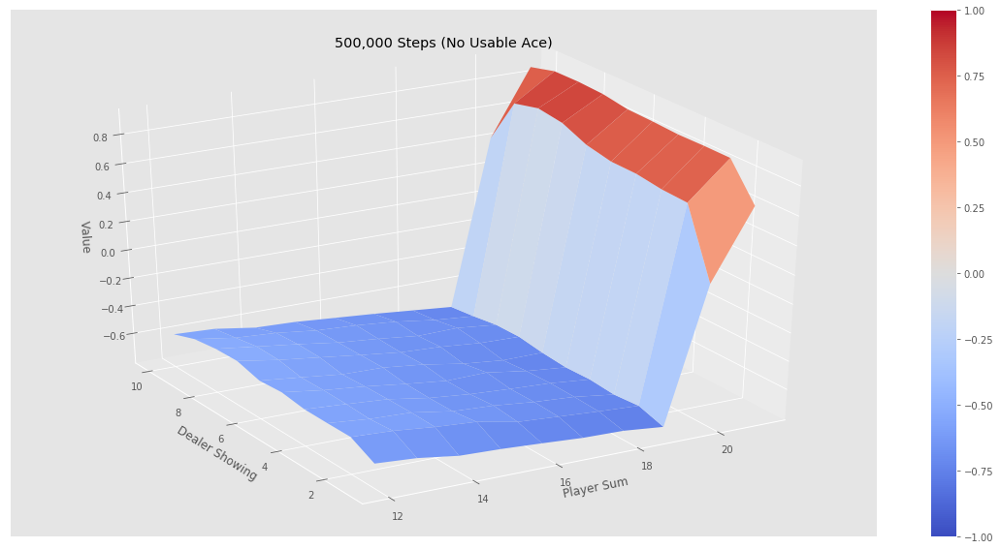

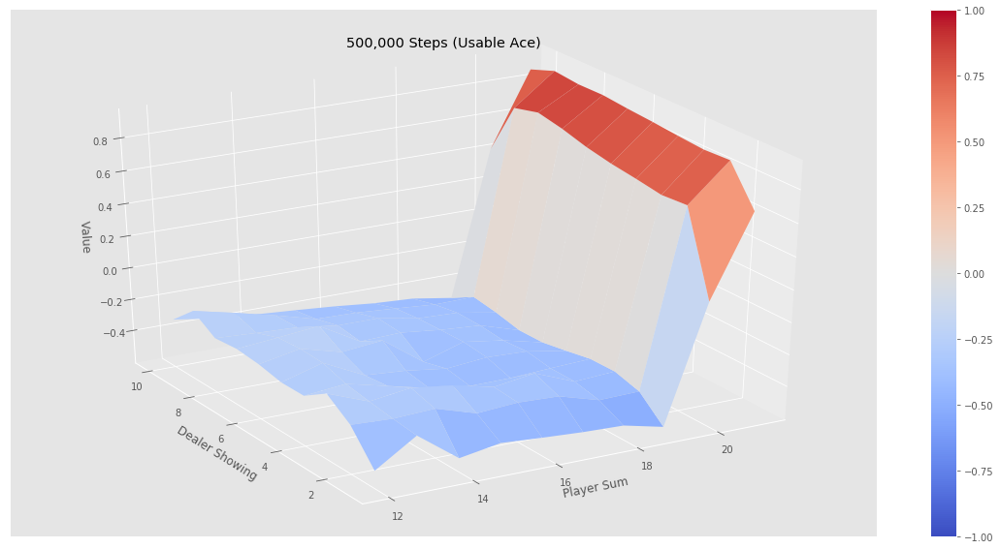

In [95]:
V_10k = mc_prediction(sample_policy, env, num_episodes=10000)
plotting.plot_value_function(V_10k, title="10,000 Steps")

V_500k = mc_prediction(sample_policy, env, num_episodes=500000)
plotting.plot_value_function(V_500k, title="500,000 Steps")